<a href="https://colab.research.google.com/github/DenisPushkin/Diploma/blob/master/AAE/AAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Adversarial AutoEncoder (AAE)**

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import time
from random import randint
import skimage.transform
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Dense, Flatten, Reshape, BatchNormalization, Activation, LeakyReLU, Embedding, Concatenate
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import math
import ast
print(tf.__version__)

2.2.0


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
InceptionV3_model = tf.keras.applications.InceptionV3()

# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = skimage.transform.resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return np.asarray(images_list)
 
# assumes images have any shape and pixels in [0,255]
def calculate_inception_score(images, n_split=1, eps=1E-16):
	# enumerate splits of images/predictions
	scores = list()
	n_part = np.int(np.floor(images.shape[0] / n_split))
	for i in range(n_split):
		# retrieve images
		ix_start, ix_end = i * n_part, (i+1) * n_part
		subset = images[ix_start:ix_end]
		# convert from uint8 to float32
		subset = subset / 1.0
		# scale images to the required size
		subset = scale_images(subset, (299,299,3))
		# pre-process images, scale to [-1,1]
    #subset = tf.keras.applications.inception_v3.preprocess_input(subset)
		# predict p(y|x)
		p_yx = InceptionV3_model.predict(subset)
		# calculate p(y)
		p_y = np.expand_dims(p_yx.mean(axis=0), 0)
		# calculate KL divergence using log probabilities
		kl_d = p_yx * (np.log(p_yx + eps) - np.log(p_y + eps))
		# sum over classes
		sum_kl_d = kl_d.sum(axis=1)
		# average over images
		avg_kl_d = np.mean(sum_kl_d)
		# undo the log
		is_score = np.exp(avg_kl_d)
		# store
		scores.append(is_score)
	# average across images
	is_avg = np.mean(scores)
	return is_avg

96116736/96112376 [==============================] - 3s 0us/step


In [ ]:
class OptimisticAdam:

    def __init__(self, learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name='optimistic_adam'):

        self.learning_rate = tf.constant(learning_rate, dtype=tf.float32)
        self.beta_1 = tf.constant(beta_1, dtype=tf.float32)
        self.beta_2 = tf.constant(beta_2, dtype=tf.float32)
        self.epsilon = tf.constant(epsilon, dtype=tf.float32)
        self.m = {}
        self.v = {}
        self.lr_prev = {}
        self.t = {}
    
    def apply_gradients(self, grads_and_vars):
        for grad, var in grads_and_vars:
            if var.name not in self.t.keys():
                self.t[var.name] = 1
            else:
                self.t[var.name] += 1
            if var.name not in self.m.keys():
                self.m[var.name] = tf.zeros(shape=var.shape, dtype=tf.float32)
            self.m[var.name] = self.beta_1*self.m[var.name] + (1-self.beta_1)*grad
            if var.name not in self.v.keys():
                self.v[var.name] = tf.zeros(shape=var.shape, dtype=tf.float32)
            self.v[var.name] = self.beta_2*self.v[var.name] + (1-self.beta_2)*tf.math.multiply(grad,grad)
            m_head = self.m[var.name] / (1 - math.pow(self.beta_1, self.t[var.name]))
            v_head = self.v[var.name] / (1 - math.pow(self.beta_2, self.t[var.name]))
            lr_t = m_head / tf.sqrt(v_head + self.epsilon)
            if var.name not in self.lr_prev.keys():
                self.lr_prev[var.name] = lr_t

            var.assign_sub(2*self.learning_rate*lr_t)
            var.assign_add(self.learning_rate*self.lr_prev[var.name])

            self.lr_prev[var.name] = lr_t

class ExtraAdam(tf.keras.optimizers.Adam):
    """
    ExtraAdam optimizer is actually Adam optimizer, but depending of optimizer type
    disc_backpropagation and gen_backpropagation functions of the model behave differently.
    They contain the following if-claus:
    
    if type(optimizer) == ExtraAdam:
        ...

    """
    def __init__(self, learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name='extra_adam'):
        super(ExtraAdam, self).__init__(learning_rate, beta_1, beta_2, epsilon)


In [ ]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train = x_train[:,:,:,np.newaxis]
x_train = x_train/127.5 - 1 #to [-1, 1] range

x_test = x_test[:,:,:,np.newaxis]
x_test = x_test/127.5 - 1 #to [-1, 1] range

y_train = tf.keras.utils.to_categorical(y_train)

y_test = tf.keras.utils.to_categorical(y_test)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)
print(type(x_train))
print(type(x_test))
print(min(x_train.ravel()))
print(max(x_train.ravel()))

11493376/11490434 [==============================] - 0s 0us/step
(60000, 28, 28, 1)
(60000, 10)
(10000, 28, 28, 1)
(10000, 10)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
-1.0
1.0


In [ ]:
class AAE(Model):
    
    def __init__(self, optimizer, x_train, batch_size=64, use_averaging=False,
                 path='/content/drive/My Drive/Diploma/Save models/AAE Adam/'):
        super(AAE, self).__init__()
        self.latent_dimension = 10
        self.encoder = self.get_encoder(self.latent_dimension)
        self.decoder = self.get_decoder(self.latent_dimension)
        self.discriminator = self.get_discriminator(self.latent_dimension)
        self.use_averaging = use_averaging
        self.decoder_avr = self.get_decoder(self.latent_dimension) #saves average of variables
        self.batch_size = batch_size
        self.dataset_generator = self.get_train_dataset(x_train)
        #self.optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1 = 0.5)
        self.optimizer = optimizer
        self.losses_per_epoch = {'encoder': [], 'decoder': [], 'discriminator': []}
        self.first_grads_mean_per_epoch = {'encoder': [], 'decoder': [], 'discriminator': []}
        self.last_grads_mean_per_epoch = {'encoder': [], 'decoder': [], 'discriminator': []}
        self.autoencoder_auxilary = 1.
        self.IS_per_epoch = [] #inception scores
        self.epoch = 0
        self.path = path
        self.train_steps_for_average = 0
        self.IS_for_avr_per_epoch = []

    def get_encoder(self, latent_dim=128):
        encoder = tf.keras.Sequential([
                                      tf.keras.layers.Input(shape = (28,28,1)),
                                      tf.keras.layers.Conv2D(64,(3,3), strides=(2,2), padding='same', use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.Activation('tanh'),
                                      tf.keras.layers.Conv2D(128,(3,3), strides=(2,2), padding='same',use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.Activation('tanh'),
                                      tf.keras.layers.Conv2D(256,(3,3), strides=(2,2), padding='same',use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.Activation('tanh'),
                                      tf.keras.layers.Flatten(),
                                      tf.keras.layers.Dense(latent_dim,'tanh')
        ])
        return encoder
    
    def get_decoder(self, latent_dim=128):
        inputs = tf.keras.layers.Input(shape = (latent_dim,))
        h = tf.keras.layers.Dense(4096, kernel_regularizer=tf.keras.regularizers.l2(0.001), activation='tanh')(inputs)
        h = tf.keras.layers.Reshape(target_shape=(4,4,256))(h)
        h = tf.keras.layers.Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001))(h)
        h = tf.keras.layers.BatchNormalization()(h)
        h = tf.keras.layers.Activation('tanh')(h)
        h = tf.keras.layers.Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001))(h)
        h = tf.keras.layers.BatchNormalization()(h)
        h = tf.keras.layers.Activation('tanh')(h)
        h = tf.keras.layers.Conv2DTranspose(1, (3,3), strides=(2,2), padding='same', activation='tanh')(h)
        outputs = h[:,2:-2,2:-2,:]
        decoder = tf.keras.Model(inputs=inputs, outputs=outputs)
        return decoder

    def get_discriminator(self, latent_dim=128):
        discriminator = tf.keras.Sequential([
                                            tf.keras.layers.Input(shape=(latent_dim,)),
                                            tf.keras.layers.Dense(64, activation='tanh', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                            tf.keras.layers.Dense(64, use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                            tf.keras.layers.BatchNormalization(),
                                            tf.keras.layers.Activation('tanh'),
                                            tf.keras.layers.Dense(64, use_bias=False, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
                                            tf.keras.layers.BatchNormalization(),
                                            tf.keras.layers.Activation('tanh'),
                                            tf.keras.layers.Dense(1)
        ])
        return discriminator

    def get_train_dataset(self, x_train):
        train_dataset = tf.data.Dataset.from_tensor_slices((x_train, ))
        train_dataset = train_dataset.batch(2*self.batch_size, drop_remainder=True)
        return train_dataset

    def sample_prior(self, size = None, loc = 0., scale = 1.):
        if size == None:
            size = self.batch_size
        return np.tanh(np.random.normal(loc = loc, scale = scale, size = (size, self.latent_dimension)))

    #@tf.function
    def disc_backpropagation(self, data, labels, loss_fn):
        if type(self.optimizer) == ExtraAdam:
            (discriminator_grads, discriminator_loss_value) = self.disc_backpropagation_for_extraadam(data, labels, loss_fn)
        else:
            with tf.GradientTape() as tape:
                predictions = self.discriminator(data)
                discriminator_loss_value = loss_fn(labels, predictions)
            discriminator_grads = tape.gradient(discriminator_loss_value, self.discriminator.trainable_variables)
            self.optimizer.apply_gradients(zip(discriminator_grads, self.discriminator.trainable_variables))
        return (discriminator_grads, discriminator_loss_value)    
    
    def disc_backpropagation_for_extraadam(self, data, labels, loss_fn):
        indexes = np.arange(2 * self.batch_size)
        np.random.shuffle(indexes)
        data_2 = tf.gather(data, indexes[self.batch_size:])
        labels_2 = tf.gather(labels, indexes[self.batch_size:])
        data = tf.gather(data, indexes[:self.batch_size])
        labels = tf.gather(labels, indexes[:self.batch_size])

        with tf.GradientTape() as tape:
            predictions = self.discriminator(data)
            discriminator_loss_value = loss_fn(labels, predictions)
        discriminator_grads = tape.gradient(discriminator_loss_value, self.discriminator.trainable_variables)
        prev_trainable_variables = self.discriminator.trainable_variables
        self.optimizer.apply_gradients(zip(discriminator_grads, self.discriminator.trainable_variables))

        with tf.GradientTape() as tape:
            predictions_2 = self.discriminator(data_2)
            discriminator_loss_value_2 = loss_fn(labels_2, predictions_2)
        discriminator_grads_2 = tape.gradient(discriminator_loss_value_2, self.discriminator.trainable_variables)
        for (v,x) in zip(self.discriminator.trainable_variables, prev_trainable_variables):
            v.assign(x)
        self.optimizer.apply_gradients(zip(discriminator_grads_2, self.discriminator.trainable_variables))
        return (discriminator_grads_2, discriminator_loss_value_2)

    #@tf.function
    def encoder_loss(self, x_data, loss_fn):
        with tf.GradientTape() as tape:
            encoded_data = self.encoder(x_data)
            predictions = self.discriminator(encoded_data)
            encoder_loss_value = loss_fn(predictions)
        encoder_grads = tape.gradient(encoder_loss_value, self.encoder.trainable_variables)
        return (encoder_grads, encoder_loss_value)
    
    #@tf.function
    def autoencoder_loss(self, x_data, loss_fn):
        with tf.GradientTape() as tape:
            encoded_data = self.encoder(x_data)
            decoded_data = self.decoder(encoded_data)
            autoencoder_loss_value = loss_fn(x_data, decoded_data)
        encoder_grads, decoder_grads = tape.gradient(autoencoder_loss_value, [self.encoder.trainable_variables ,self.decoder.trainable_variables])
        return (encoder_grads, decoder_grads, autoencoder_loss_value)
    
    def train(self, epochs):

        discriminator_loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        def encoder_loss_fn(predictions):
            return tf.reduce_mean(tf.nn.relu(predictions) - predictions + tf.math.log(1+tf.exp(-tf.abs(predictions))))
        def autoencoder_loss_fn(x_data, decoded_data):
            return tf.reduce_mean(tf.keras.losses.binary_crossentropy(0.5* (tf.reshape(x_data, [x_data.shape[0], -1]) + 1),
                                                                  0.5 * (tf.reshape(decoded_data, [decoded_data.shape[0], -1]) + 1) ))

        for epoch in range(epochs):
            
            losses_per_batch = {'encoder': tf.keras.metrics.Mean(), 'decoder': tf.keras.metrics.Mean(), 'discriminator': tf.keras.metrics.Mean()}
            first_grads_mean_per_batch = {'encoder': tf.keras.metrics.Mean(), 'decoder': tf.keras.metrics.Mean(), 'discriminator': tf.keras.metrics.Mean()}
            last_grads_mean_per_batch = {'encoder': tf.keras.metrics.Mean(), 'decoder': tf.keras.metrics.Mean(), 'discriminator': tf.keras.metrics.Mean()}

            for x_data in self.dataset_generator:
                
                indexes = np.arange(2*self.batch_size)
                x_data = tf.cast(x_data[0], tf.float32)
                x_data_2 = tf.gather(x_data, indexes[self.batch_size:])
                x_data = tf.gather(x_data, indexes[:self.batch_size])

                encoded_data = self.encoder(x_data)
                prior_data = self.sample_prior()
                data = tf.concat([prior_data, encoded_data], axis=0)
                labels = tf.concat([0.9*tf.ones(shape = self.batch_size), tf.zeros(shape=self.batch_size)], axis = 0)
                (discriminator_grads, discriminator_loss_value) = self.disc_backpropagation(data, labels, discriminator_loss_fn)

                if type(self.optimizer) == ExtraAdam:
                    indexes = np.arange(self.batch_size)
                    x_data_3 = tf.gather(x_data_2, indexes[self.batch_size//2:])
                    x_data_2 = tf.gather(x_data_2, indexes[:self.batch_size//2])

                    (encoder_grads_1, encoder_loss_value) = self.encoder_loss(x_data_2, encoder_loss_fn)
                    (encoder_grads_2, decoder_grads, autoencoder_loss_value) = self.autoencoder_loss(x_data_2, autoencoder_loss_fn)
                    encoder_grads_2 = [self.autoencoder_auxilary * x for x in encoder_grads_2]
                    decoder_grads = [self.autoencoder_auxilary * x for x in decoder_grads]
                    enc_prev_trainable_variables = self.encoder.trainable_variables
                    dec_prev_trainable_variables = self.decoder.trainable_variables
                    self.optimizer.apply_gradients(zip([x+y for x,y in zip(encoder_grads_1, encoder_grads_2)], self.encoder.trainable_variables))
                    self.optimizer.apply_gradients(zip(decoder_grads, self.decoder.trainable_variables))

                    (encoder_grads_1, encoder_loss_value) = self.encoder_loss(x_data_3, encoder_loss_fn)
                    (encoder_grads_2, decoder_grads, autoencoder_loss_value) = self.autoencoder_loss(x_data_3, autoencoder_loss_fn)
                    encoder_grads_2 = [self.autoencoder_auxilary * x for x in encoder_grads_2]
                    decoder_grads = [self.autoencoder_auxilary * x for x in decoder_grads]
                    for (v,x) in zip(self.encoder.trainable_variables, enc_prev_trainable_variables):
                        v.assign(x)
                    for (v,x) in zip(self.decoder.trainable_variables, dec_prev_trainable_variables):
                        v.assign(x)
                    self.optimizer.apply_gradients(zip([x+y for x,y in zip(encoder_grads_1, encoder_grads_2)], self.encoder.trainable_variables))
                    self.optimizer.apply_gradients(zip(decoder_grads, self.decoder.trainable_variables))
                else:
                    (encoder_grads_1, encoder_loss_value) = self.encoder_loss(x_data_2, encoder_loss_fn)
                    (encoder_grads_2, decoder_grads, autoencoder_loss_value) = self.autoencoder_loss(x_data_2, autoencoder_loss_fn)
                    encoder_grads_2 = [self.autoencoder_auxilary * x for x in encoder_grads_2]
                    decoder_grads = [self.autoencoder_auxilary * x for x in decoder_grads]
                    self.optimizer.apply_gradients(zip([x+y for x,y in zip(encoder_grads_1, encoder_grads_2)], self.encoder.trainable_variables))
                    self.optimizer.apply_gradients(zip(decoder_grads, self.decoder.trainable_variables))
                
                if self.use_averaging:
                    self.update_avr_variables()
                
                losses_per_batch['encoder'](encoder_loss_value)
                losses_per_batch['decoder'](autoencoder_loss_value)
                losses_per_batch['discriminator'](discriminator_loss_value)

                first_grads_mean_per_batch['encoder'](tf.math.reduce_mean(tf.abs(encoder_grads_1[0]+encoder_grads_2[0])))
                last_grads_mean_per_batch['encoder'](tf.math.reduce_mean(tf.abs(encoder_grads_1[-2]+encoder_grads_2[-2])))
                first_grads_mean_per_batch['decoder'](tf.math.reduce_mean(tf.abs(decoder_grads[0])))
                last_grads_mean_per_batch['decoder'](tf.math.reduce_mean(tf.abs(decoder_grads[-2])))
                first_grads_mean_per_batch['discriminator'](tf.math.reduce_mean(tf.abs(discriminator_grads[0])))
                last_grads_mean_per_batch['discriminator'](tf.math.reduce_mean(tf.abs(discriminator_grads[-2])))
            
            self.losses_per_epoch['encoder'].append(losses_per_batch['encoder'].result().numpy())
            self.losses_per_epoch['decoder'].append(losses_per_batch['decoder'].result().numpy())
            self.losses_per_epoch['discriminator'].append(losses_per_batch['discriminator'].result().numpy())

            self.first_grads_mean_per_epoch['encoder'].append(first_grads_mean_per_batch['encoder'].result().numpy())
            self.last_grads_mean_per_epoch['encoder'].append(last_grads_mean_per_batch['encoder'].result().numpy())
            self.first_grads_mean_per_epoch['decoder'].append(first_grads_mean_per_batch['decoder'].result().numpy())
            self.last_grads_mean_per_epoch['decoder'].append(last_grads_mean_per_batch['decoder'].result().numpy())
            self.first_grads_mean_per_epoch['discriminator'].append(first_grads_mean_per_batch['discriminator'].result().numpy())
            self.last_grads_mean_per_epoch['discriminator'].append(last_grads_mean_per_batch['discriminator'].result().numpy())

            self.epoch += 1
            self.update_IS()
            self.print_state()
            if self.epoch % 1 == 0:
                print('examples of generated images after', self.epoch, 'epochs')
                self.draw_generated_images(rows=4, cols=6)
                if self.use_averaging:
                    print('examples of generated images using average variables after', self.epoch, 'epochs')
                    self.draw_generated_images(rows=4, cols=6, is_from_gen_avr=True)
            if self.epoch % 10 == 0:
                self.save_state_to_file()
    
    def update_avr_variables(self):
        self.train_steps_for_average += 1
        for (v,x) in zip(self.decoder_avr.trainable_variables, self.decoder.trainable_variables):
            v.assign((1.0/self.train_steps_for_average) * x + (1 - 1.0/self.train_steps_for_average) * v)

    def update_IS(self):
        self.IS_per_epoch.append(calculate_inception_score(self.generate(1000)))
        if self.use_averaging:
            self.IS_for_avr_per_epoch.append(calculate_inception_score(self.generate(1000, is_from_gen_avr=True)))

    def generate(self, num=1, is_from_gen_avr=False):
        prior_data = self.sample_prior(num)
        if is_from_gen_avr:
            images_logits = self.decoder_avr(prior_data)
        else:
            images_logits = self.decoder(prior_data)
        images = tf.nn.sigmoid(images_logits)
        #images = tf.reshape(images, shape = [-1, 32, 32])
        return images
    
    def draw_generated_images(self, rows, cols, is_from_gen_avr=False):
        images = self.generate(rows*cols, is_from_gen_avr)
        plt.figure(figsize = (3*cols, 3*rows))
        for i in range(rows*cols):
            plt.subplot(rows, cols, i+1)
            plt.imshow(images[i,:,:,0], cmap='gray')
        plt.show()

    def save_state_to_file(self):
        enc_path = self.path + 'enc_{:03d}_epochs/enc_{:03d}_epochs'.format(self.epoch,self.epoch)                 
        self.encoder.save_weights(enc_path)
        dec_path = self.path + 'dec_{:03d}_epochs/dec_{:03d}_epochs'.format(self.epoch,self.epoch)                 
        self.decoder.save_weights(dec_path)
        disc_path = self.path + 'disc_{:03d}_epochs/disc_{:03d}_epochs'.format(self.epoch,self.epoch)
        self.discriminator.save_weights(disc_path)
        if self.use_averaging:
            dec_avr_path = self.path + 'dec_avr_{:03d}_epochs/dec_avr_{:03d}_epochs'.format(self.epoch,self.epoch)
            self.decoder_avr.save_weights(dec_avr_path)
        train_info_path = self.path + 'train_info_{:03d}.txt'.format(self.epoch)
        f=open(train_info_path,'w')
        f.write(str(self.losses_per_epoch['encoder']) + '\n')
        f.write(str(self.losses_per_epoch['decoder']) + '\n')
        f.write(str(self.losses_per_epoch['discriminator']) + '\n')
        f.write(str(self.first_grads_mean_per_epoch['encoder']) + '\n')
        f.write(str(self.first_grads_mean_per_epoch['decoder']) + '\n')
        f.write(str(self.first_grads_mean_per_epoch['discriminator']) + '\n')
        f.write(str(self.last_grads_mean_per_epoch['encoder']) + '\n')
        f.write(str(self.last_grads_mean_per_epoch['decoder']) + '\n')
        f.write(str(self.last_grads_mean_per_epoch['discriminator']) + '\n')
        f.write(str(self.IS_per_epoch) + '\n')
        f.write(str(self.IS_for_avr_per_epoch) + '\n')
        f.close()
    
    def print_state(self):
        if self.use_averaging:
            print("Epoch: {:03d}: Enc Loss: {:.3f}, Dec Loss: {:.3f}, Disc Loss:{:.3f}, IS: {:.3f}, IS_avr: {:.3f}".format(self.epoch,
                                                                self.losses_per_epoch['encoder'][-1],
                                                                self.losses_per_epoch['decoder'][-1],
                                                                self.losses_per_epoch['discriminator'][-1],
                                                                self.IS_per_epoch[-1],
                                                                self.IS_for_avr_per_epoch[-1]))
        else:
            print("Epoch: {:03d}: Enc Loss: {:.3f}, Dec Loss: {:.3f}, Disc Loss:{:.3f}, IS: {:.3f}".format(self.epoch,
                                                                self.losses_per_epoch['encoder'][-1],
                                                                self.losses_per_epoch['decoder'][-1],
                                                                self.losses_per_epoch['discriminator'][-1],
                                                                self.IS_per_epoch[-1]))
    
    def draw_IS_per_epoch_graphic(self, is_from_gen_avr=False):
        fig, axes = plt.subplots(1, 1, sharex=True, figsize=(6, 5))  
        axes.set_xlabel("Epochs", fontsize=14)
        axes.set_ylabel("IS", fontsize=14)
        if is_from_gen_avr:
            axes.set_title('IS gen_avr vs epochs')
        else:
            axes.set_title('IS vs epochs')
        if is_from_gen_avr:
            axes.plot(self.IS_for_avr_per_epoch)
        else:
            axes.plot(self.IS_per_epoch)
        plt.show()
    
    def draw_losses_per_epoch_graphic(self):
        fig, axes = plt.subplots(1, 3, sharex=True, figsize=(12, 5))
        
        axes[0].set_xlabel("Epochs", fontsize=14)
        axes[0].set_ylabel("Loss", fontsize=14)
        axes[0].set_title('Encoder Loss vs epochs')
        axes[0].plot(self.losses_per_epoch['encoder'])

        axes[1].set_xlabel("Epochs", fontsize=14)
        axes[1].set_ylabel("Loss", fontsize=14)
        axes[1].set_title('Decoder Loss vs epochs')
        axes[1].plot(self.losses_per_epoch['decoder'])

        axes[2].set_title('Discriminator Loss vs Epochs')
        axes[2].set_ylabel("Loss", fontsize=14)
        axes[2].set_xlabel("Epochs", fontsize=14)
        axes[2].plot(self.losses_per_epoch['discriminator'])
        plt.show()
    
    def draw_grads_per_epoch_graphic(self):
        fig, axes = plt.subplots(3, 2, sharex=True, figsize=(12, 12))

        axes[0,0].set_xlabel("Epochs", fontsize=14)
        axes[0,0].set_ylabel("Grads", fontsize=14)
        axes[0,0].set_title('Encoder first grads mean vs epochs')
        axes[0,0].plot(self.first_grads_mean_per_epoch['encoder'])

        axes[0,1].set_xlabel("Epochs", fontsize=14)
        axes[0,1].set_ylabel("Grads", fontsize=14)
        axes[0,1].set_title('Encoder last grads mean vs epochs')
        axes[0,1].plot(self.last_grads_mean_per_epoch['encoder'])

        axes[1,0].set_xlabel("Epochs", fontsize=14)
        axes[1,0].set_ylabel("Grads", fontsize=14)
        axes[1,0].set_title('Decoder first grads mean vs epochs')
        axes[1,0].plot(self.first_grads_mean_per_epoch['decoder'])

        axes[1,1].set_xlabel("Epochs", fontsize=14)
        axes[1,1].set_ylabel("Grads", fontsize=14)
        axes[1,1].set_title('Decoder last grads mean vs epochs')
        axes[1,1].plot(self.last_grads_mean_per_epoch['decoder'])

        axes[2,0].set_xlabel("Epochs", fontsize=14)
        axes[2,0].set_ylabel("Grads", fontsize=14)
        axes[2,0].set_title('Discriminator first grads mean vs epochs')
        axes[2,0].plot(self.first_grads_mean_per_epoch['discriminator'])

        axes[2,1].set_xlabel("Epochs", fontsize=14)
        axes[2,1].set_ylabel("Grads", fontsize=14)
        axes[2,1].set_title('Discriminator last grads mean vs epochs')
        axes[2,1].plot(self.last_grads_mean_per_epoch['discriminator'])

        plt.show()
    
    def upload_from_file(self, epoch=1):
        path = self.path
        self.epoch = epoch
        enc_path = path + 'enc_{:03d}_epochs/enc_{:03d}_epochs'.format(epoch,epoch)
        self.encoder.load_weights(enc_path)
        dec_path = path + 'dec_{:03d}_epochs/dec_{:03d}_epochs'.format(epoch,epoch)
        self.decoder.load_weights(dec_path)
        disc_path = path + 'disc_{:03d}_epochs/disc_{:03d}_epochs'.format(epoch,epoch)
        self.discriminator.load_weights(disc_path)
        if self.use_averaging:
            dec_avr_path = path + 'dec_avr_{:03d}_epochs/dec_avr_{:03d}_epochs'.format(epoch,epoch)
            self.decoder_avr.load_weights(dec_avr_path)
        path = path + 'train_info_{:03d}.txt'.format(epoch)
        f = open(path,'r')
        train_info = f.read()
        train_info = train_info.split(sep='\n')
        train_info = [elem[12:-1] for elem in train_info]
        self.losses_per_epoch['encoder'] = ast.literal_eval(train_info[0])
        self.losses_per_epoch['decoder'] = ast.literal_eval(train_info[1])
        self.losses_per_epoch['discriminator'] = ast.literal_eval(train_info[2])
        self.first_grads_mean_per_epoch['encoder'] = ast.literal_eval(train_info[3])
        self.first_grads_mean_per_epoch['decoder'] = ast.literal_eval(train_info[4])
        self.first_grads_mean_per_epoch['discriminator'] = ast.literal_eval(train_info[5])
        self.last_grads_mean_per_epoch['encoder'] = ast.literal_eval(train_info[6])
        self.last_grads_mean_per_epoch['decoder'] = ast.literal_eval(train_info[7])
        self.last_grads_mean_per_epoch['discriminator'] = ast.literal_eval(train_info[8])
        self.IS_per_epoch = ast.literal_eval(train_info[9])
        self.IS_for_avr_per_epoch = ast.literal_eval(train_info[10])

**Adam**

Epoch: 001: Enc Loss: 0.815, Dec Loss: 0.287, Disc Loss:0.711, IS: 2.434
examples of generated images after 1 epochs


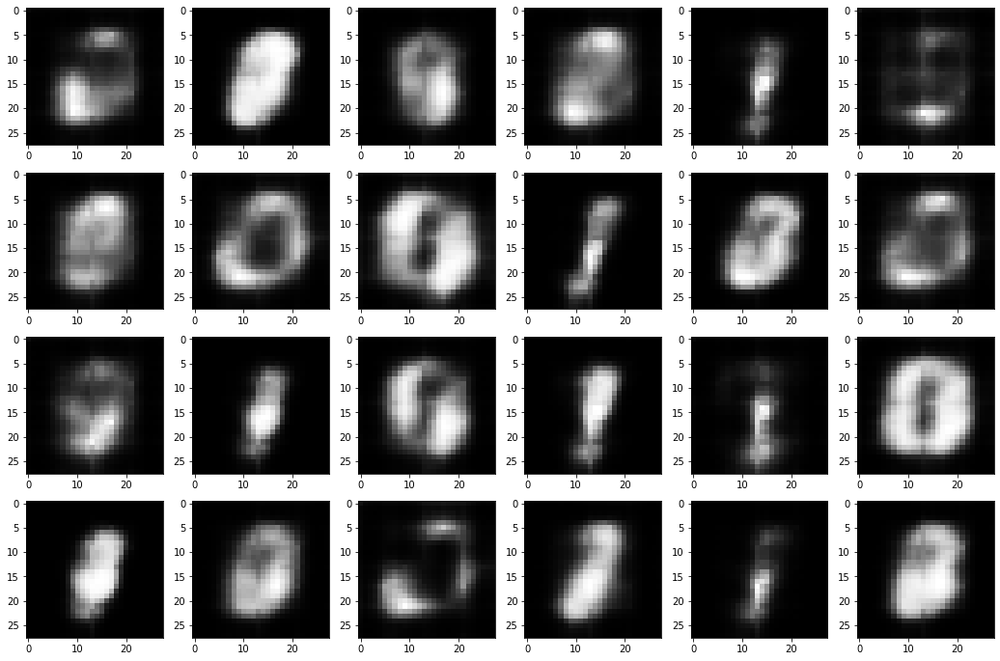

Epoch: 002: Enc Loss: 0.817, Dec Loss: 0.203, Disc Loss:0.697, IS: 2.248
examples of generated images after 2 epochs


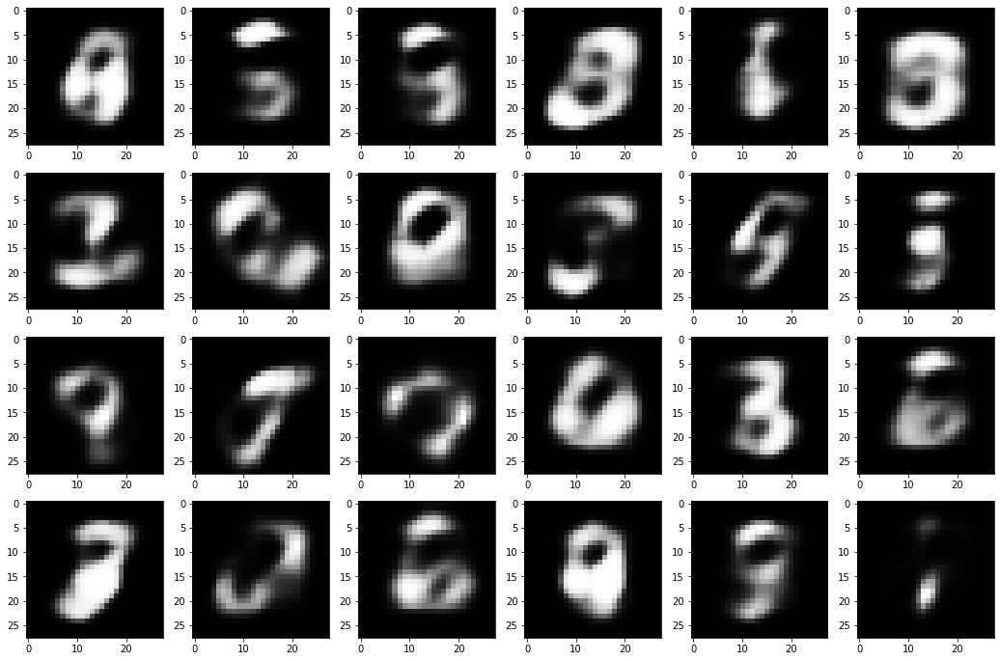

Epoch: 003: Enc Loss: 0.808, Dec Loss: 0.173, Disc Loss:0.692, IS: 2.404
examples of generated images after 3 epochs


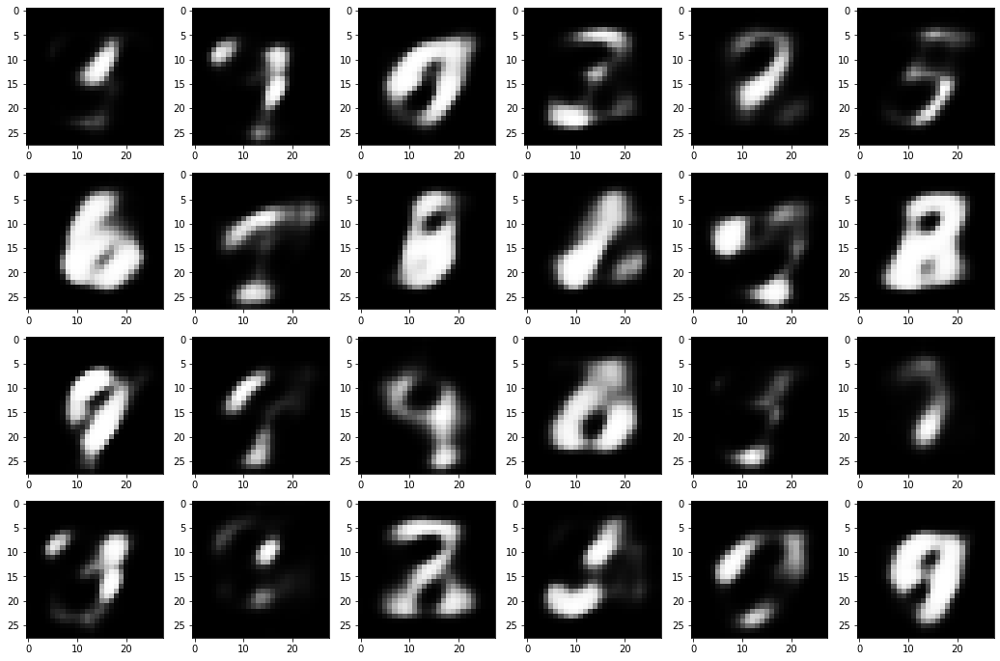

Epoch: 004: Enc Loss: 0.804, Dec Loss: 0.166, Disc Loss:0.690, IS: 2.353
examples of generated images after 4 epochs


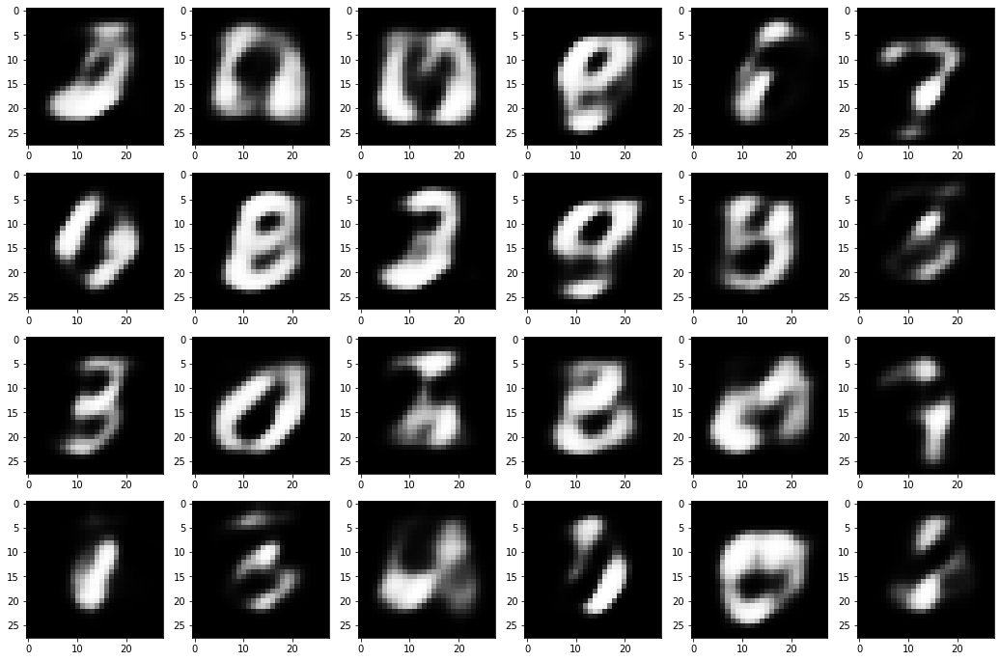

Epoch: 005: Enc Loss: 0.801, Dec Loss: 0.164, Disc Loss:0.689, IS: 2.352
examples of generated images after 5 epochs


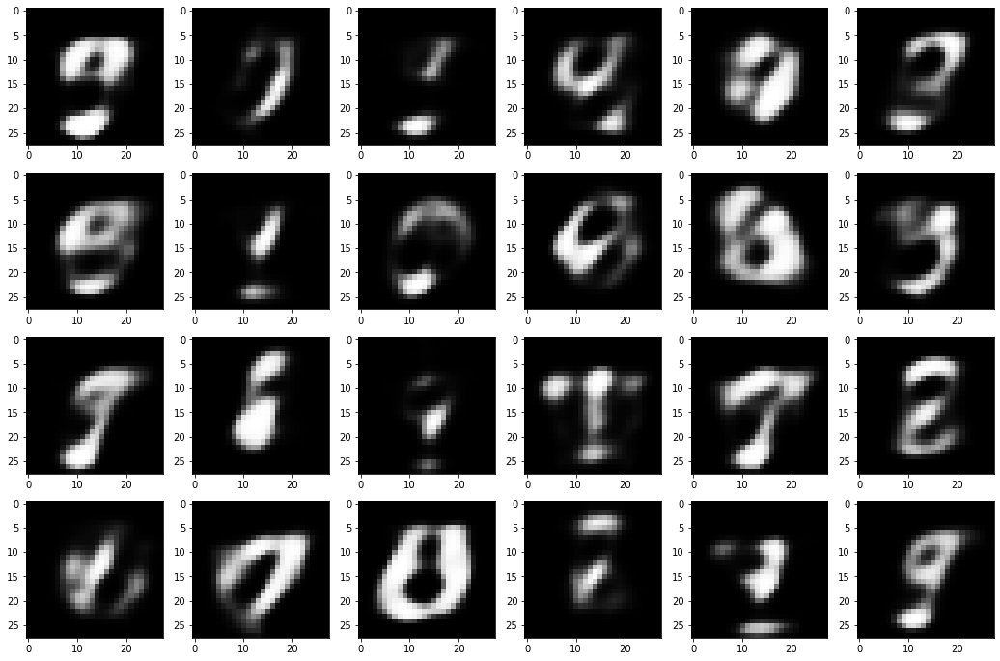

Epoch: 006: Enc Loss: 0.803, Dec Loss: 0.164, Disc Loss:0.690, IS: 2.122
examples of generated images after 6 epochs


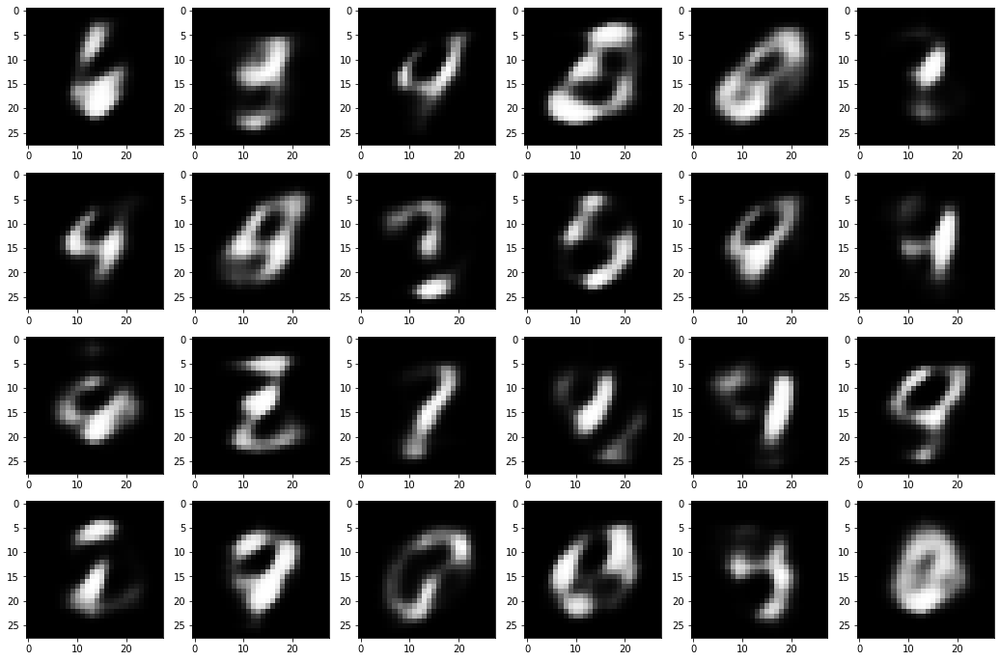

Epoch: 007: Enc Loss: 0.802, Dec Loss: 0.164, Disc Loss:0.689, IS: 2.336
examples of generated images after 7 epochs


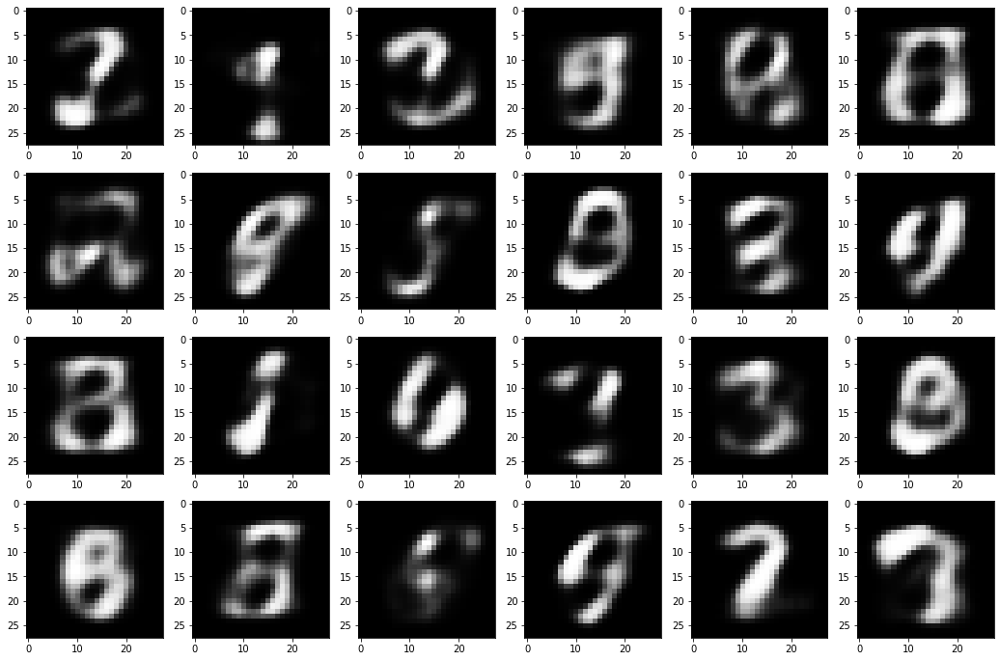

Epoch: 008: Enc Loss: 0.801, Dec Loss: 0.164, Disc Loss:0.689, IS: 2.243
examples of generated images after 8 epochs


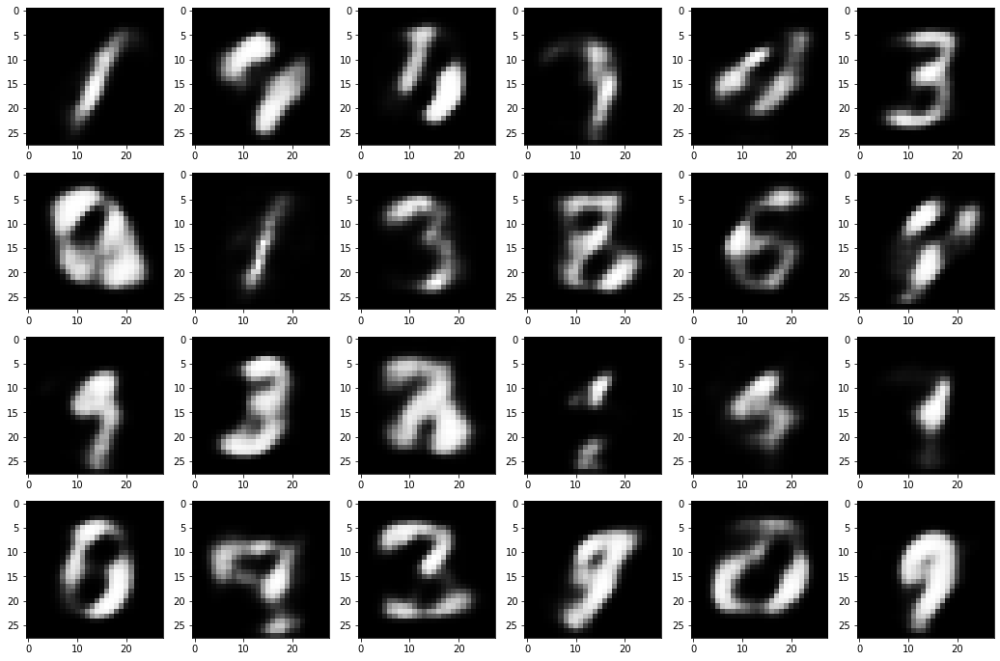

Epoch: 009: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.692, IS: 2.144
examples of generated images after 9 epochs


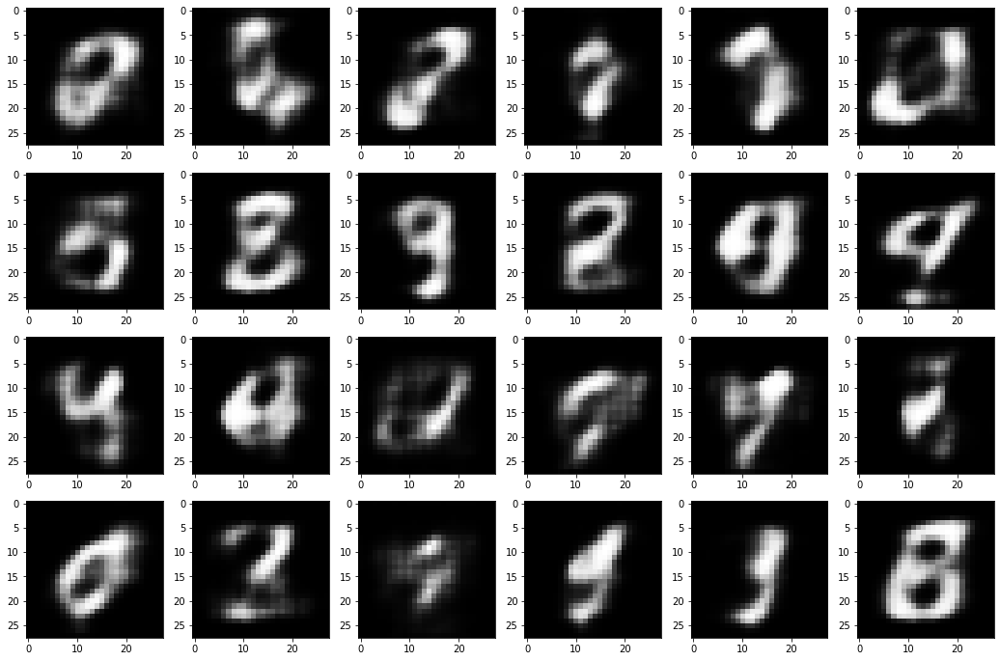

Epoch: 010: Enc Loss: 0.802, Dec Loss: 0.165, Disc Loss:0.690, IS: 2.307
examples of generated images after 10 epochs


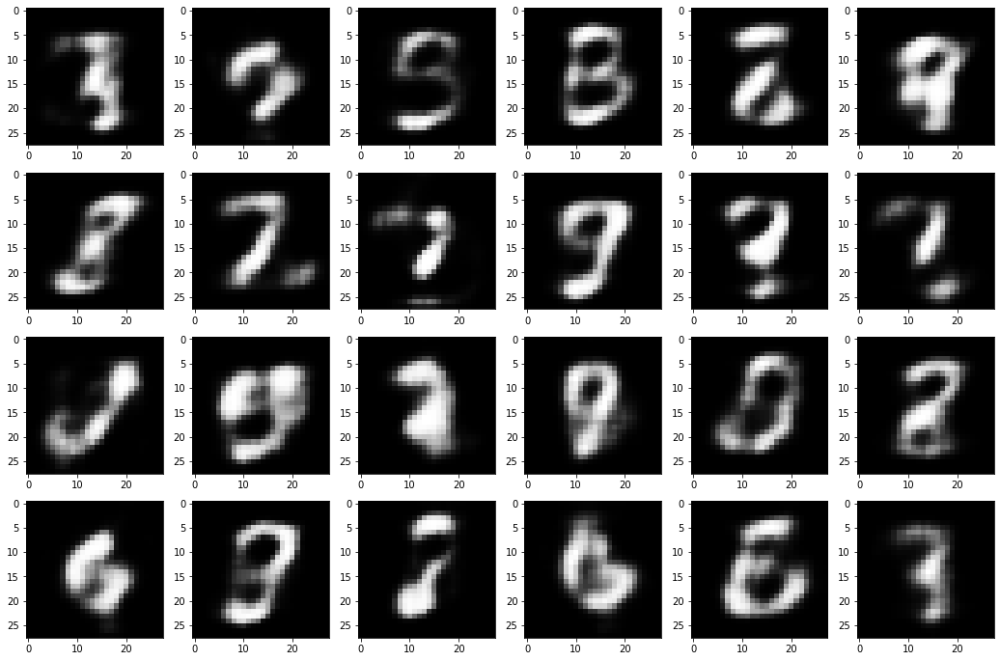

Epoch: 011: Enc Loss: 0.801, Dec Loss: 0.159, Disc Loss:0.689, IS: 2.291
examples of generated images after 11 epochs


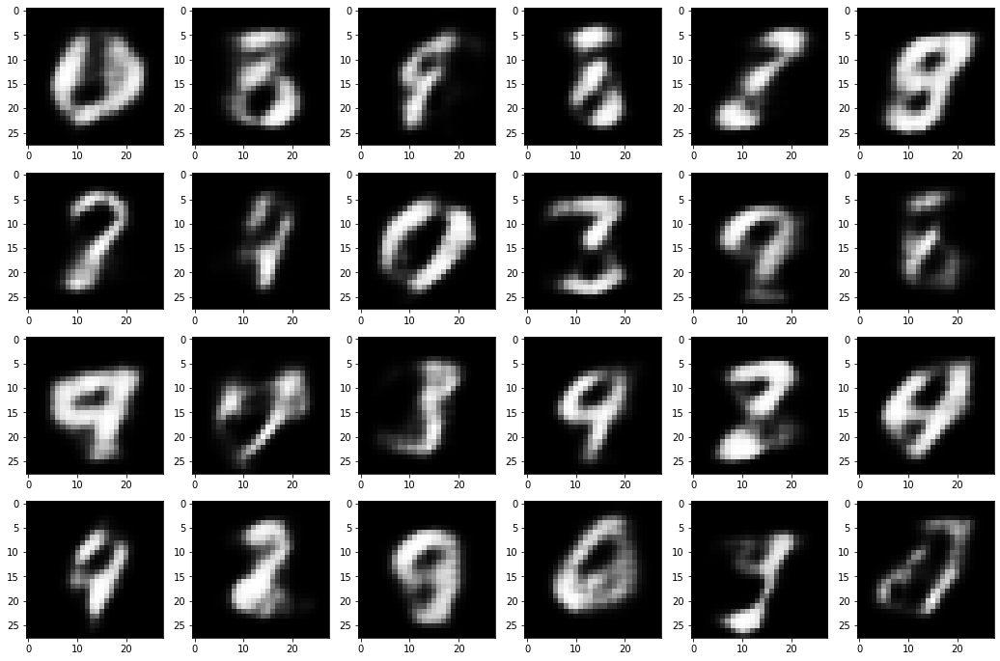

Epoch: 012: Enc Loss: 0.800, Dec Loss: 0.158, Disc Loss:0.689, IS: 2.357
examples of generated images after 12 epochs


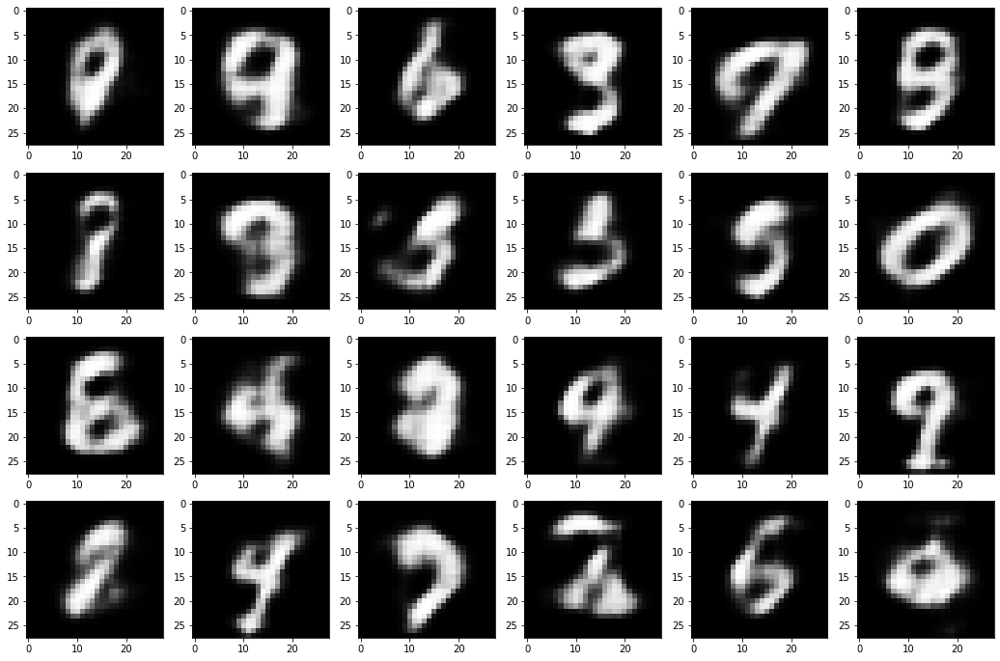

Epoch: 013: Enc Loss: 0.800, Dec Loss: 0.156, Disc Loss:0.689, IS: 2.386
examples of generated images after 13 epochs


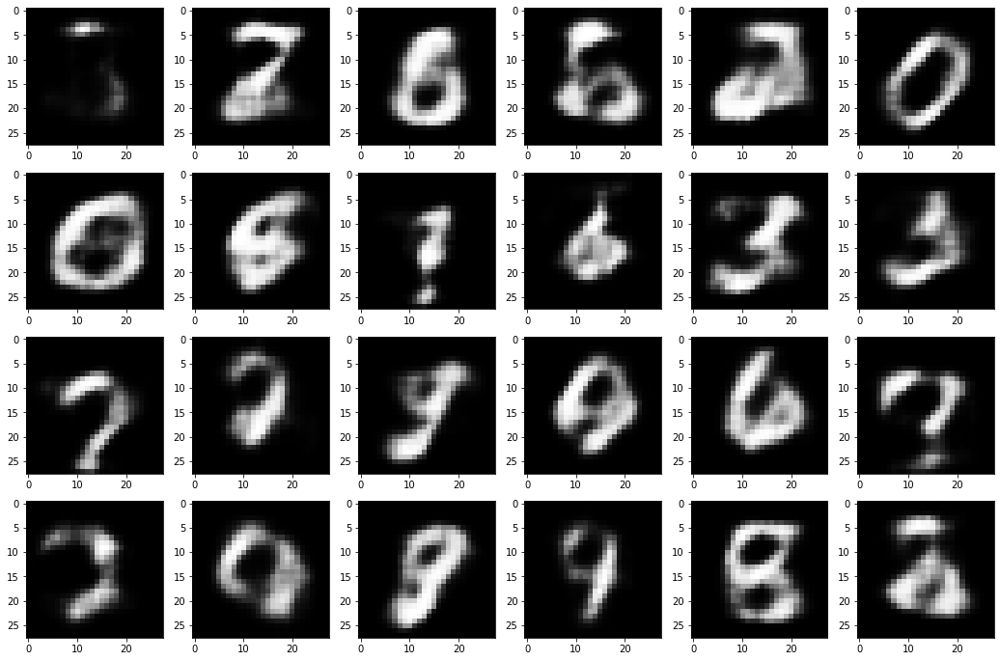

Epoch: 014: Enc Loss: 0.799, Dec Loss: 0.155, Disc Loss:0.689, IS: 2.382
examples of generated images after 14 epochs


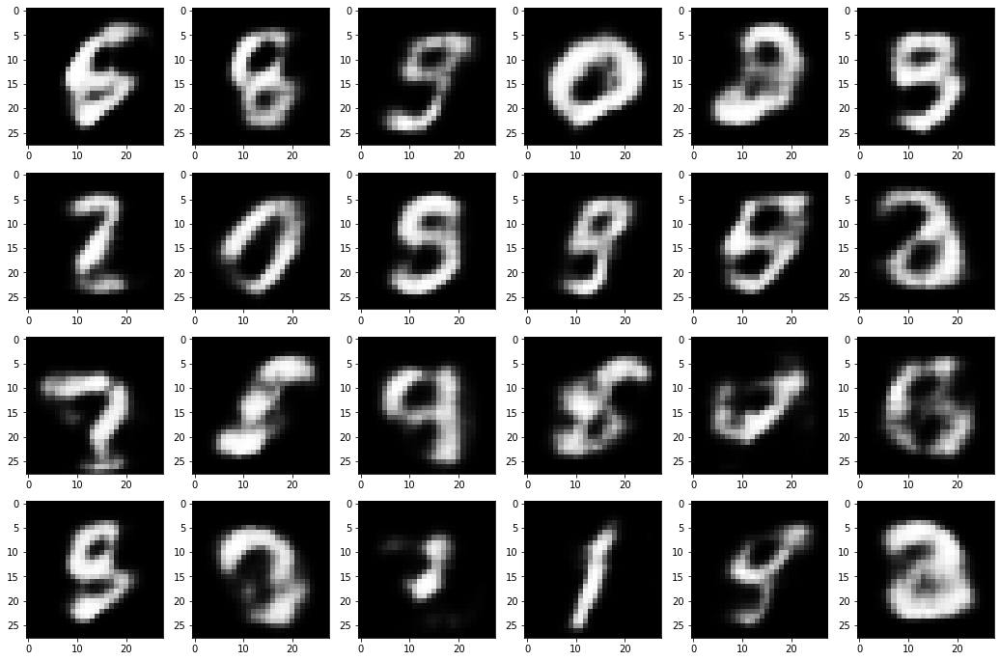

Epoch: 015: Enc Loss: 0.799, Dec Loss: 0.153, Disc Loss:0.689, IS: 2.393
examples of generated images after 15 epochs


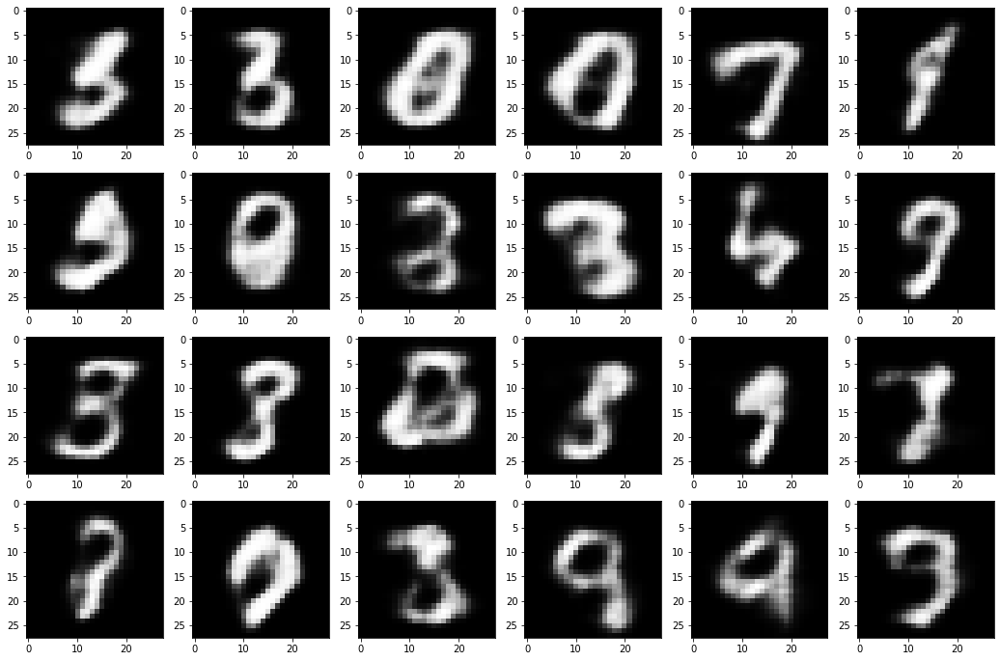

Epoch: 016: Enc Loss: 0.801, Dec Loss: 0.152, Disc Loss:0.689, IS: 2.499
examples of generated images after 16 epochs


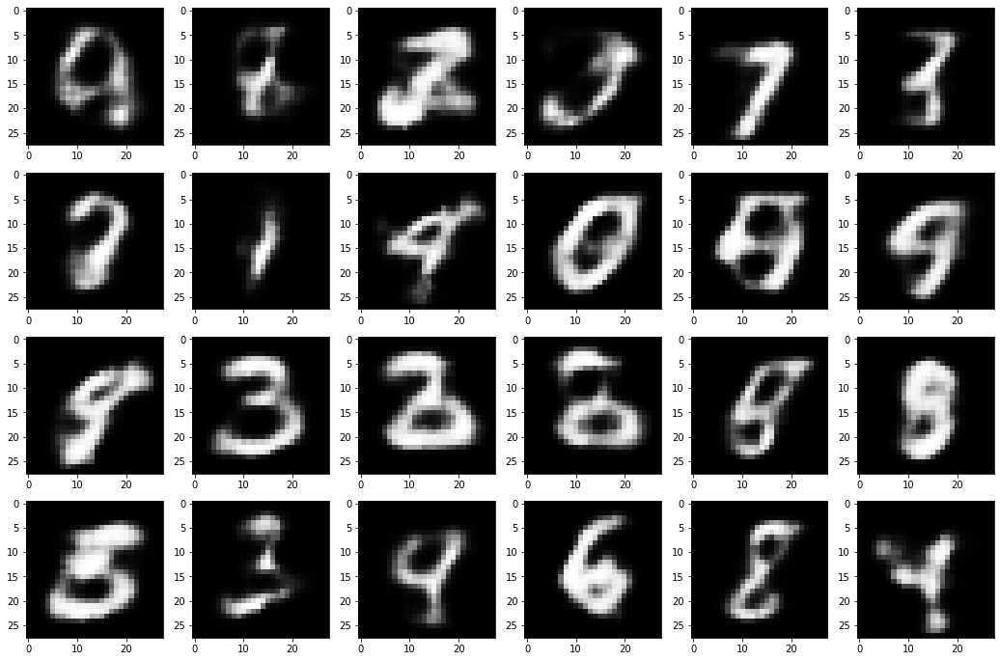

Epoch: 017: Enc Loss: 0.801, Dec Loss: 0.151, Disc Loss:0.689, IS: 2.431
examples of generated images after 17 epochs


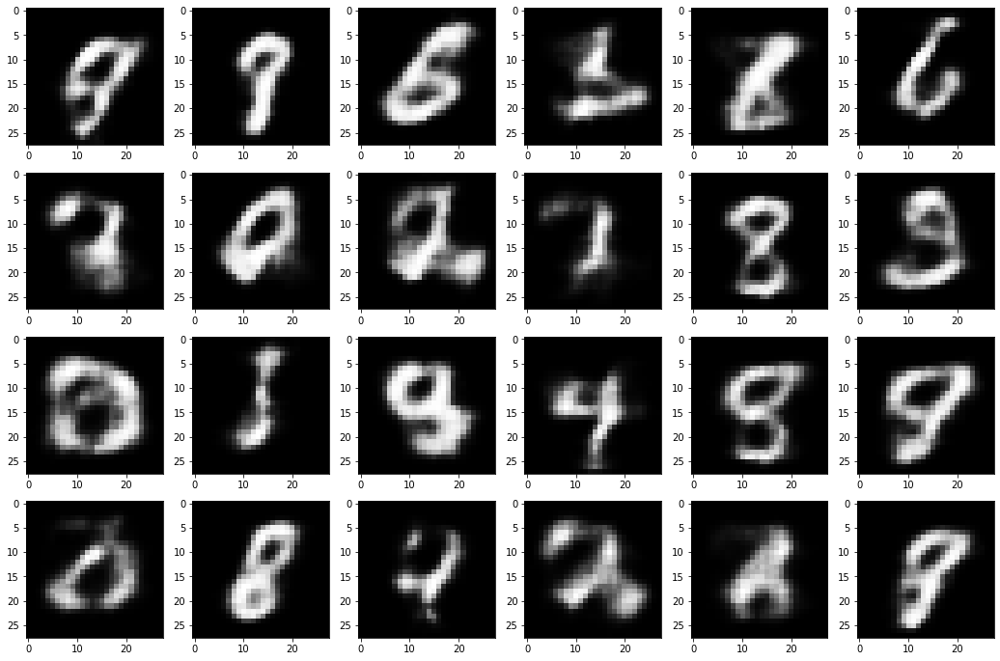

Epoch: 018: Enc Loss: 0.800, Dec Loss: 0.151, Disc Loss:0.689, IS: 2.420
examples of generated images after 18 epochs


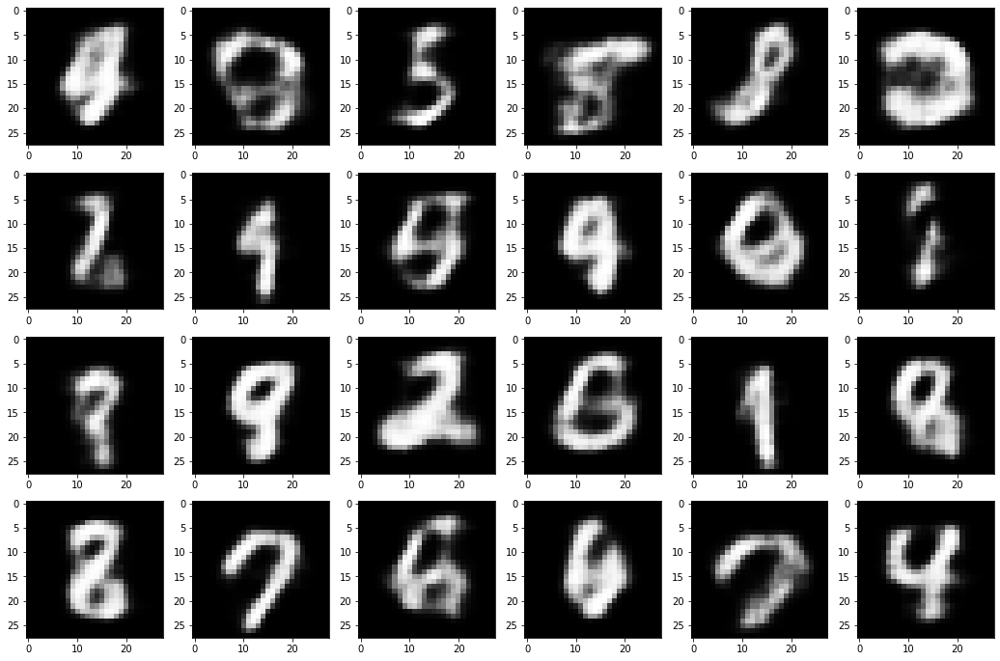

Epoch: 019: Enc Loss: 0.800, Dec Loss: 0.151, Disc Loss:0.689, IS: 2.376
examples of generated images after 19 epochs


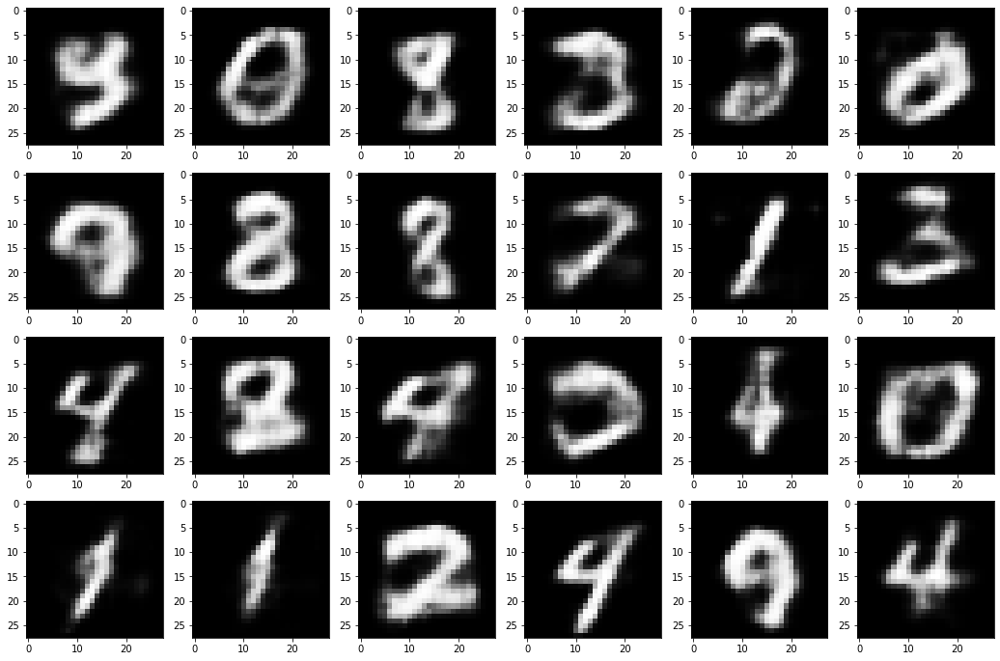

Epoch: 020: Enc Loss: 0.800, Dec Loss: 0.150, Disc Loss:0.689, IS: 2.437
examples of generated images after 20 epochs


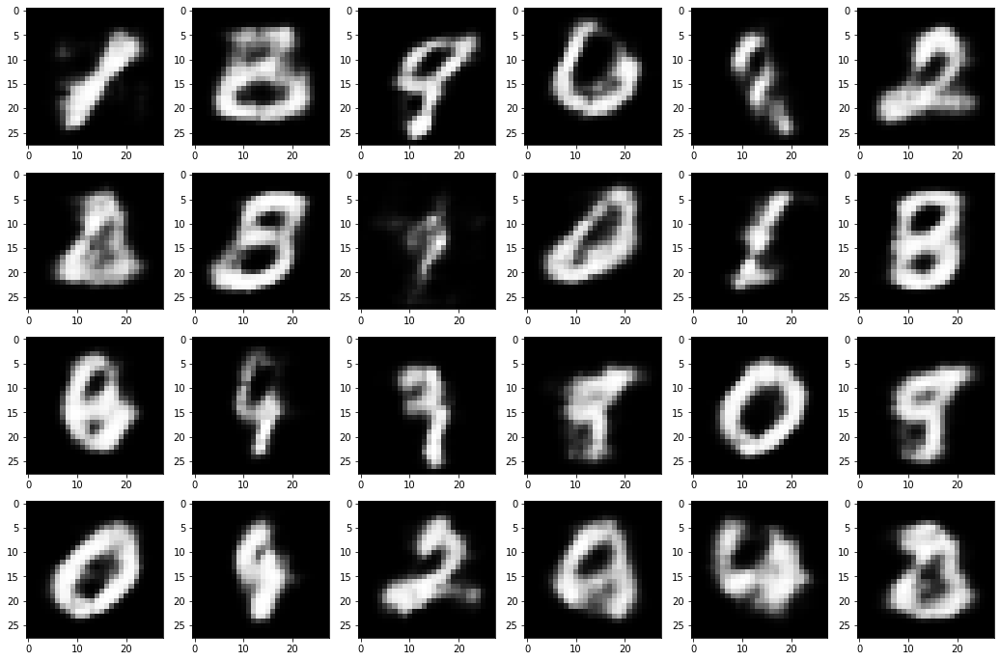

Epoch: 021: Enc Loss: 0.800, Dec Loss: 0.148, Disc Loss:0.689, IS: 2.449
examples of generated images after 21 epochs


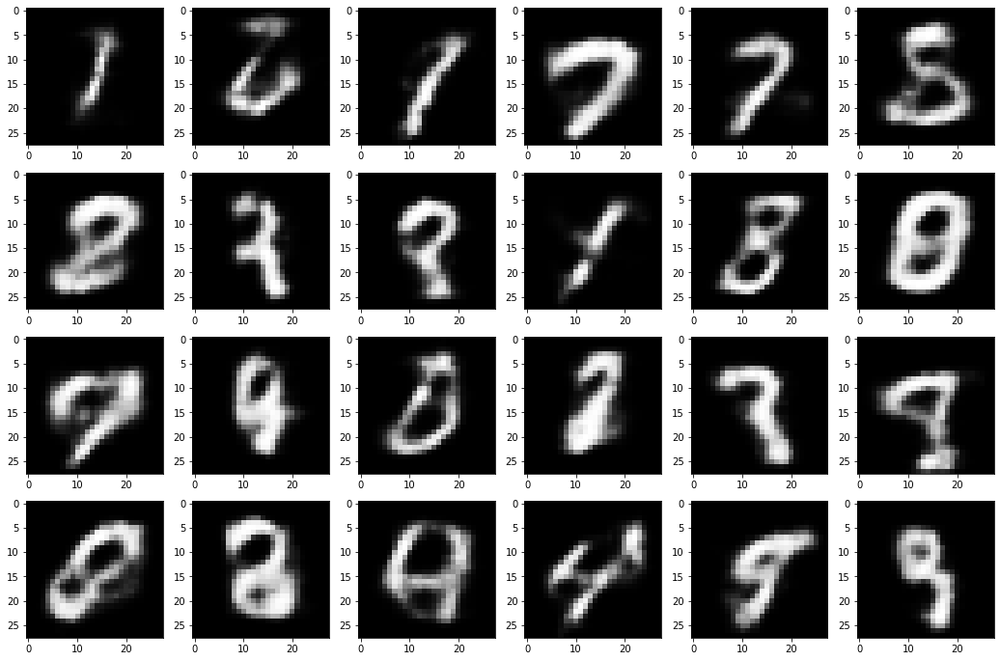

Epoch: 022: Enc Loss: 0.800, Dec Loss: 0.148, Disc Loss:0.689, IS: 2.499
examples of generated images after 22 epochs


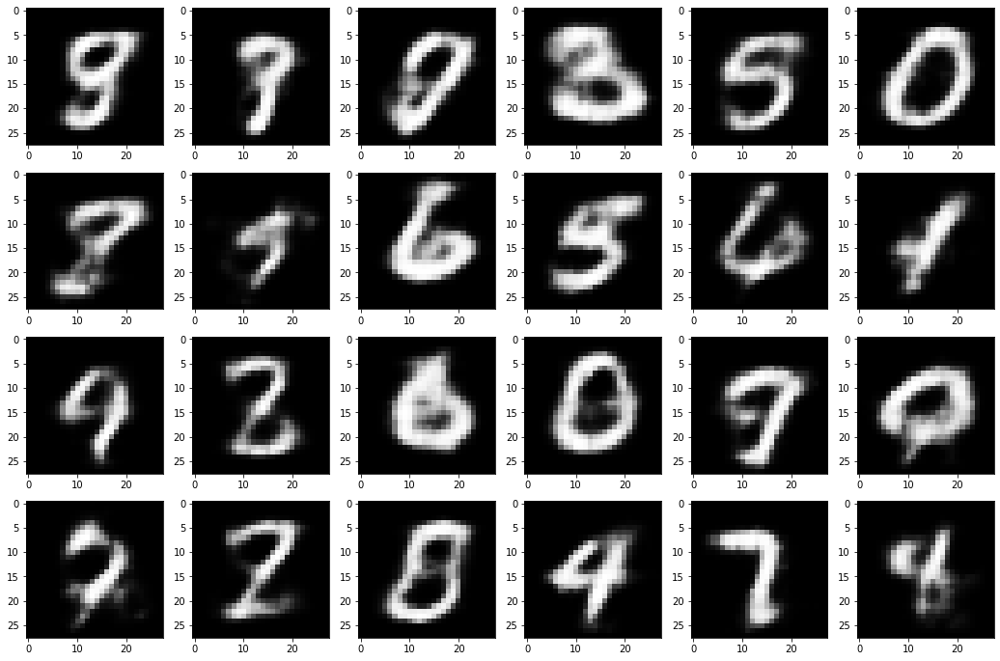

Epoch: 023: Enc Loss: 0.799, Dec Loss: 0.147, Disc Loss:0.689, IS: 2.485
examples of generated images after 23 epochs


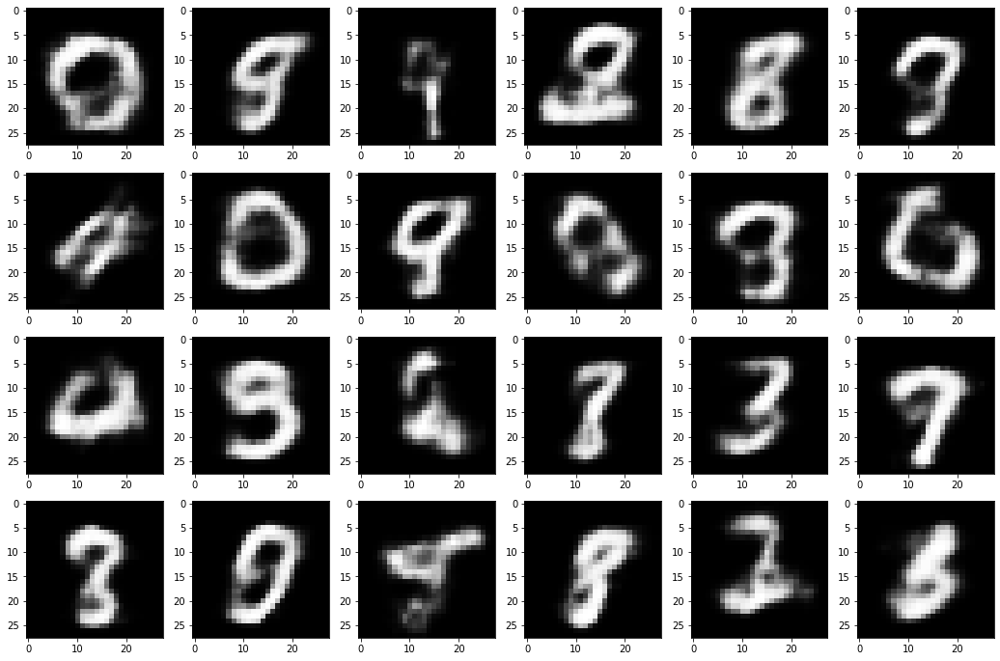

Epoch: 024: Enc Loss: 0.800, Dec Loss: 0.147, Disc Loss:0.689, IS: 2.396
examples of generated images after 24 epochs


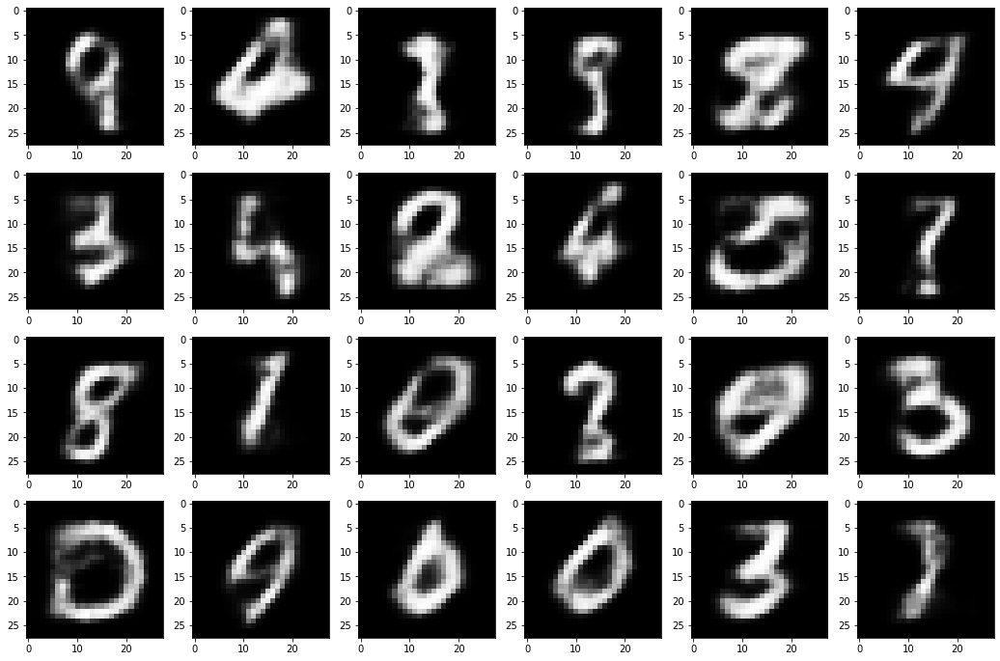

Epoch: 025: Enc Loss: 0.800, Dec Loss: 0.145, Disc Loss:0.689, IS: 2.426
examples of generated images after 25 epochs


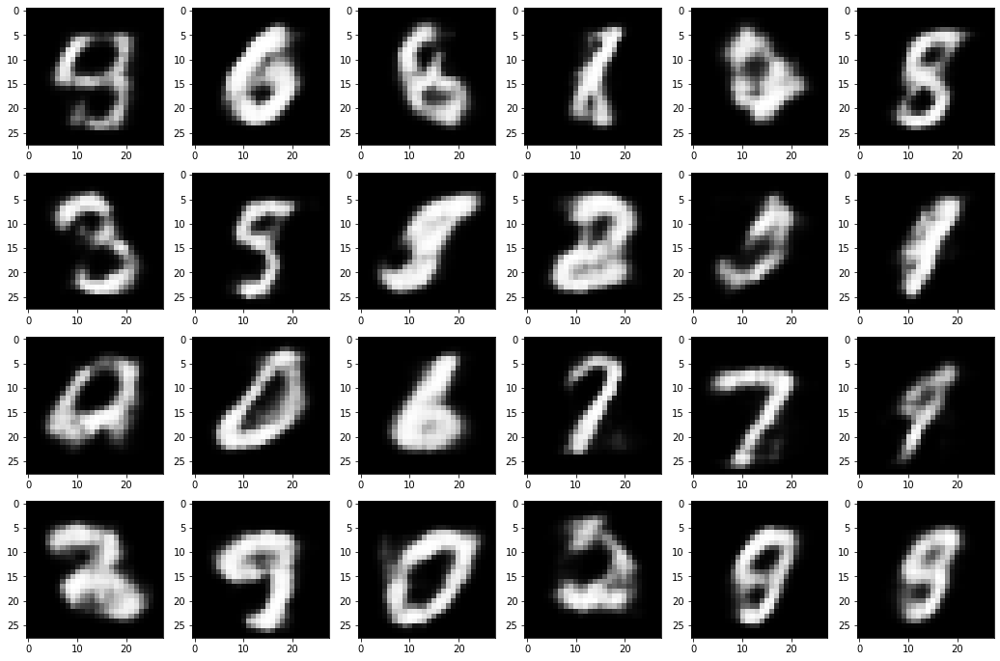

1807.530685


In [ ]:
aae = AAE(tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5), x_train, batch_size=64,
          use_averaging=False, path='/content/drive/My Drive/Diploma/Save models/AAE Adam/')
t0 = time.clock()
aae.train(epochs=25)
print(time.clock()-t0)

Epoch: 026: Enc Loss: 0.800, Dec Loss: 0.143, Disc Loss:0.689, IS: 2.533, IS_avr: 2.571
examples of generated images after 26 epochs


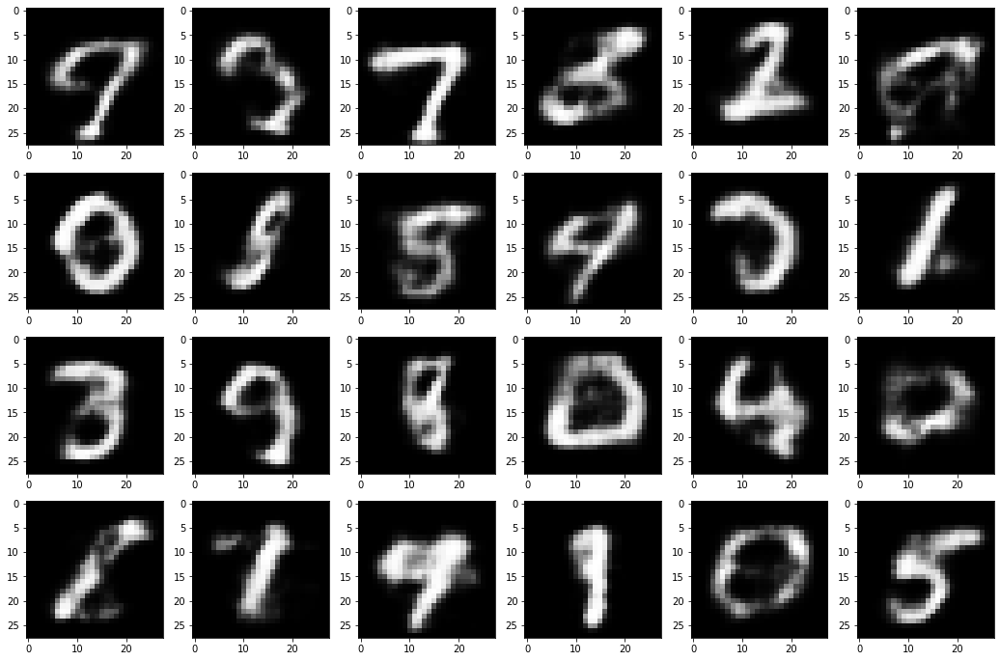

examples of generated images using average variables after 26 epochs


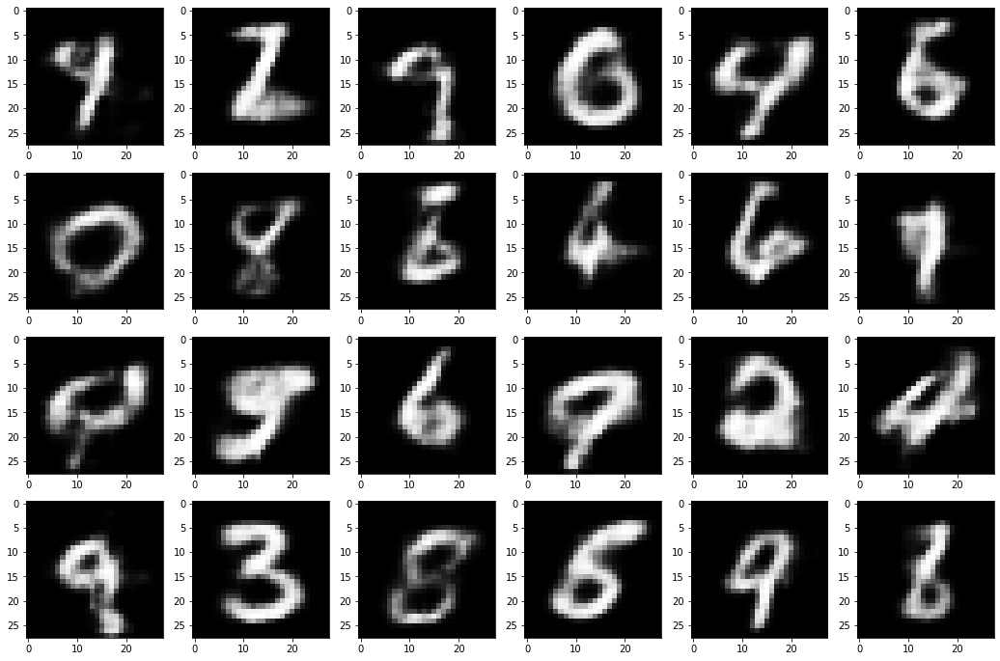

Epoch: 027: Enc Loss: 0.800, Dec Loss: 0.142, Disc Loss:0.689, IS: 2.500, IS_avr: 2.508
examples of generated images after 27 epochs


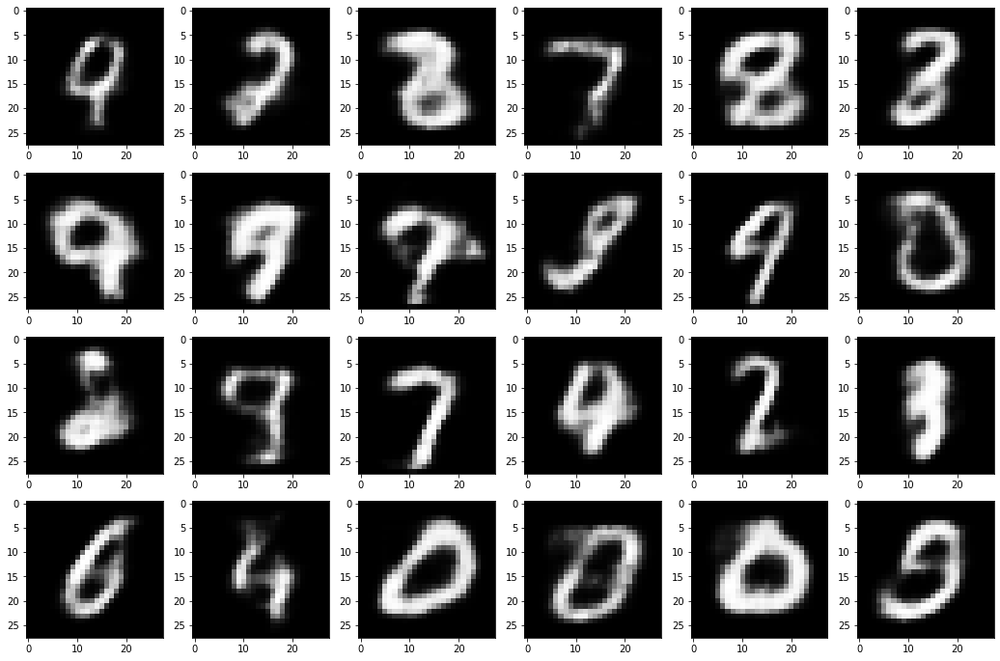

examples of generated images using average variables after 27 epochs


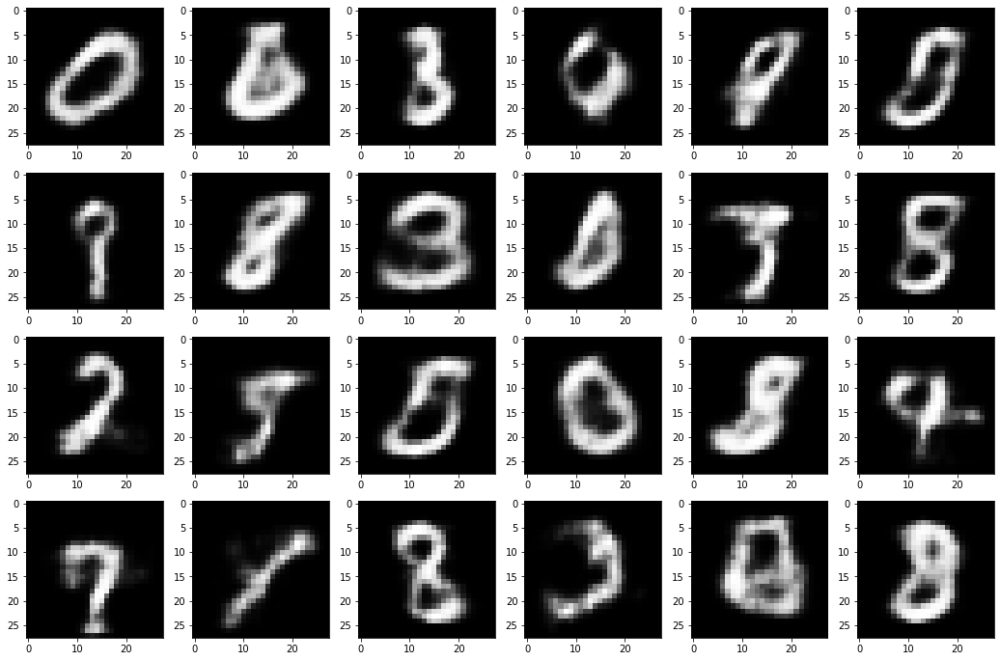

Epoch: 028: Enc Loss: 0.800, Dec Loss: 0.141, Disc Loss:0.689, IS: 2.508, IS_avr: 2.468
examples of generated images after 28 epochs


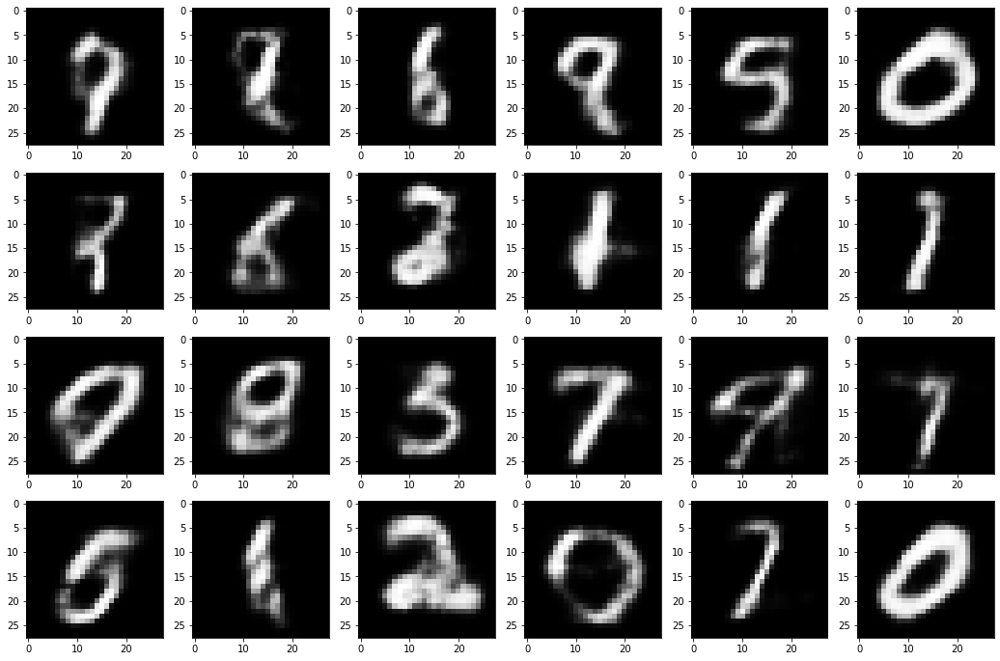

examples of generated images using average variables after 28 epochs


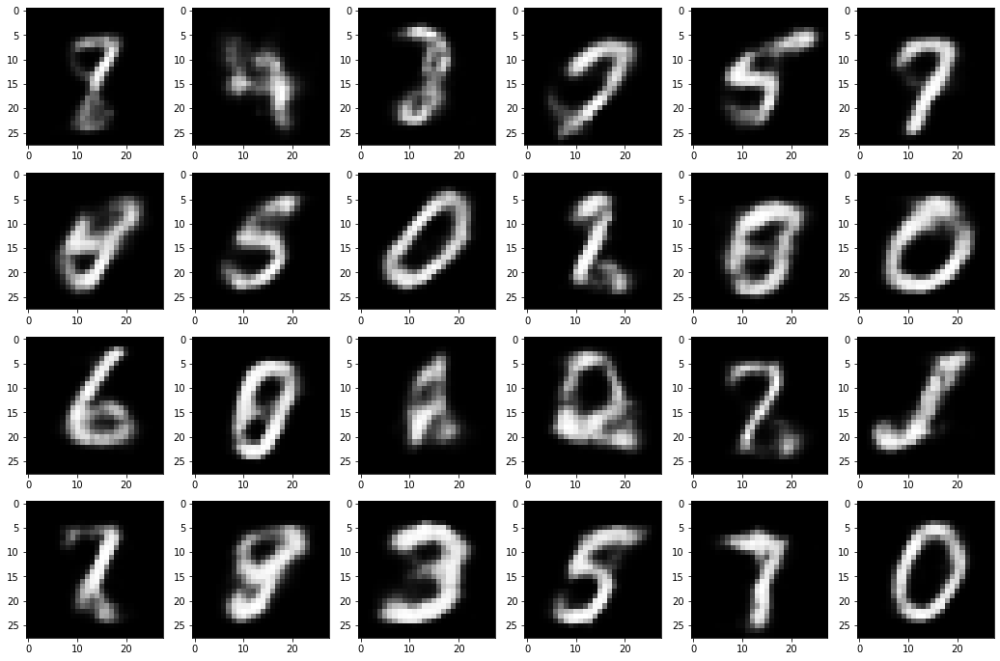

Epoch: 029: Enc Loss: 0.800, Dec Loss: 0.139, Disc Loss:0.689, IS: 2.503, IS_avr: 2.489
examples of generated images after 29 epochs


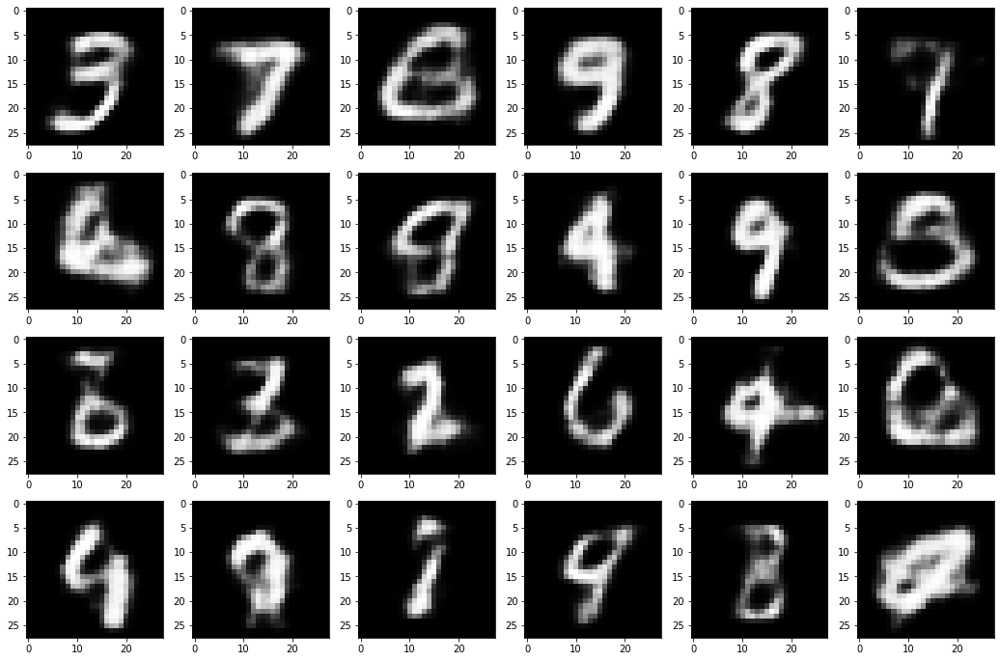

examples of generated images using average variables after 29 epochs


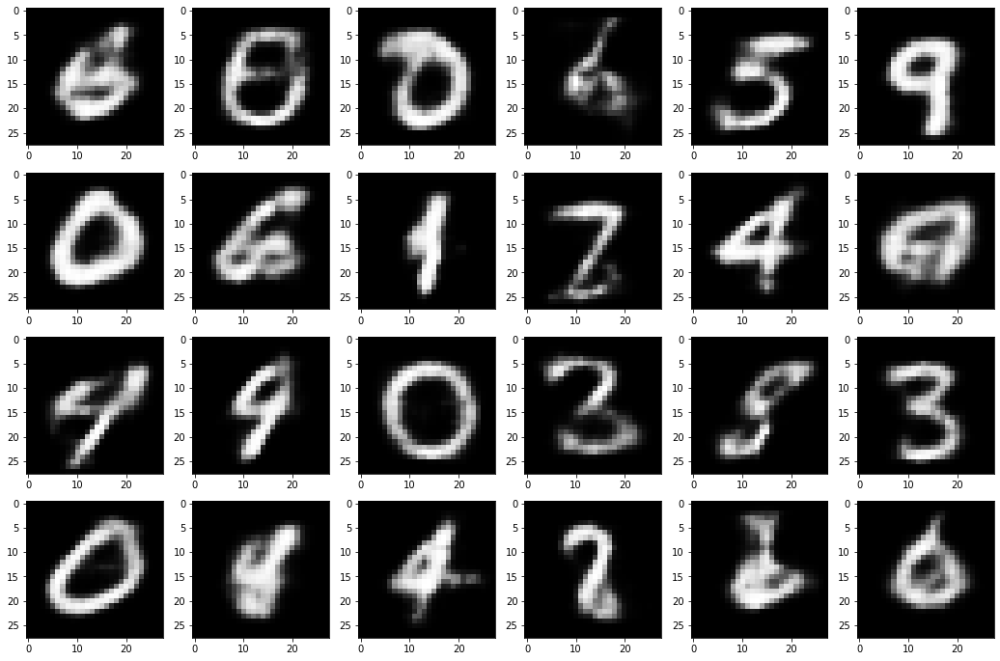

Epoch: 030: Enc Loss: 0.799, Dec Loss: 0.138, Disc Loss:0.689, IS: 2.486, IS_avr: 2.460
examples of generated images after 30 epochs


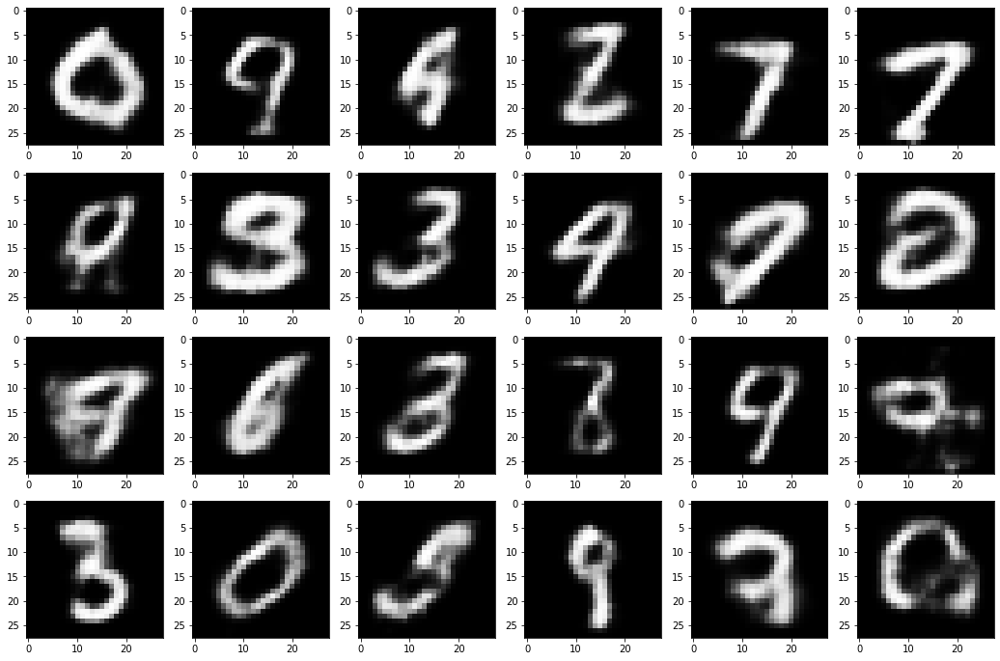

examples of generated images using average variables after 30 epochs


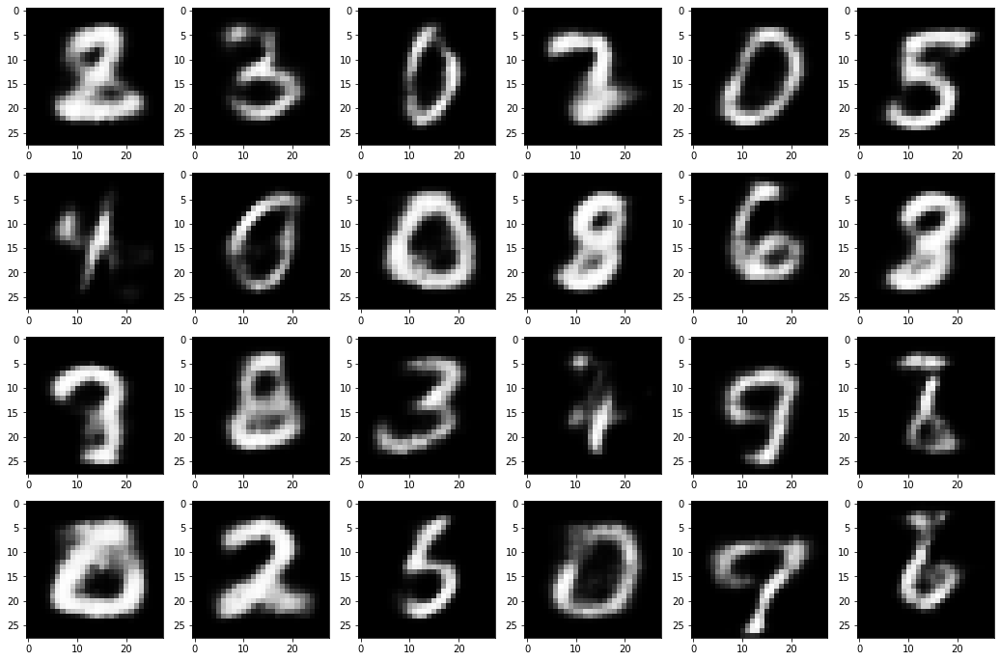

Epoch: 031: Enc Loss: 0.800, Dec Loss: 0.137, Disc Loss:0.689, IS: 2.423, IS_avr: 2.480
examples of generated images after 31 epochs


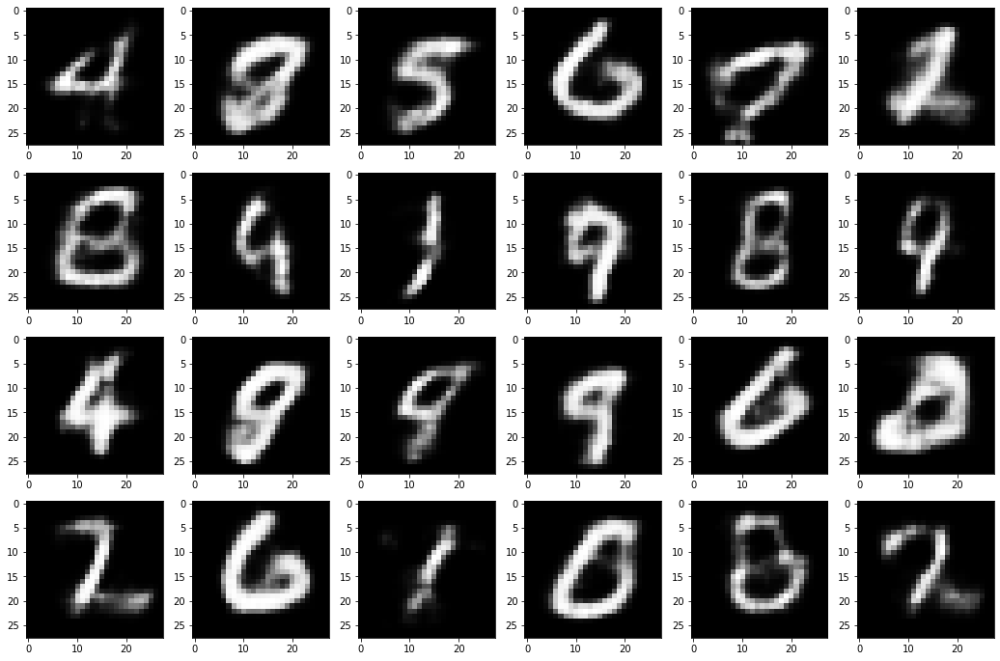

examples of generated images using average variables after 31 epochs


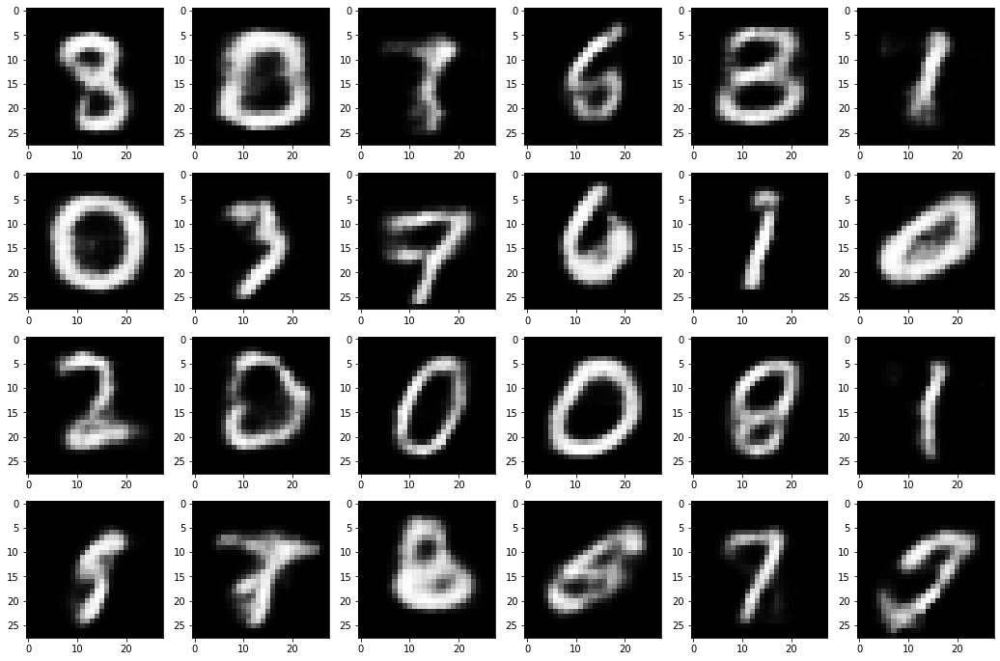

Epoch: 032: Enc Loss: 0.800, Dec Loss: 0.136, Disc Loss:0.688, IS: 2.484, IS_avr: 2.452
examples of generated images after 32 epochs


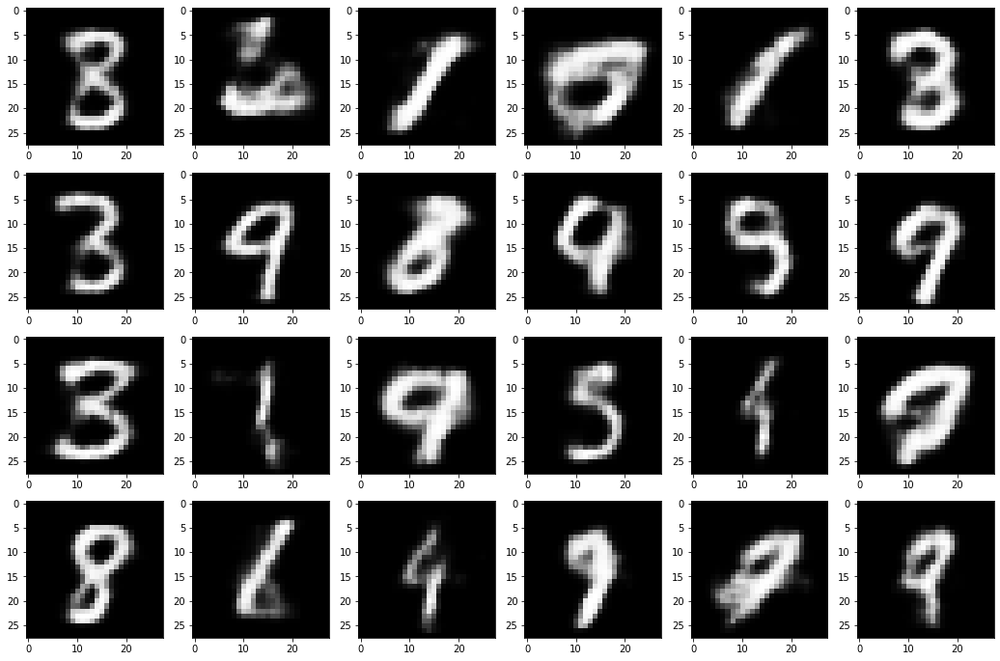

examples of generated images using average variables after 32 epochs


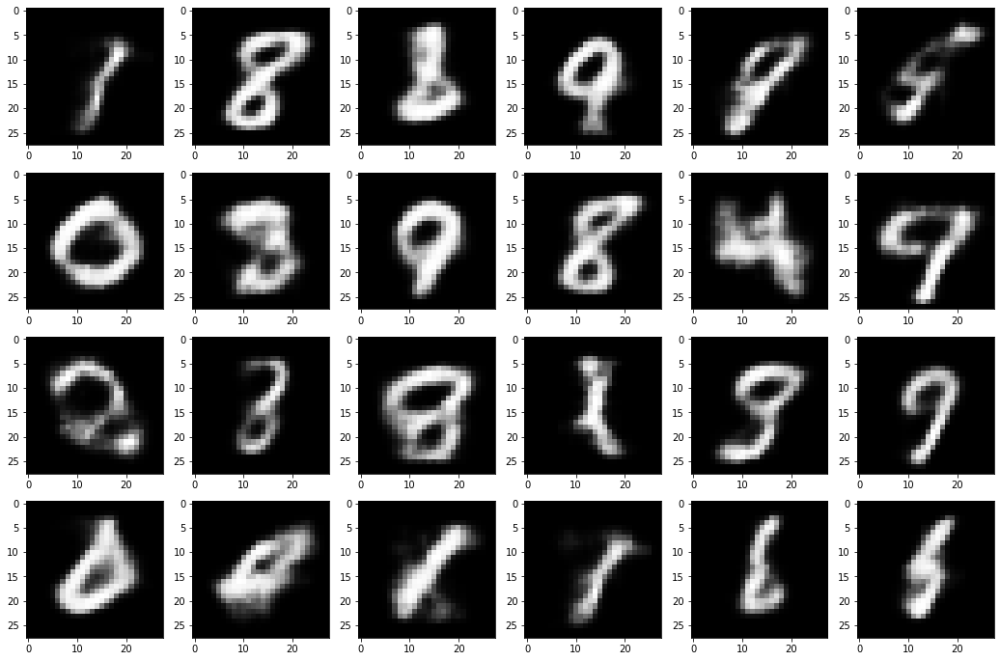

Epoch: 033: Enc Loss: 0.800, Dec Loss: 0.135, Disc Loss:0.689, IS: 2.543, IS_avr: 2.471
examples of generated images after 33 epochs


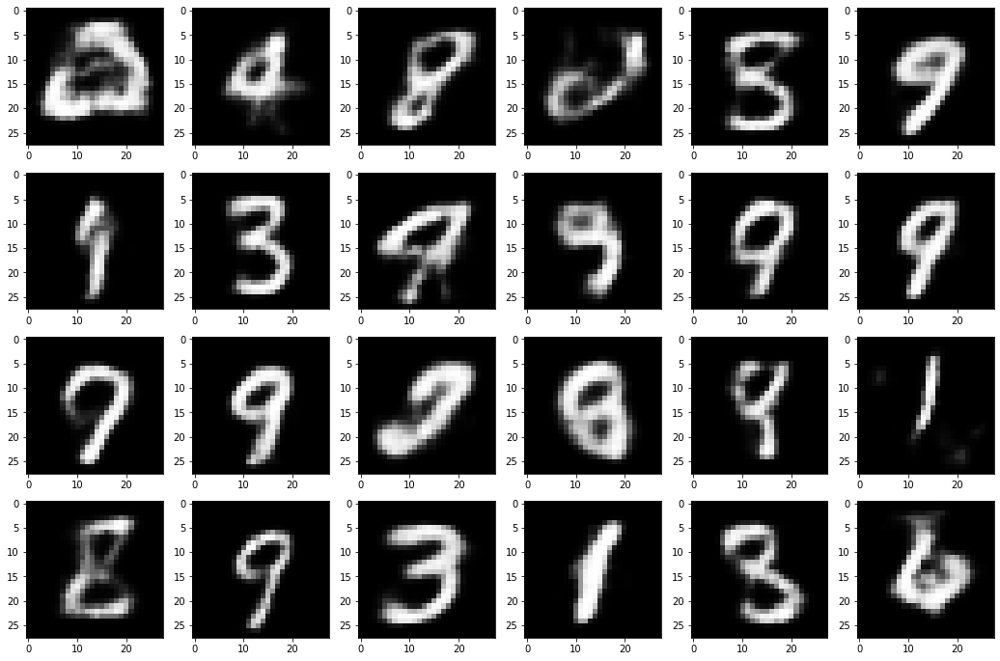

examples of generated images using average variables after 33 epochs


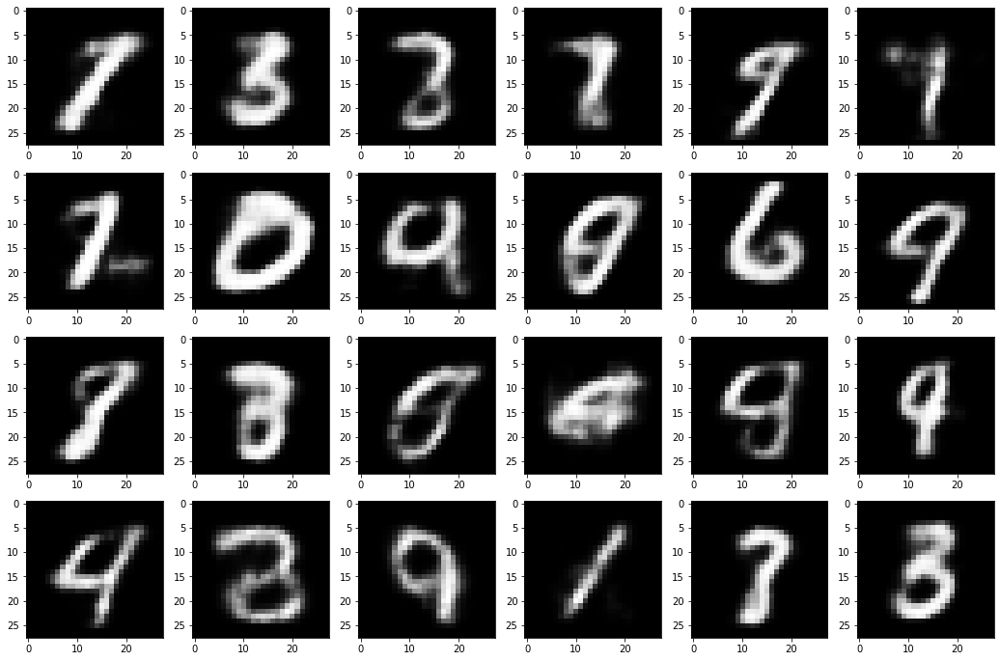

Epoch: 034: Enc Loss: 0.800, Dec Loss: 0.135, Disc Loss:0.689, IS: 2.581, IS_avr: 2.553
examples of generated images after 34 epochs


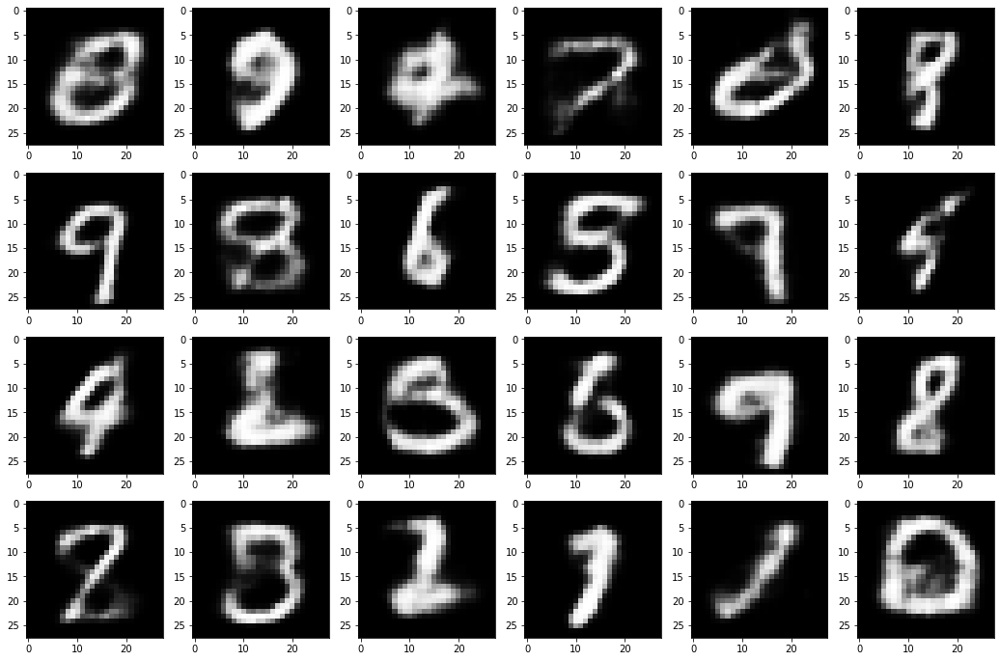

examples of generated images using average variables after 34 epochs


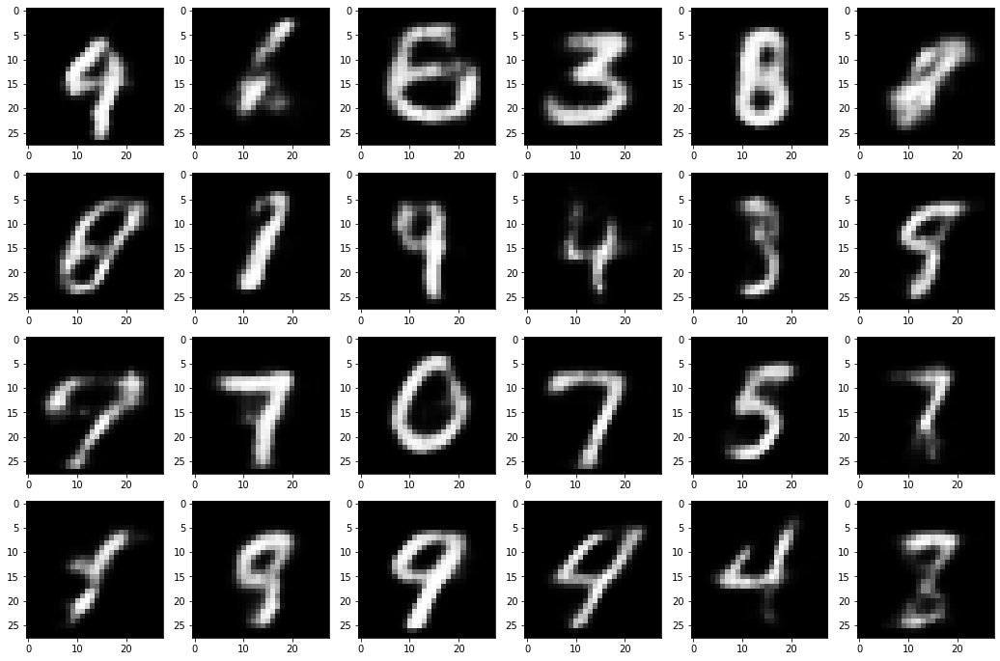

Epoch: 035: Enc Loss: 0.800, Dec Loss: 0.134, Disc Loss:0.689, IS: 2.479, IS_avr: 2.450
examples of generated images after 35 epochs


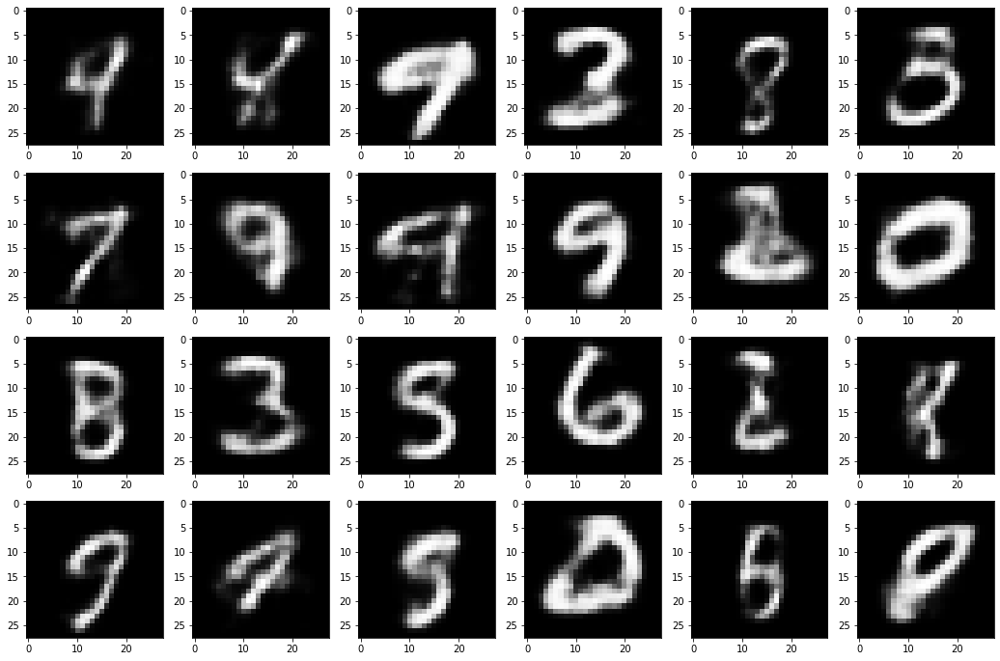

examples of generated images using average variables after 35 epochs


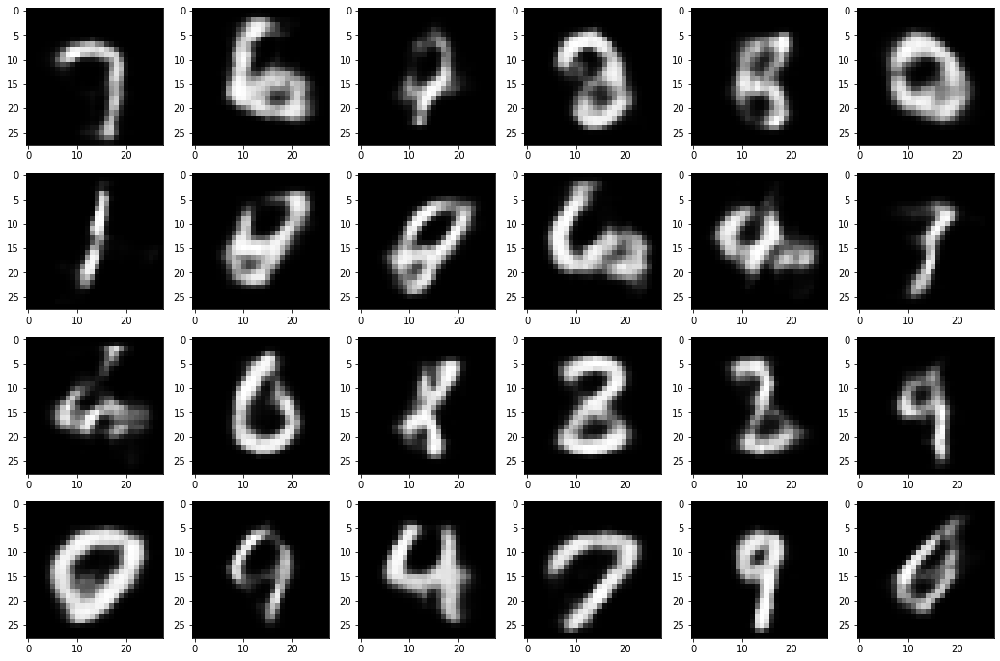

Epoch: 036: Enc Loss: 0.800, Dec Loss: 0.133, Disc Loss:0.689, IS: 2.499, IS_avr: 2.439
examples of generated images after 36 epochs


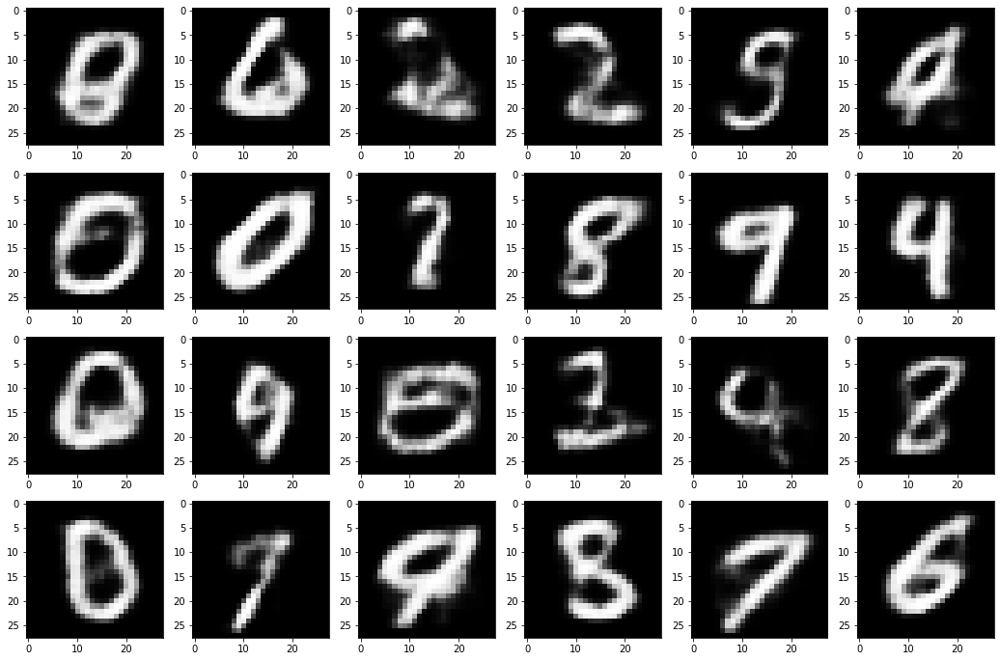

examples of generated images using average variables after 36 epochs


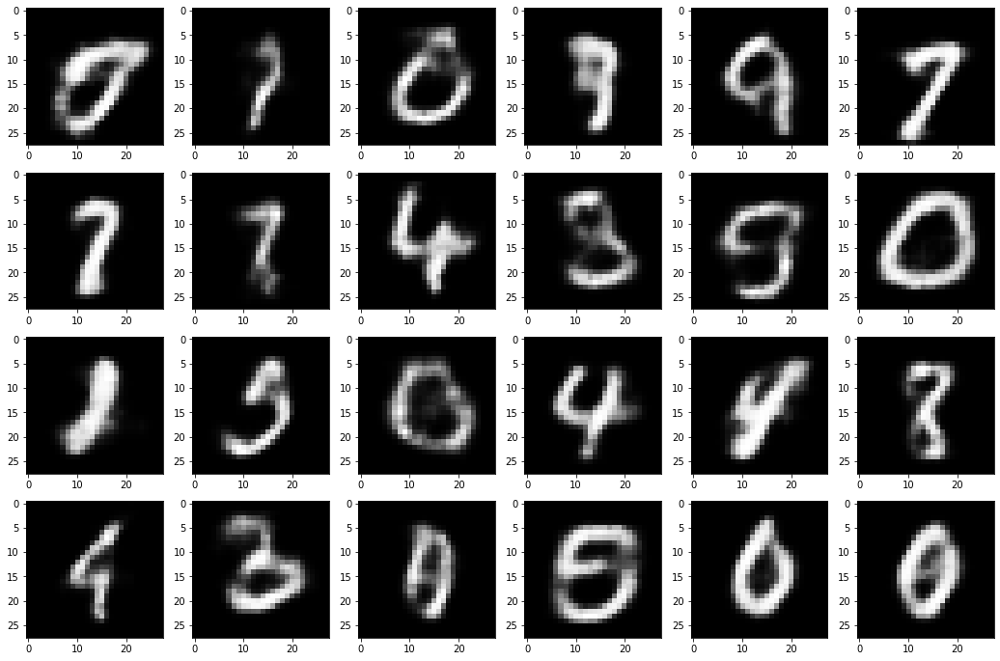

Epoch: 037: Enc Loss: 0.800, Dec Loss: 0.132, Disc Loss:0.689, IS: 2.591, IS_avr: 2.479
examples of generated images after 37 epochs


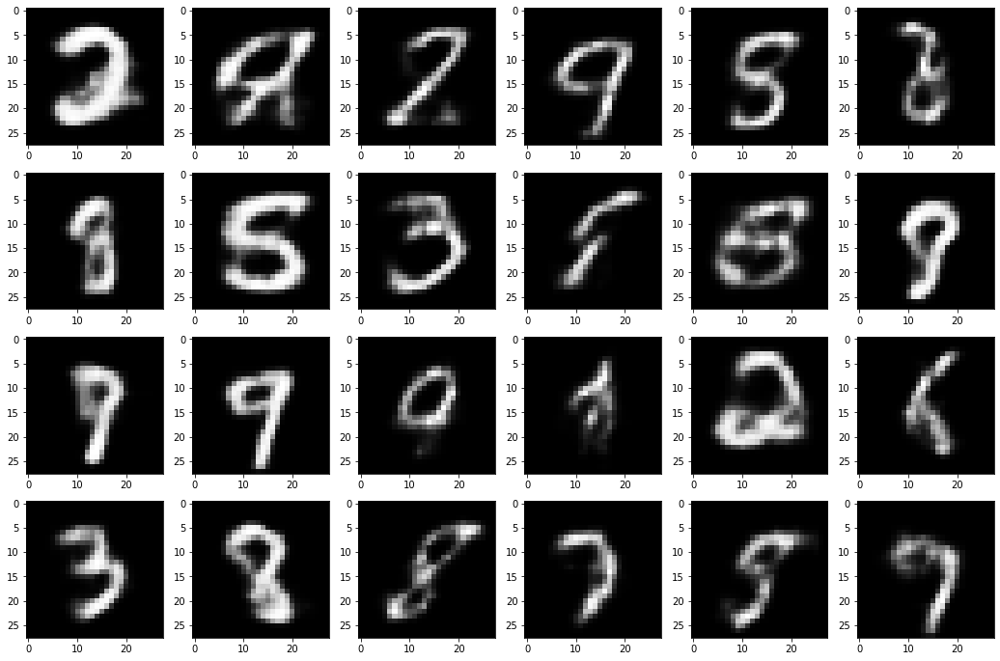

examples of generated images using average variables after 37 epochs


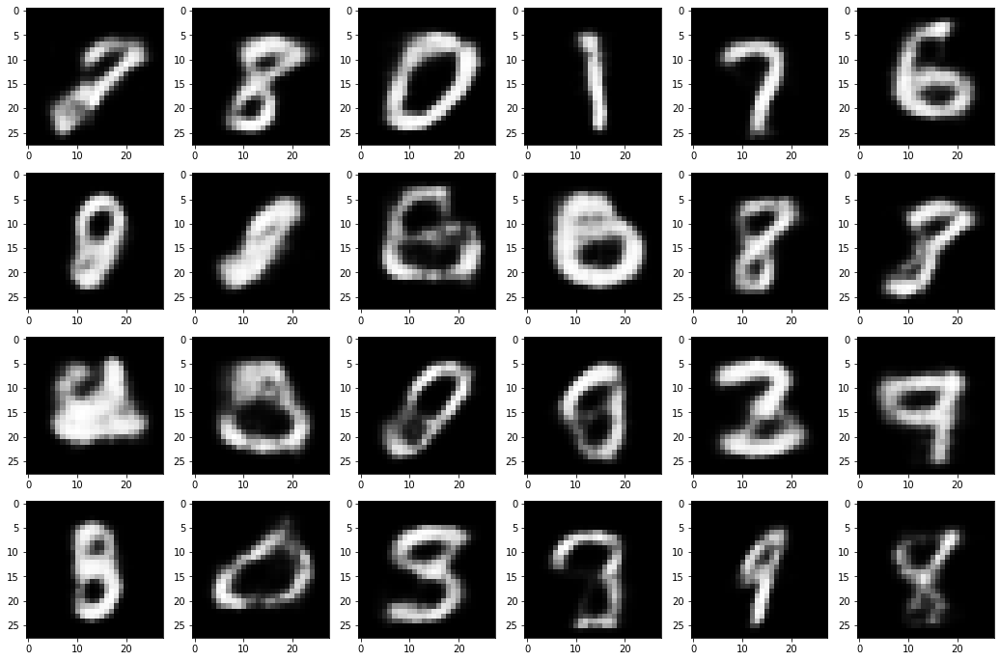

Epoch: 038: Enc Loss: 0.800, Dec Loss: 0.131, Disc Loss:0.689, IS: 2.496, IS_avr: 2.528
examples of generated images after 38 epochs


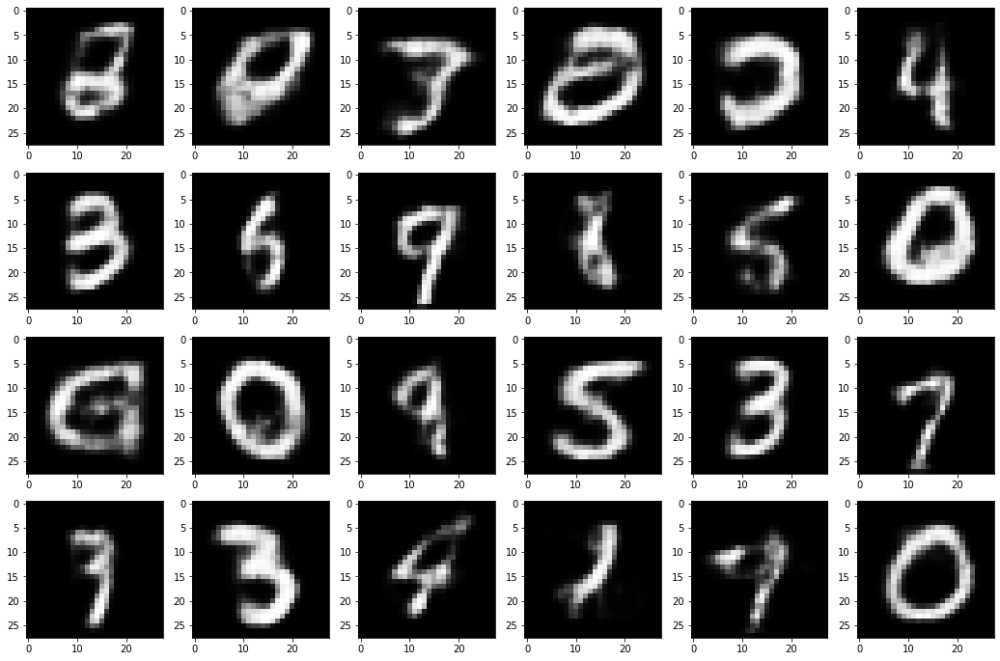

examples of generated images using average variables after 38 epochs


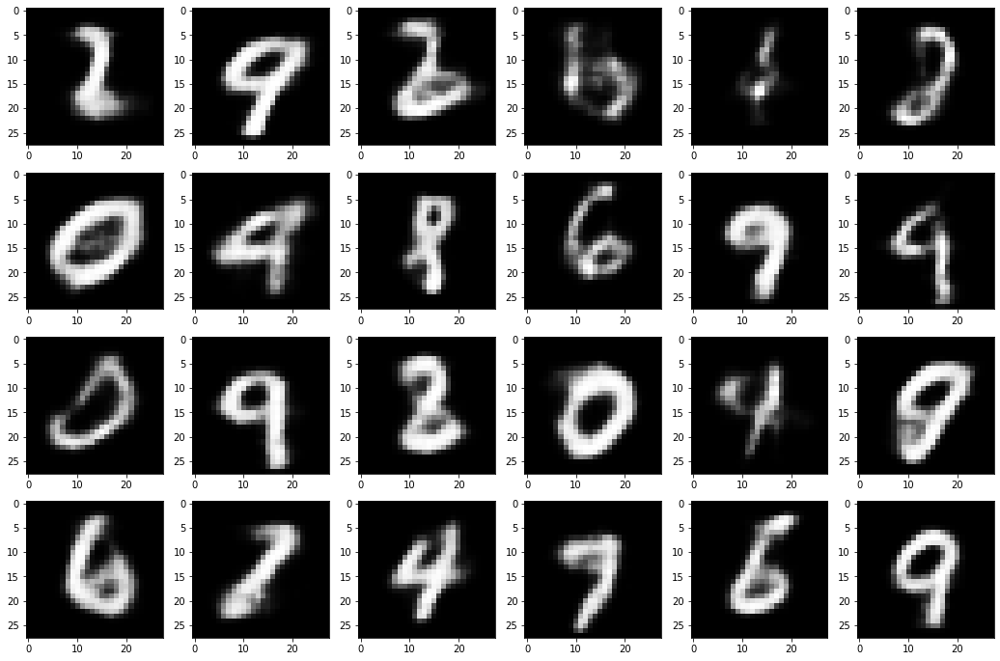

Epoch: 039: Enc Loss: 0.799, Dec Loss: 0.131, Disc Loss:0.689, IS: 2.529, IS_avr: 2.520
examples of generated images after 39 epochs


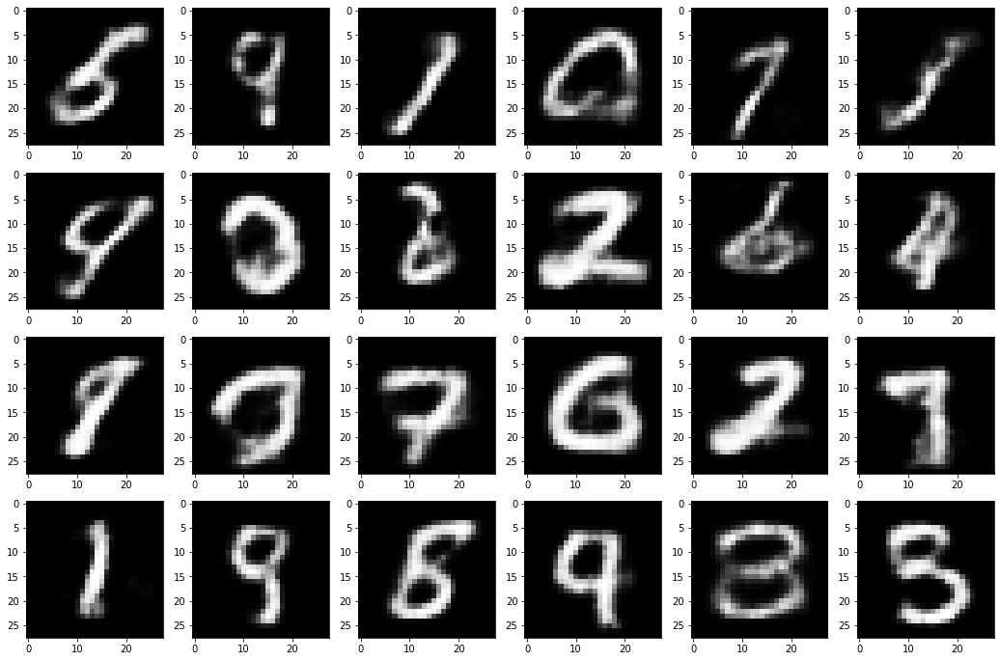

examples of generated images using average variables after 39 epochs


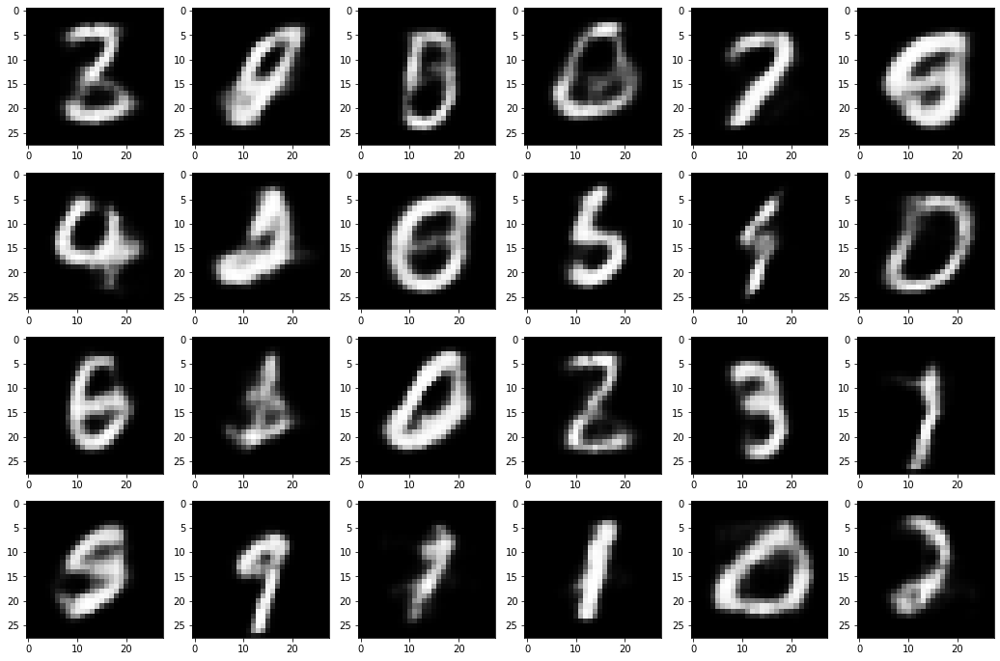

Epoch: 040: Enc Loss: 0.799, Dec Loss: 0.130, Disc Loss:0.688, IS: 2.462, IS_avr: 2.531
examples of generated images after 40 epochs


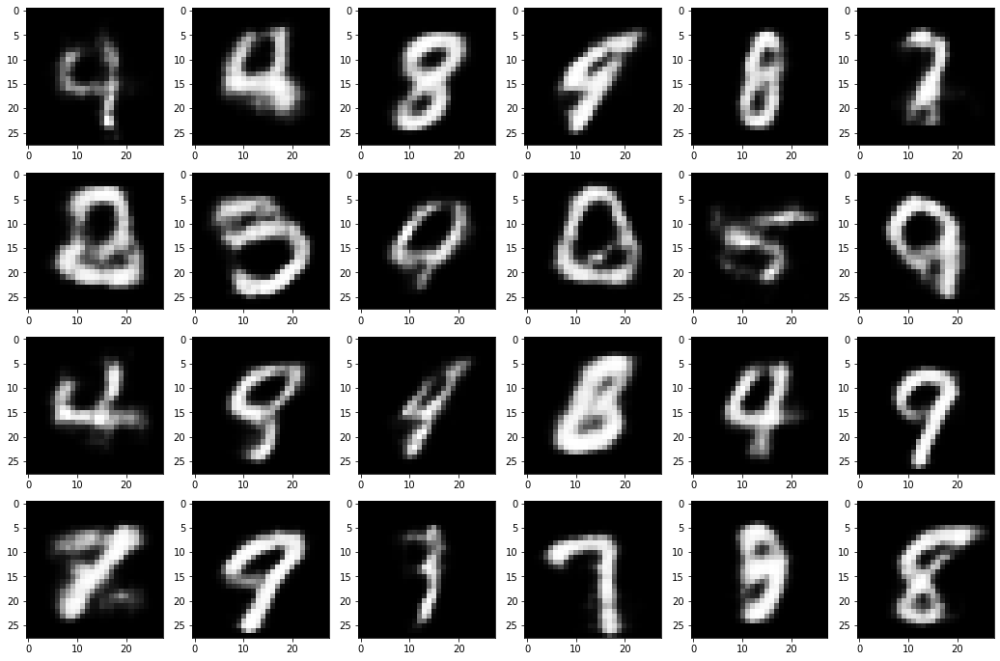

examples of generated images using average variables after 40 epochs


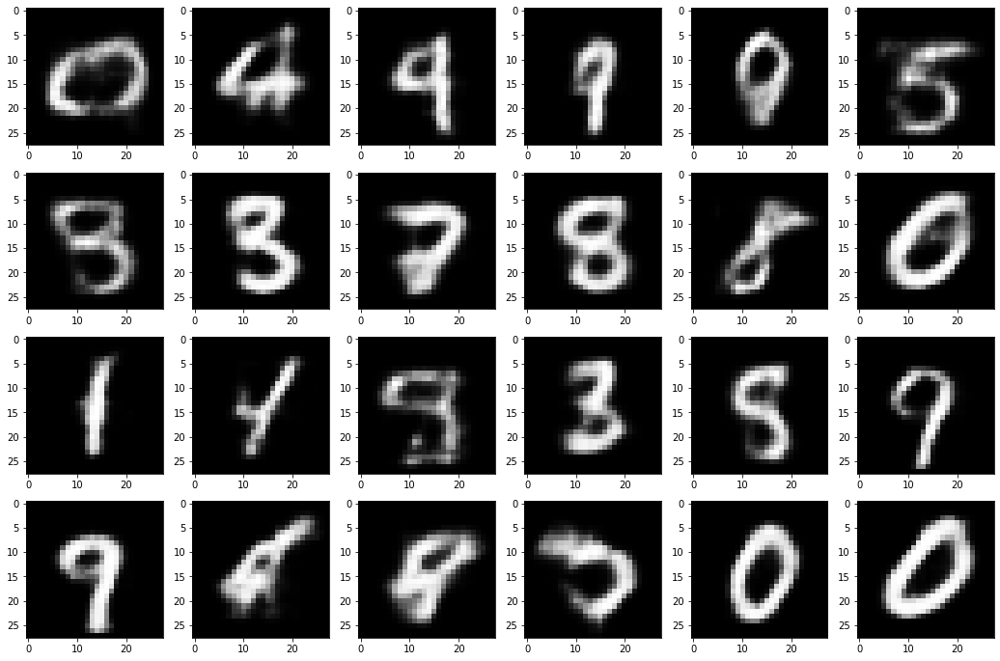

Epoch: 041: Enc Loss: 0.800, Dec Loss: 0.129, Disc Loss:0.688, IS: 2.536, IS_avr: 2.560
examples of generated images after 41 epochs


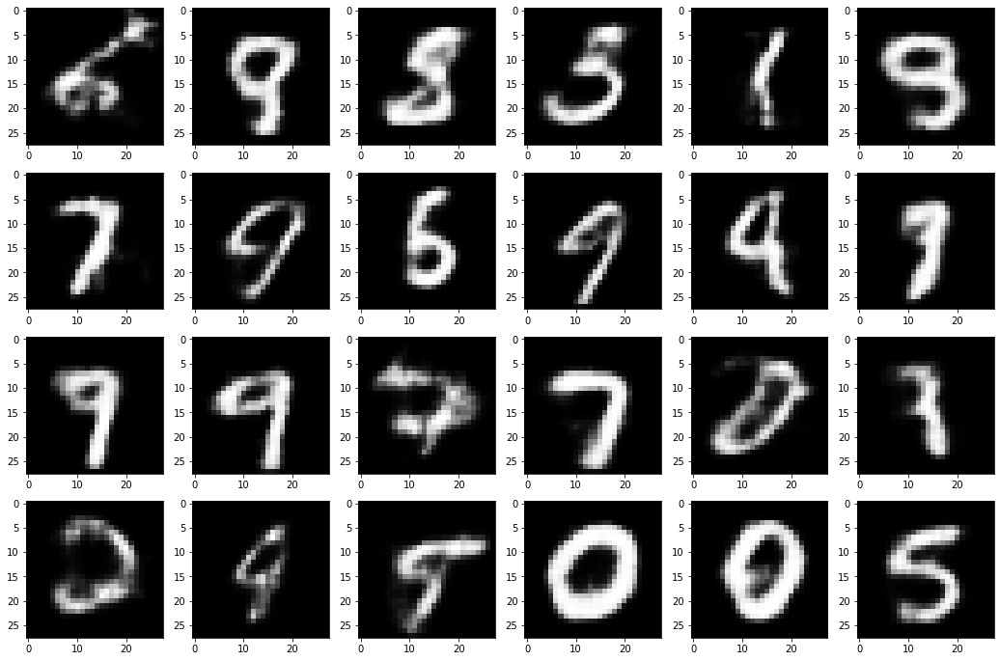

examples of generated images using average variables after 41 epochs


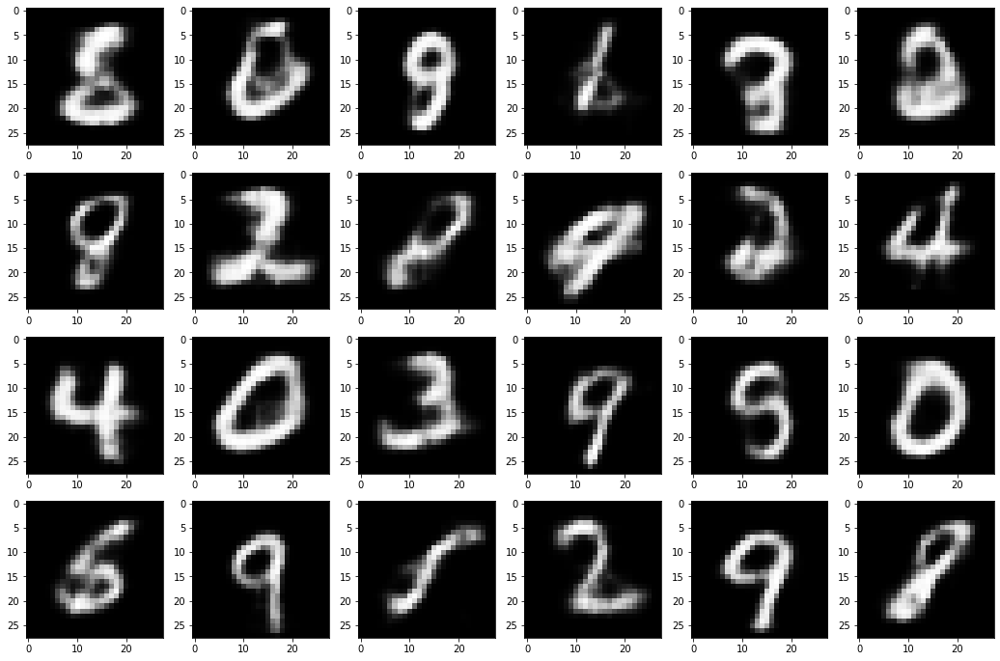

Epoch: 042: Enc Loss: 0.799, Dec Loss: 0.129, Disc Loss:0.688, IS: 2.411, IS_avr: 2.490
examples of generated images after 42 epochs


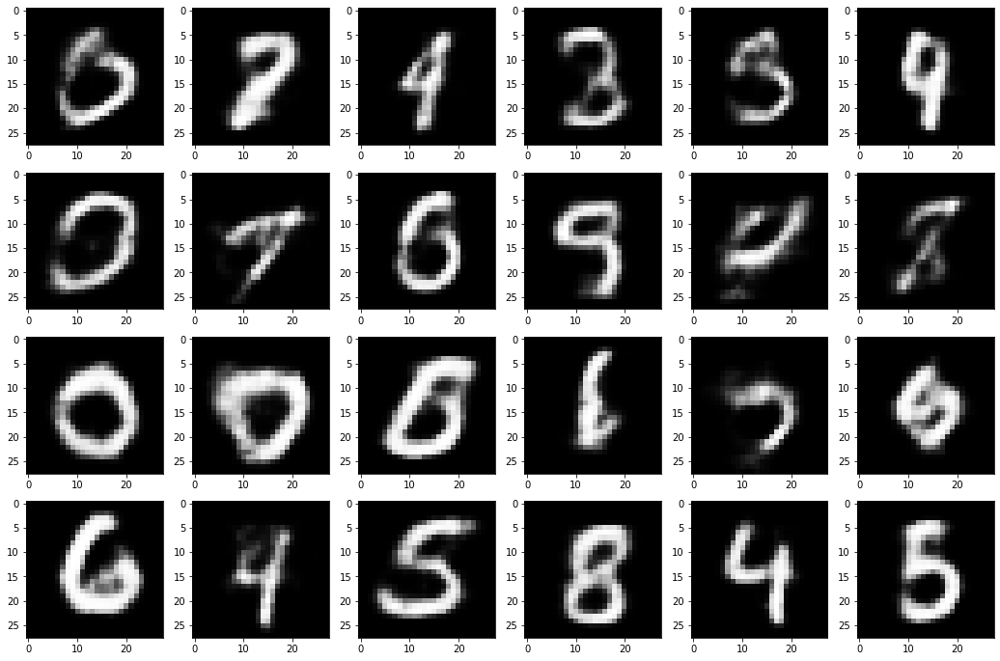

examples of generated images using average variables after 42 epochs


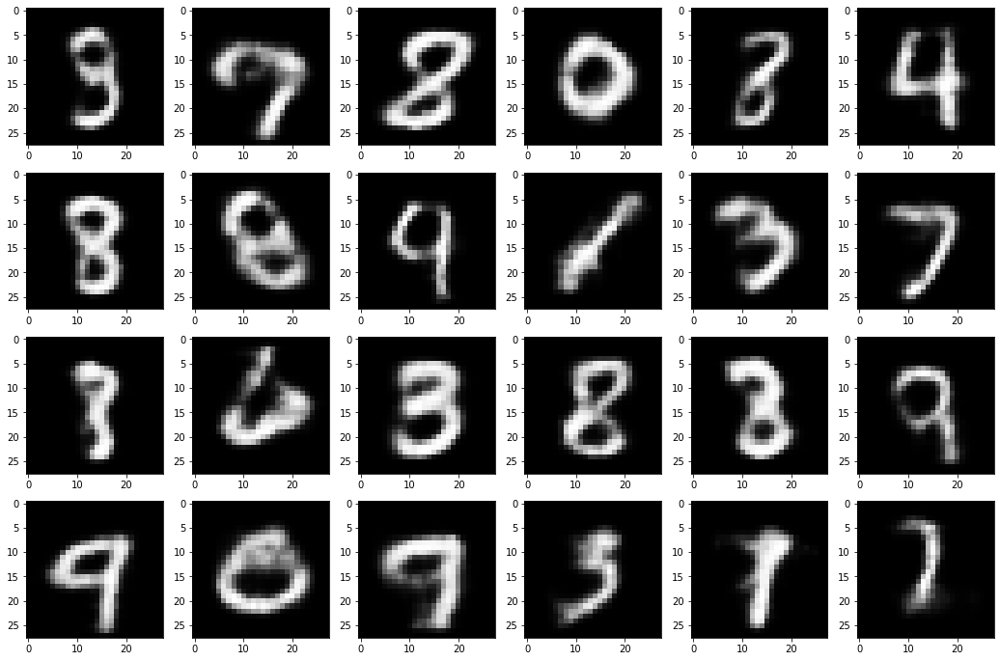

Epoch: 043: Enc Loss: 0.800, Dec Loss: 0.129, Disc Loss:0.688, IS: 2.625, IS_avr: 2.493
examples of generated images after 43 epochs


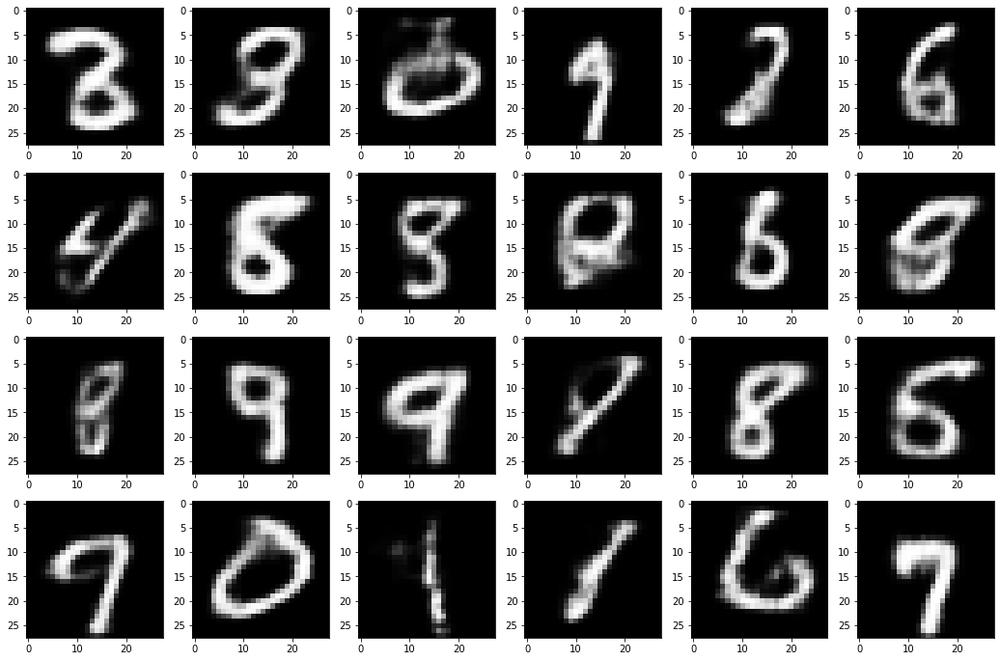

examples of generated images using average variables after 43 epochs


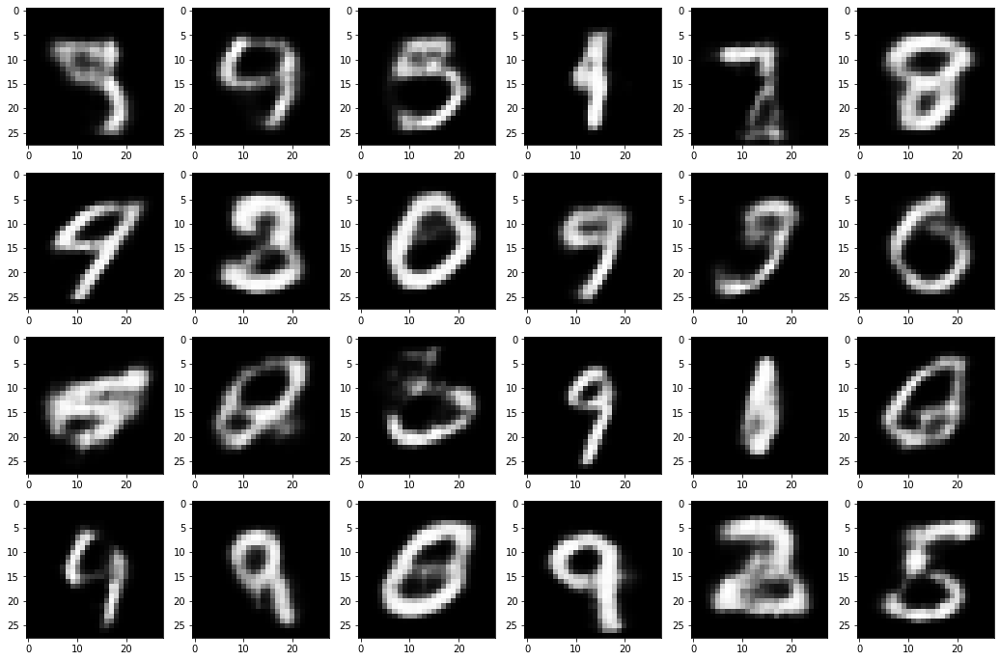

Epoch: 044: Enc Loss: 0.800, Dec Loss: 0.129, Disc Loss:0.688, IS: 2.525, IS_avr: 2.514
examples of generated images after 44 epochs


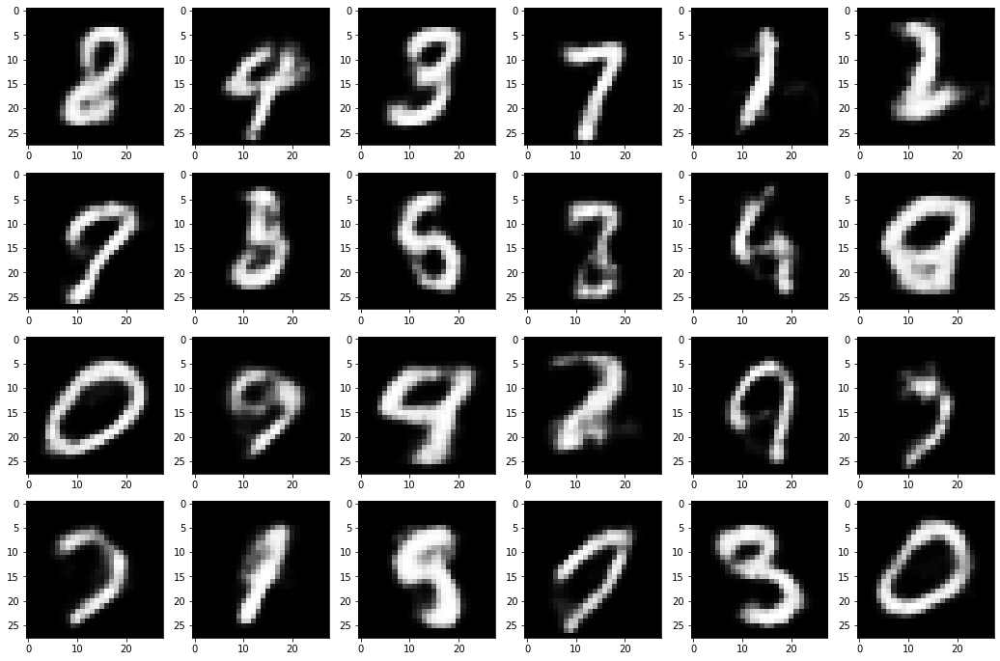

examples of generated images using average variables after 44 epochs


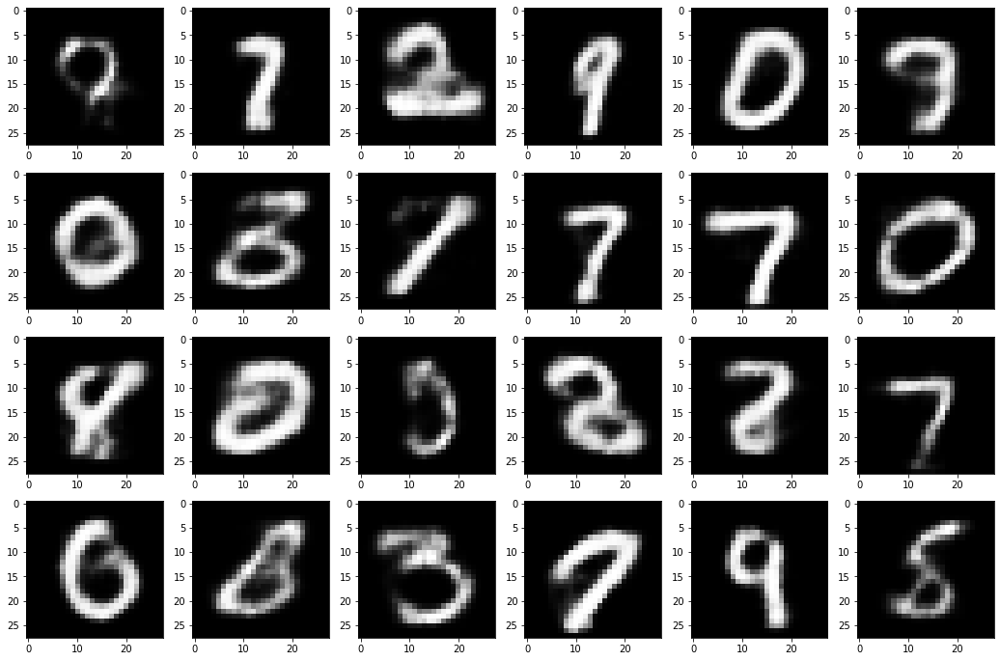

Epoch: 045: Enc Loss: 0.800, Dec Loss: 0.128, Disc Loss:0.688, IS: 2.533, IS_avr: 2.548
examples of generated images after 45 epochs


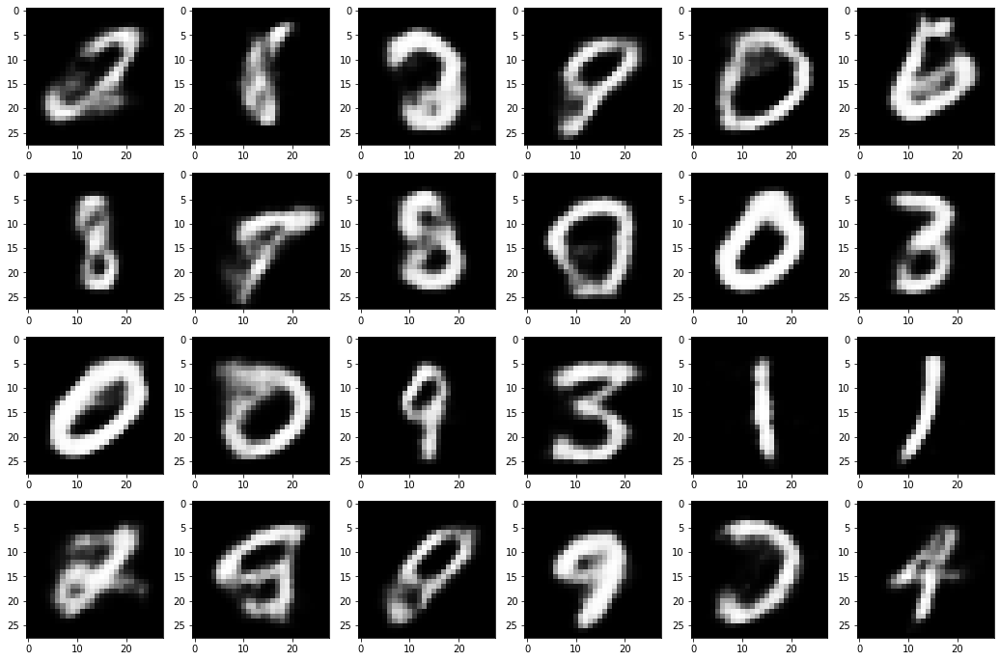

examples of generated images using average variables after 45 epochs


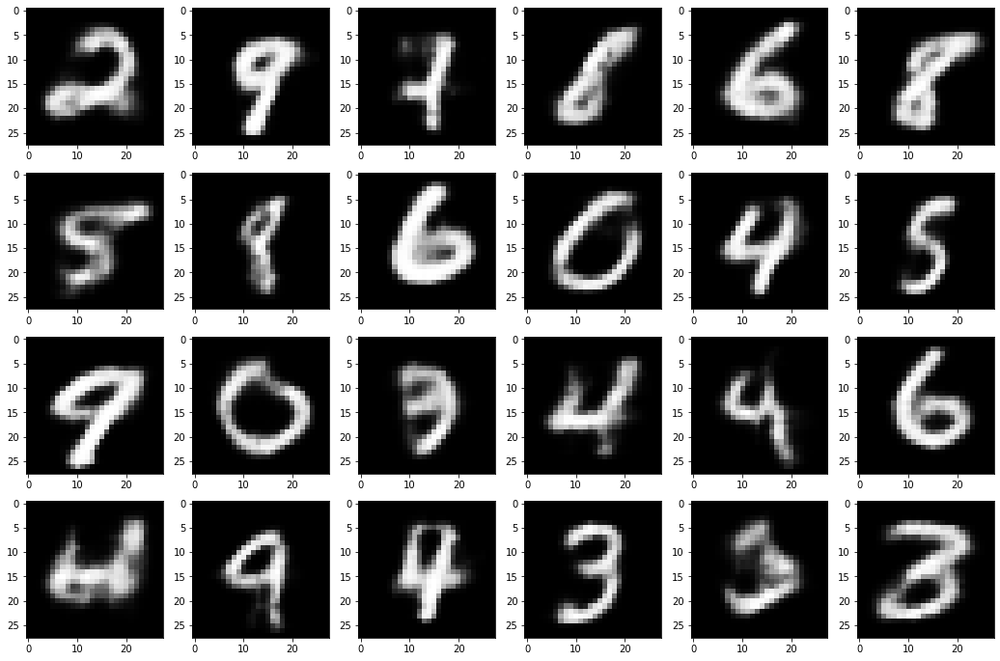

Epoch: 046: Enc Loss: 0.799, Dec Loss: 0.129, Disc Loss:0.688, IS: 2.468, IS_avr: 2.546
examples of generated images after 46 epochs


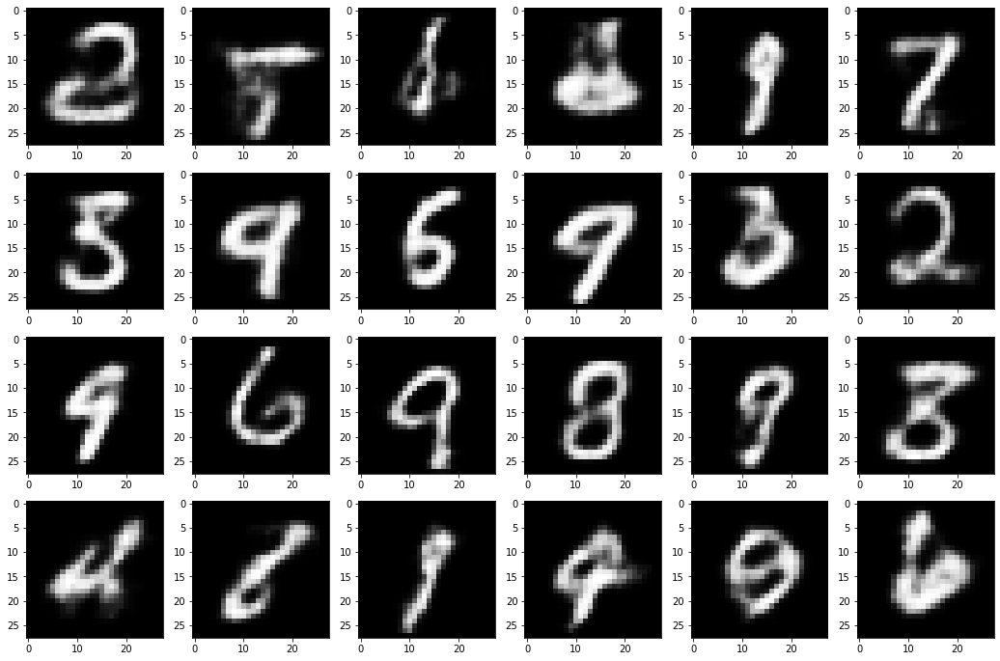

examples of generated images using average variables after 46 epochs


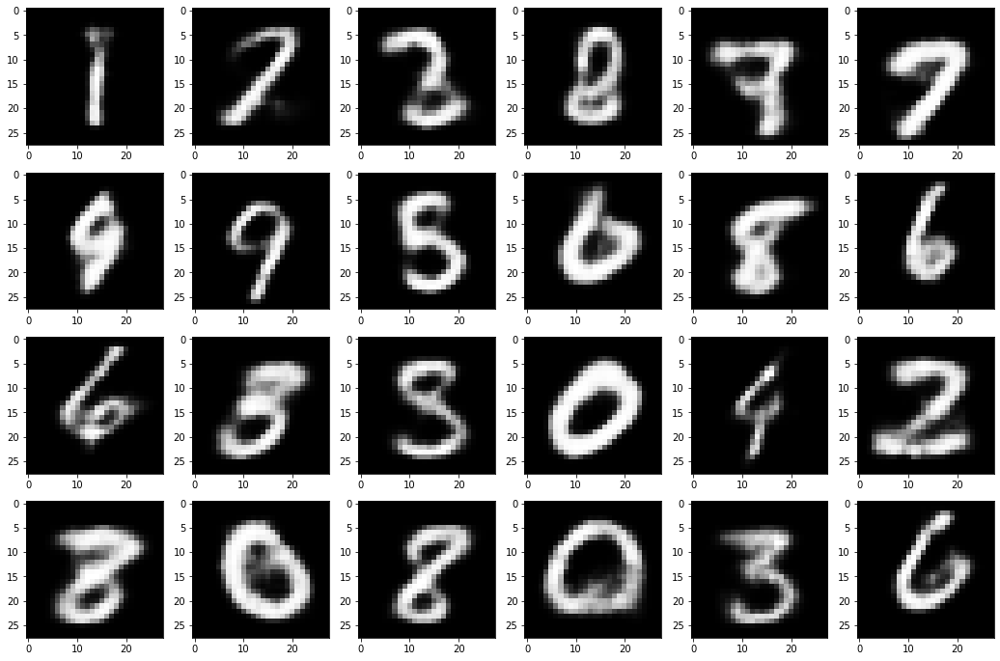

Epoch: 047: Enc Loss: 0.800, Dec Loss: 0.128, Disc Loss:0.688, IS: 2.545, IS_avr: 2.552
examples of generated images after 47 epochs


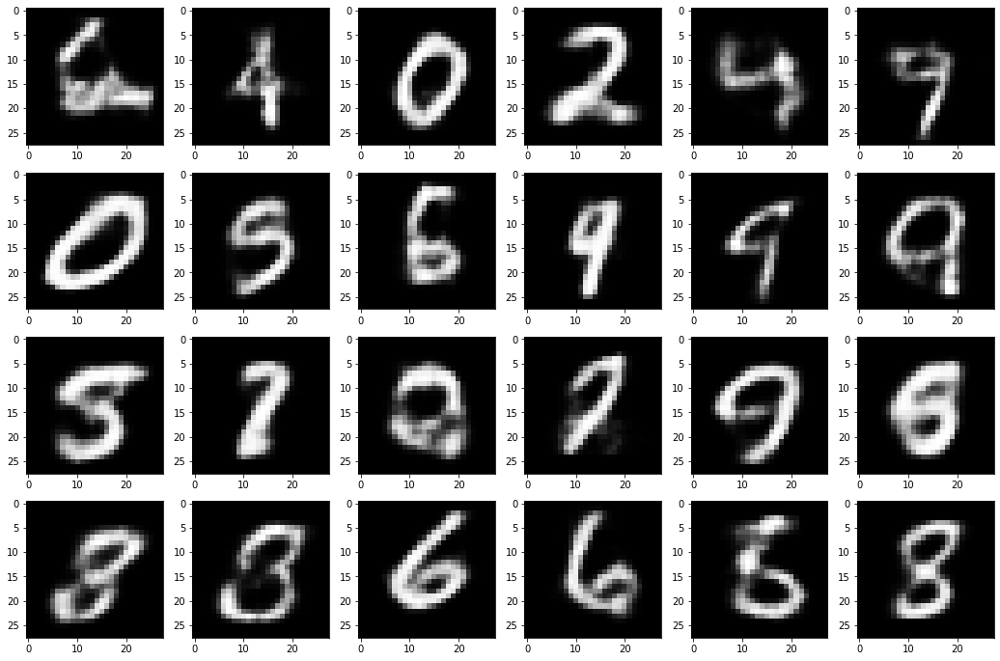

examples of generated images using average variables after 47 epochs


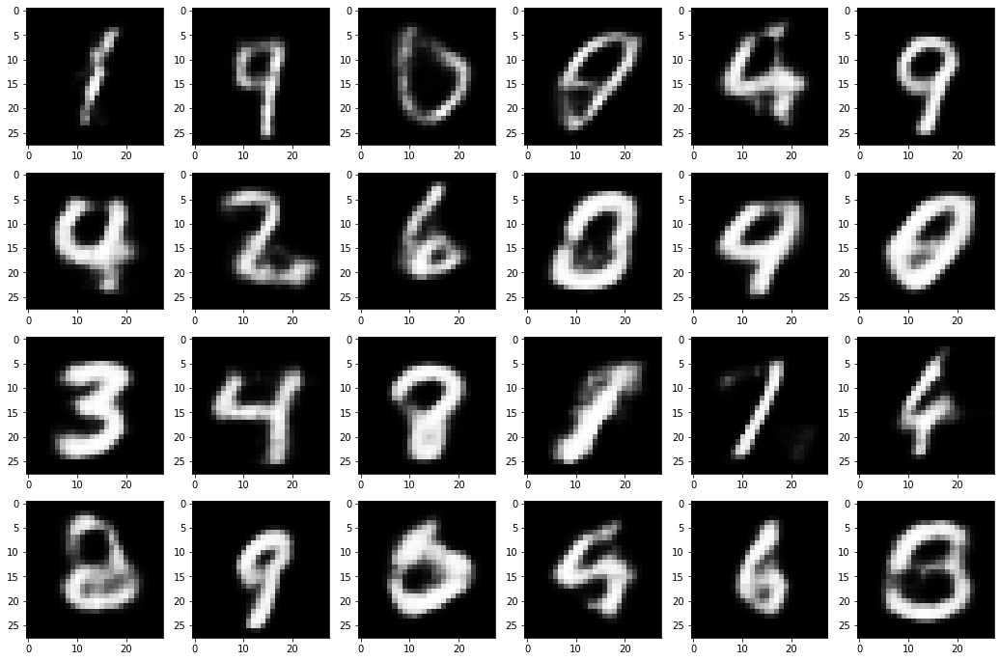

Epoch: 048: Enc Loss: 0.800, Dec Loss: 0.128, Disc Loss:0.688, IS: 2.473, IS_avr: 2.580
examples of generated images after 48 epochs


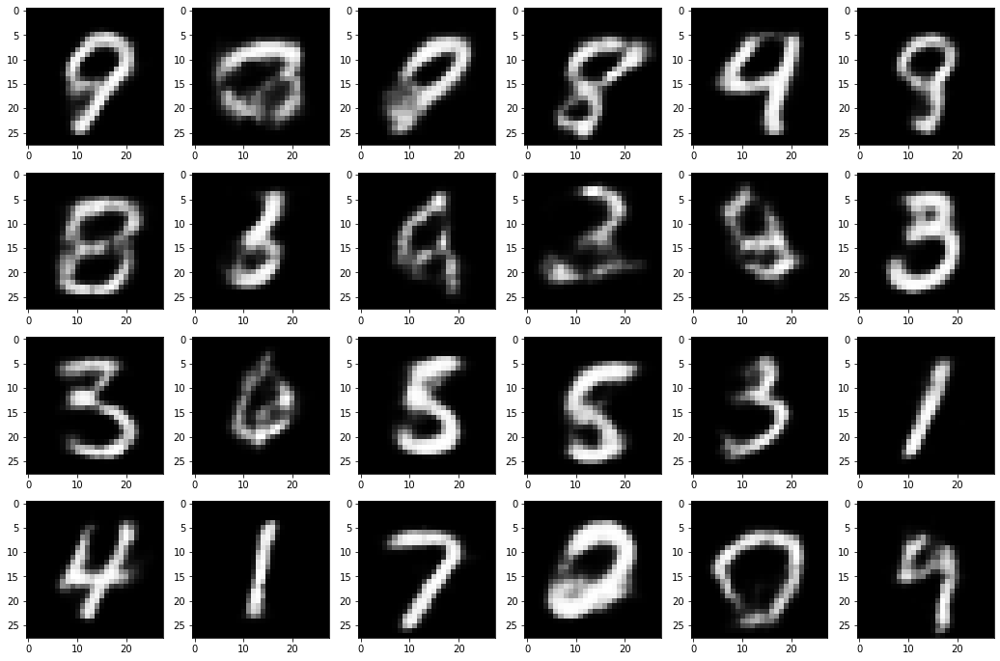

examples of generated images using average variables after 48 epochs


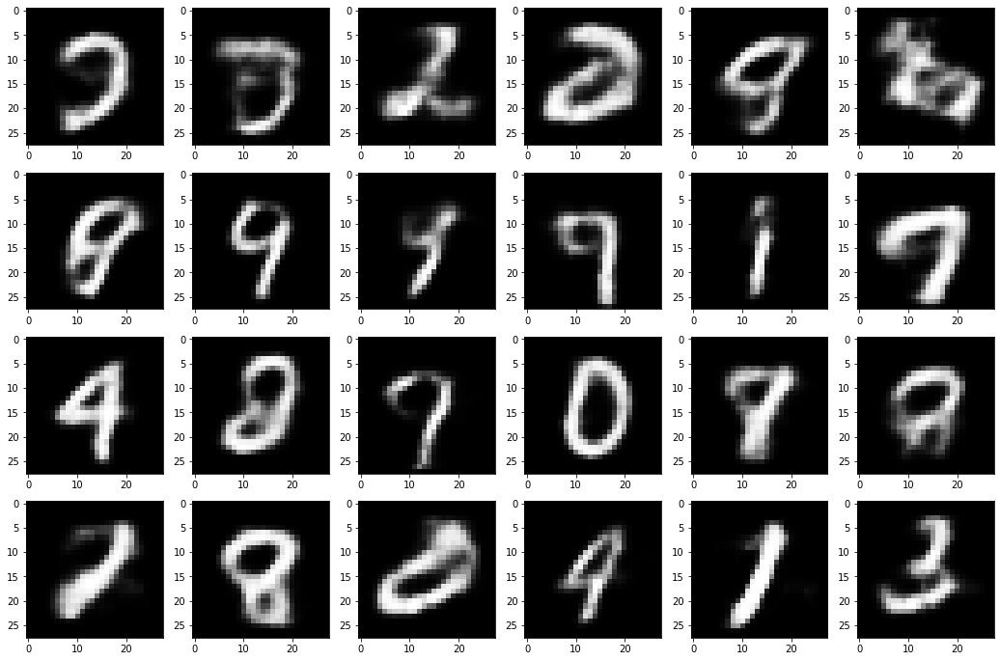

Epoch: 049: Enc Loss: 0.800, Dec Loss: 0.128, Disc Loss:0.688, IS: 2.510, IS_avr: 2.503
examples of generated images after 49 epochs


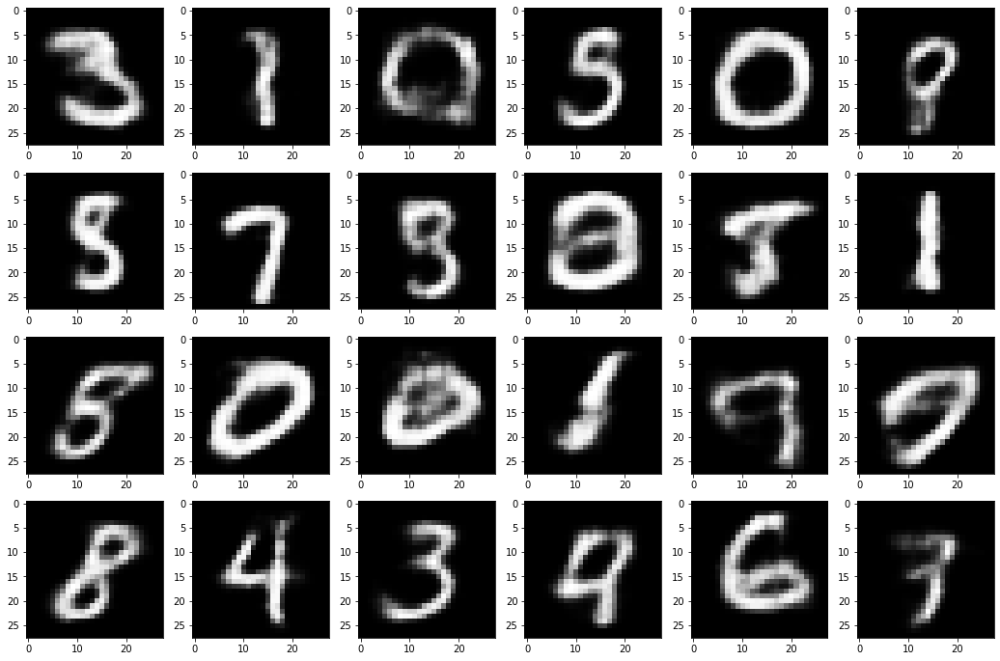

examples of generated images using average variables after 49 epochs


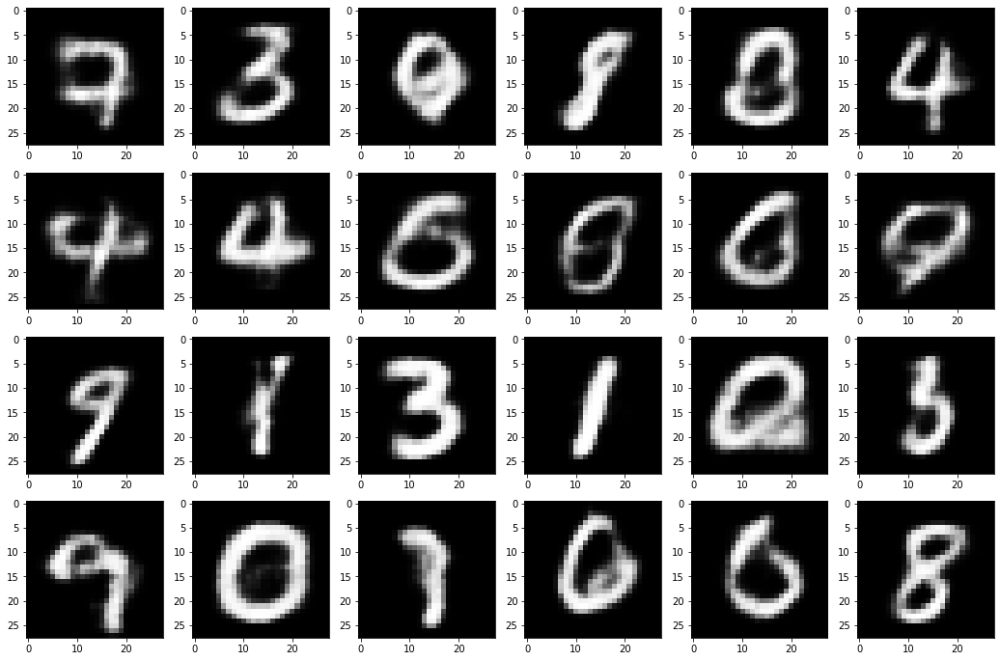

Epoch: 050: Enc Loss: 0.800, Dec Loss: 0.128, Disc Loss:0.688, IS: 2.489, IS_avr: 2.503
examples of generated images after 50 epochs


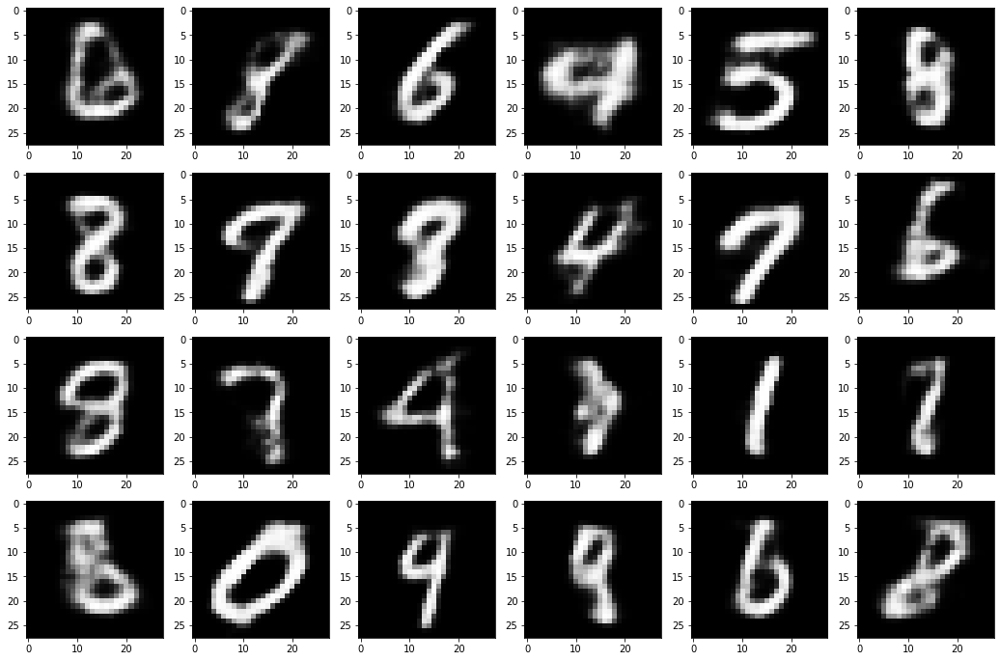

examples of generated images using average variables after 50 epochs


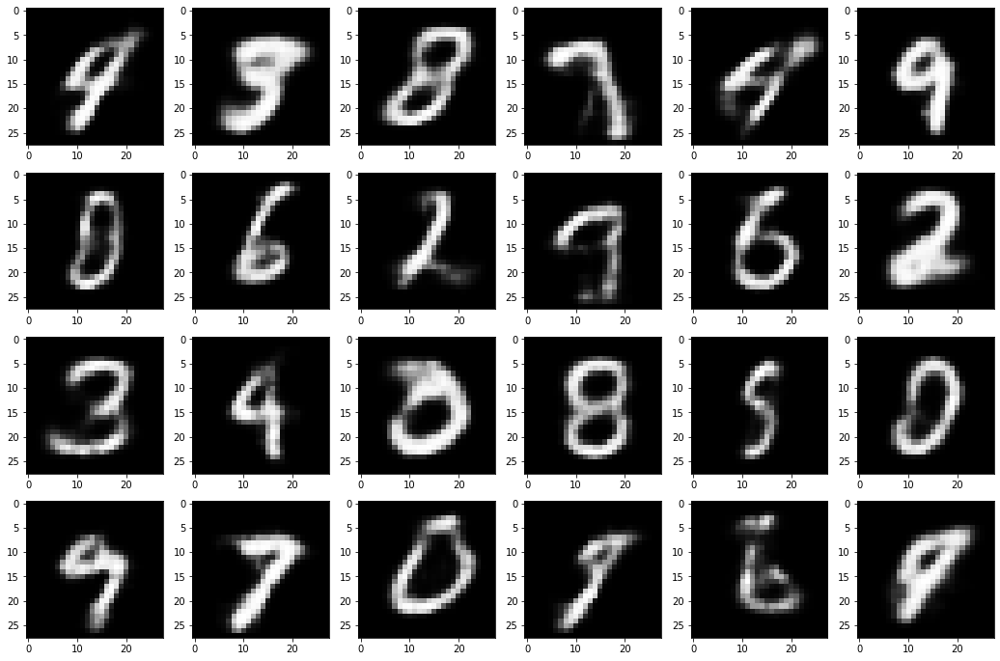

2663.779235


In [ ]:
aae.use_averaging = True
t0 = time.clock()
aae.train(epochs=25)
print(time.clock()-t0)

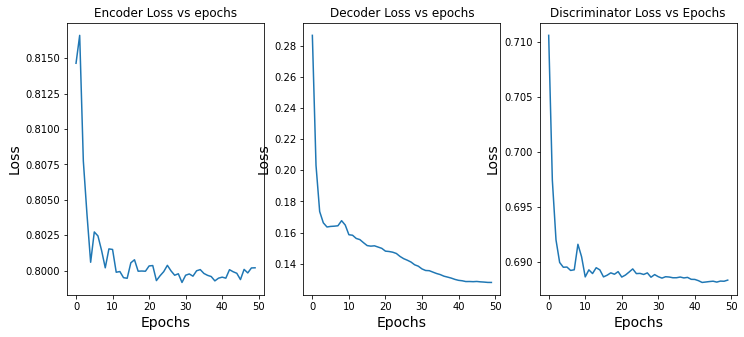

In [ ]:
aae.draw_losses_per_epoch_graphic()

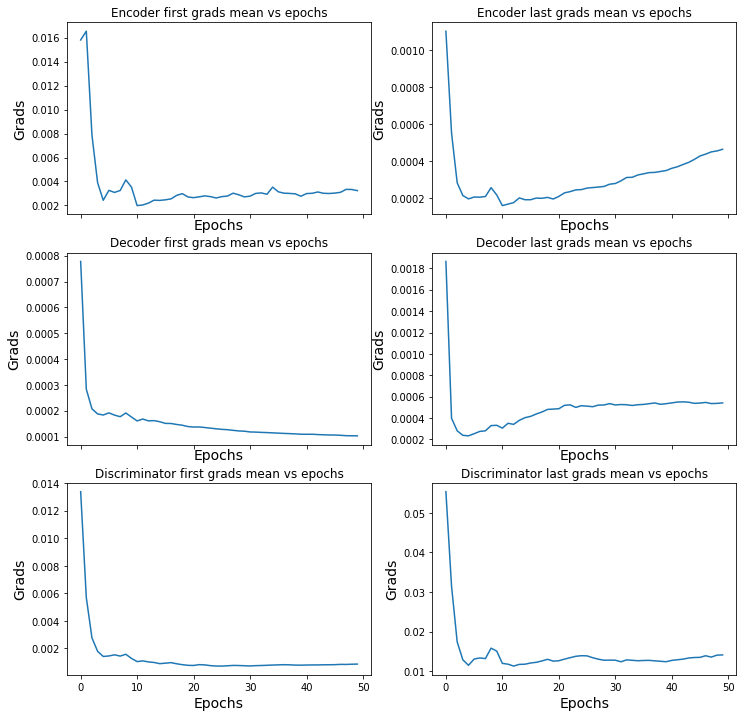

In [ ]:
aae.draw_grads_per_epoch_graphic()

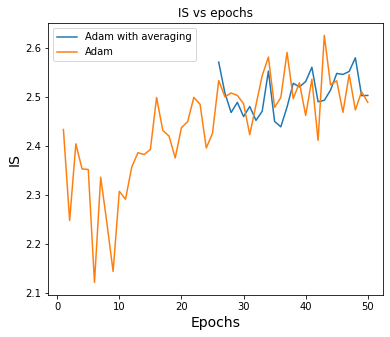

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(6, 5))
axes.set_xlabel("Epochs", fontsize=14)
axes.set_ylabel("IS", fontsize=14)
axes.set_title('IS vs epochs')
x1 = [x for x in (np.arange(25)+26)]
axes.plot(x1, aae.IS_for_avr_per_epoch, label = 'Adam with averaging')
x2 = [x for x in (np.arange(50)+1)]
axes.plot(x2, aae.IS_per_epoch, label = 'Adam')
axes.legend()
plt.show()

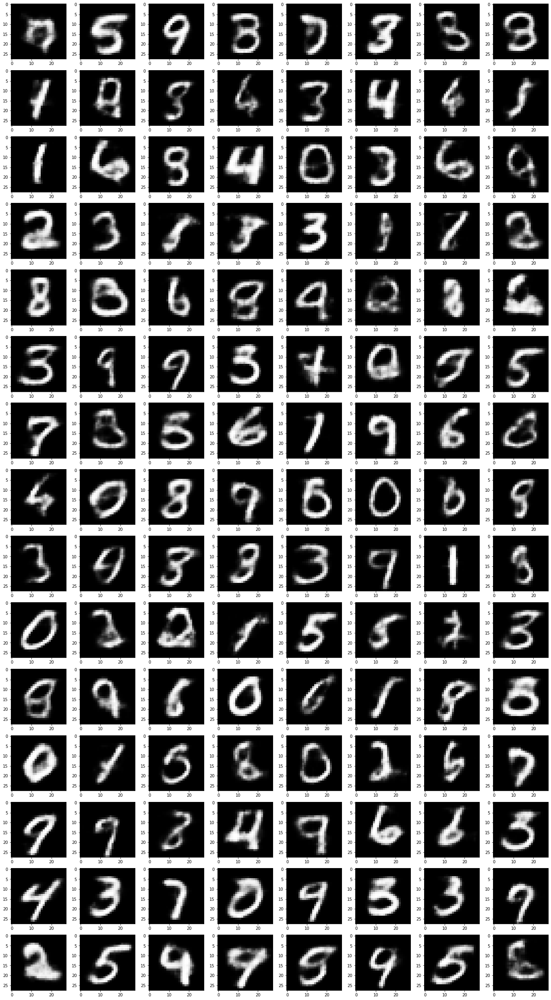

In [ ]:
aae.draw_generated_images(rows=15, cols=8)

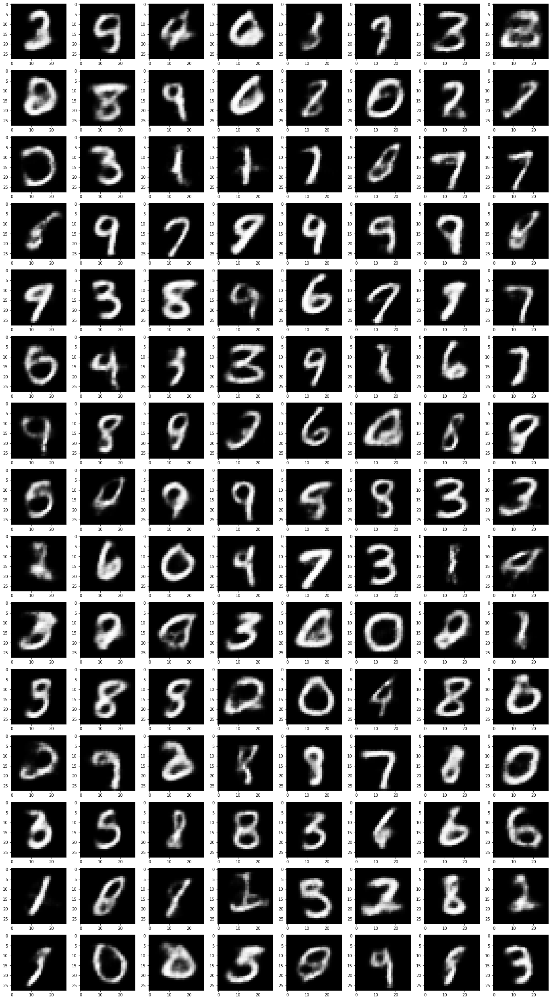

In [ ]:
aae.draw_generated_images(rows=15, cols=8, is_from_gen_avr=True)

**OptimisticAdam**

Epoch: 051: Enc Loss: 0.797, Dec Loss: 0.165, Disc Loss:0.688, IS: 2.212
examples of generated images after 51 epochs


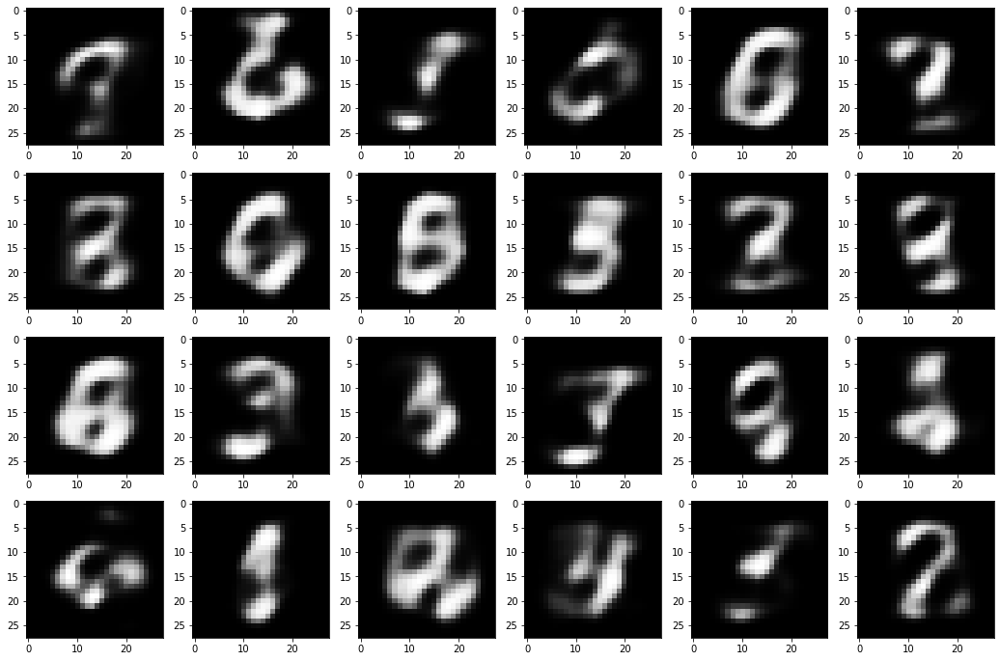

Epoch: 052: Enc Loss: 0.797, Dec Loss: 0.166, Disc Loss:0.688, IS: 2.236
examples of generated images after 52 epochs


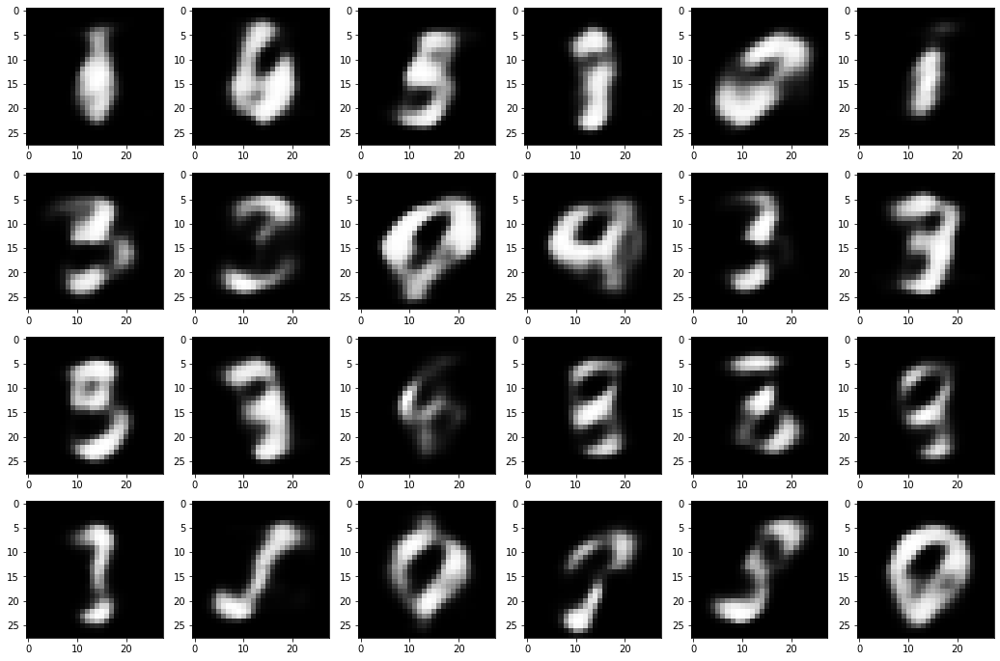

Epoch: 053: Enc Loss: 0.799, Dec Loss: 0.165, Disc Loss:0.687, IS: 2.274
examples of generated images after 53 epochs


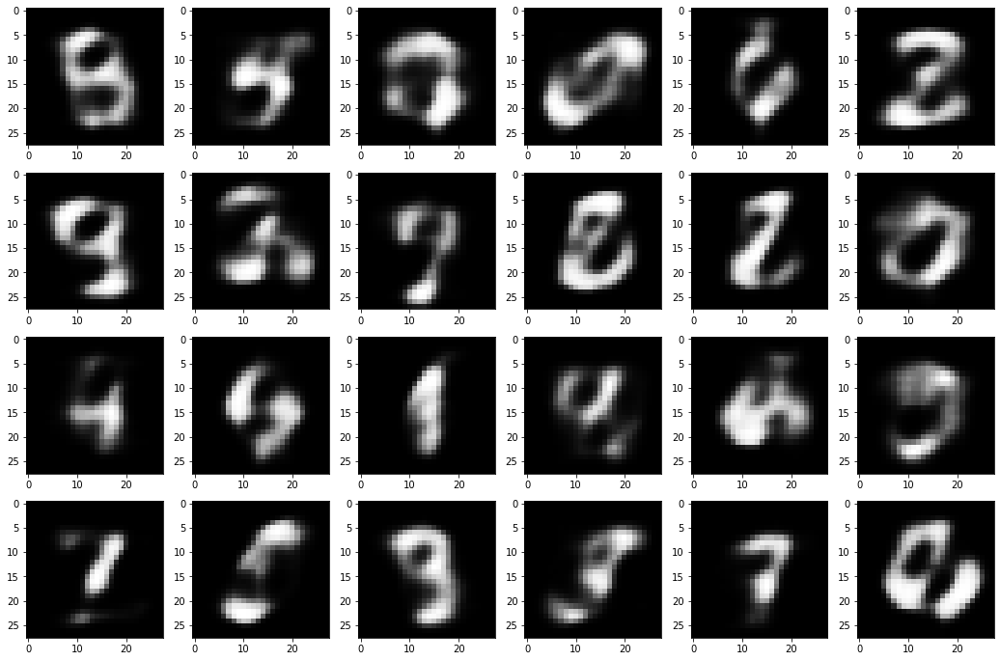

Epoch: 054: Enc Loss: 0.801, Dec Loss: 0.164, Disc Loss:0.687, IS: 2.242
examples of generated images after 54 epochs


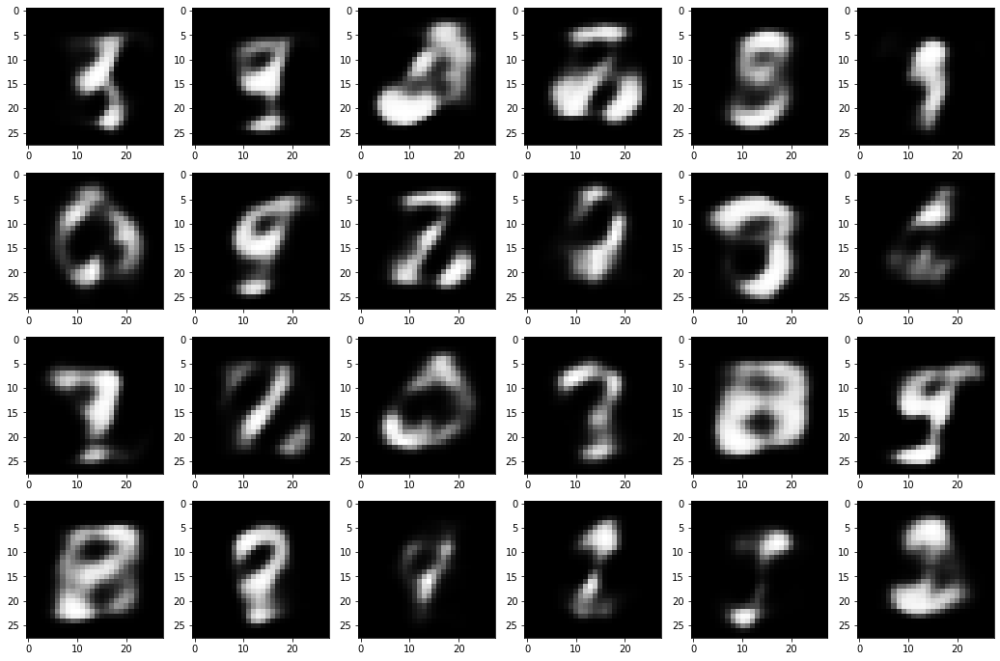

Epoch: 055: Enc Loss: 0.800, Dec Loss: 0.164, Disc Loss:0.688, IS: 2.190
examples of generated images after 55 epochs


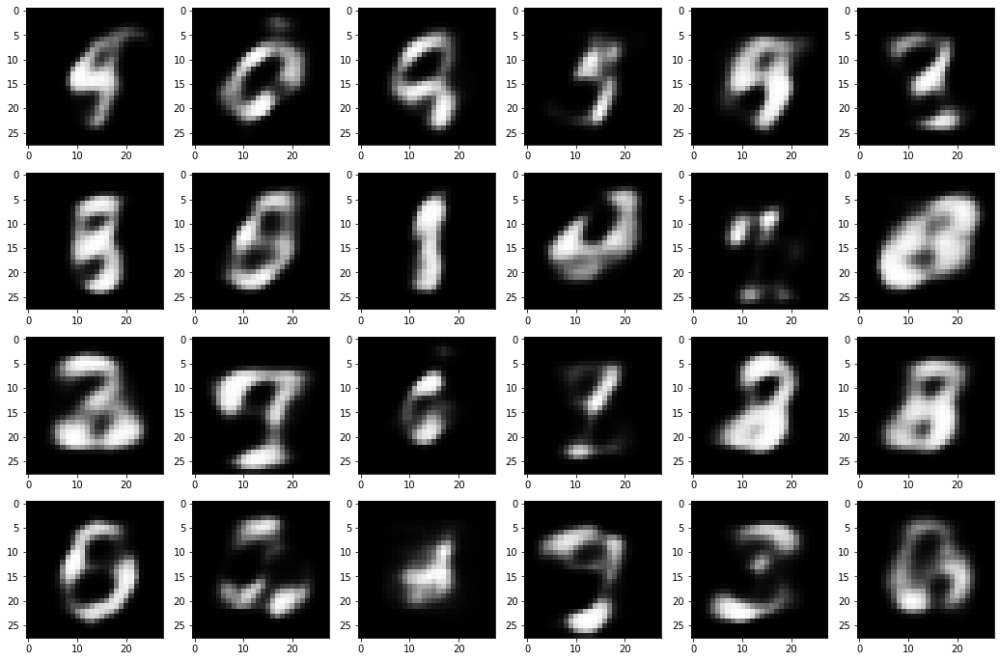

Epoch: 056: Enc Loss: 0.798, Dec Loss: 0.165, Disc Loss:0.689, IS: 2.216
examples of generated images after 56 epochs


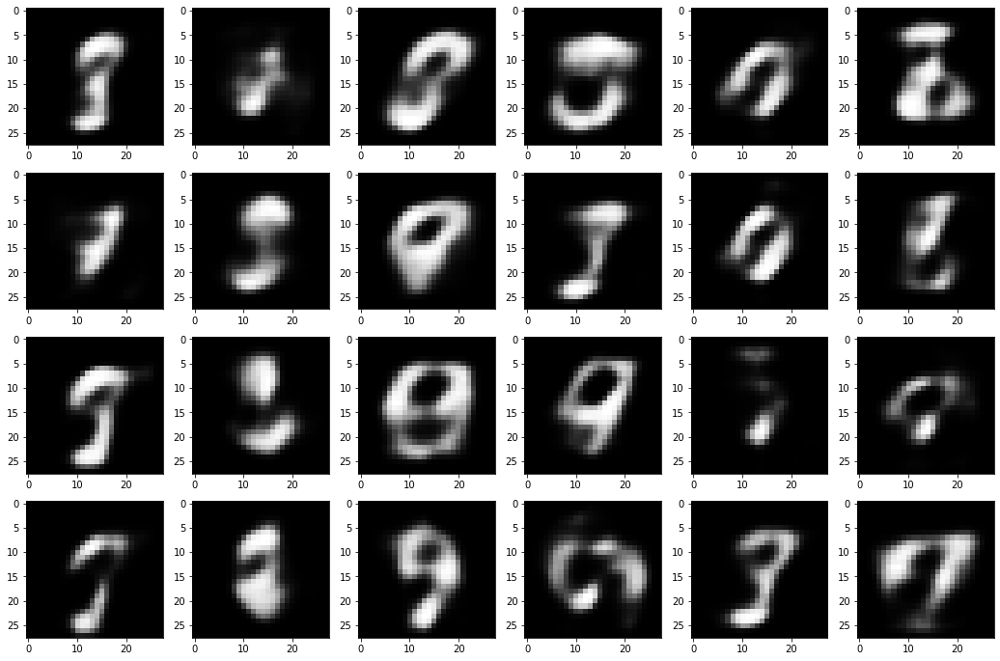

Epoch: 057: Enc Loss: 0.798, Dec Loss: 0.165, Disc Loss:0.689, IS: 2.246
examples of generated images after 57 epochs


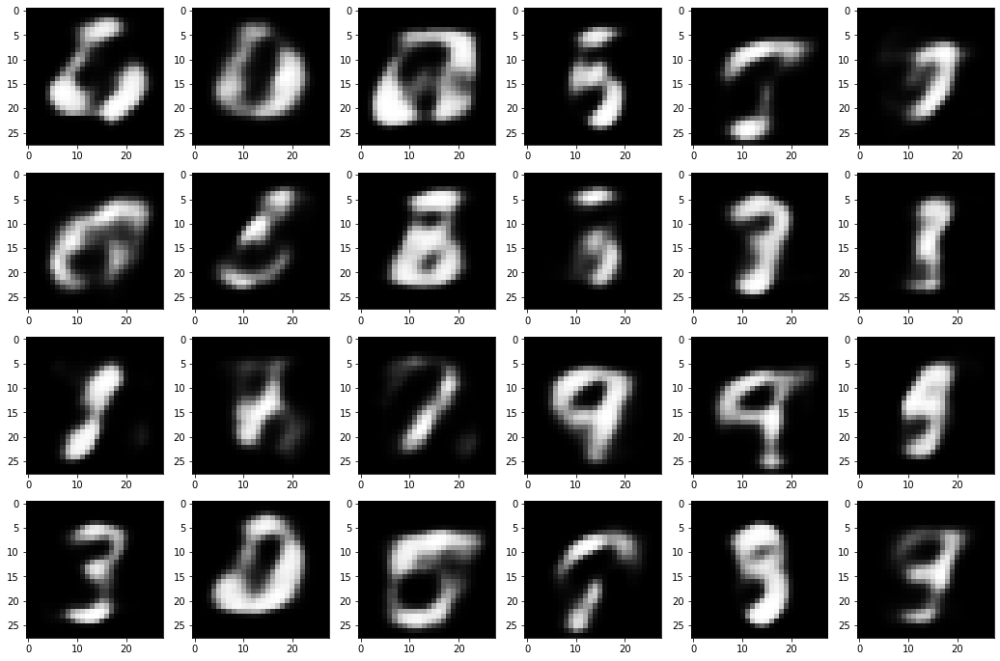

Epoch: 058: Enc Loss: 0.799, Dec Loss: 0.164, Disc Loss:0.688, IS: 2.292
examples of generated images after 58 epochs


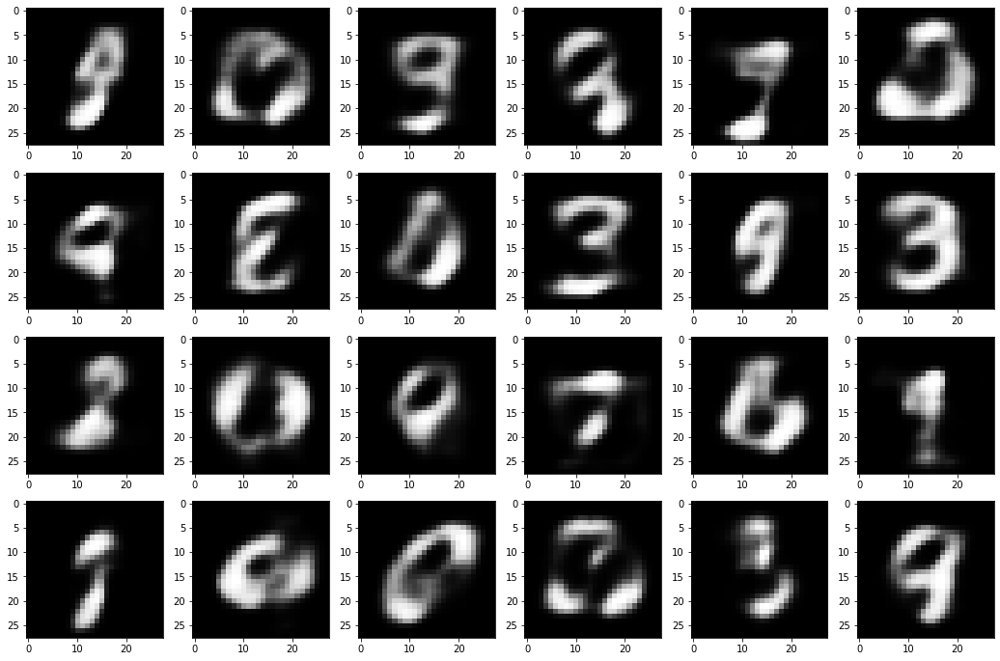

Epoch: 059: Enc Loss: 0.800, Dec Loss: 0.164, Disc Loss:0.688, IS: 2.223
examples of generated images after 59 epochs


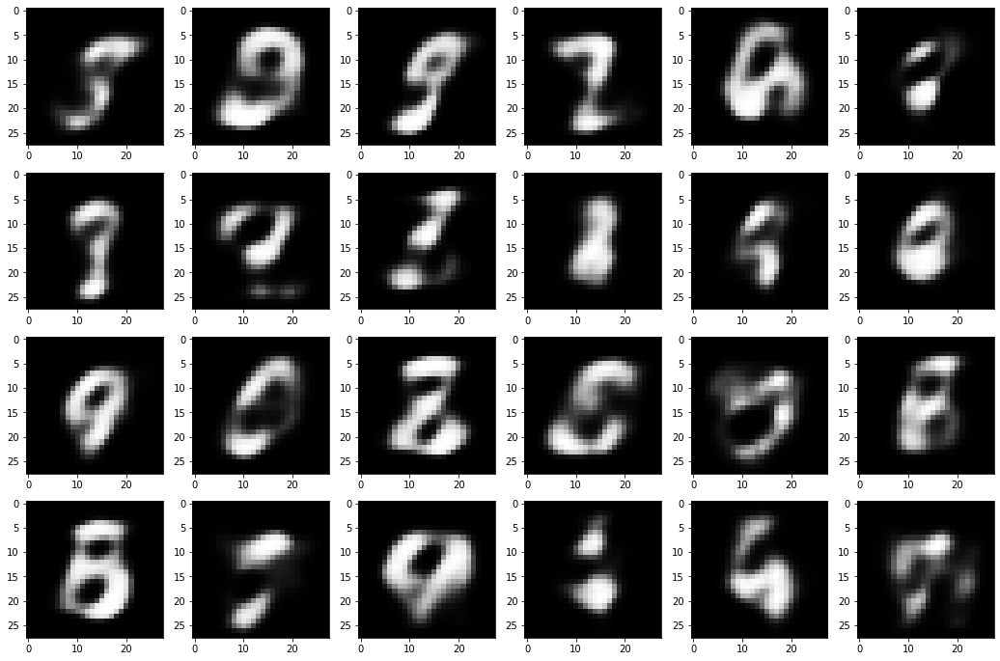

Epoch: 060: Enc Loss: 0.800, Dec Loss: 0.163, Disc Loss:0.688, IS: 2.278
examples of generated images after 60 epochs


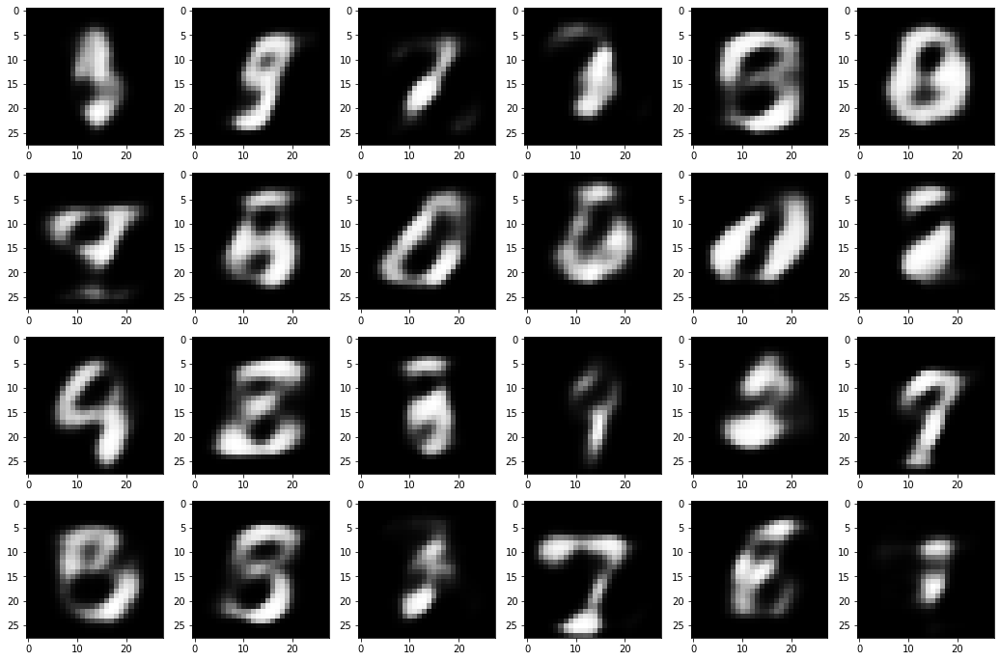

862.747634


In [ ]:
aae = AAE(OptimisticAdam(learning_rate=0.00002, beta_1=0.5), x_train, batch_size=64,
          use_averaging=False, path='/content/drive/My Drive/Diploma/Save models/AAE OptimisticAdam/')
aae.upload_from_file(epoch=50)
t0 = time.clock()
aae.train(epochs=10)
print(time.clock()-t0)

Epoch: 026: Enc Loss: 0.801, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.294, IS_avr: 2.250
examples of generated images after 26 epochs


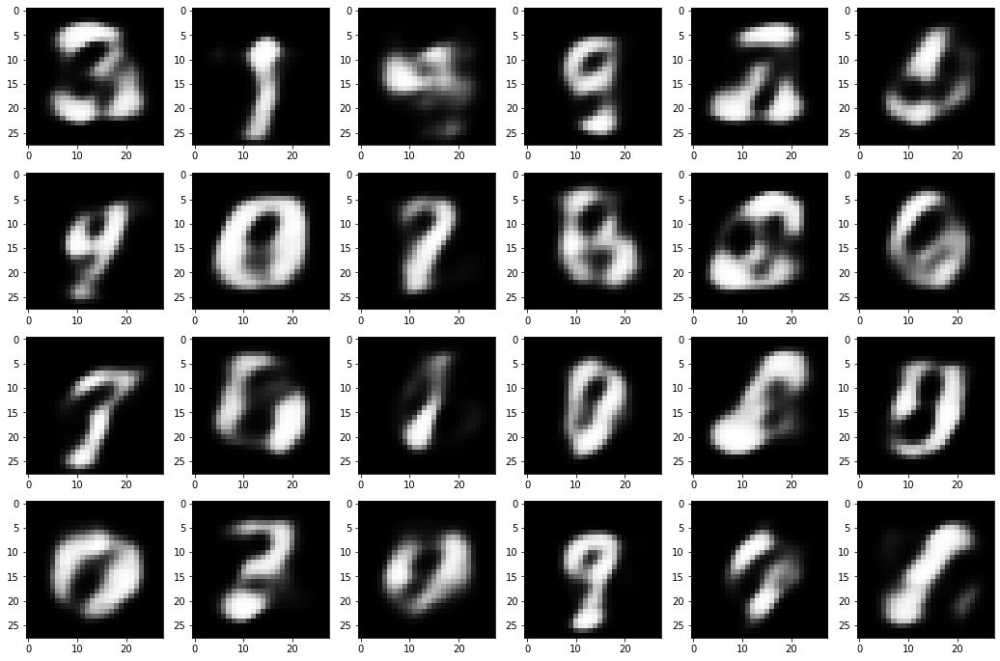

examples of generated images using average variables after 26 epochs


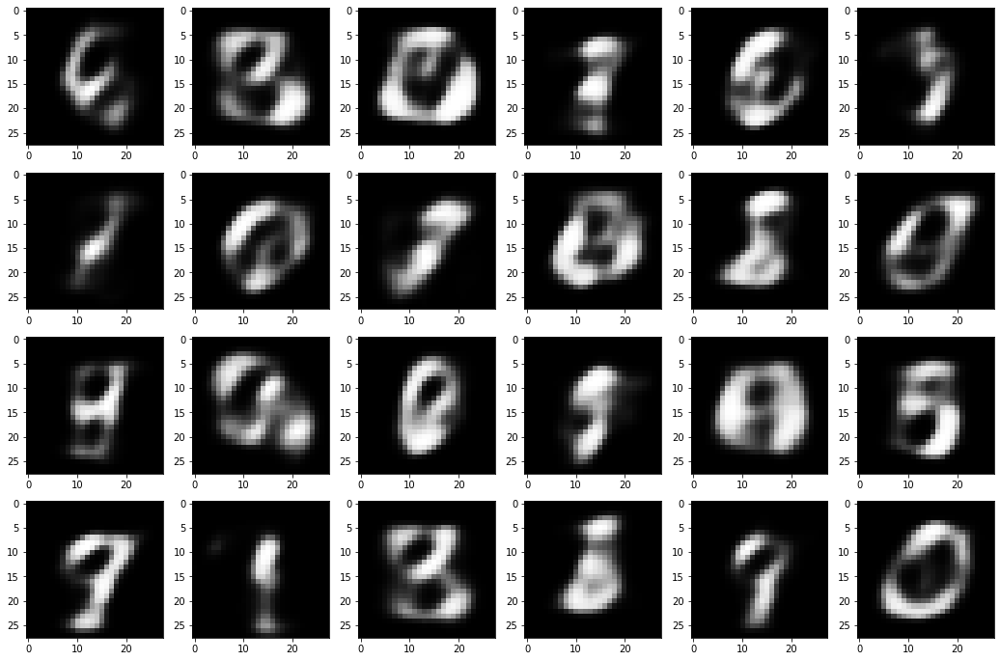

Epoch: 027: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.283, IS_avr: 2.309
examples of generated images after 27 epochs


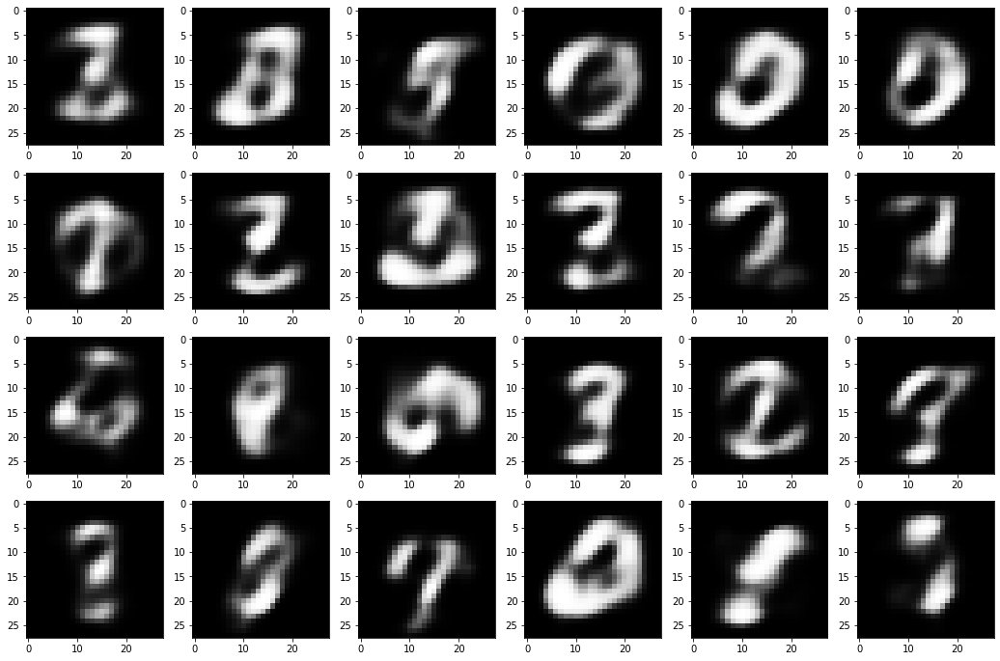

examples of generated images using average variables after 27 epochs


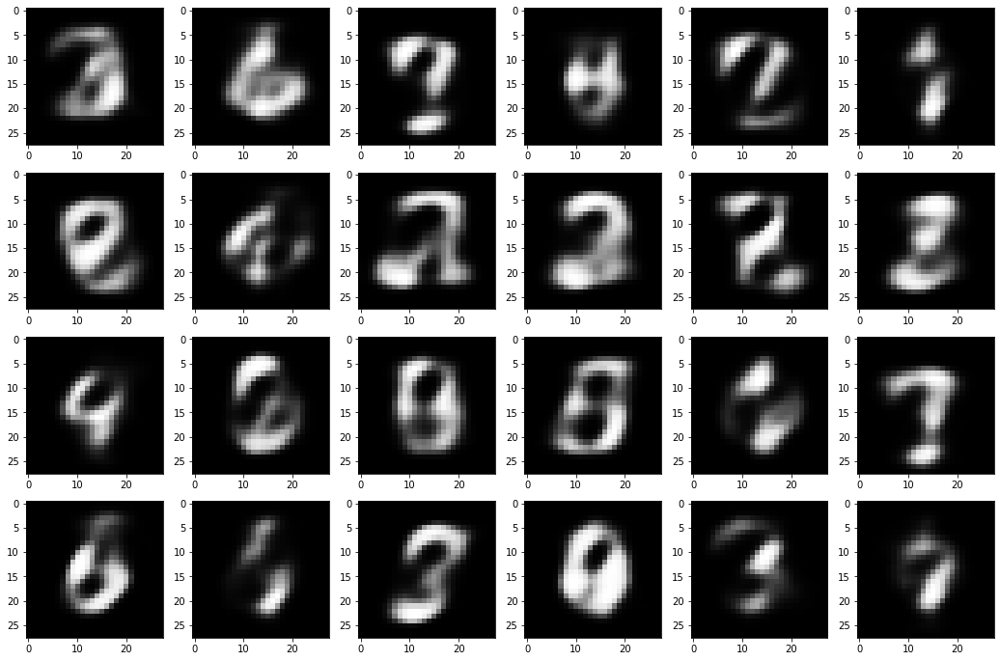

Epoch: 028: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.294, IS_avr: 2.216
examples of generated images after 28 epochs


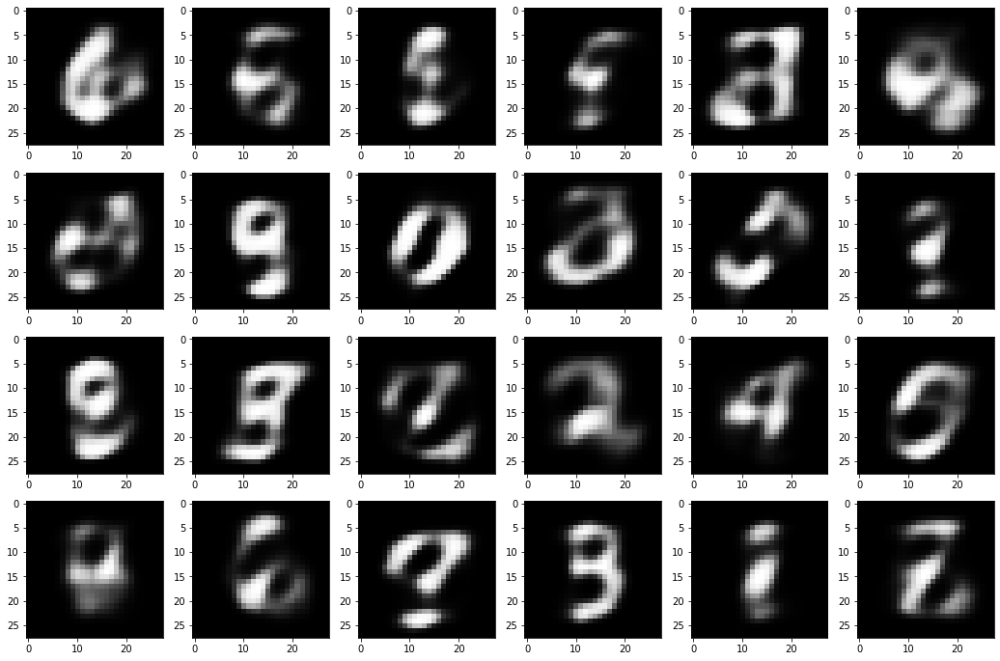

examples of generated images using average variables after 28 epochs


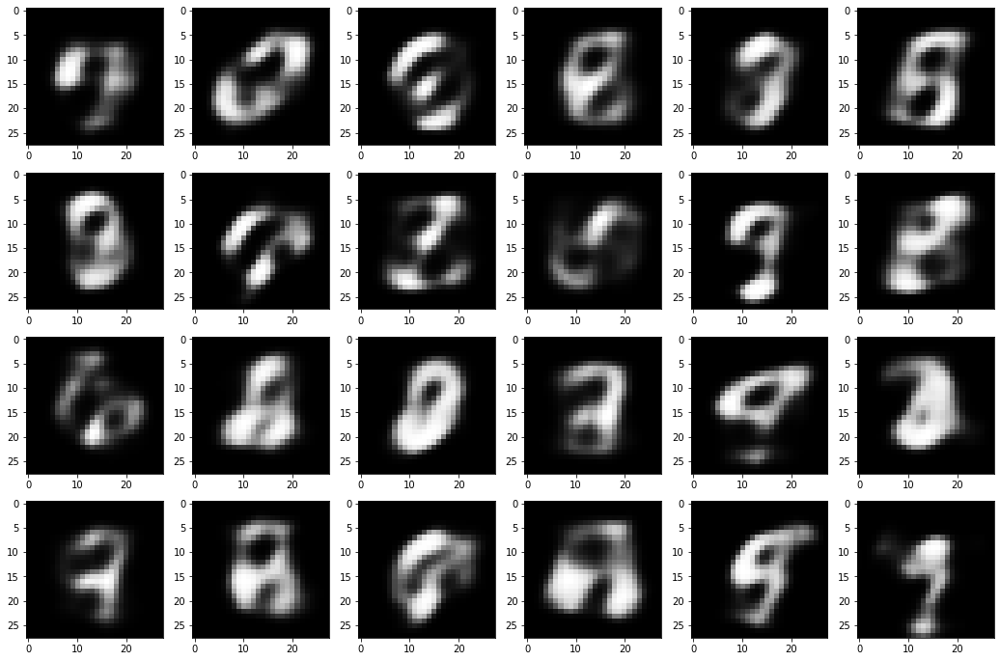

Epoch: 029: Enc Loss: 0.801, Dec Loss: 0.167, Disc Loss:0.689, IS: 2.249, IS_avr: 2.174
examples of generated images after 29 epochs


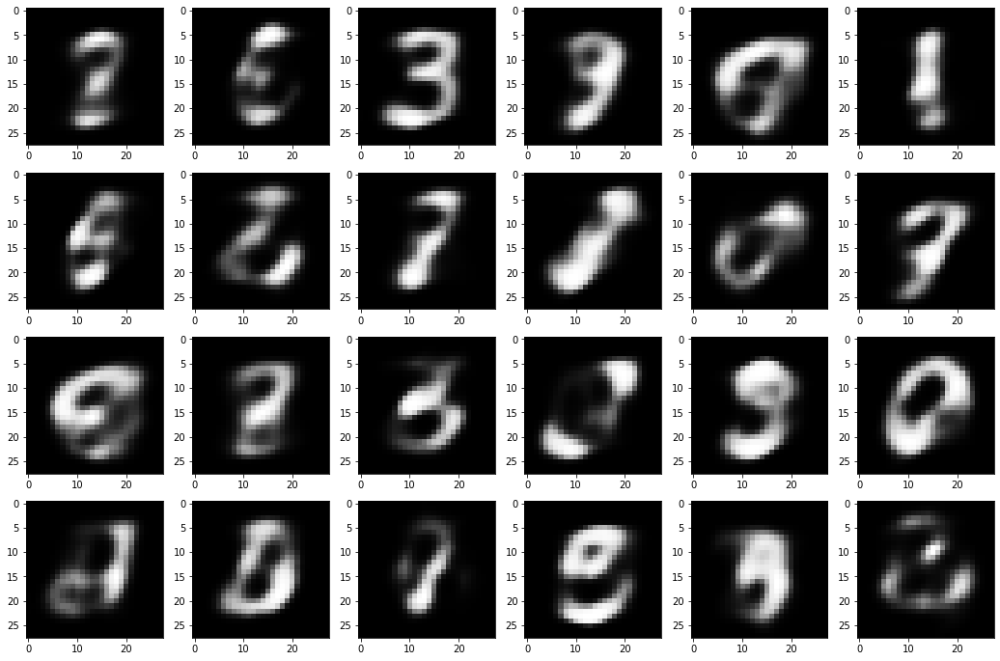

examples of generated images using average variables after 29 epochs


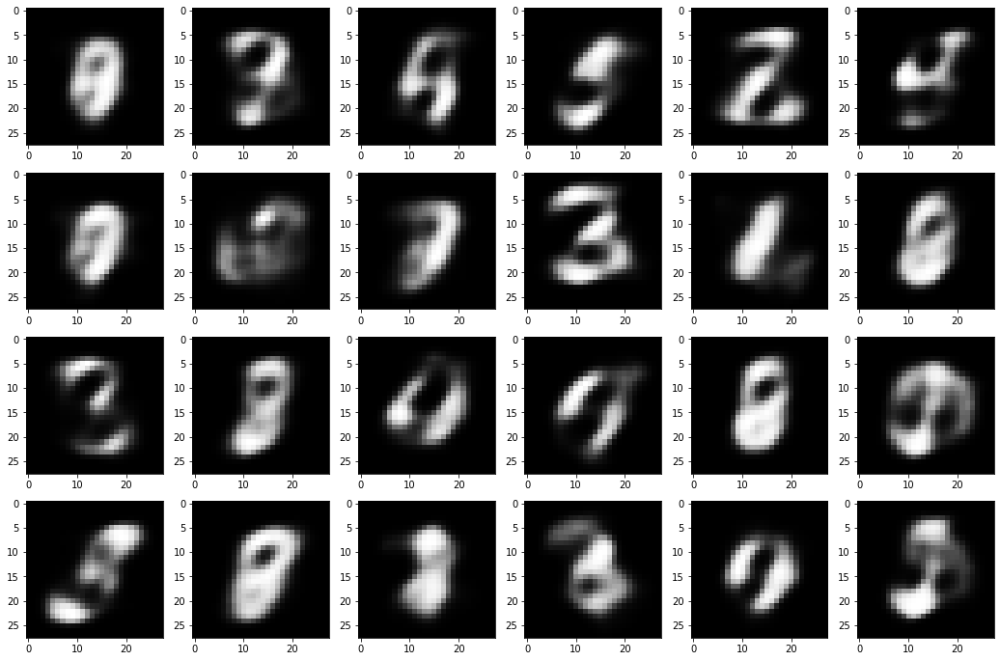

Epoch: 030: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.266, IS_avr: 2.078
examples of generated images after 30 epochs


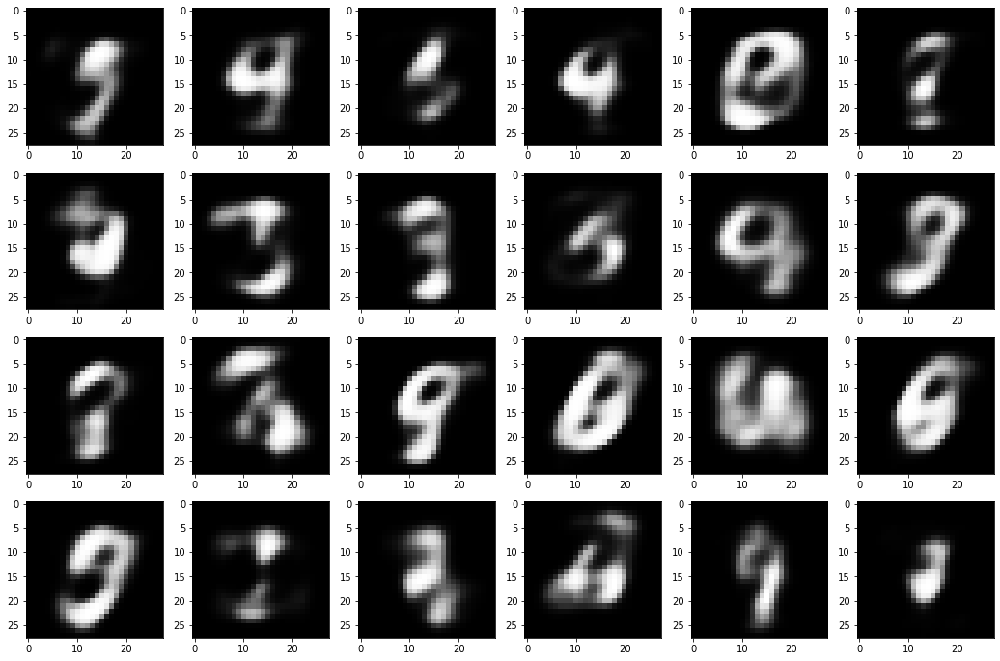

examples of generated images using average variables after 30 epochs


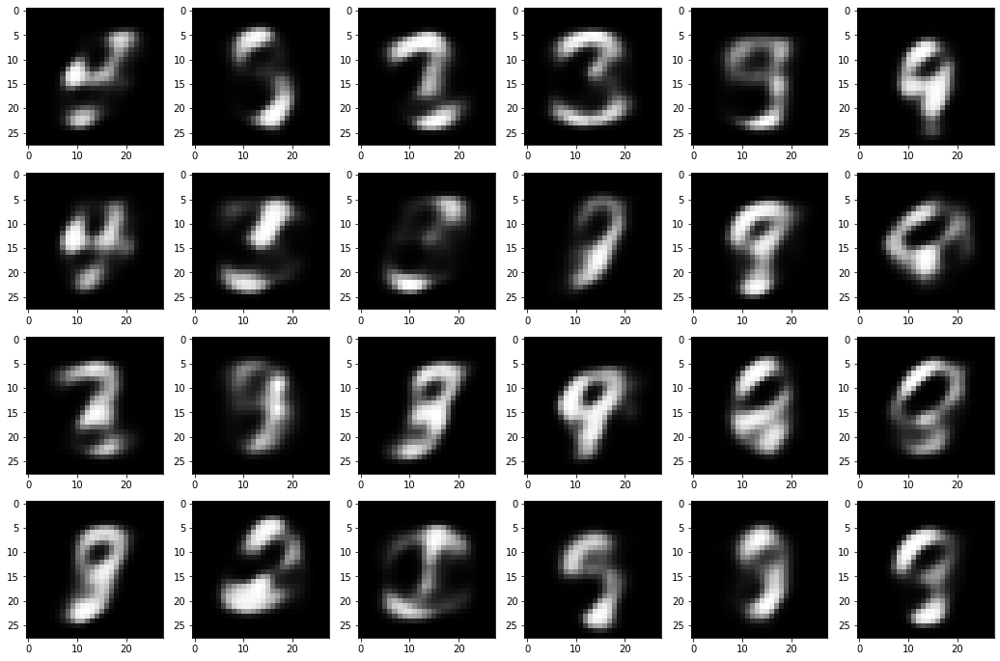

Epoch: 031: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.295, IS_avr: 2.082
examples of generated images after 31 epochs


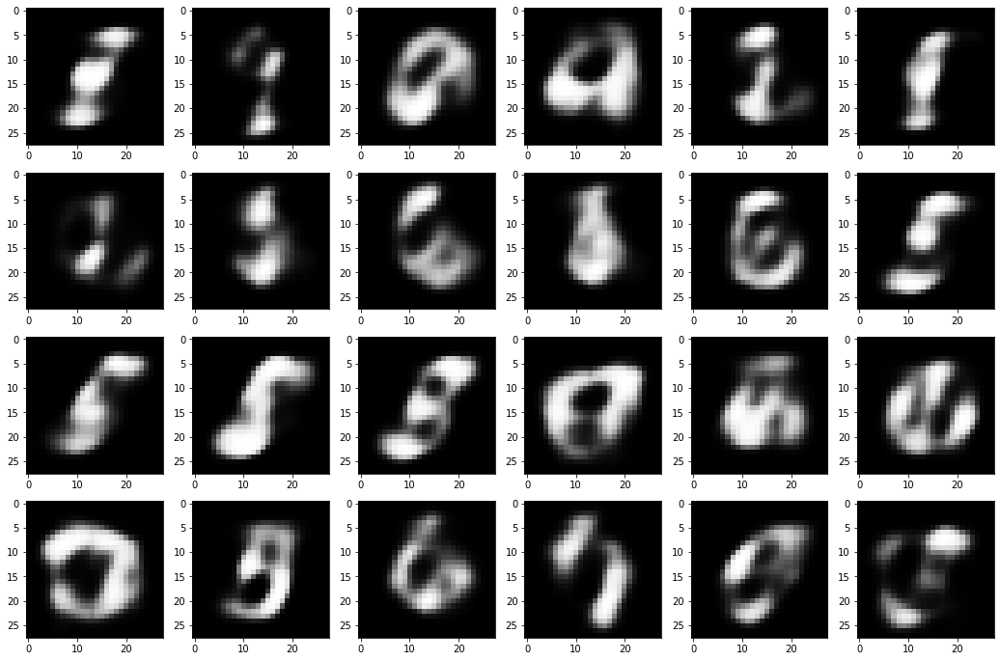

examples of generated images using average variables after 31 epochs


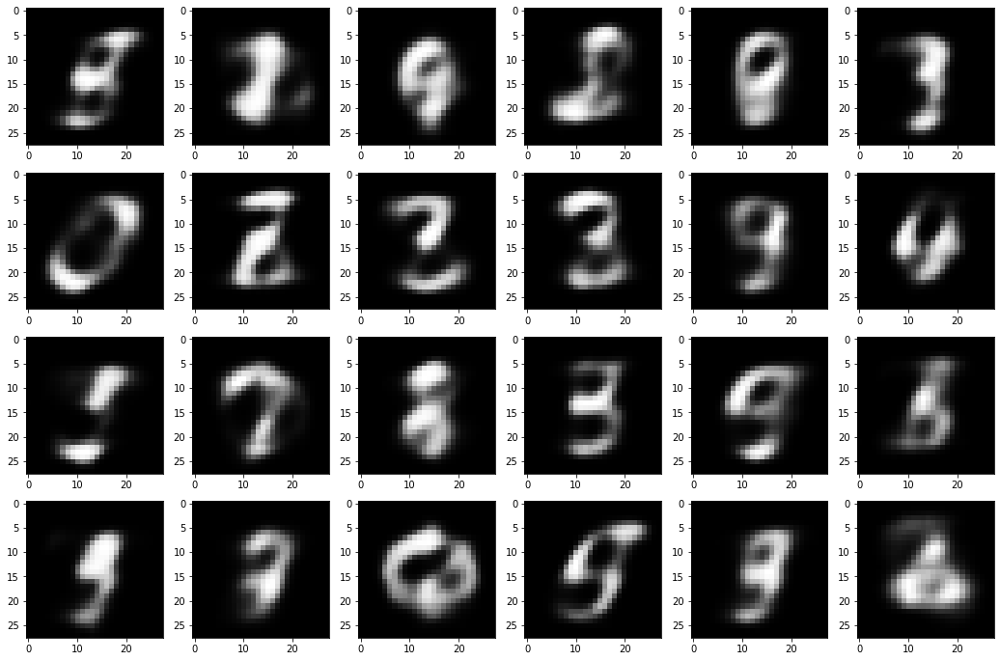

Epoch: 032: Enc Loss: 0.802, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.257, IS_avr: 2.085
examples of generated images after 32 epochs


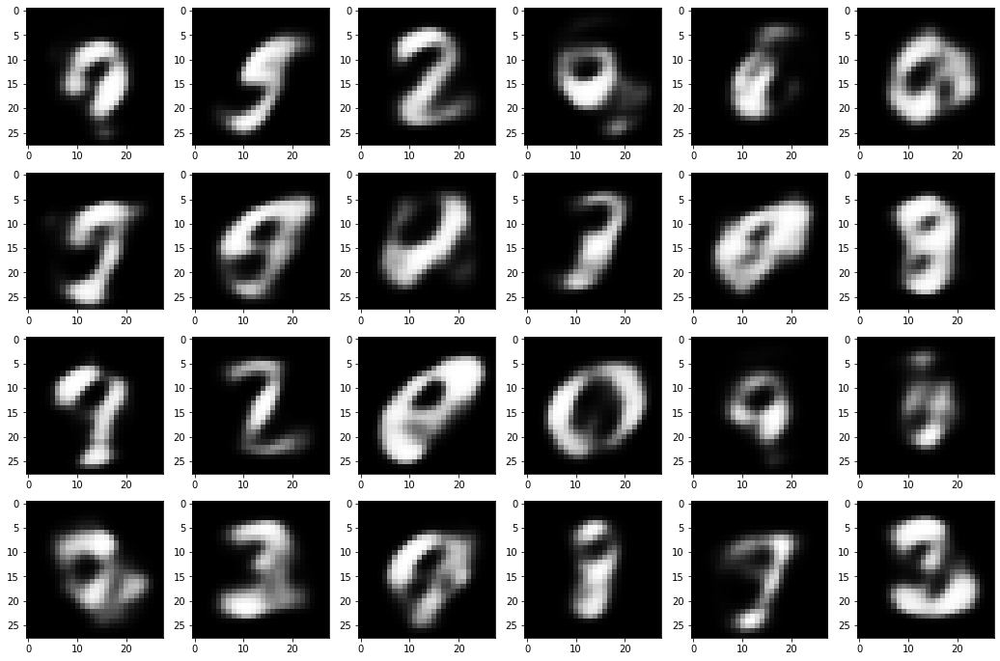

examples of generated images using average variables after 32 epochs


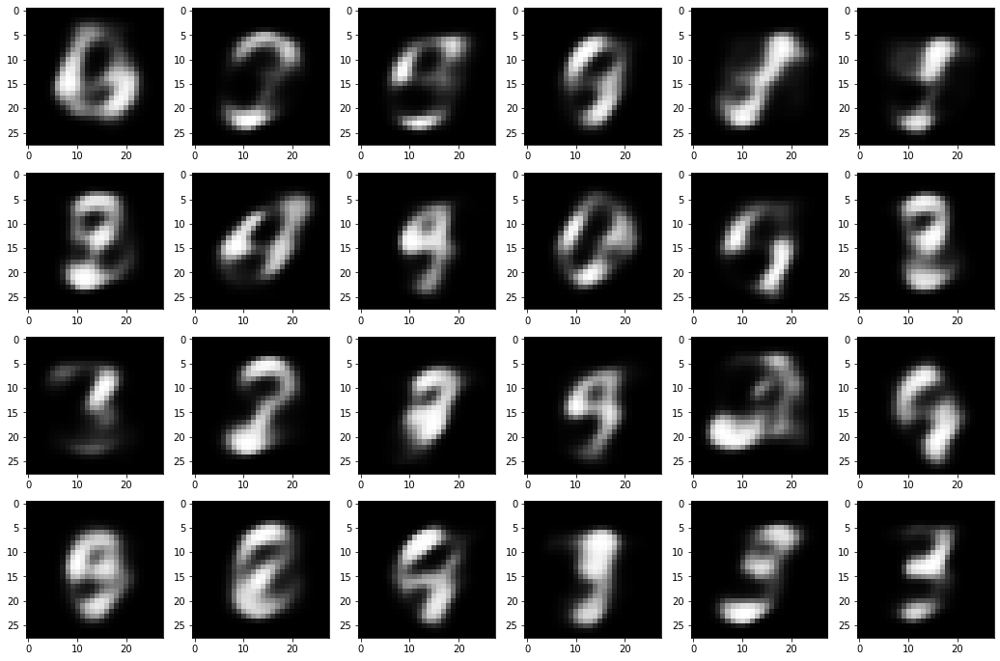

Epoch: 033: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.351, IS_avr: 2.065
examples of generated images after 33 epochs


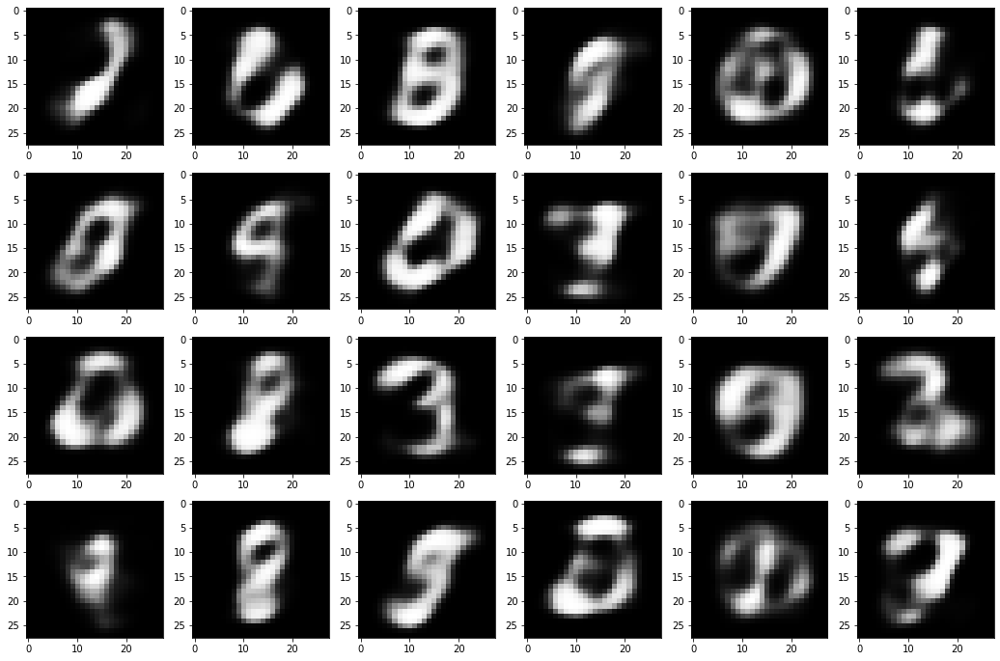

examples of generated images using average variables after 33 epochs


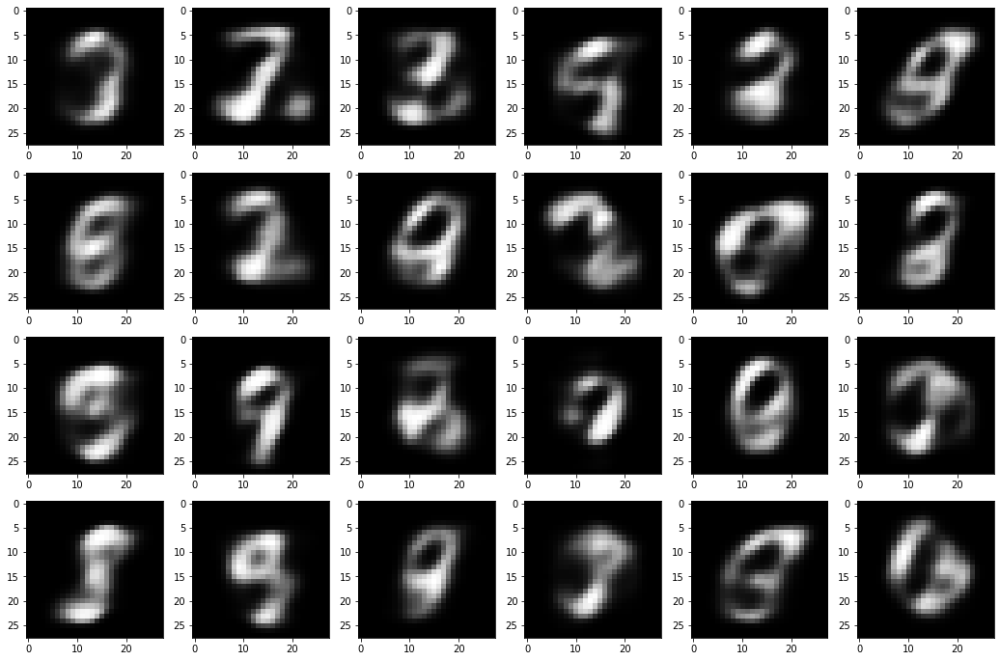

Epoch: 034: Enc Loss: 0.800, Dec Loss: 0.170, Disc Loss:0.689, IS: 2.255, IS_avr: 2.133
examples of generated images after 34 epochs


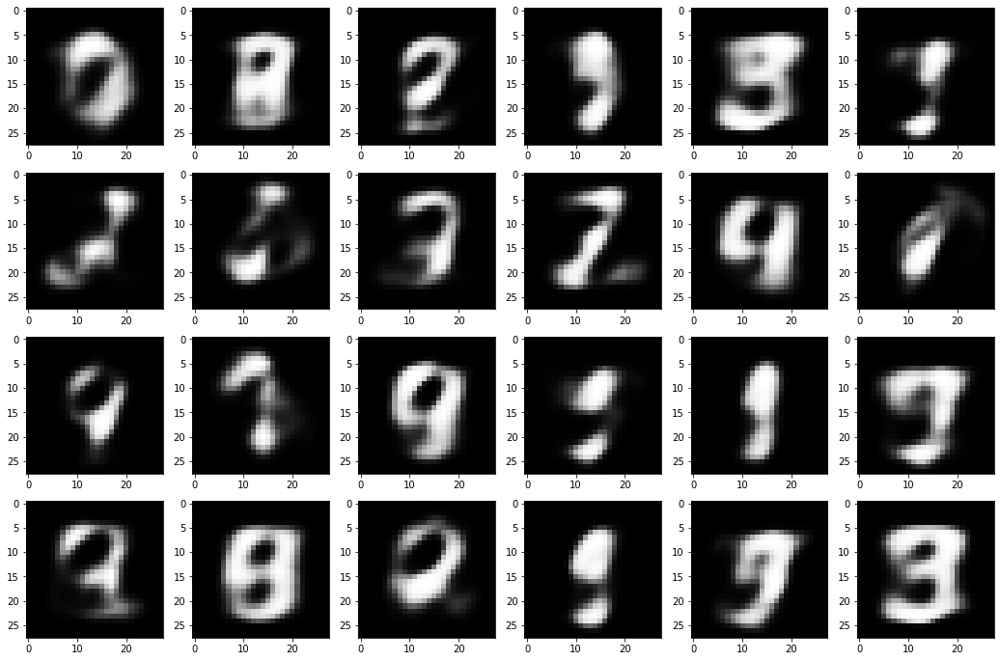

examples of generated images using average variables after 34 epochs


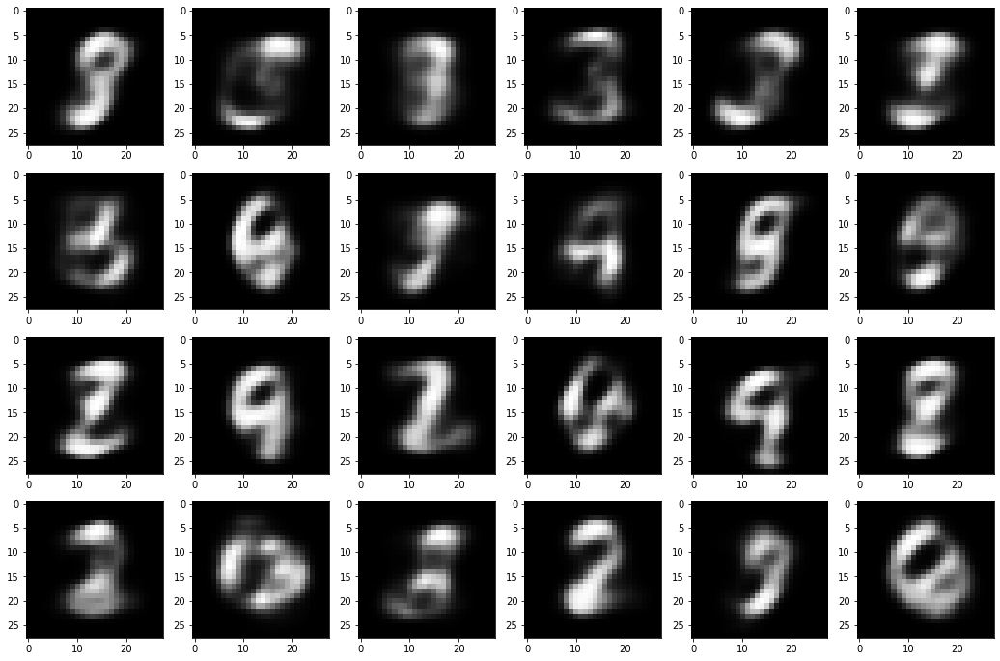

Epoch: 035: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.314, IS_avr: 1.999
examples of generated images after 35 epochs


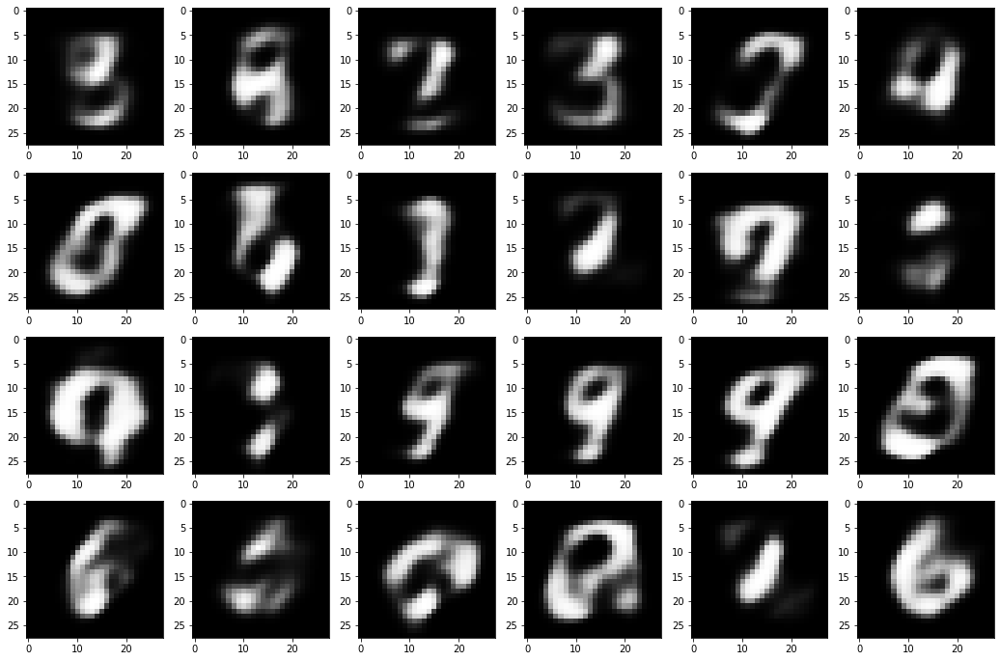

examples of generated images using average variables after 35 epochs


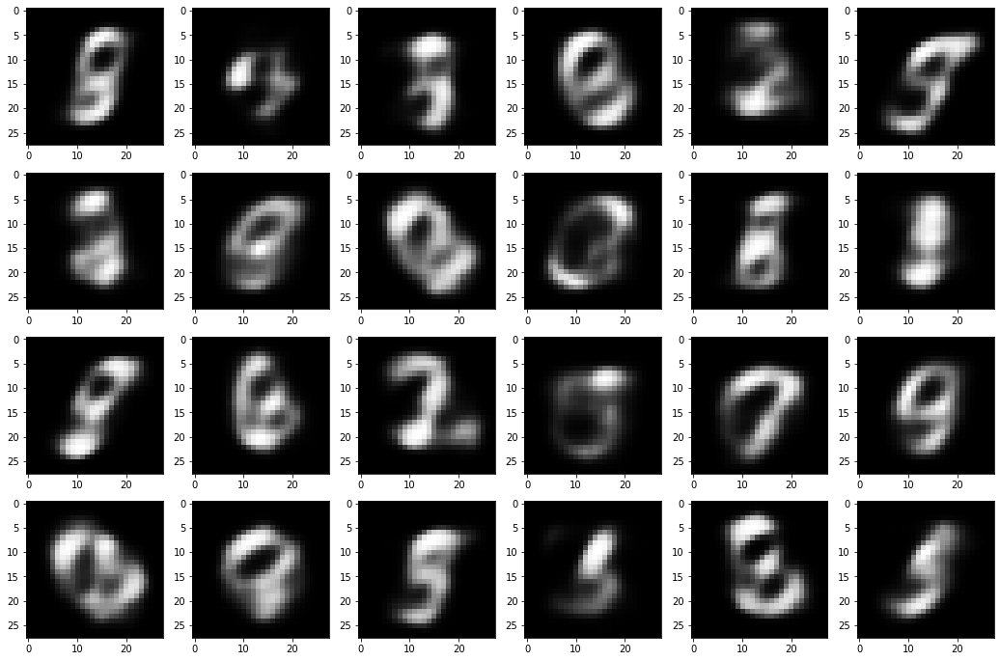

Epoch: 036: Enc Loss: 0.802, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.360, IS_avr: 2.045
examples of generated images after 36 epochs


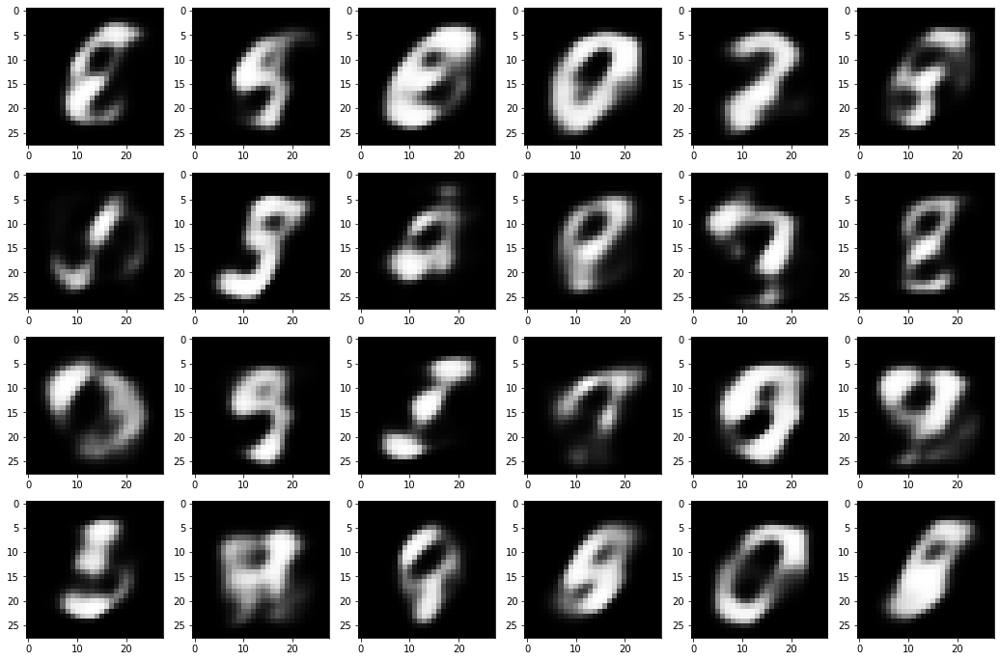

examples of generated images using average variables after 36 epochs


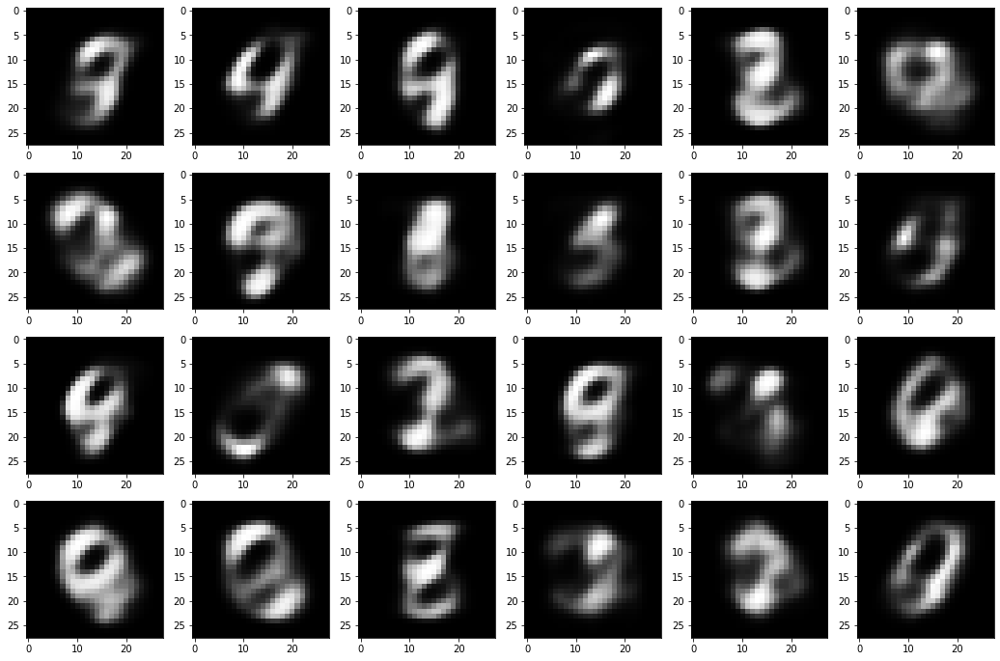

Epoch: 037: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.348, IS_avr: 2.076
examples of generated images after 37 epochs


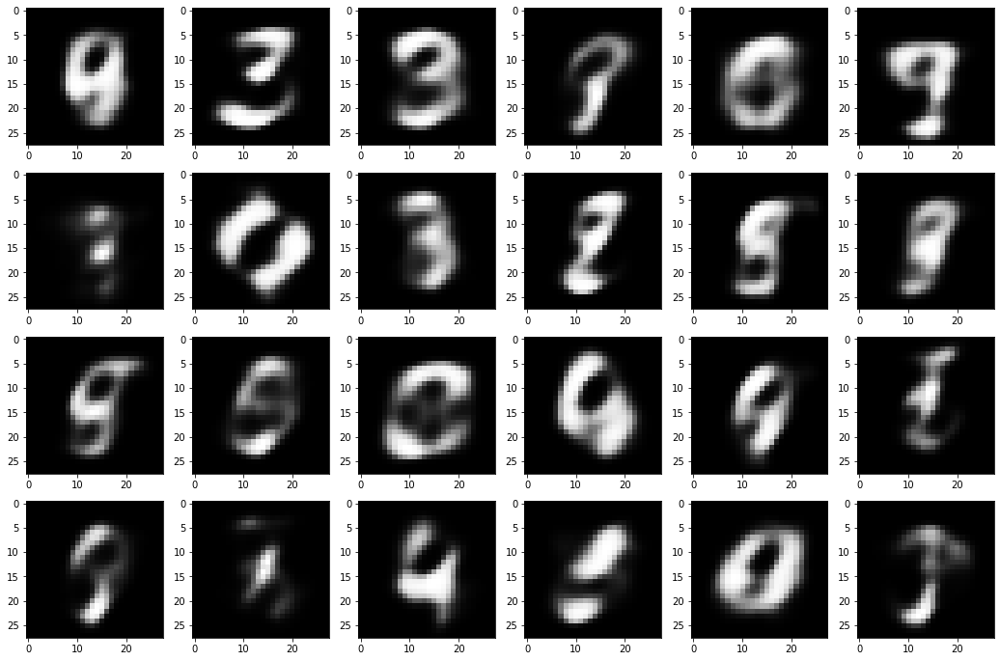

examples of generated images using average variables after 37 epochs


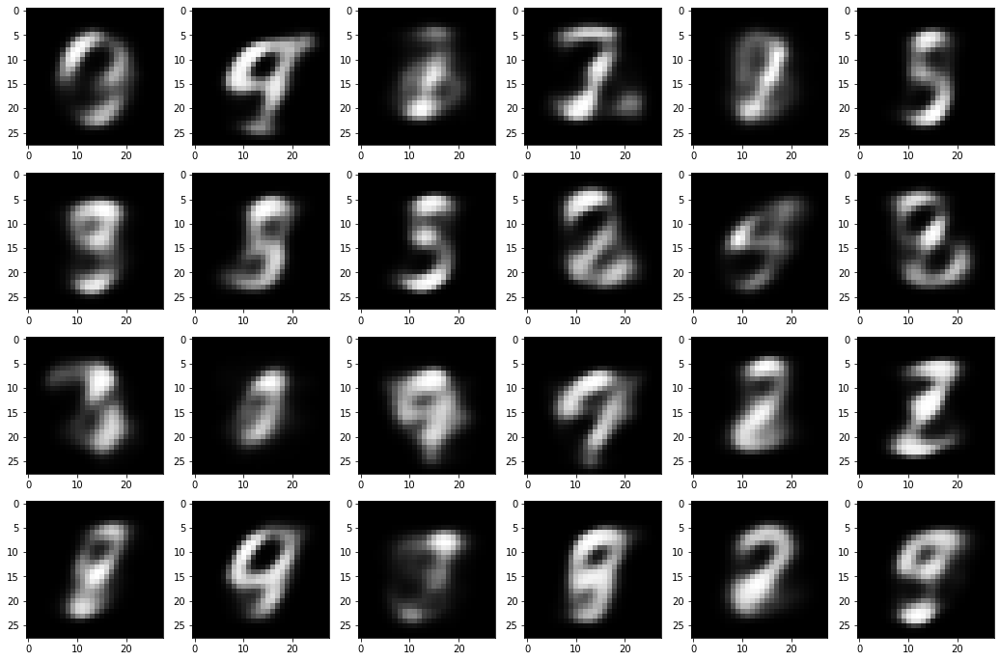

Epoch: 038: Enc Loss: 0.801, Dec Loss: 0.167, Disc Loss:0.689, IS: 2.266, IS_avr: 2.057
examples of generated images after 38 epochs


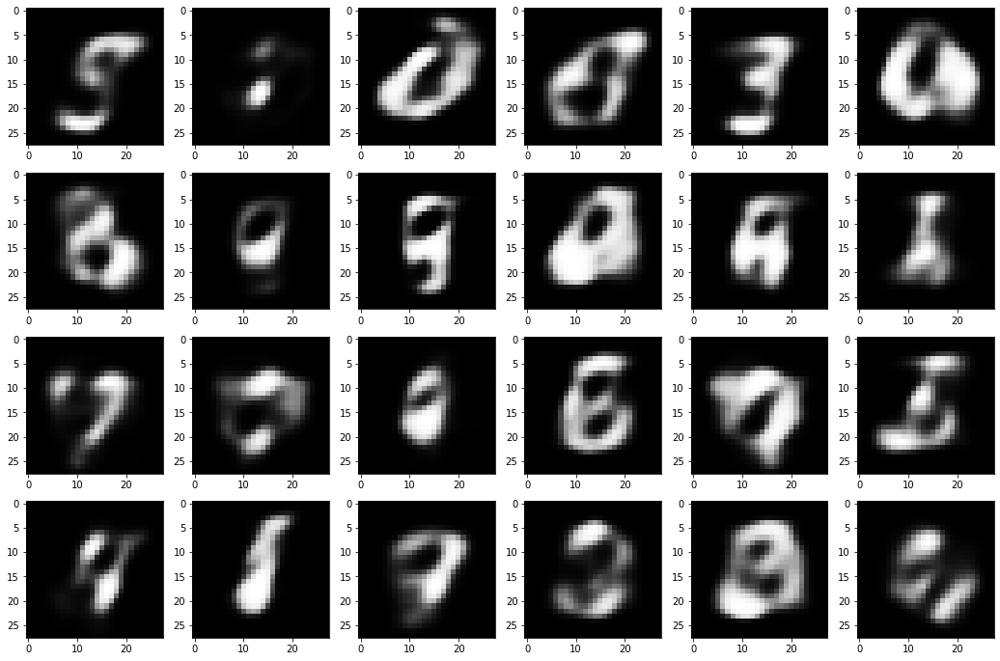

examples of generated images using average variables after 38 epochs


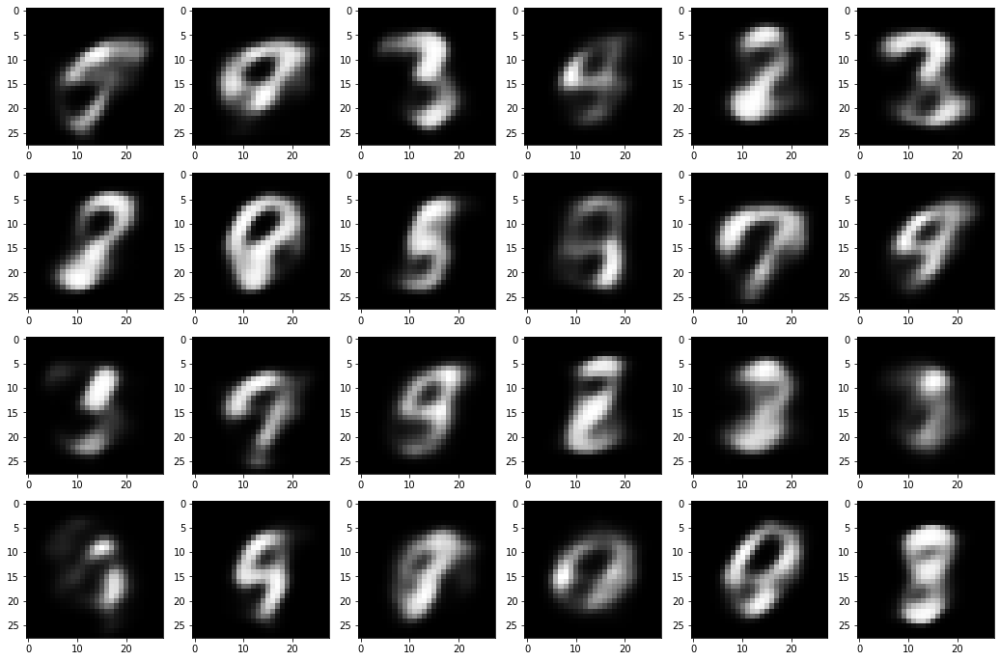

Epoch: 039: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.318, IS_avr: 2.122
examples of generated images after 39 epochs


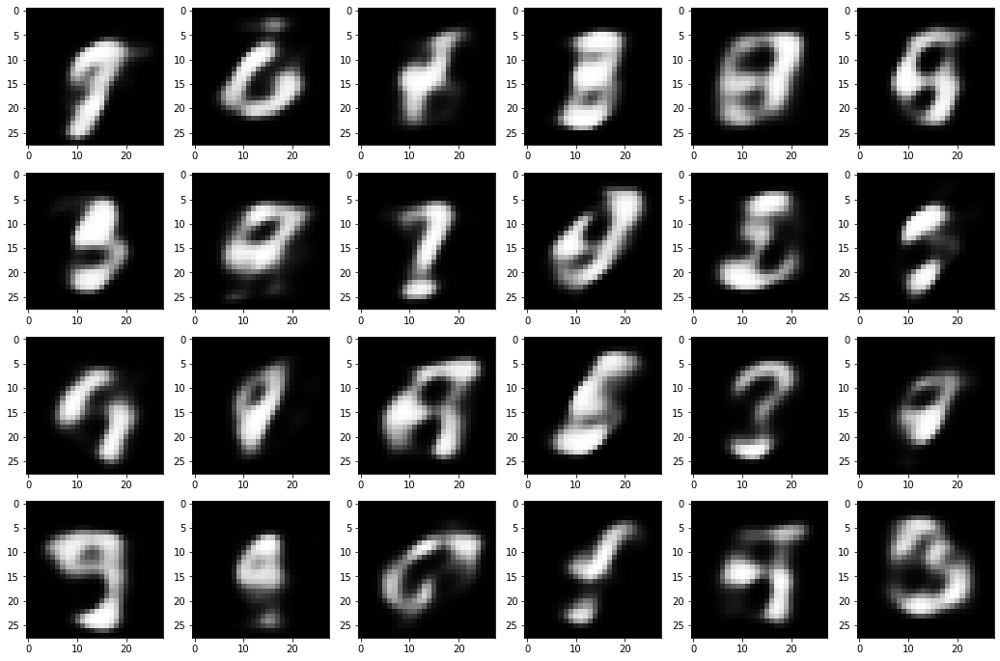

examples of generated images using average variables after 39 epochs


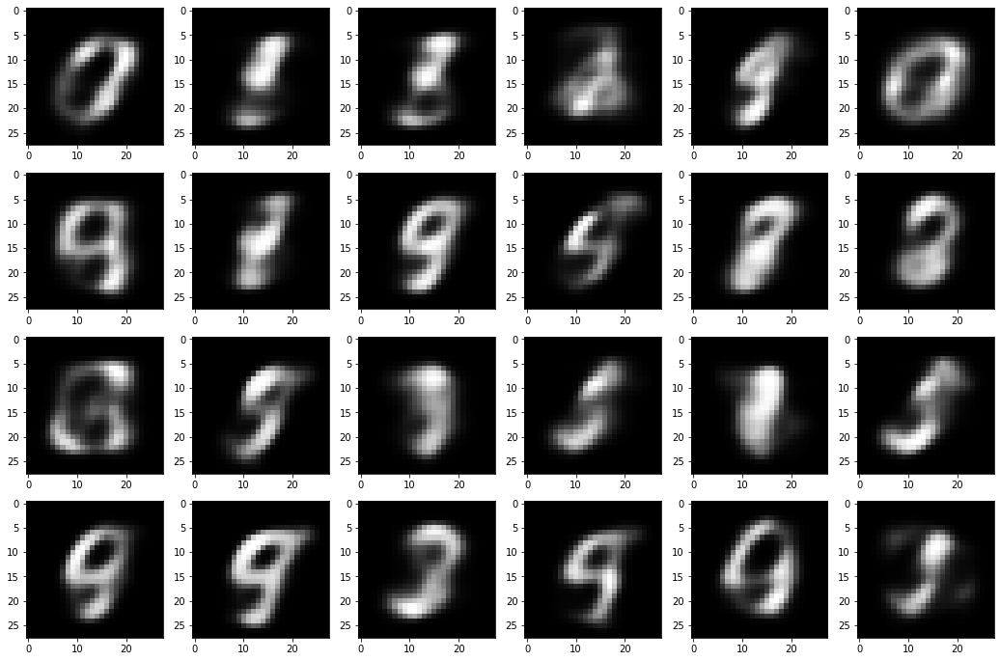

Epoch: 040: Enc Loss: 0.801, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.238, IS_avr: 2.059
examples of generated images after 40 epochs


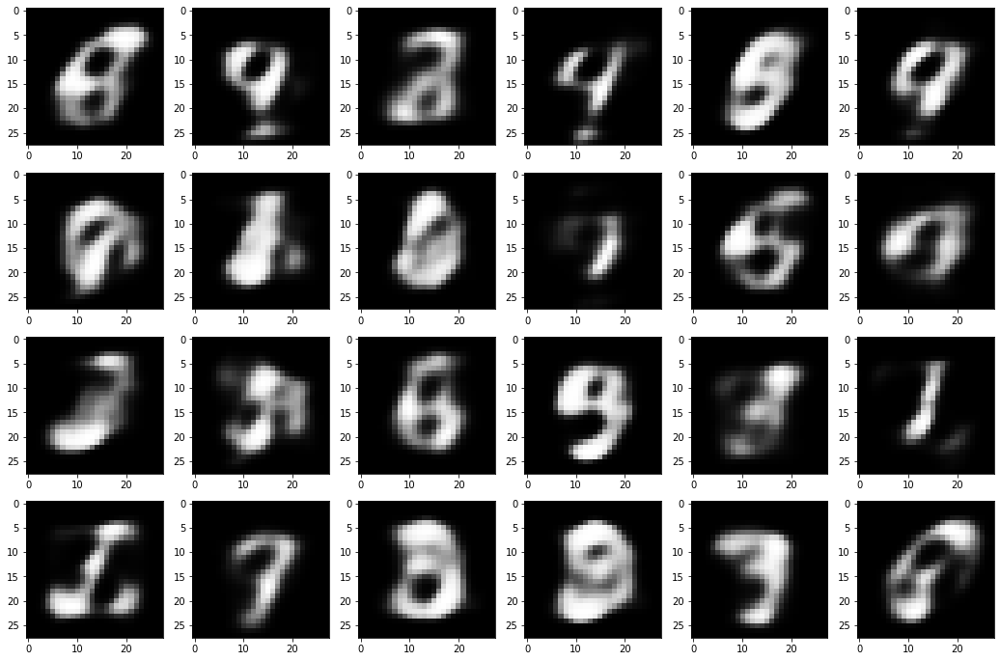

examples of generated images using average variables after 40 epochs


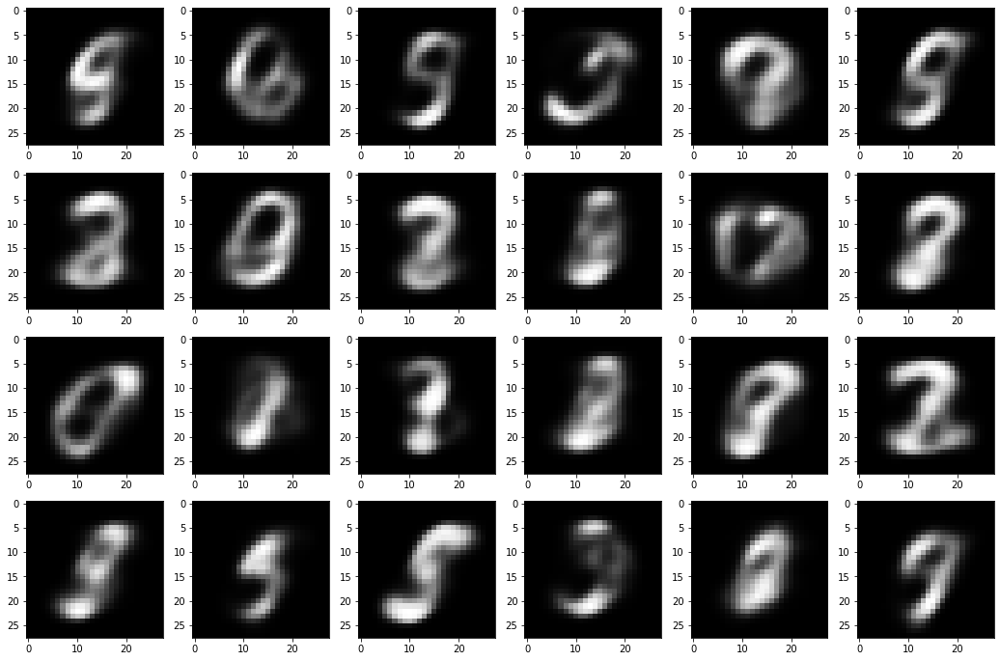

Epoch: 041: Enc Loss: 0.800, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.245, IS_avr: 2.096
examples of generated images after 41 epochs


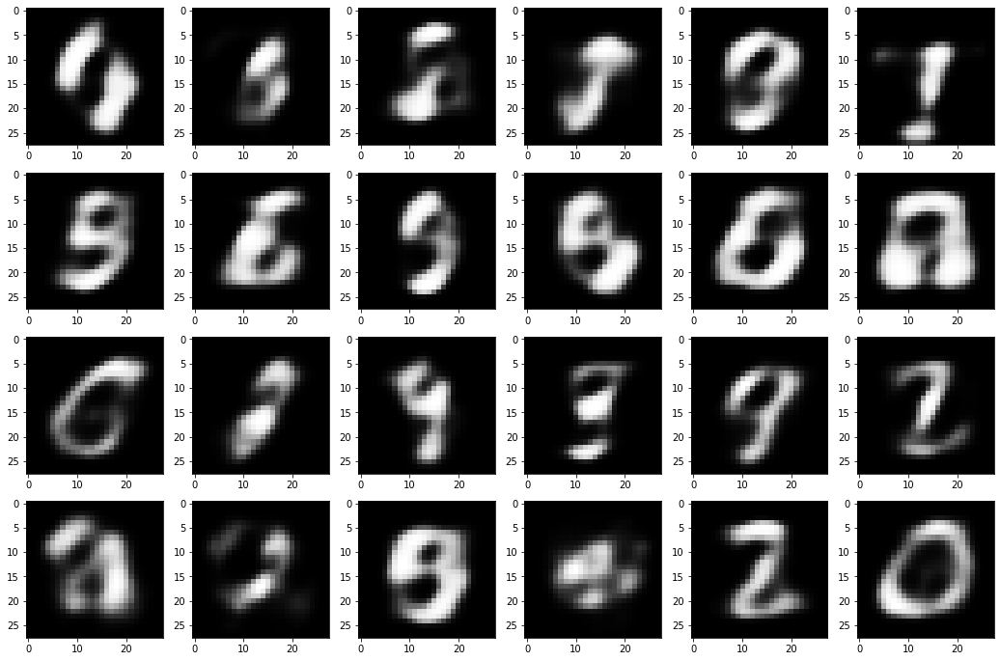

examples of generated images using average variables after 41 epochs


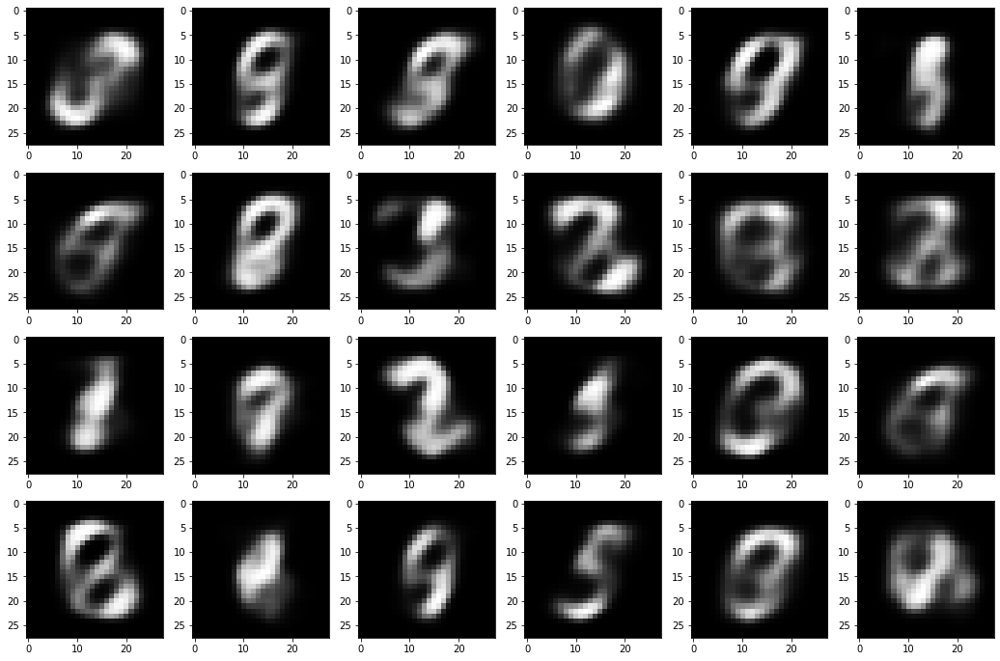

Epoch: 042: Enc Loss: 0.802, Dec Loss: 0.168, Disc Loss:0.688, IS: 2.286, IS_avr: 2.069
examples of generated images after 42 epochs


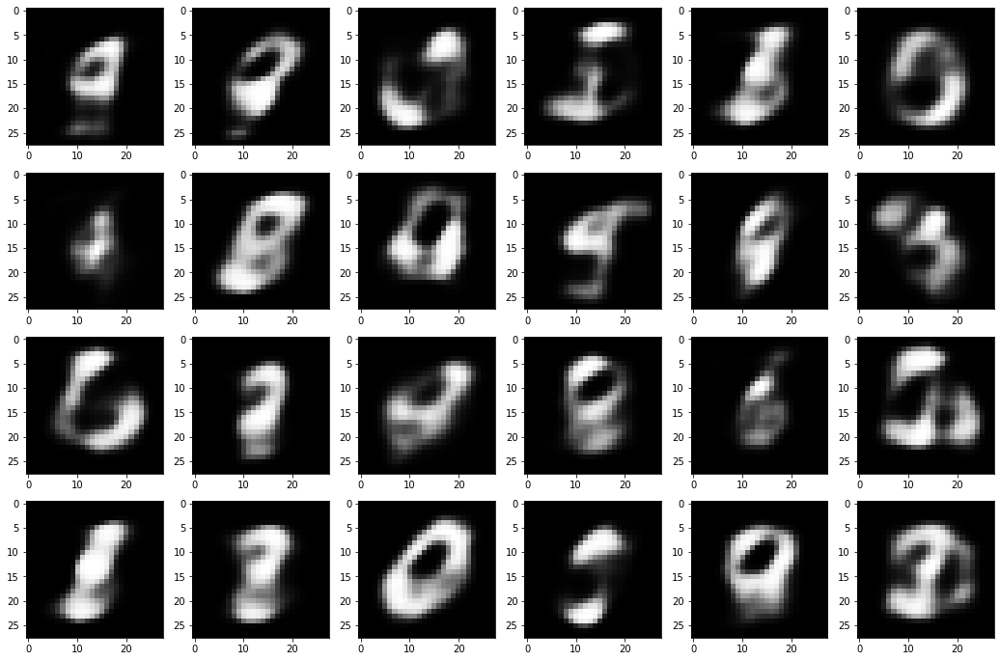

examples of generated images using average variables after 42 epochs


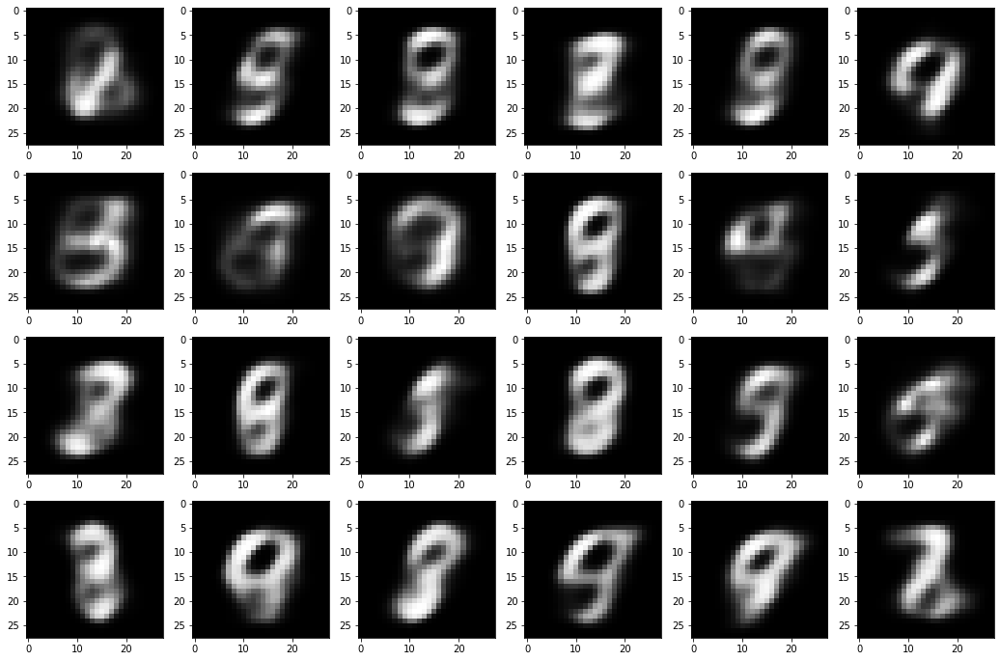

Epoch: 043: Enc Loss: 0.799, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.240, IS_avr: 2.066
examples of generated images after 43 epochs


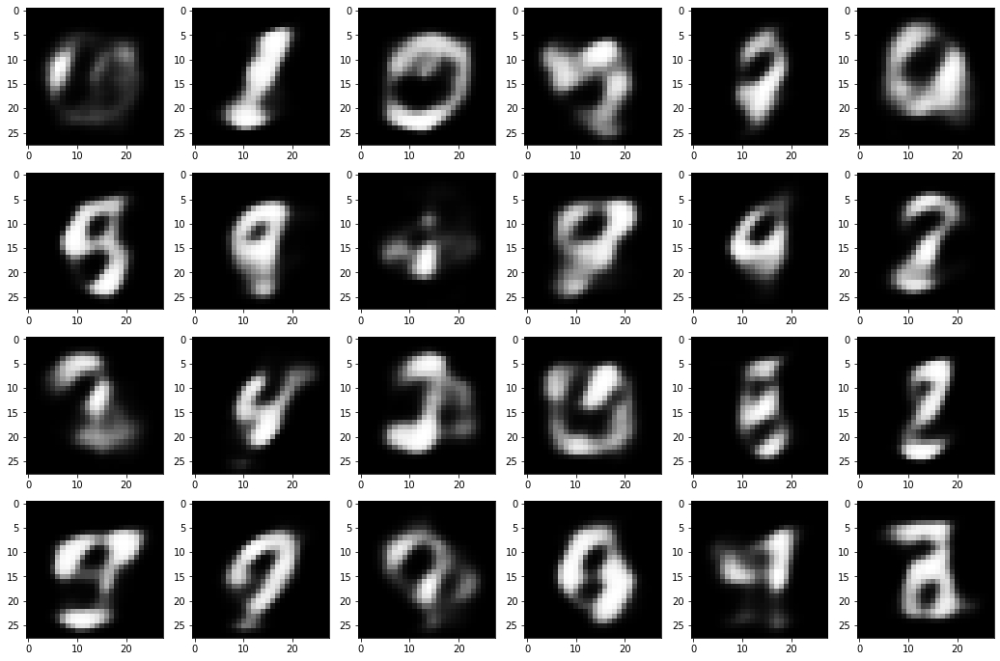

examples of generated images using average variables after 43 epochs


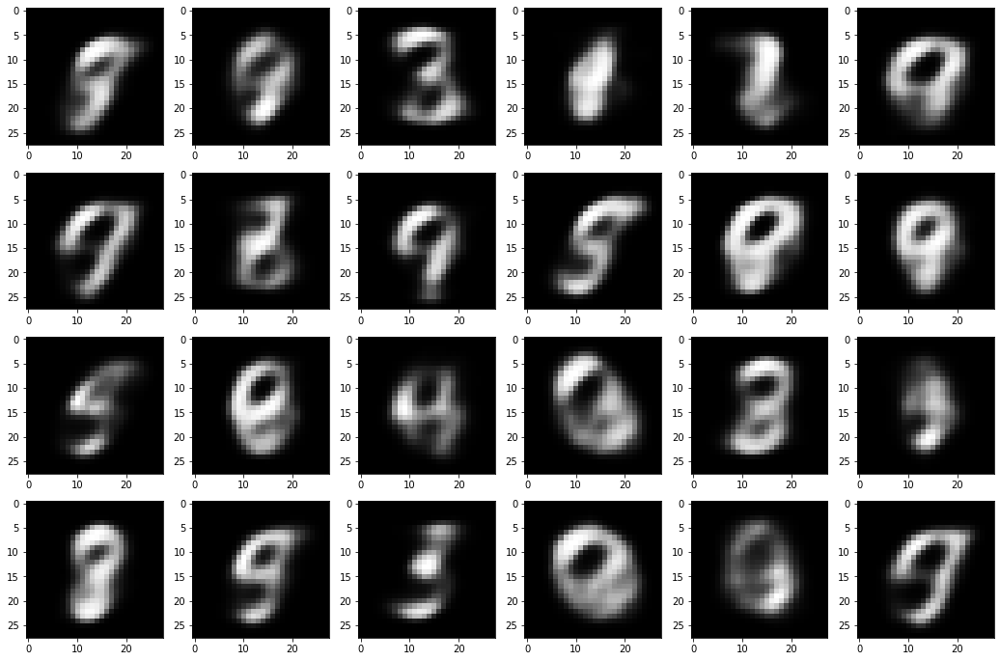

Epoch: 044: Enc Loss: 0.801, Dec Loss: 0.169, Disc Loss:0.689, IS: 2.321, IS_avr: 2.072
examples of generated images after 44 epochs


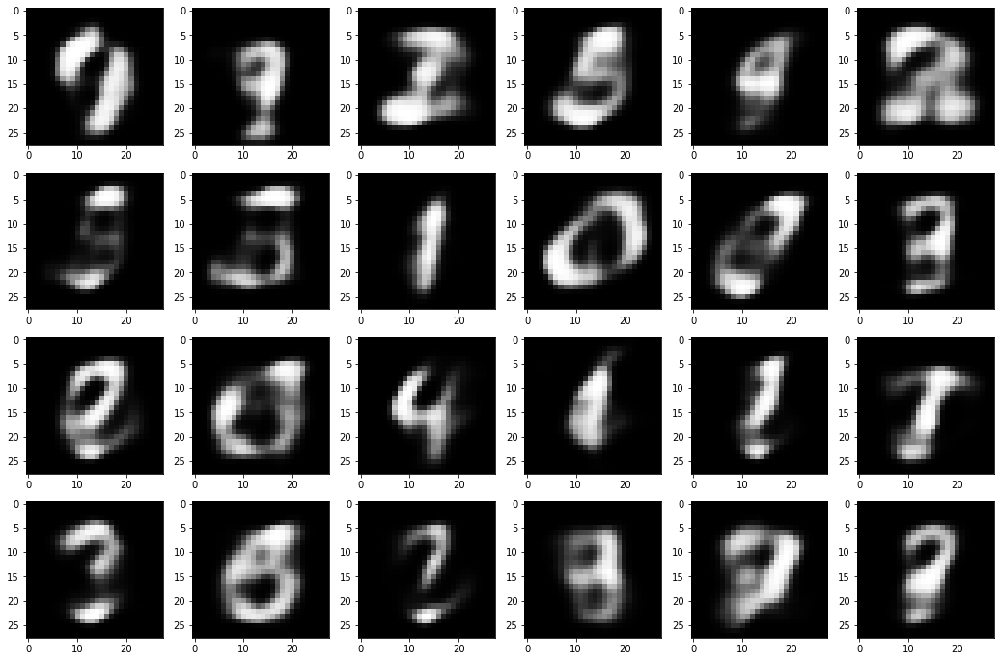

examples of generated images using average variables after 44 epochs


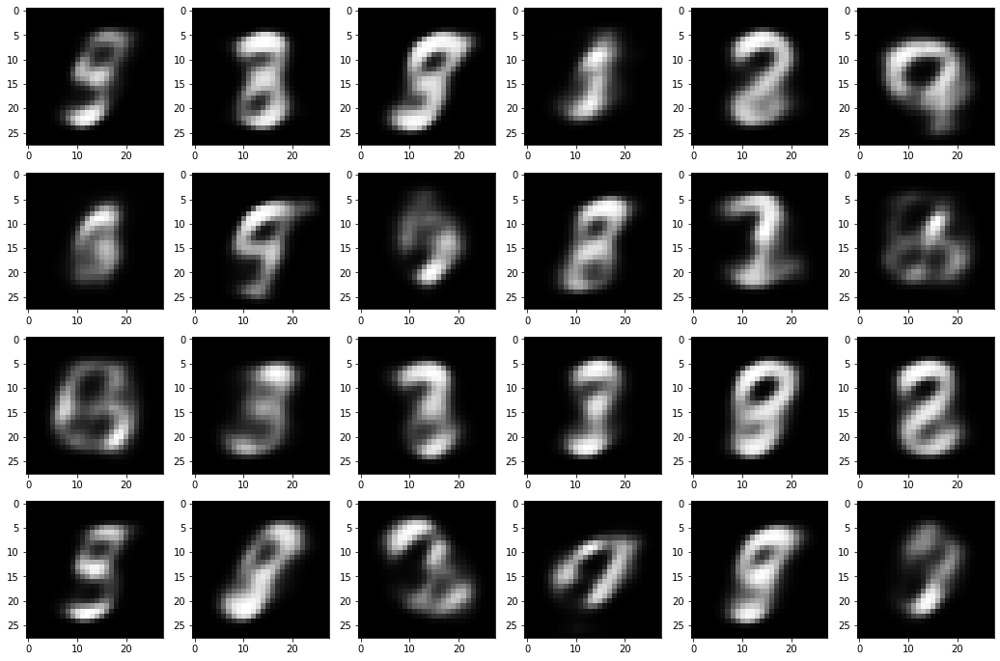

Epoch: 045: Enc Loss: 0.801, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.293, IS_avr: 2.117
examples of generated images after 45 epochs


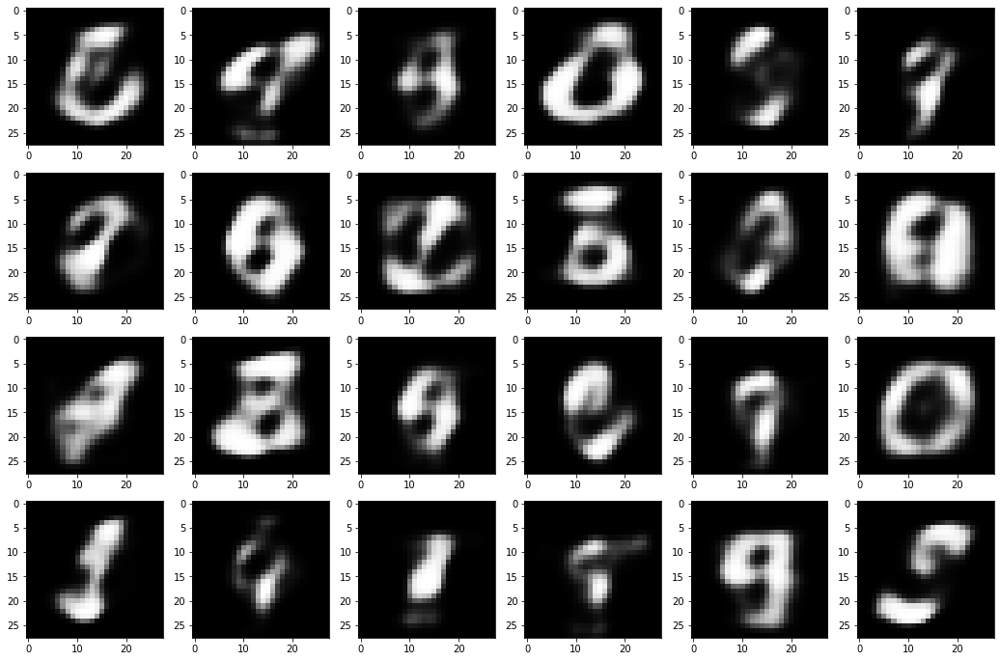

examples of generated images using average variables after 45 epochs


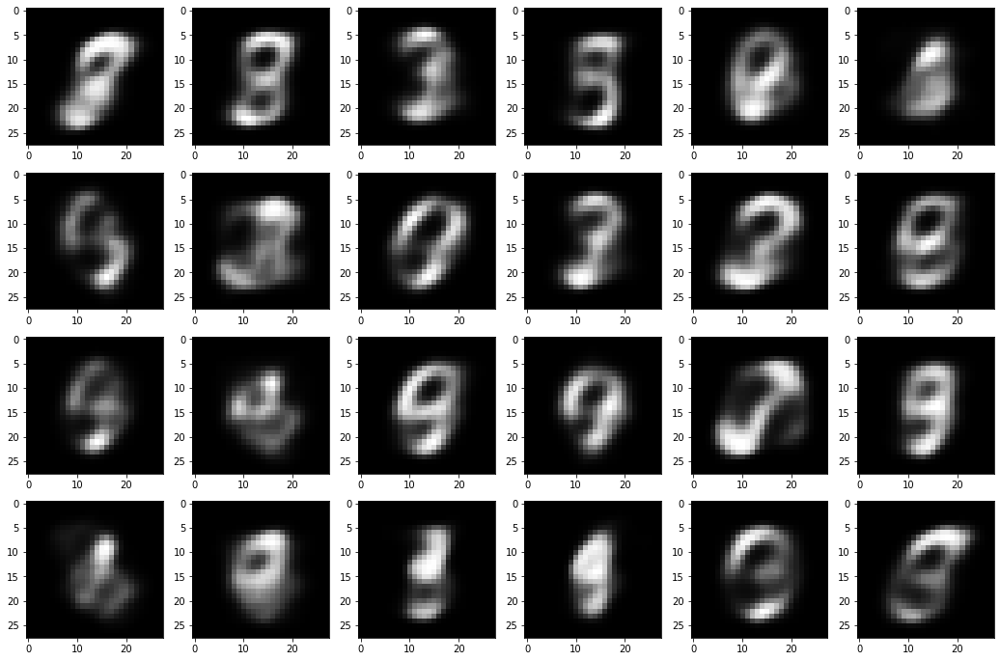

Epoch: 046: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.330, IS_avr: 2.091
examples of generated images after 46 epochs


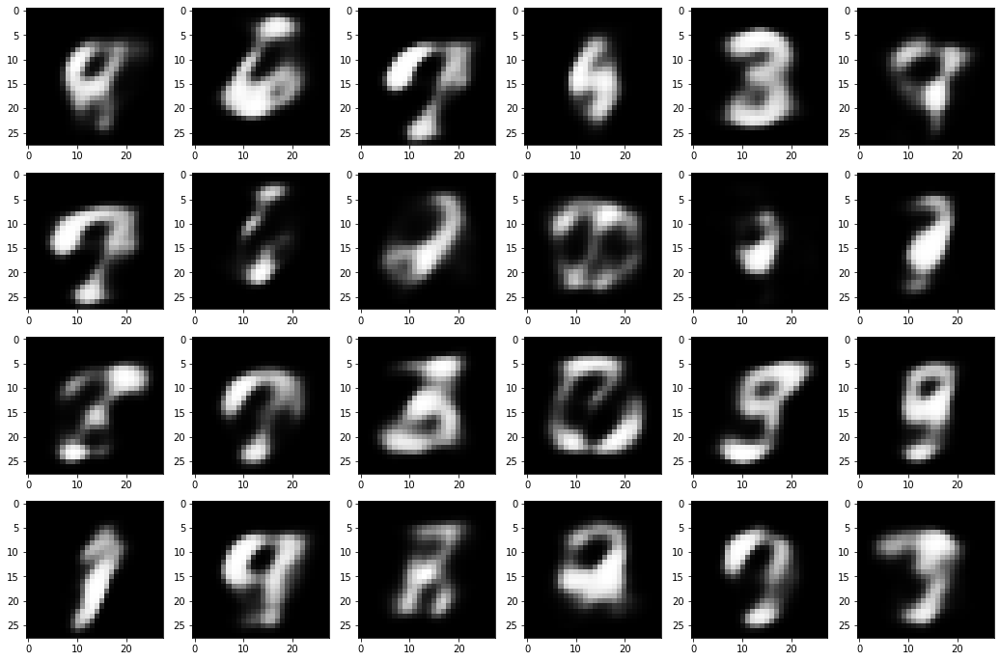

examples of generated images using average variables after 46 epochs


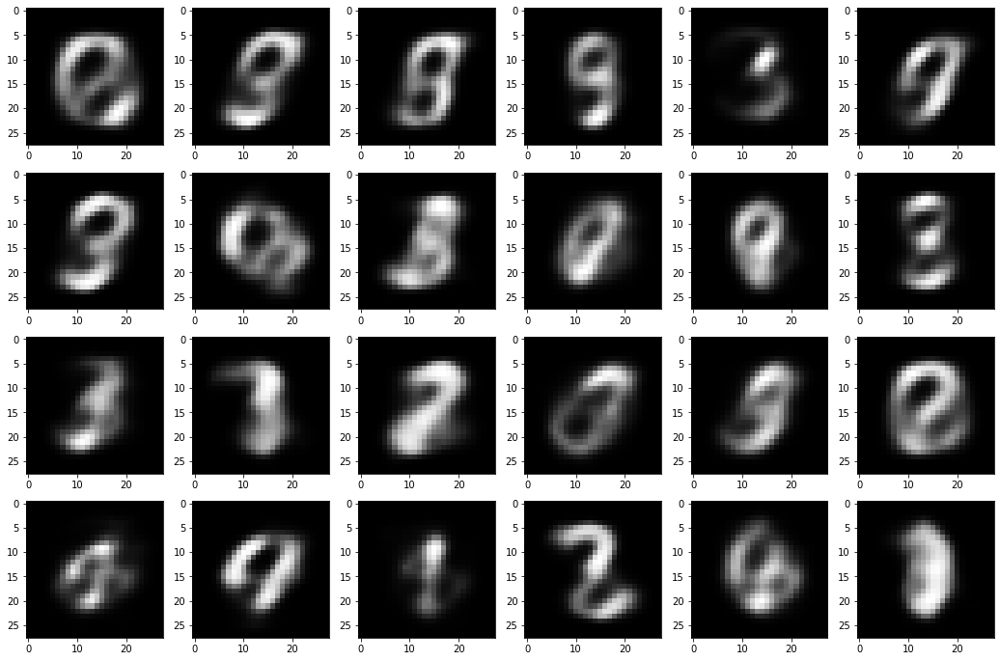

Epoch: 047: Enc Loss: 0.801, Dec Loss: 0.167, Disc Loss:0.688, IS: 2.229, IS_avr: 2.123
examples of generated images after 47 epochs


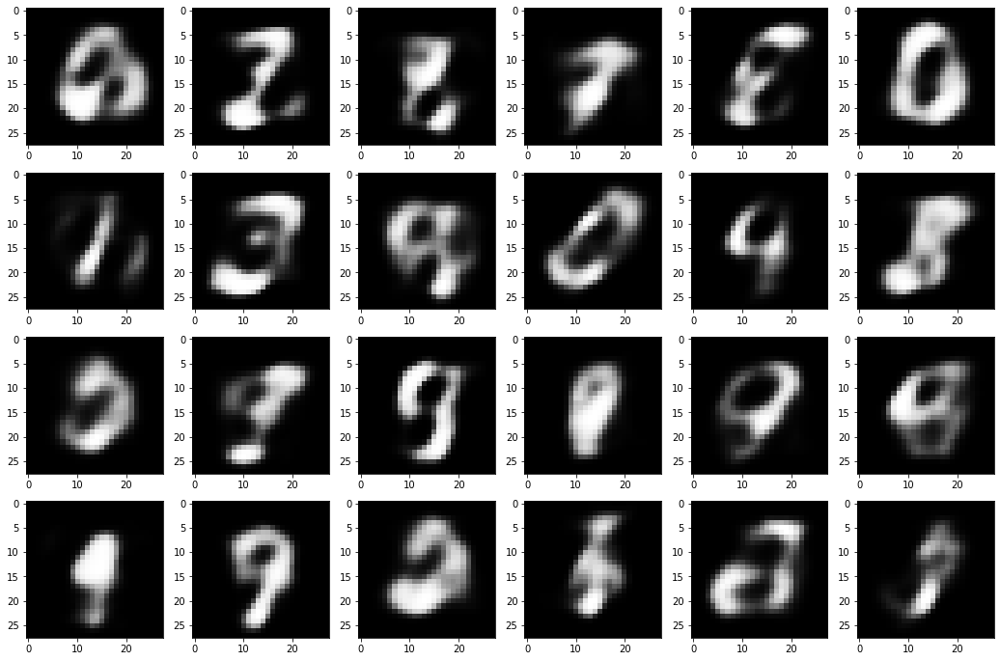

examples of generated images using average variables after 47 epochs


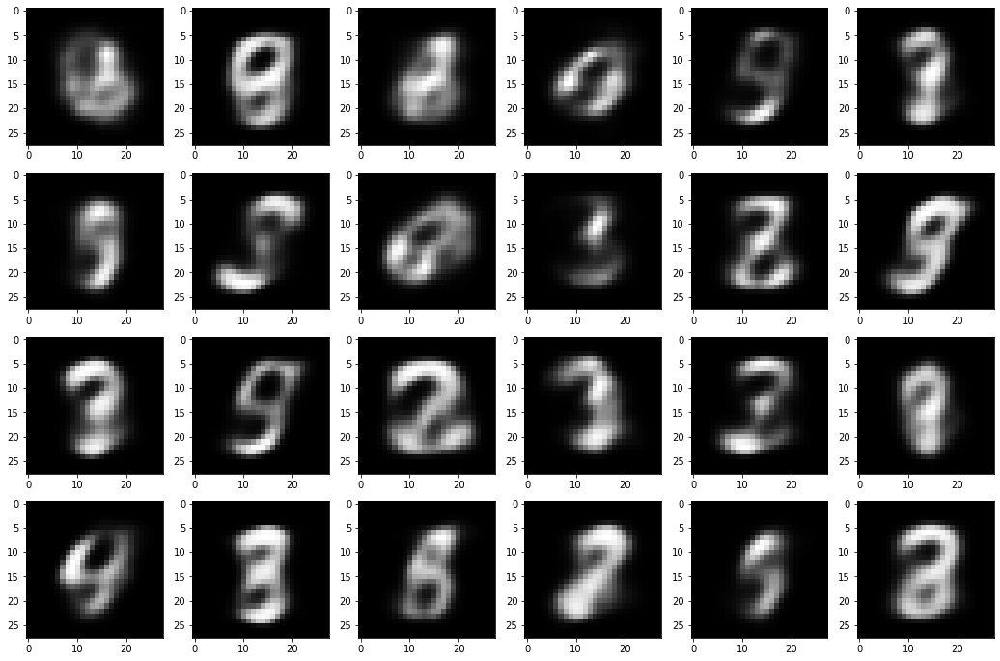

Epoch: 048: Enc Loss: 0.800, Dec Loss: 0.168, Disc Loss:0.689, IS: 2.297, IS_avr: 2.064
examples of generated images after 48 epochs


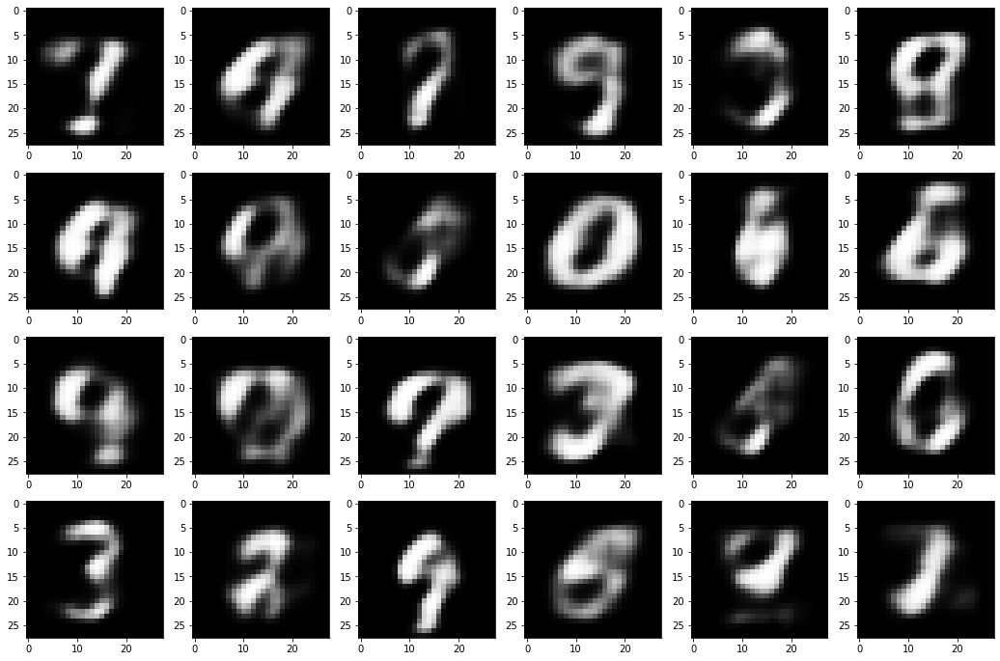

examples of generated images using average variables after 48 epochs


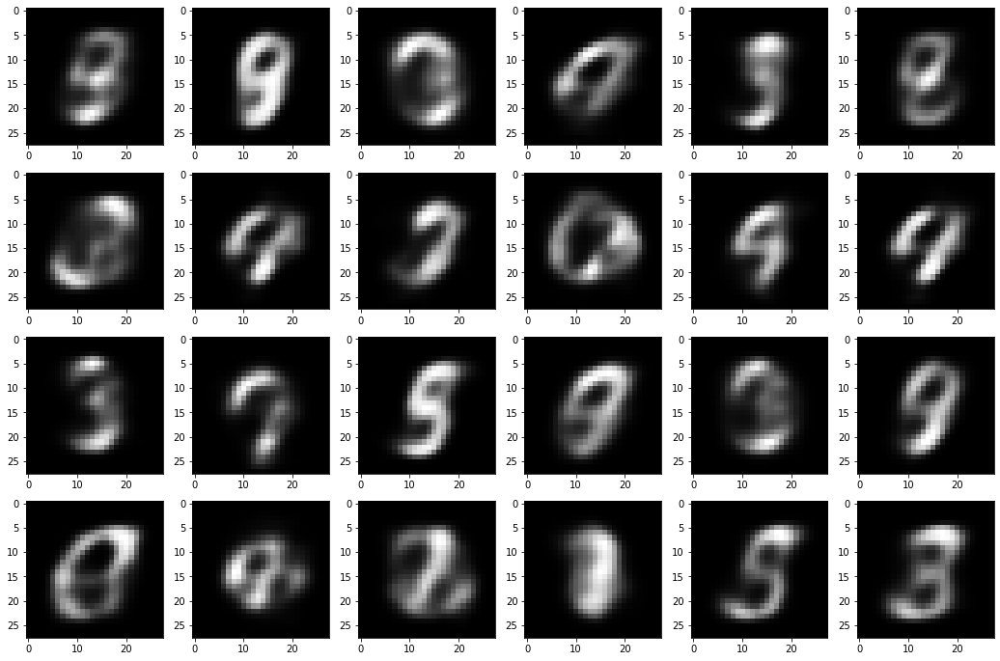

Epoch: 049: Enc Loss: 0.800, Dec Loss: 0.167, Disc Loss:0.689, IS: 2.321, IS_avr: 2.045
examples of generated images after 49 epochs


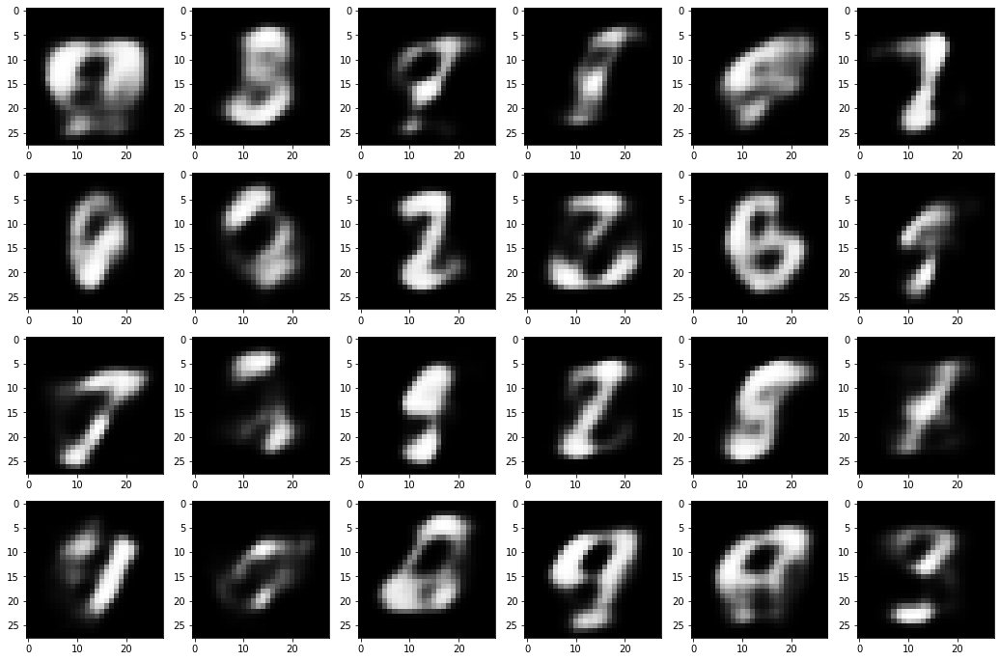

examples of generated images using average variables after 49 epochs


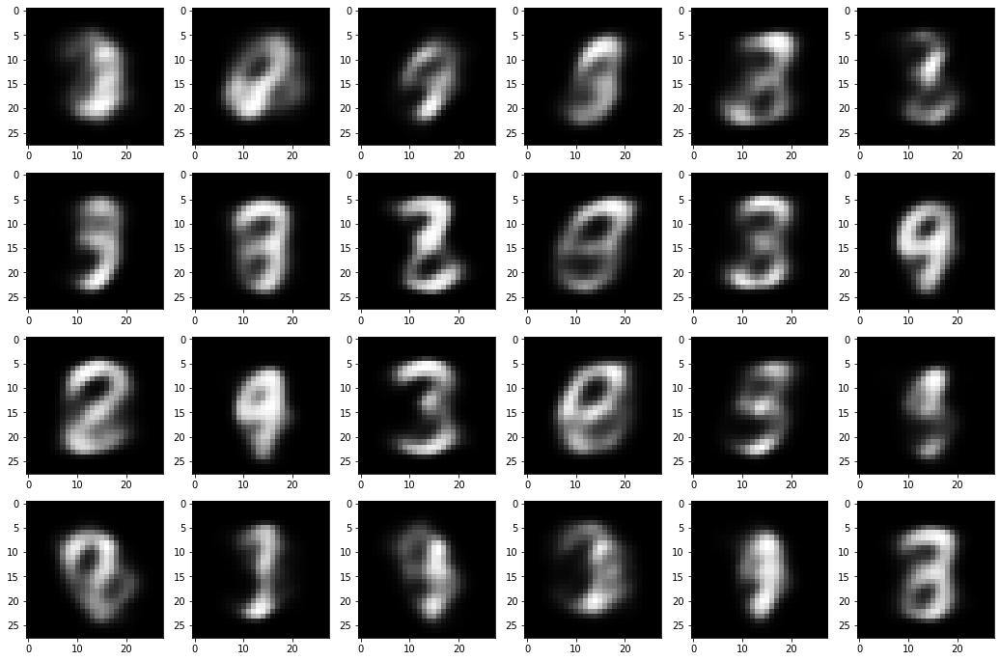

Epoch: 050: Enc Loss: 0.801, Dec Loss: 0.166, Disc Loss:0.689, IS: 2.402, IS_avr: 2.100
examples of generated images after 50 epochs


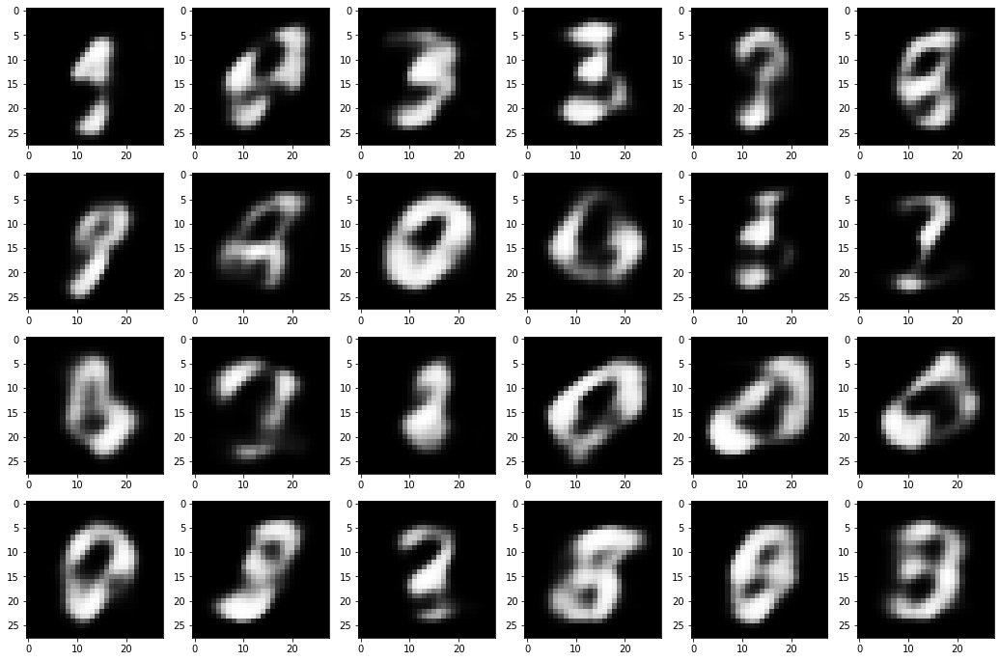

examples of generated images using average variables after 50 epochs


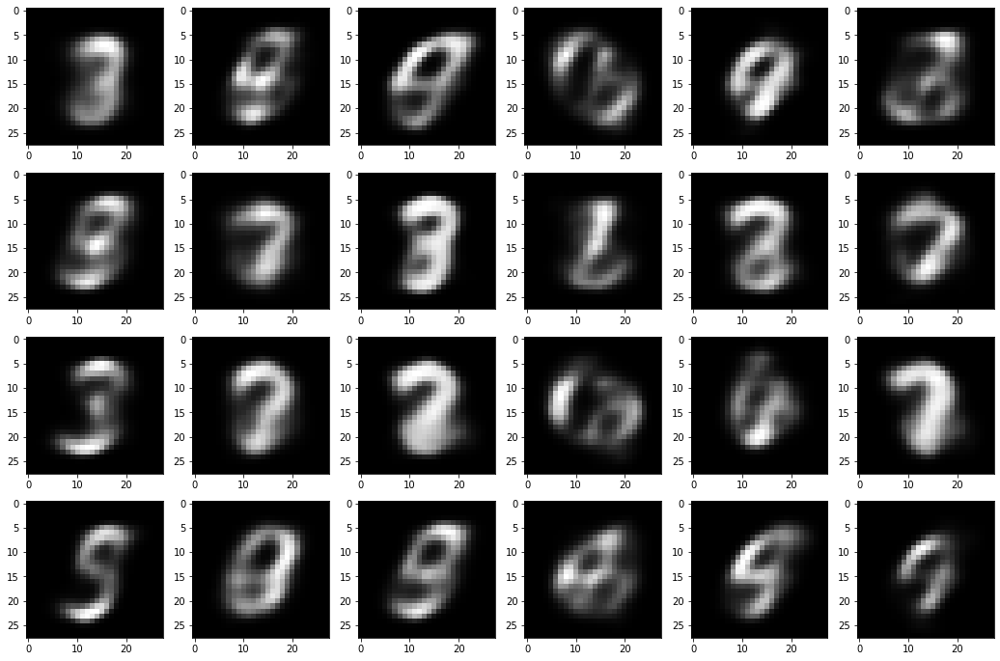

2072.851391


In [ ]:
aae.use_averaging = True
t0 = time.clock()
aae.train(epochs=25)
print(time.clock()-t0)

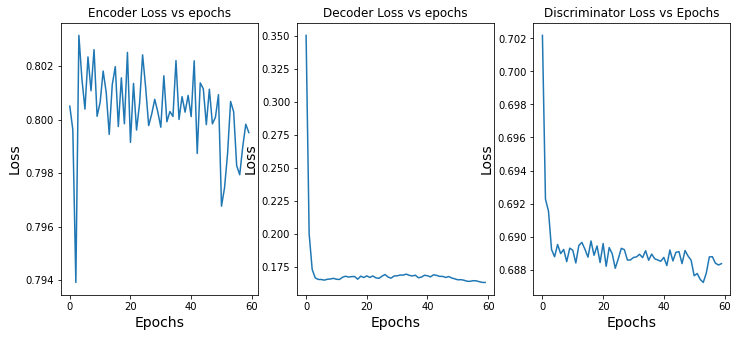

In [ ]:
aae.draw_losses_per_epoch_graphic()

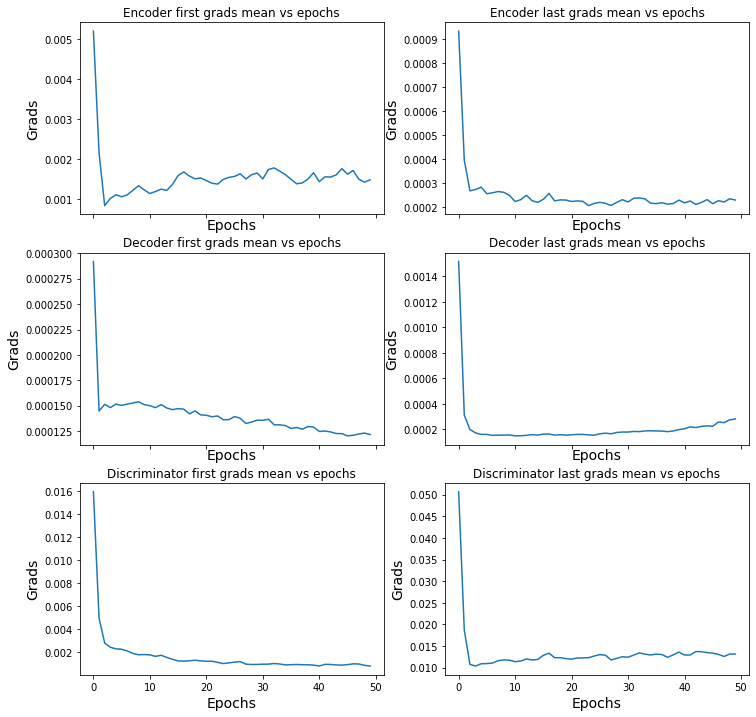

In [ ]:
aae.draw_grads_per_epoch_graphic()

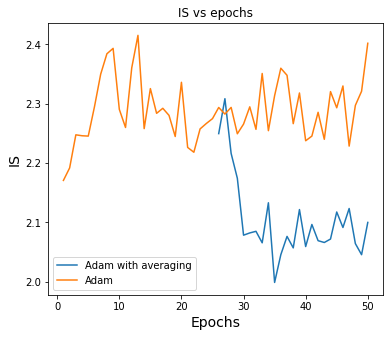

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(6, 5))  
axes.set_xlabel("Epochs", fontsize=14)
axes.set_ylabel("IS", fontsize=14)
axes.set_title('IS vs epochs')
x1 = [x for x in (np.arange(25)+26)]
axes.plot(x1, aae.IS_for_avr_per_epoch, label = 'Adam with averaging')
x2 = [x for x in (np.arange(50)+1)]
axes.plot(x2, aae.IS_per_epoch, label = 'Adam')
axes.legend()
plt.show()

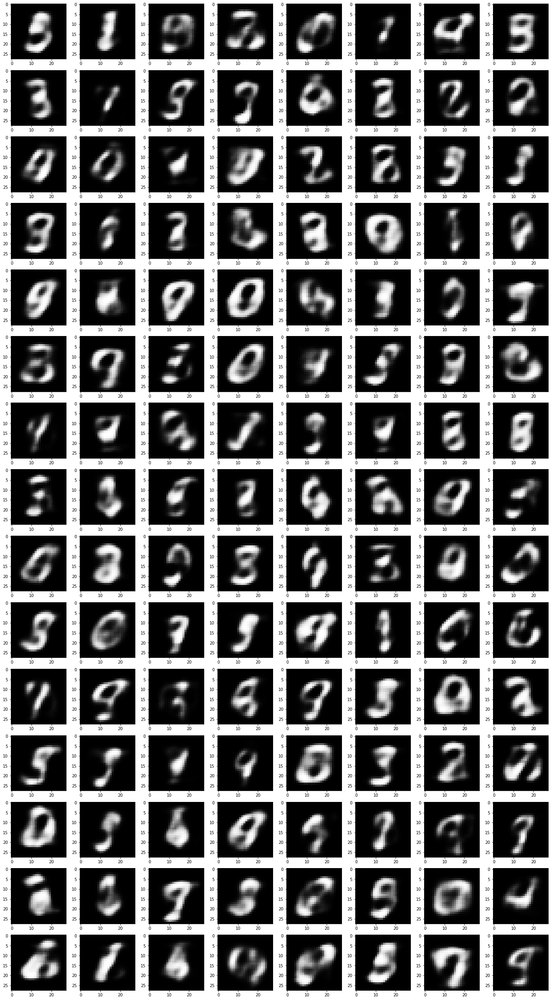

In [ ]:
aae.draw_generated_images(rows=15, cols=8)

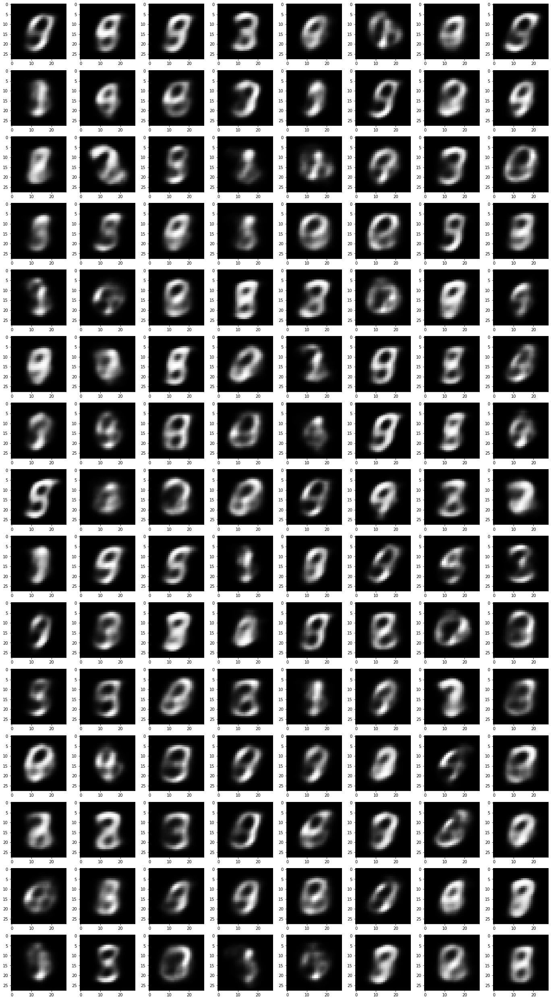

In [ ]:
aae.draw_generated_images(rows=15, cols=8, is_from_gen_avr=True)

**ExtraAdam**

In [ ]:
aae = AAE(ExtraAdam(learning_rate=0.0002, beta_1=0.5), x_train, batch_size=128,
          use_averaging=False, path='/content/drive/My Drive/Diploma/Save models/AAE ExtraAdam/')
t0 = time.clock()
aae.train(epochs=25)
print(time.clock()-t0)

Epoch: 026: Enc Loss: 0.798, Dec Loss: 0.144, Disc Loss:0.688, IS: 2.517, IS_avr: 2.565
examples of generated images after 26 epochs


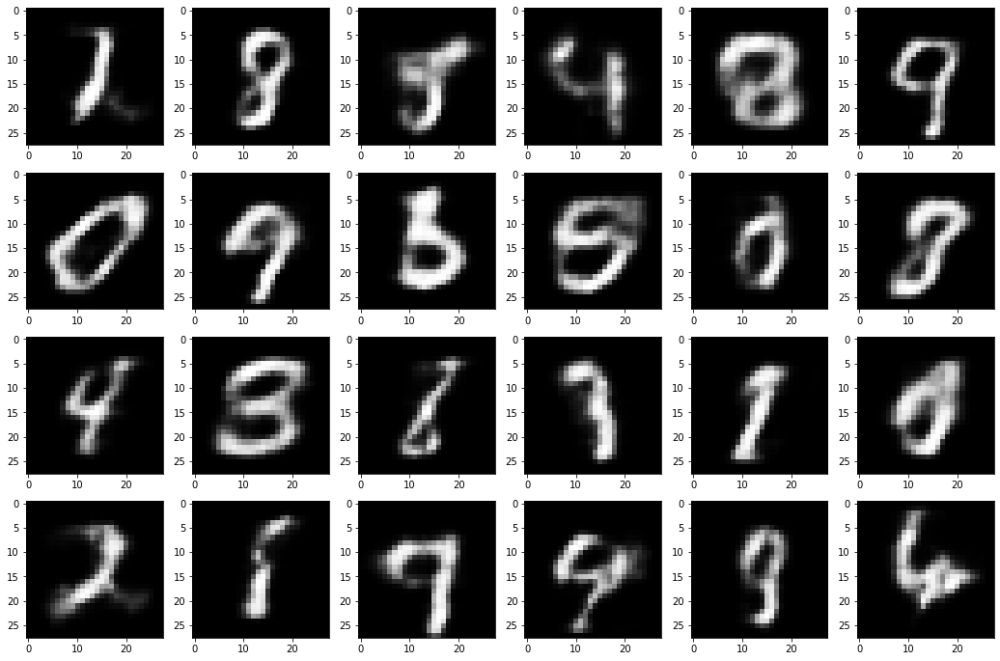

examples of generated images using average variables after 26 epochs


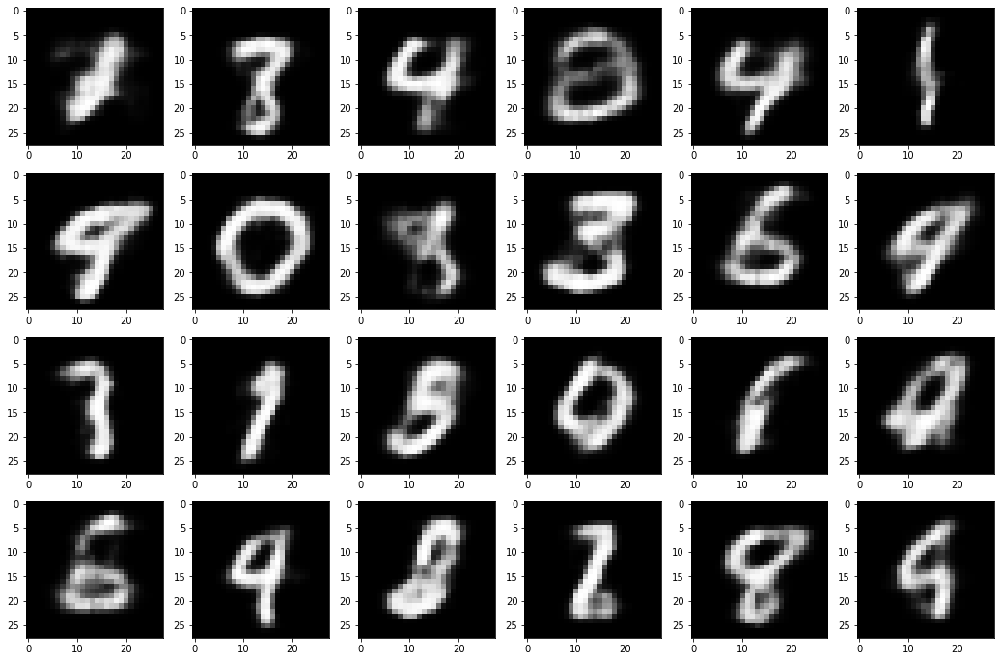

Epoch: 027: Enc Loss: 0.800, Dec Loss: 0.140, Disc Loss:0.688, IS: 2.514, IS_avr: 2.425
examples of generated images after 27 epochs


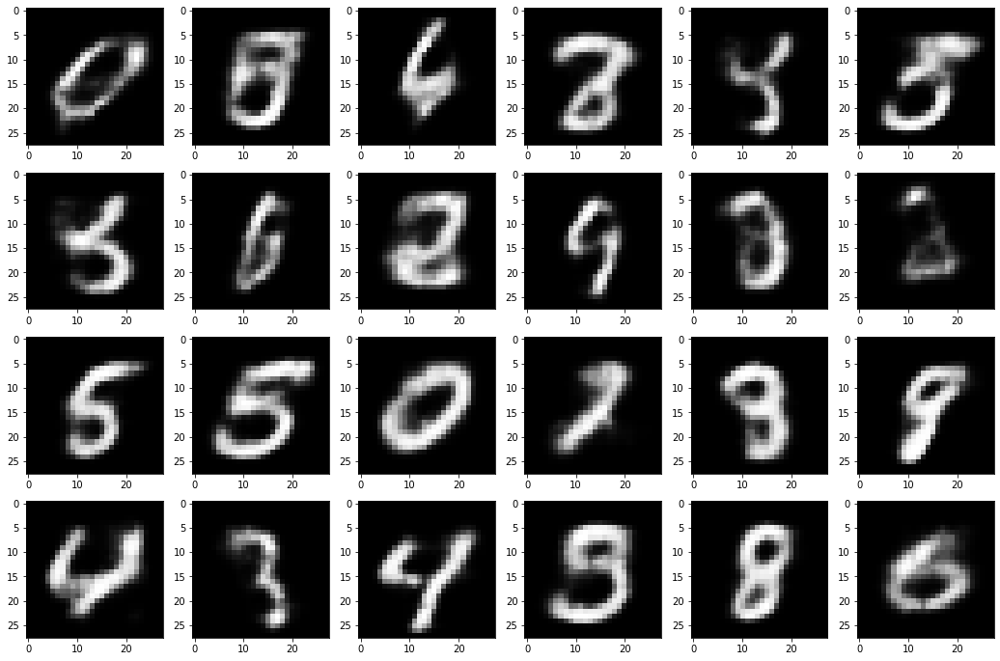

examples of generated images using average variables after 27 epochs


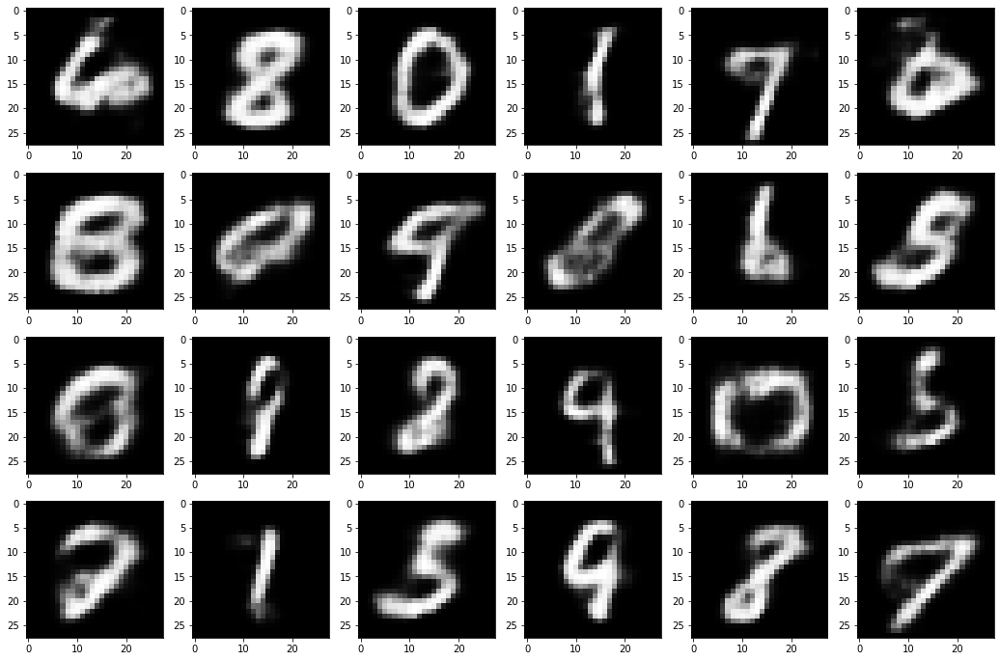

Epoch: 028: Enc Loss: 0.799, Dec Loss: 0.140, Disc Loss:0.689, IS: 2.483, IS_avr: 2.584
examples of generated images after 28 epochs


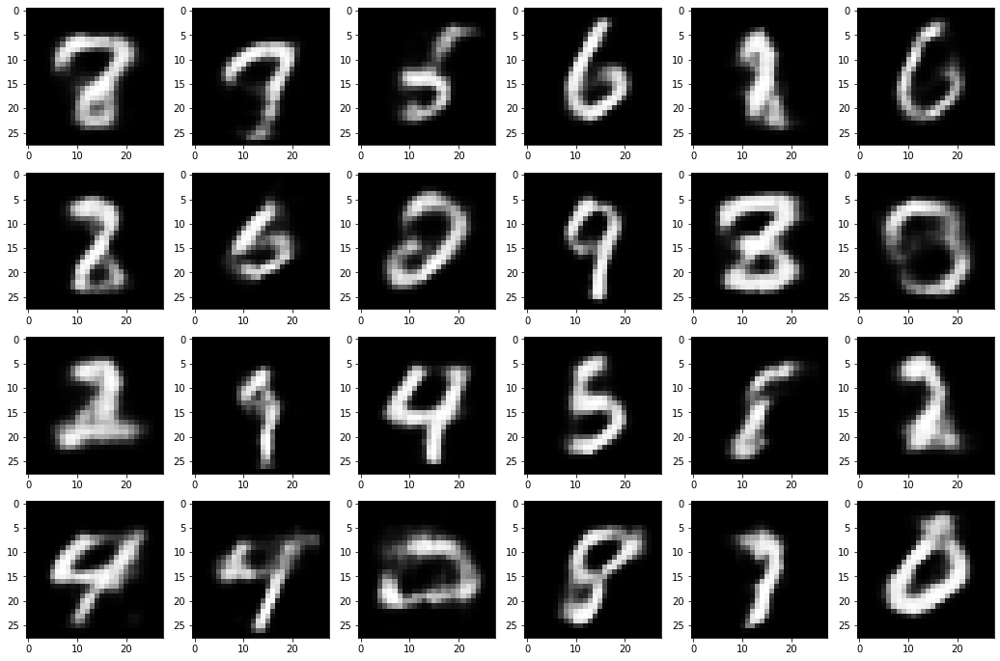

examples of generated images using average variables after 28 epochs


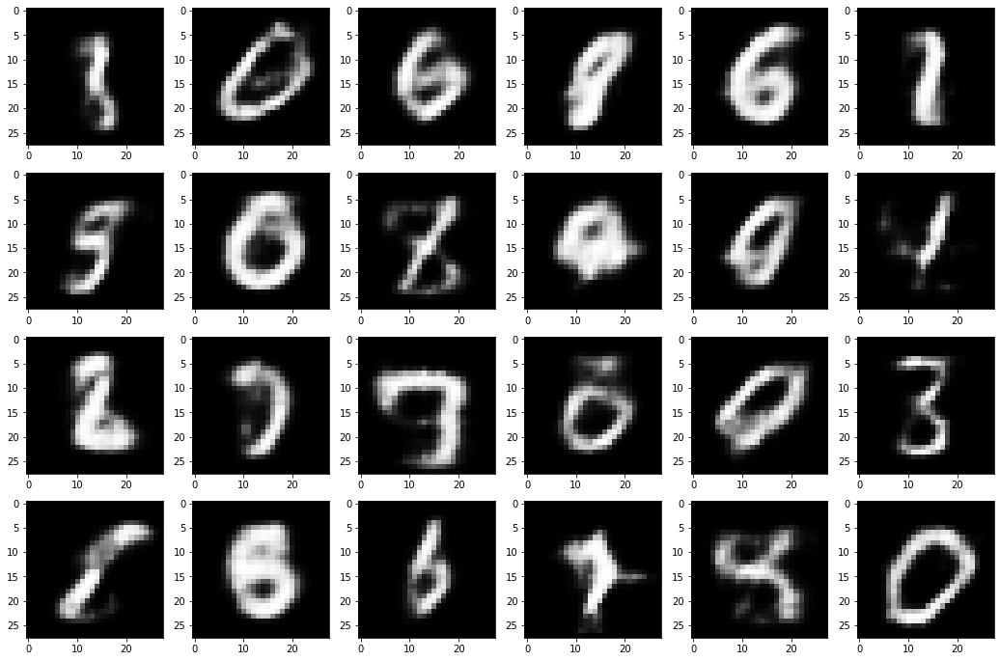

Epoch: 029: Enc Loss: 0.799, Dec Loss: 0.139, Disc Loss:0.689, IS: 2.524, IS_avr: 2.471
examples of generated images after 29 epochs


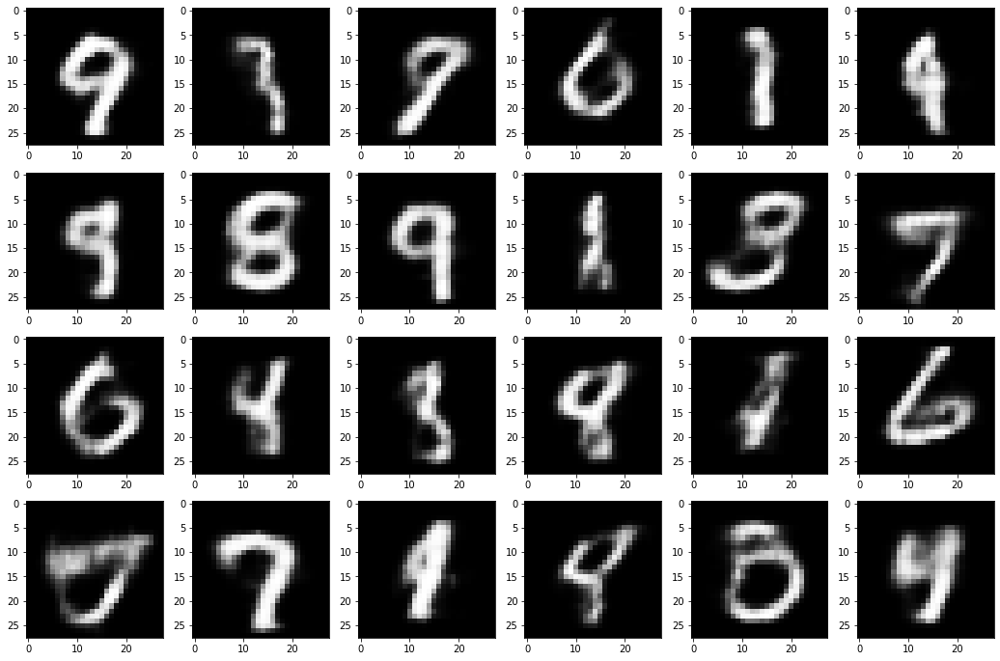

examples of generated images using average variables after 29 epochs


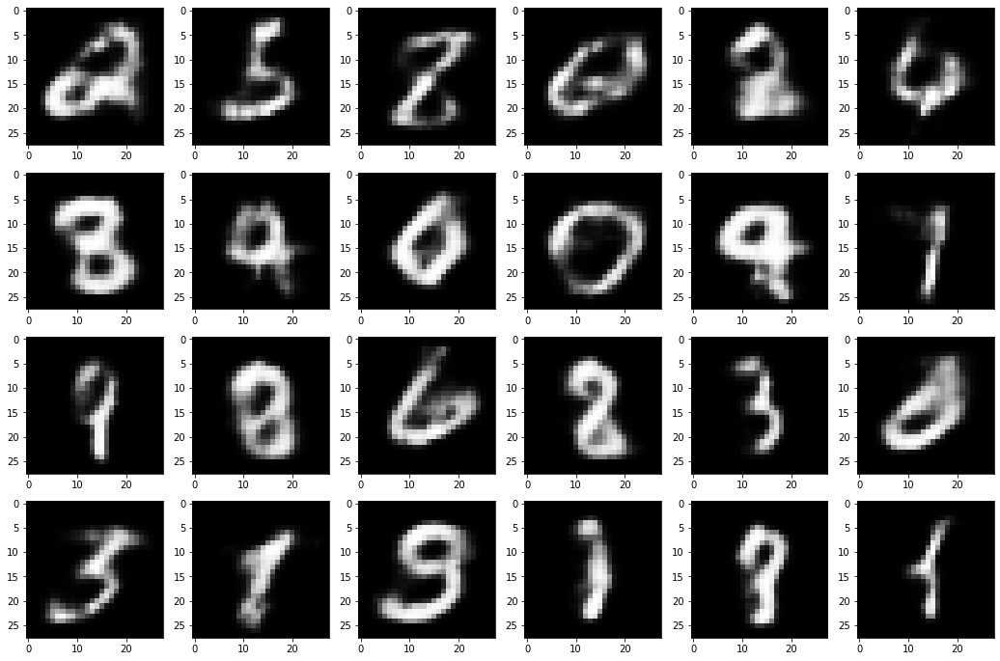

Epoch: 030: Enc Loss: 0.799, Dec Loss: 0.137, Disc Loss:0.688, IS: 2.519, IS_avr: 2.593
examples of generated images after 30 epochs


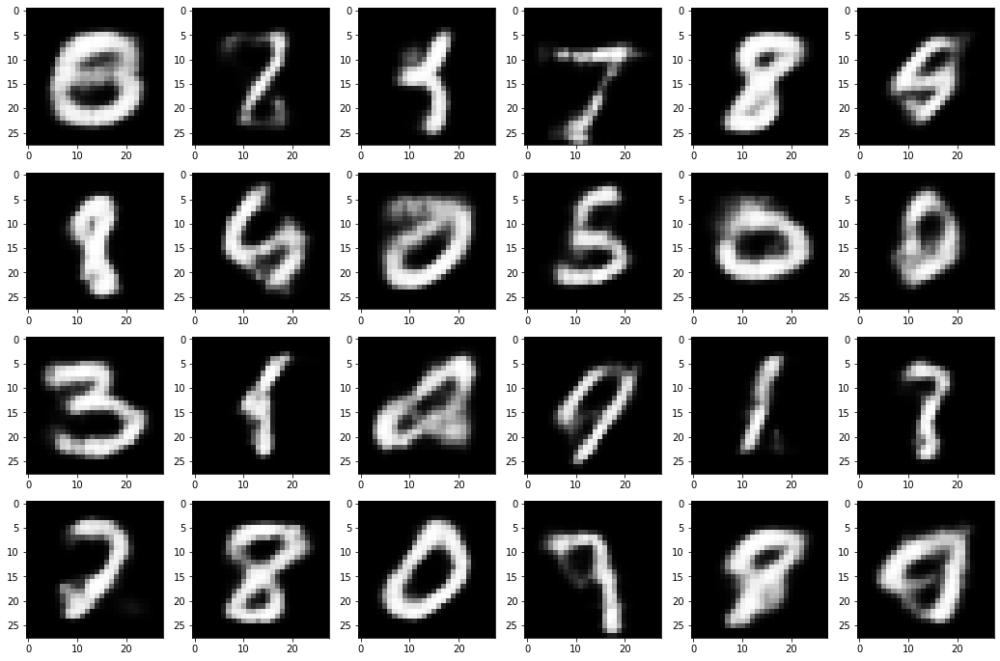

examples of generated images using average variables after 30 epochs


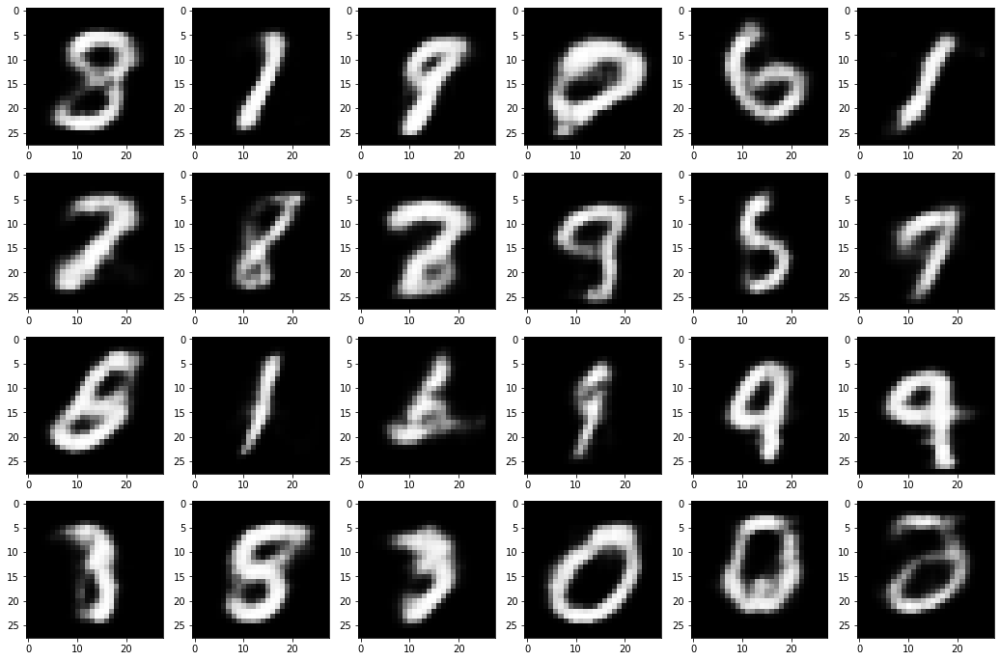

Epoch: 031: Enc Loss: 0.799, Dec Loss: 0.137, Disc Loss:0.688, IS: 2.600, IS_avr: 2.540
examples of generated images after 31 epochs


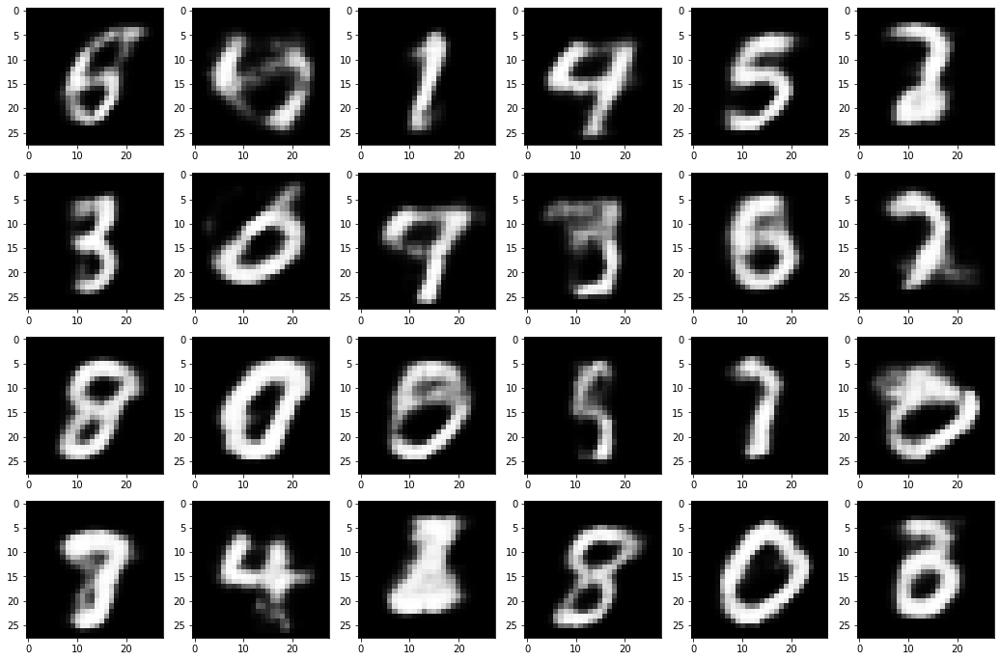

examples of generated images using average variables after 31 epochs


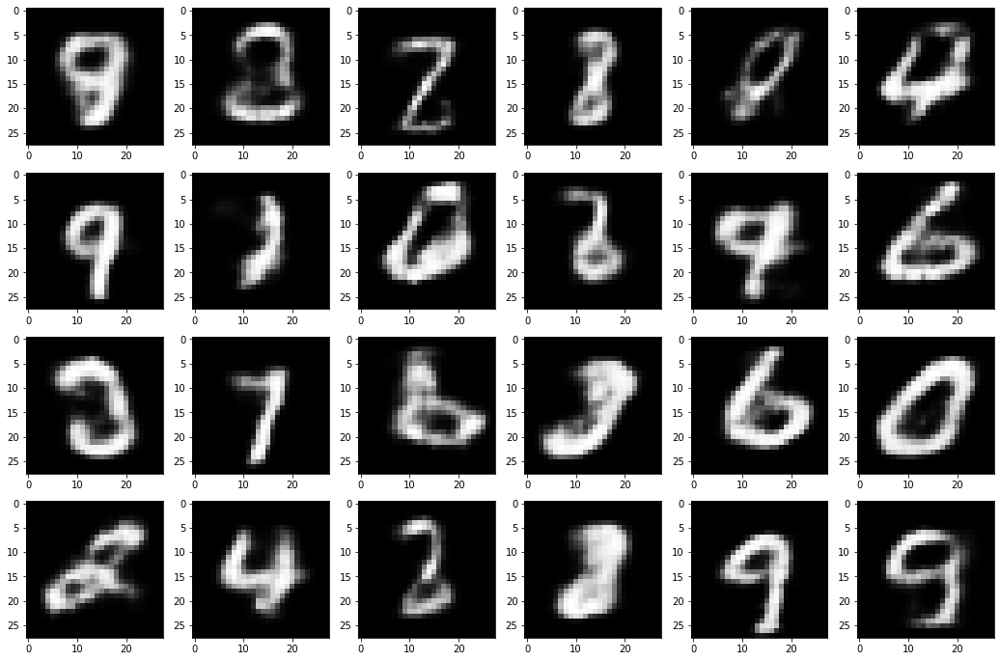

Epoch: 032: Enc Loss: 0.800, Dec Loss: 0.137, Disc Loss:0.688, IS: 2.601, IS_avr: 2.534
examples of generated images after 32 epochs


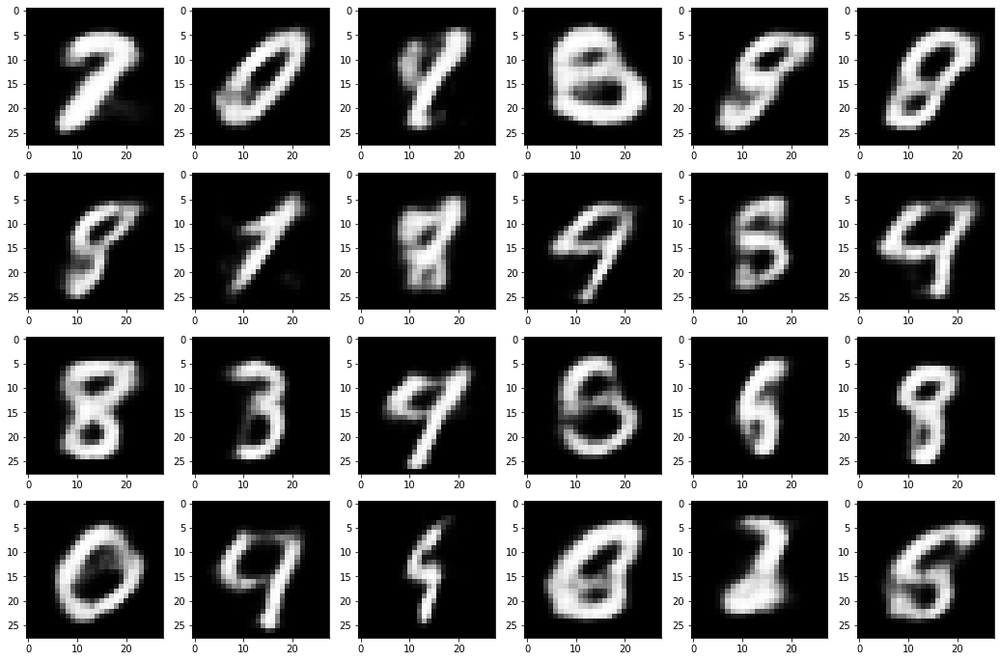

examples of generated images using average variables after 32 epochs


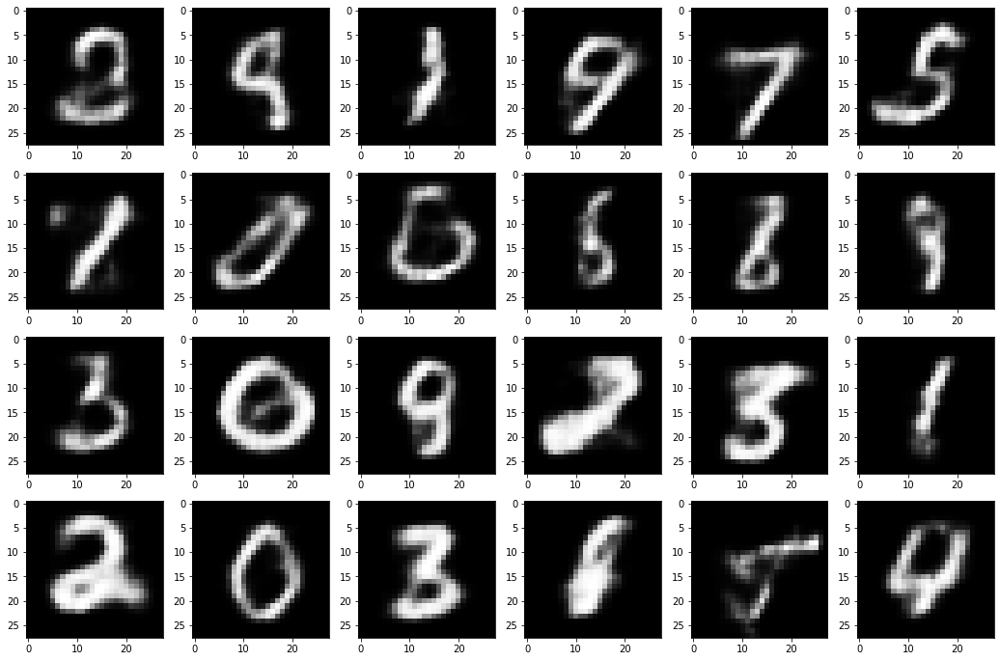

Epoch: 033: Enc Loss: 0.799, Dec Loss: 0.135, Disc Loss:0.688, IS: 2.488, IS_avr: 2.589
examples of generated images after 33 epochs


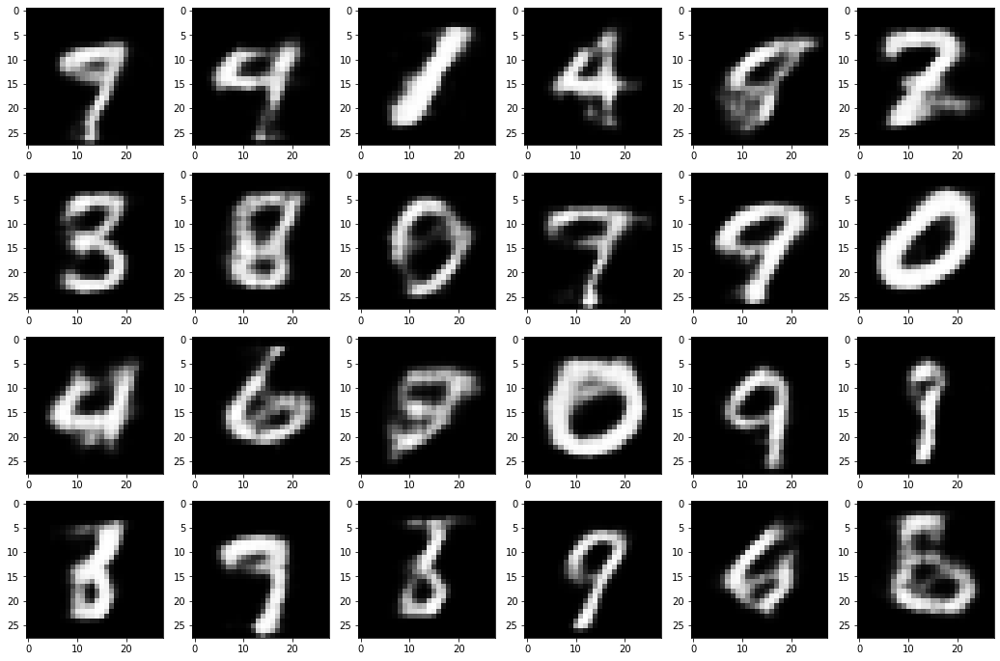

examples of generated images using average variables after 33 epochs


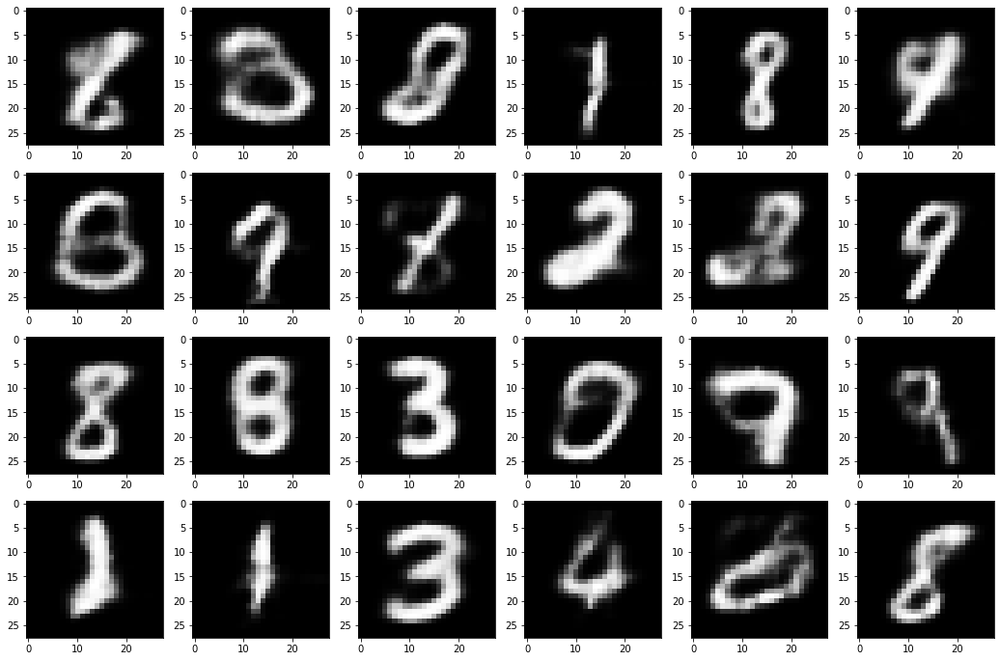

Epoch: 034: Enc Loss: 0.799, Dec Loss: 0.136, Disc Loss:0.688, IS: 2.540, IS_avr: 2.536
examples of generated images after 34 epochs


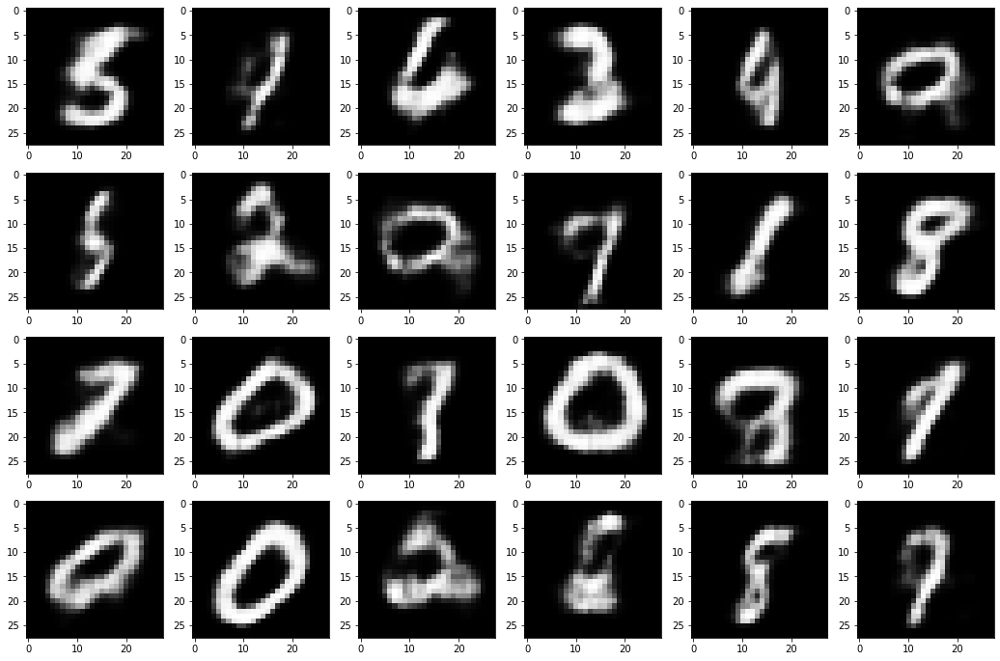

examples of generated images using average variables after 34 epochs


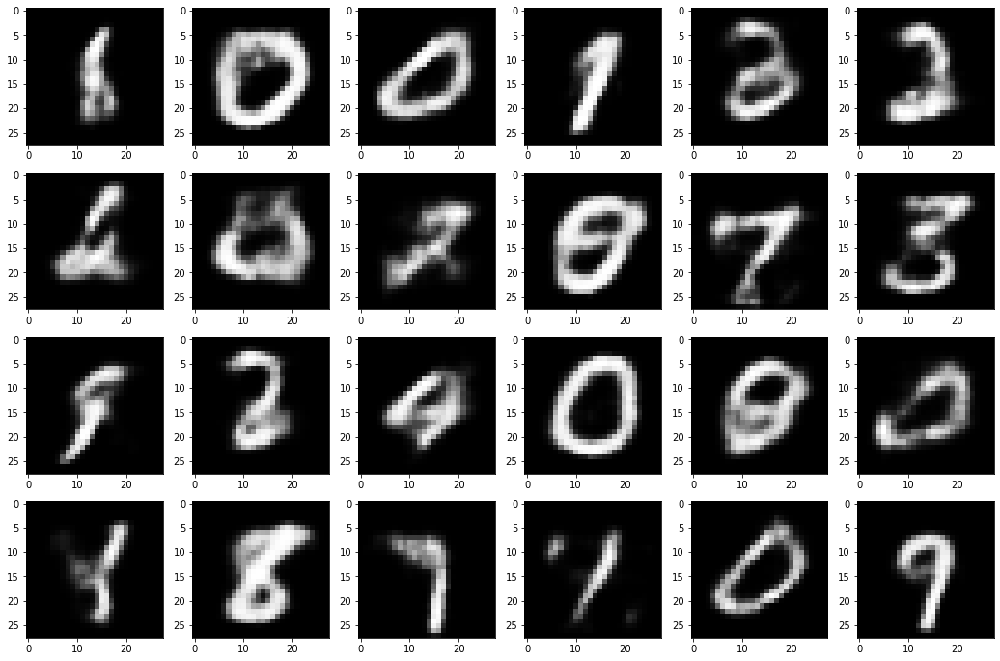

Epoch: 035: Enc Loss: 0.799, Dec Loss: 0.134, Disc Loss:0.688, IS: 2.616, IS_avr: 2.545
examples of generated images after 35 epochs


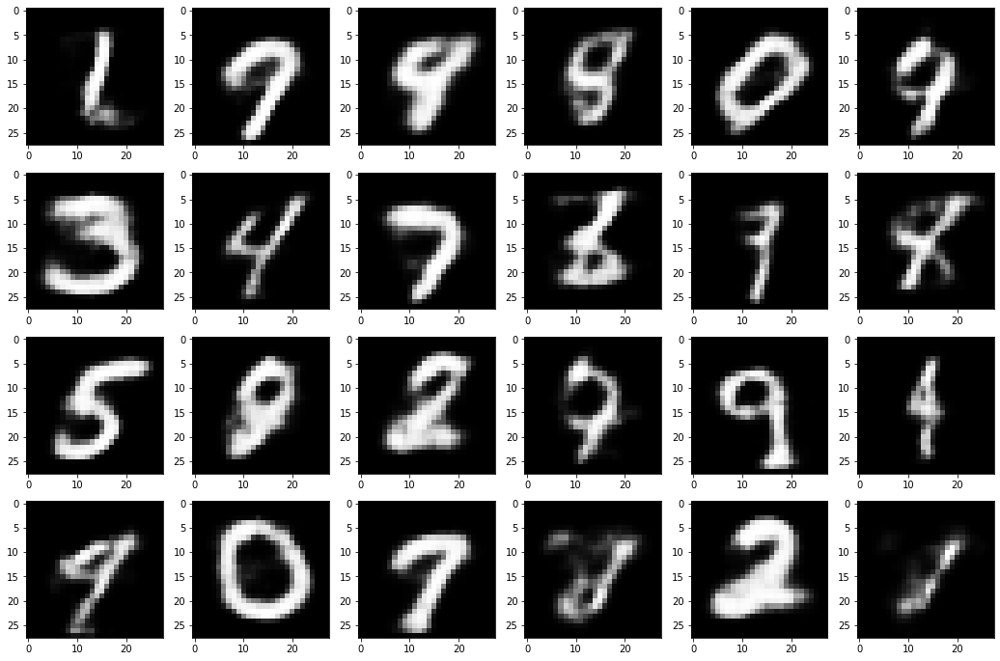

examples of generated images using average variables after 35 epochs


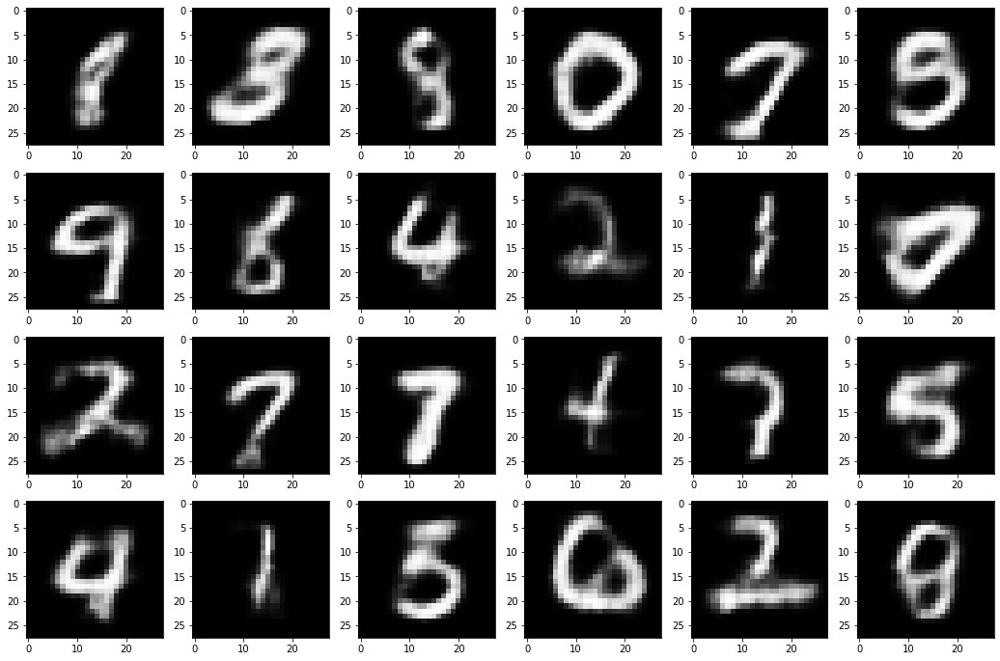

Epoch: 036: Enc Loss: 0.799, Dec Loss: 0.134, Disc Loss:0.688, IS: 2.623, IS_avr: 2.521
examples of generated images after 36 epochs


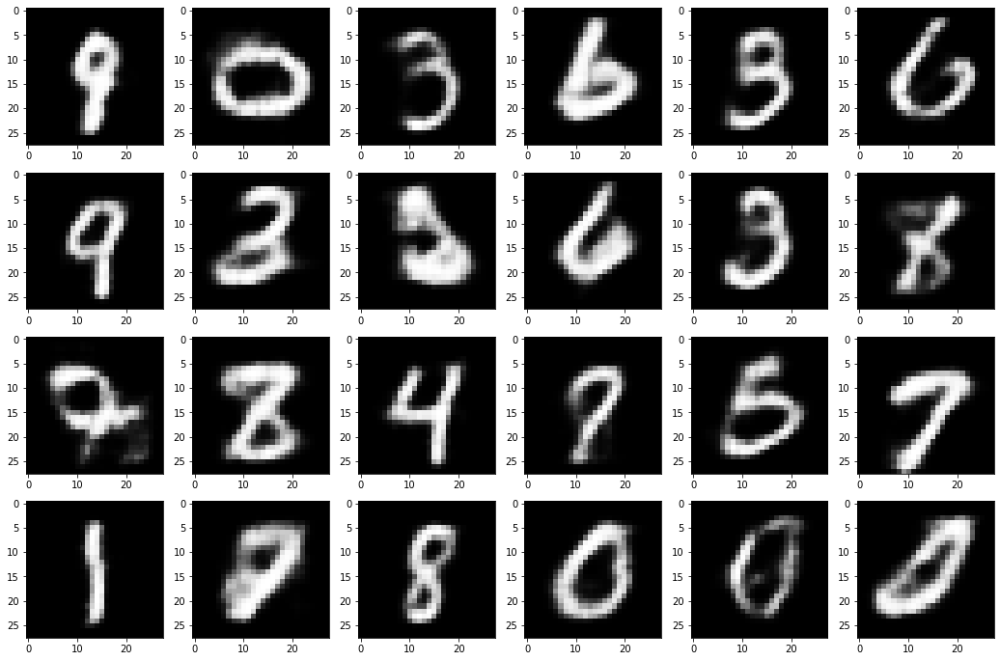

examples of generated images using average variables after 36 epochs


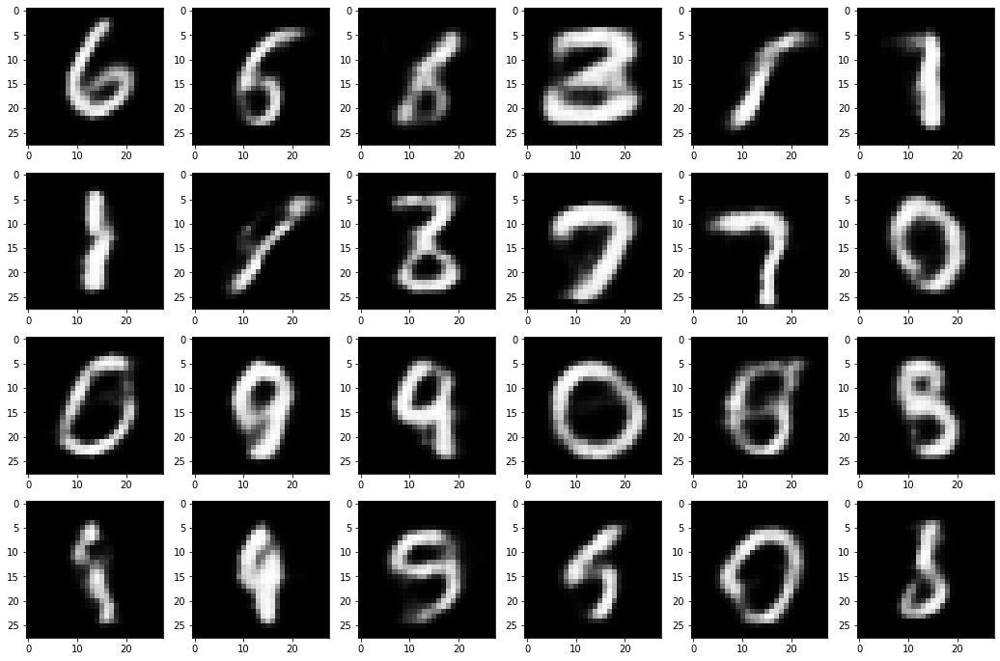

Epoch: 037: Enc Loss: 0.800, Dec Loss: 0.134, Disc Loss:0.688, IS: 2.594, IS_avr: 2.559
examples of generated images after 37 epochs


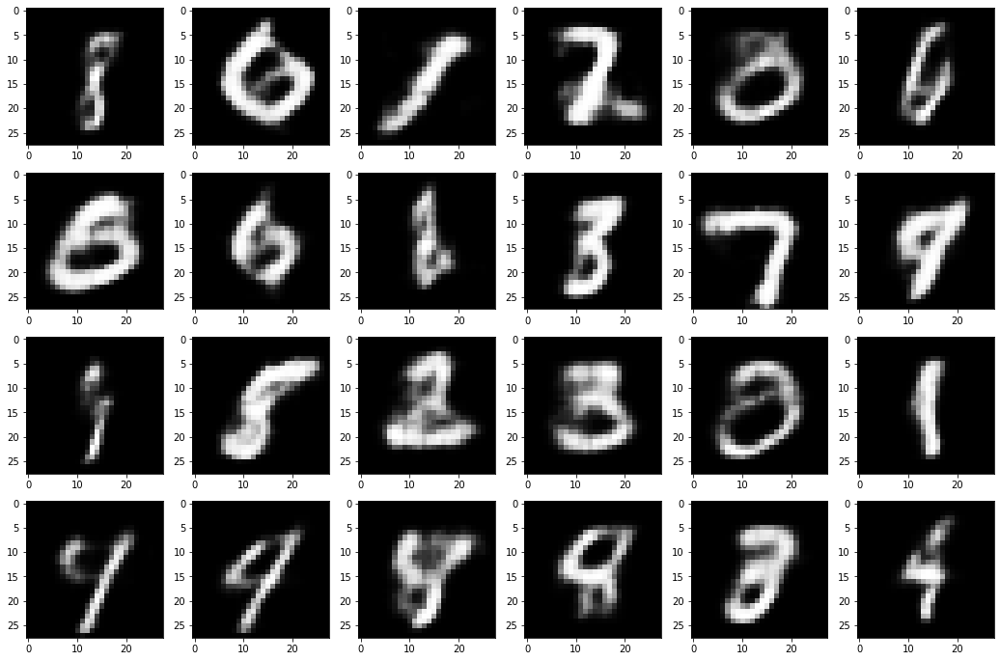

examples of generated images using average variables after 37 epochs


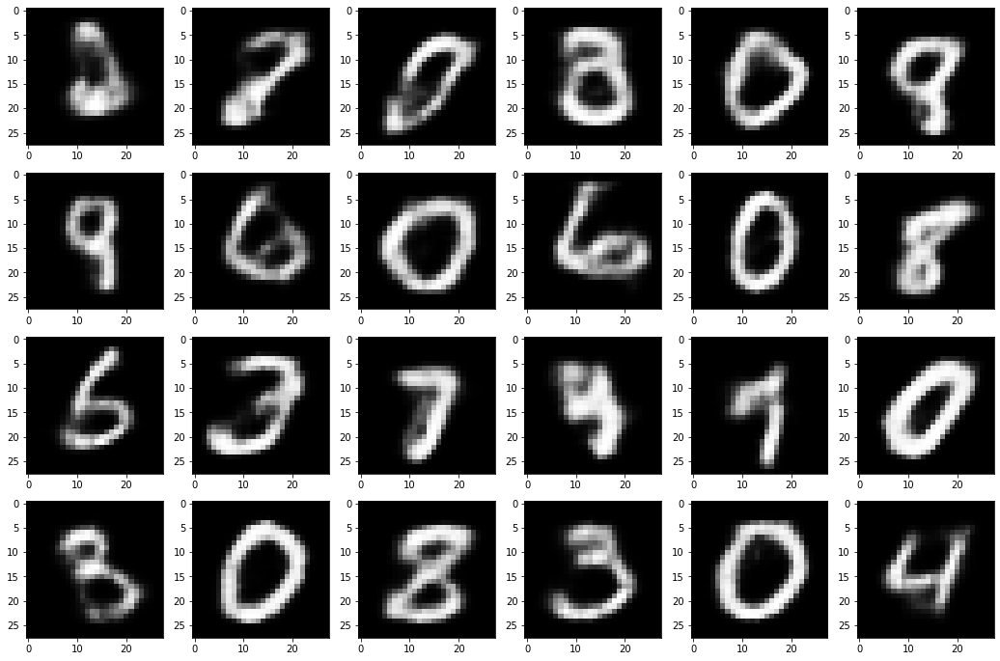

Epoch: 038: Enc Loss: 0.799, Dec Loss: 0.134, Disc Loss:0.688, IS: 2.645, IS_avr: 2.516
examples of generated images after 38 epochs


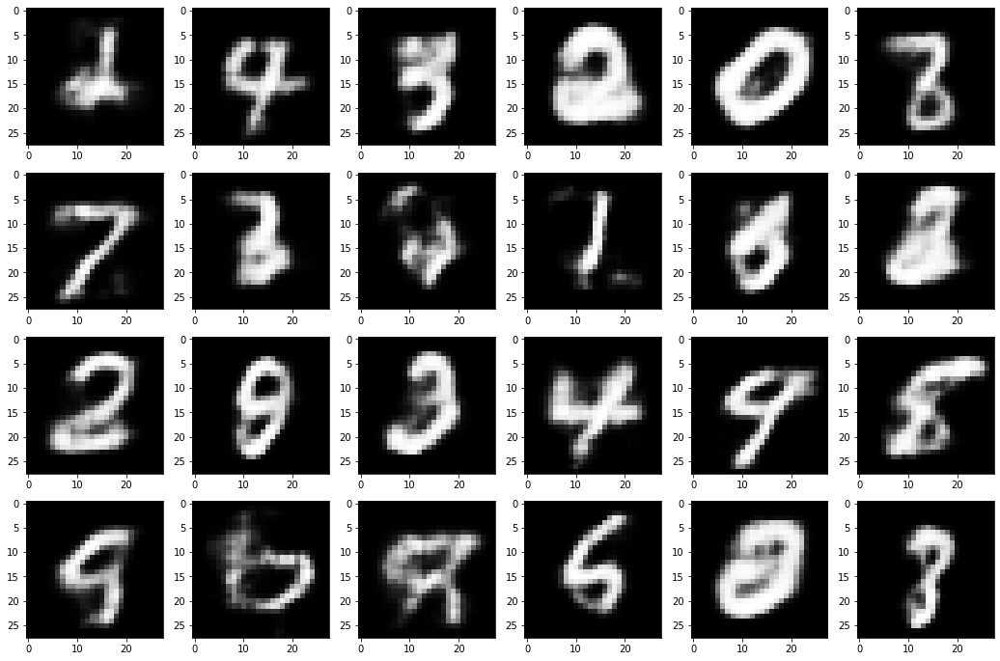

examples of generated images using average variables after 38 epochs


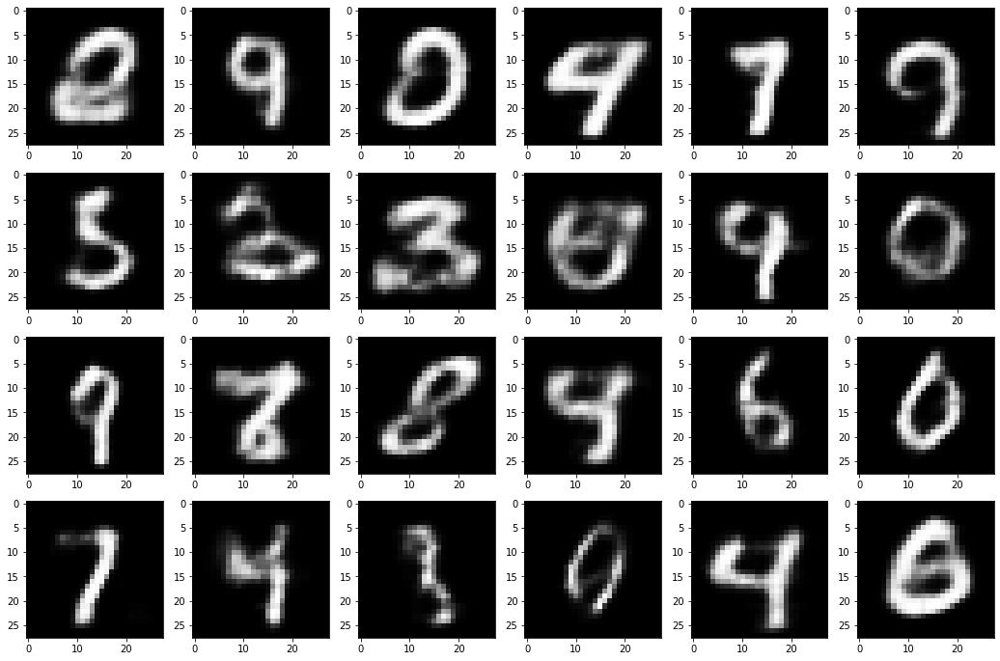

Epoch: 039: Enc Loss: 0.799, Dec Loss: 0.134, Disc Loss:0.688, IS: 2.641, IS_avr: 2.491
examples of generated images after 39 epochs


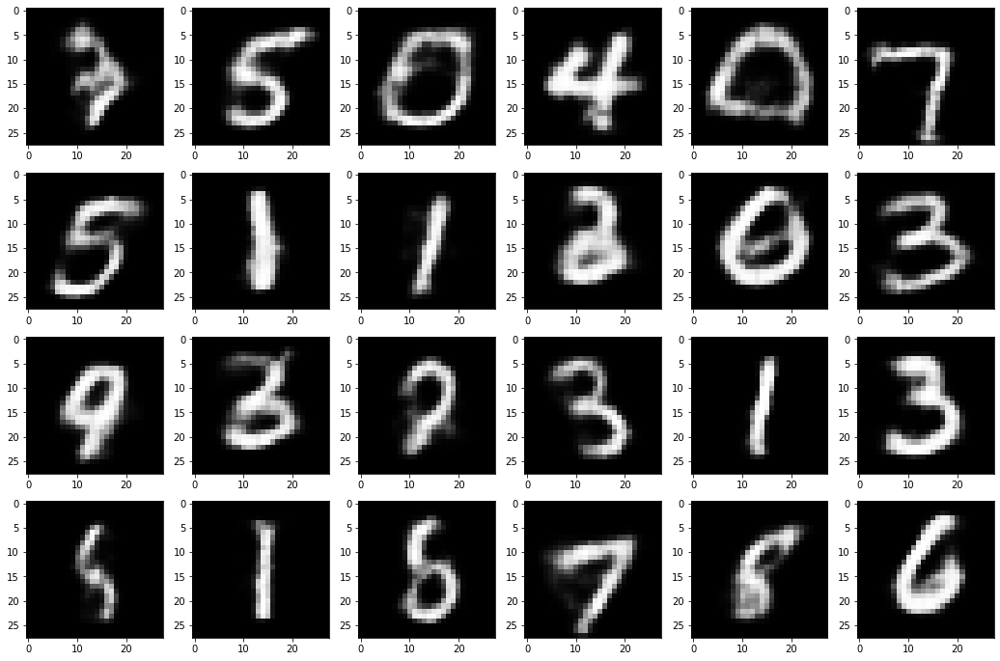

examples of generated images using average variables after 39 epochs


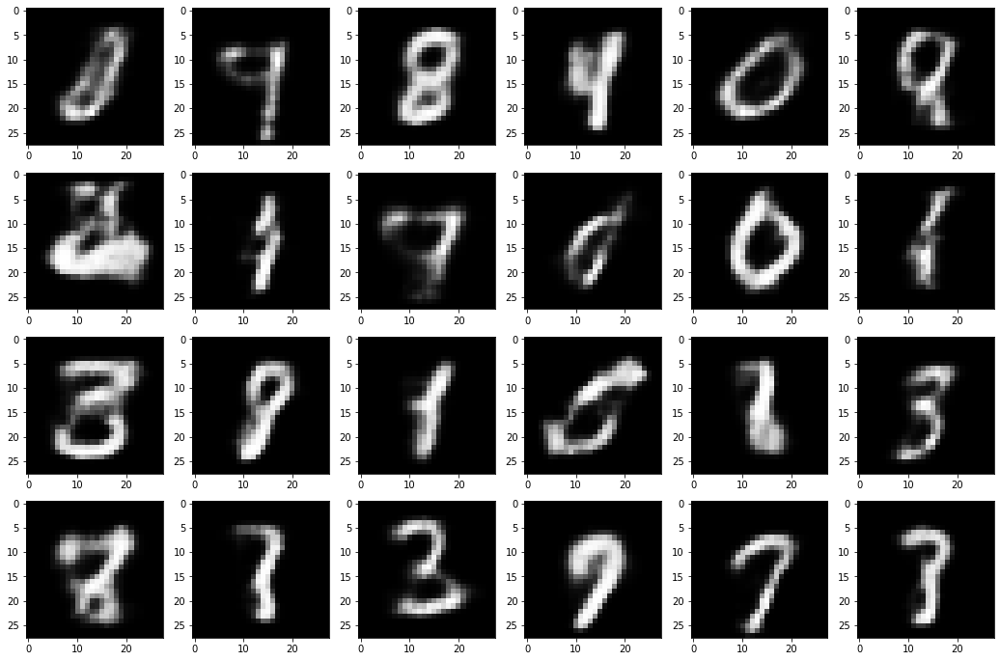

Epoch: 040: Enc Loss: 0.799, Dec Loss: 0.133, Disc Loss:0.689, IS: 2.509, IS_avr: 2.552
examples of generated images after 40 epochs


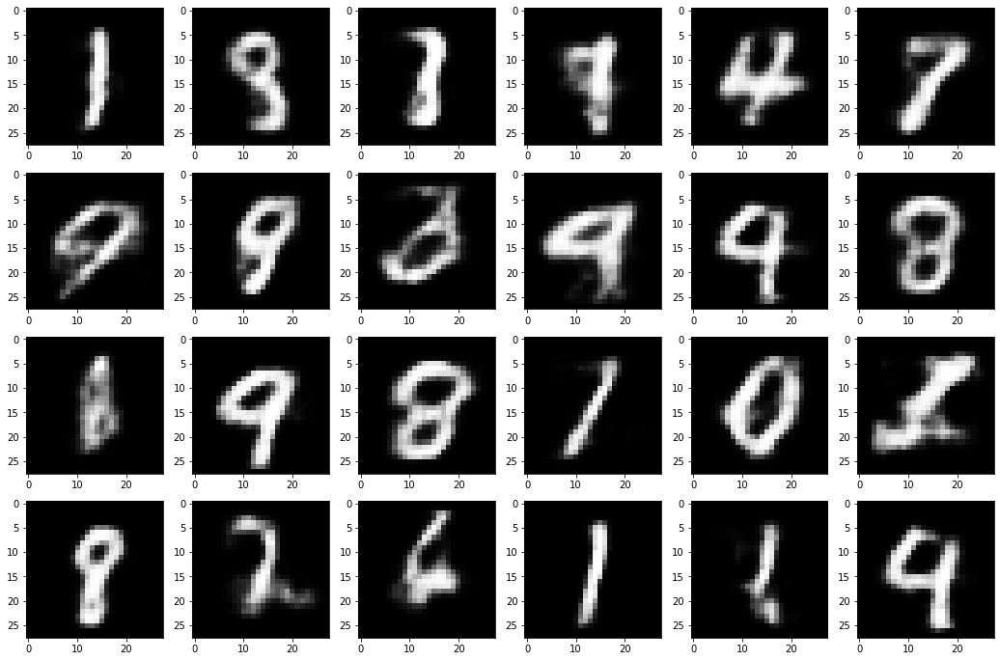

examples of generated images using average variables after 40 epochs


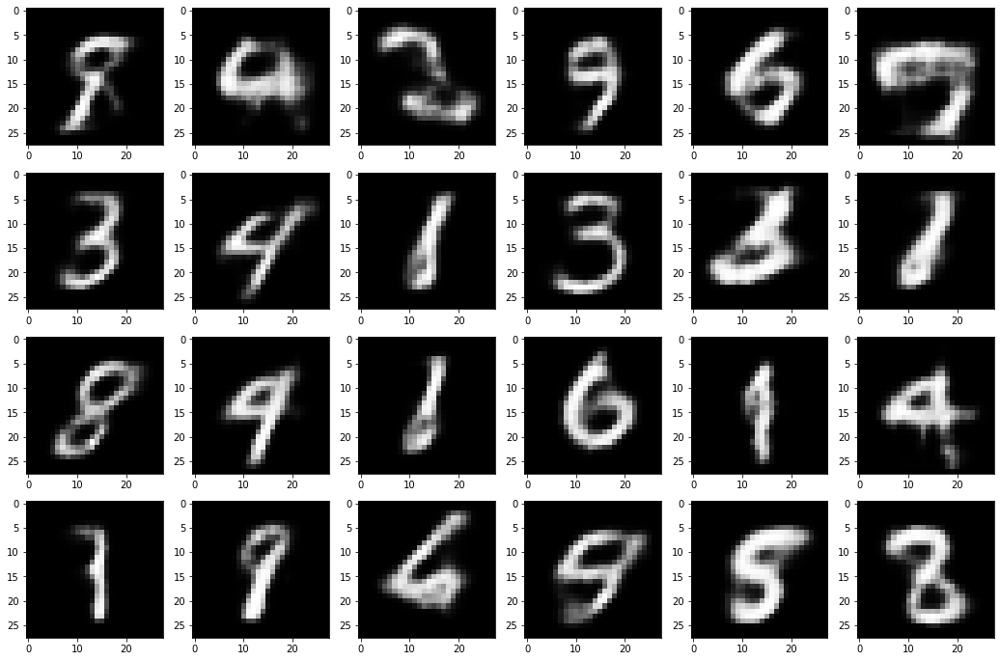

Epoch: 041: Enc Loss: 0.799, Dec Loss: 0.132, Disc Loss:0.688, IS: 2.608, IS_avr: 2.507
examples of generated images after 41 epochs


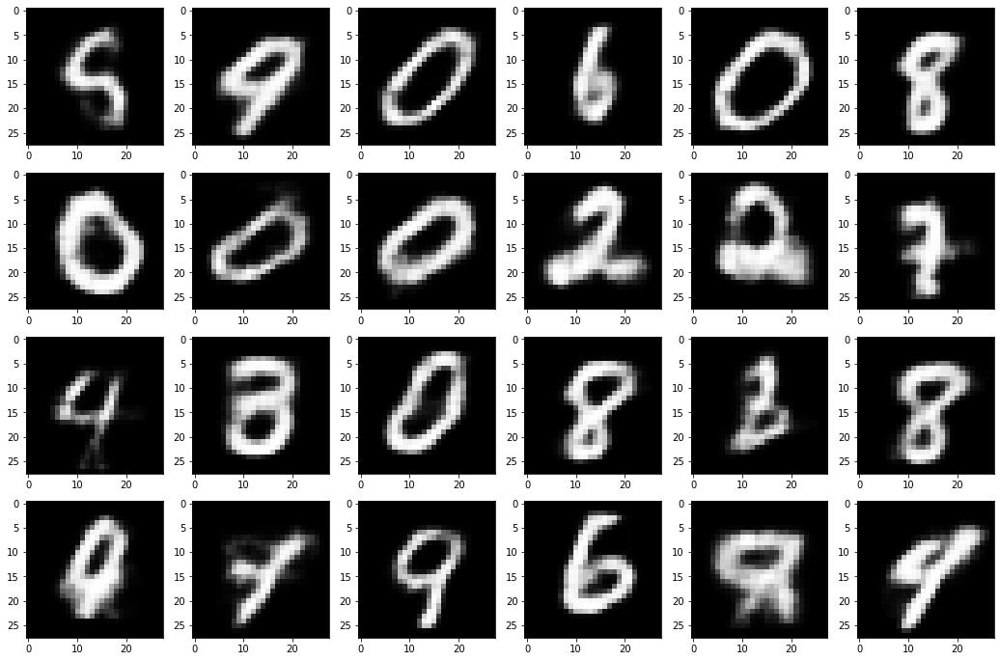

examples of generated images using average variables after 41 epochs


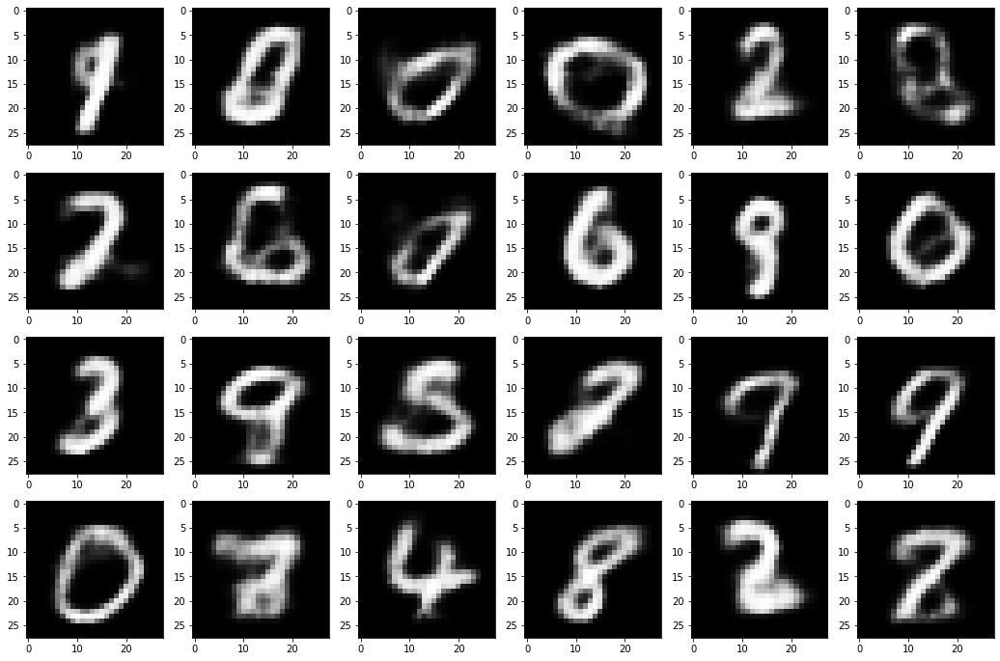

Epoch: 042: Enc Loss: 0.799, Dec Loss: 0.132, Disc Loss:0.688, IS: 2.580, IS_avr: 2.570
examples of generated images after 42 epochs


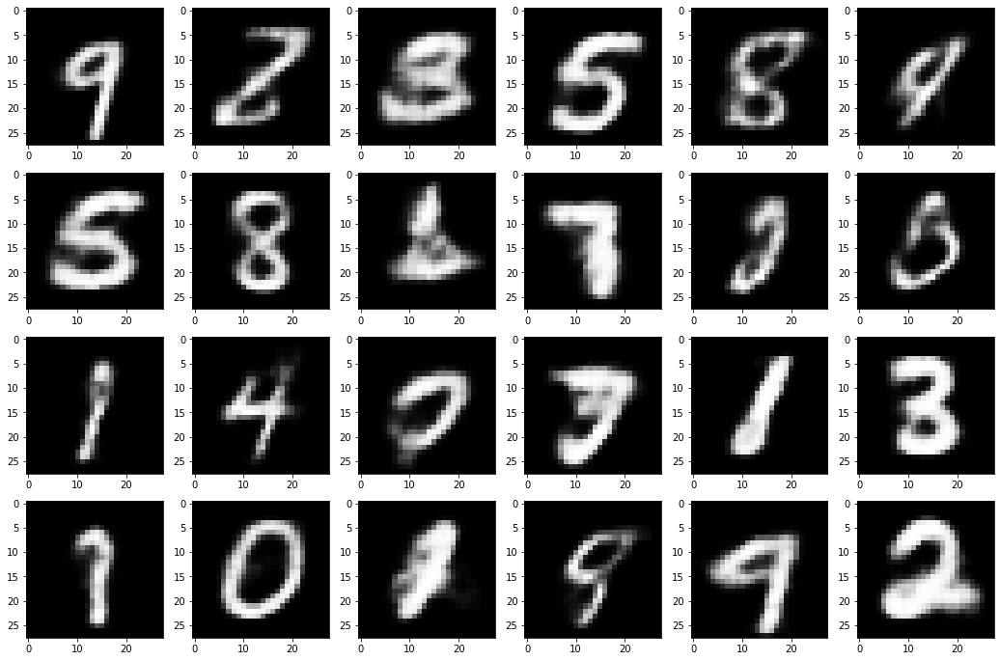

examples of generated images using average variables after 42 epochs


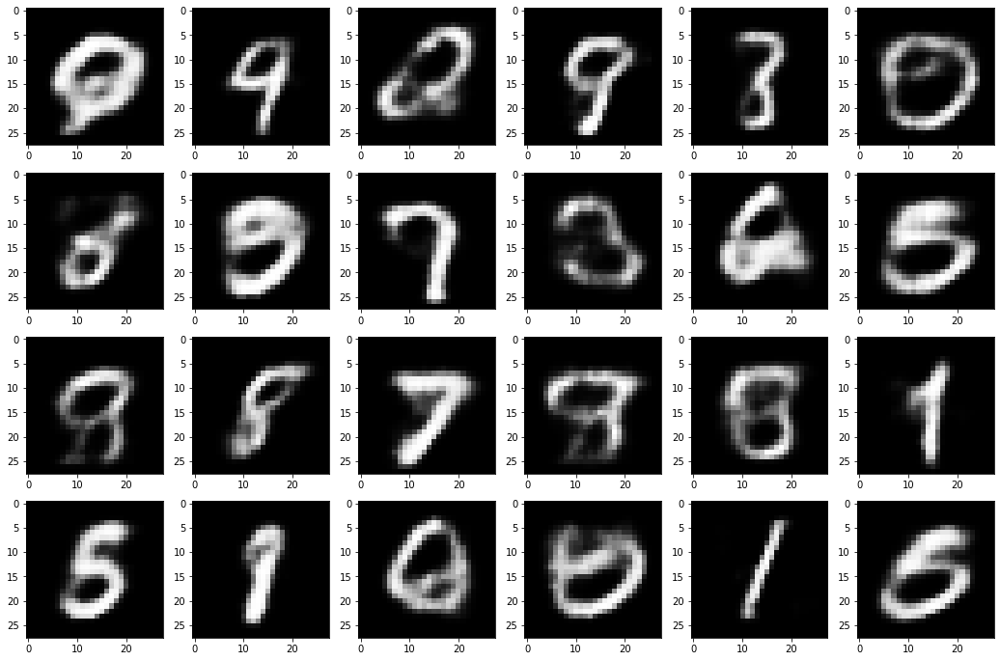

Epoch: 043: Enc Loss: 0.799, Dec Loss: 0.132, Disc Loss:0.688, IS: 2.634, IS_avr: 2.572
examples of generated images after 43 epochs


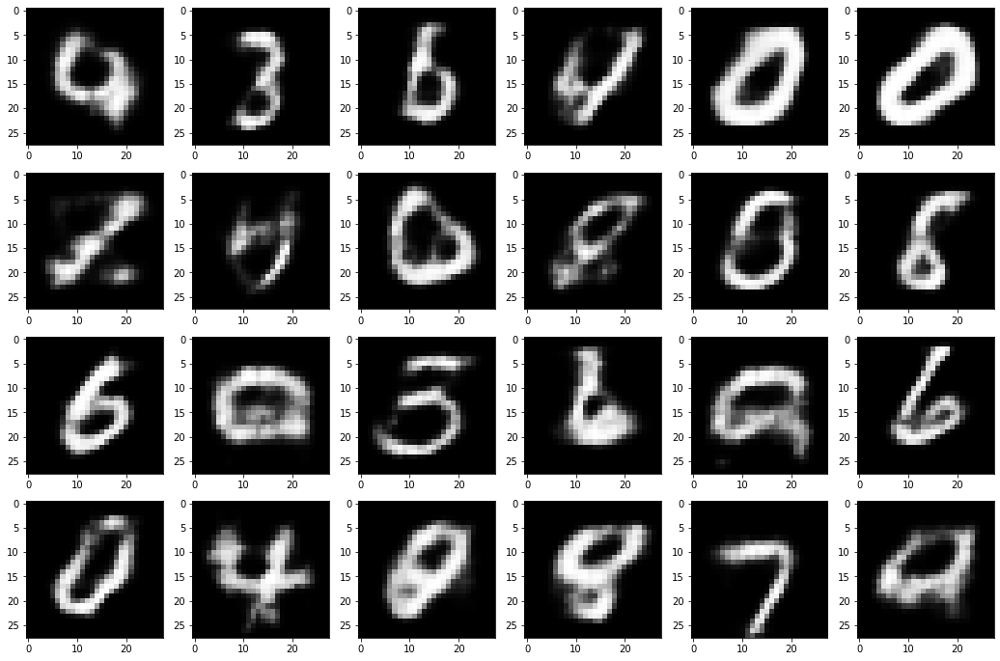

examples of generated images using average variables after 43 epochs


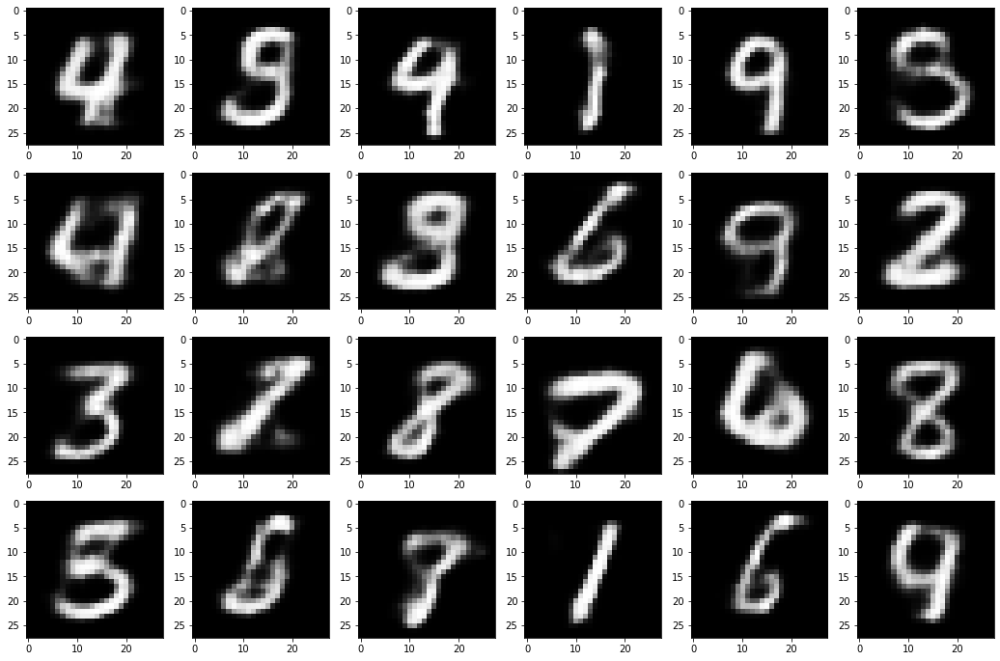

Epoch: 044: Enc Loss: 0.799, Dec Loss: 0.132, Disc Loss:0.689, IS: 2.589, IS_avr: 2.439
examples of generated images after 44 epochs


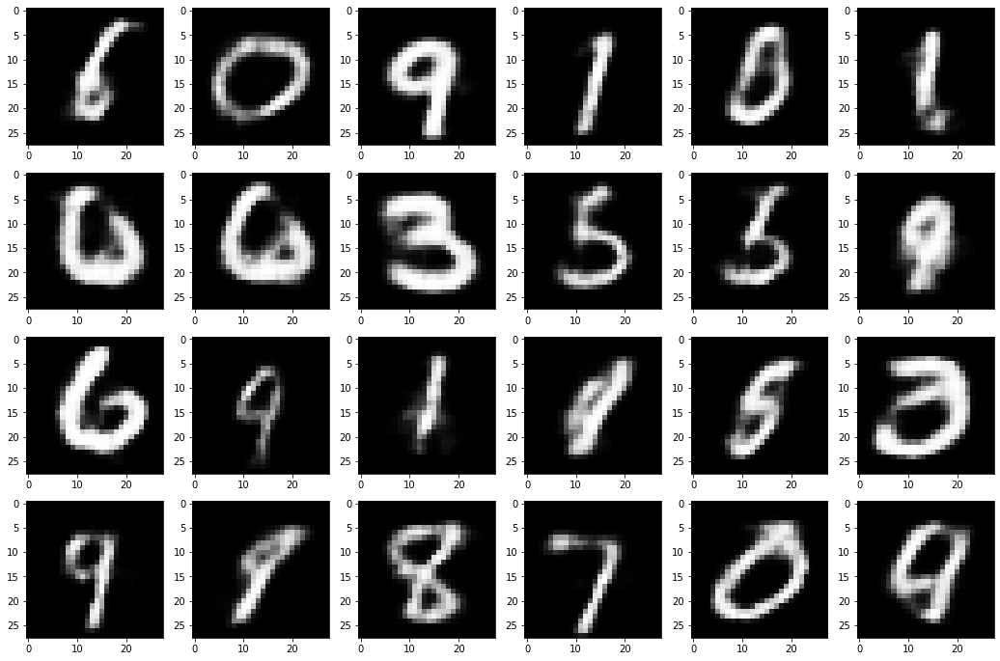

examples of generated images using average variables after 44 epochs


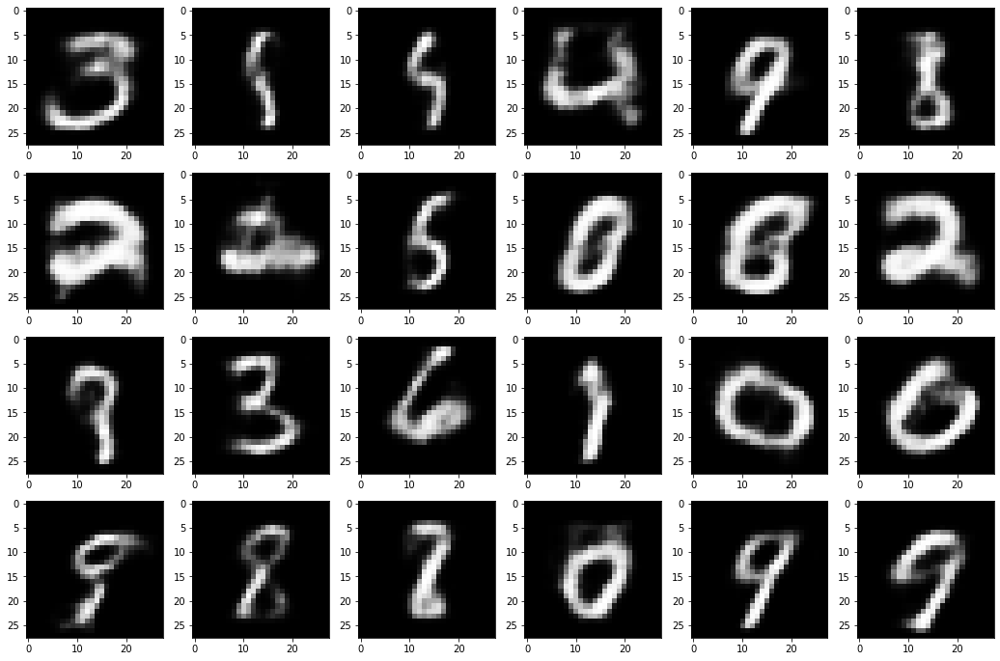

Epoch: 045: Enc Loss: 0.799, Dec Loss: 0.132, Disc Loss:0.688, IS: 2.518, IS_avr: 2.579
examples of generated images after 45 epochs


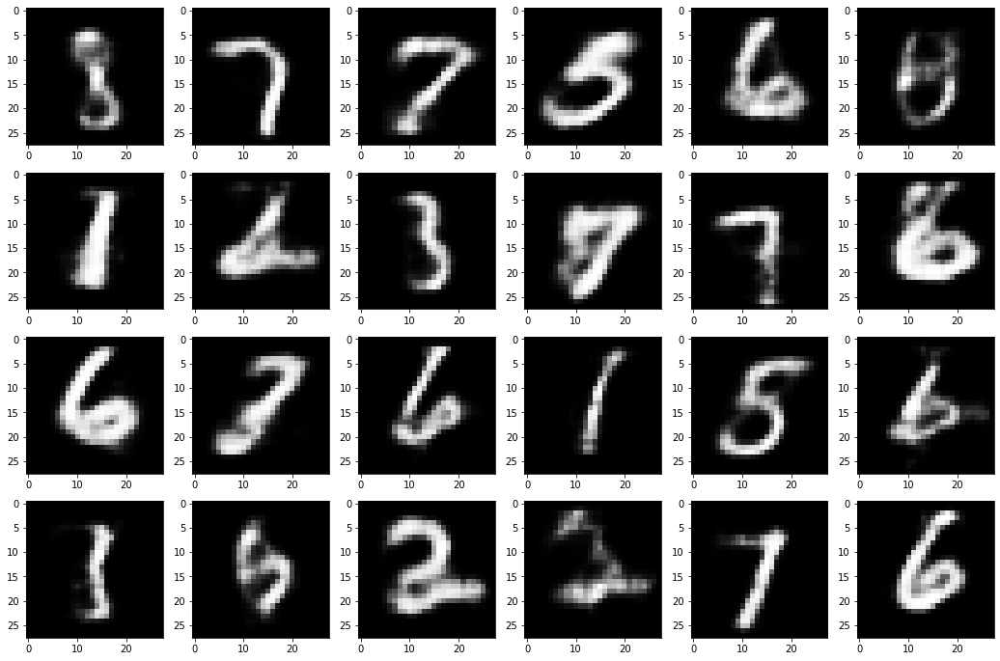

examples of generated images using average variables after 45 epochs


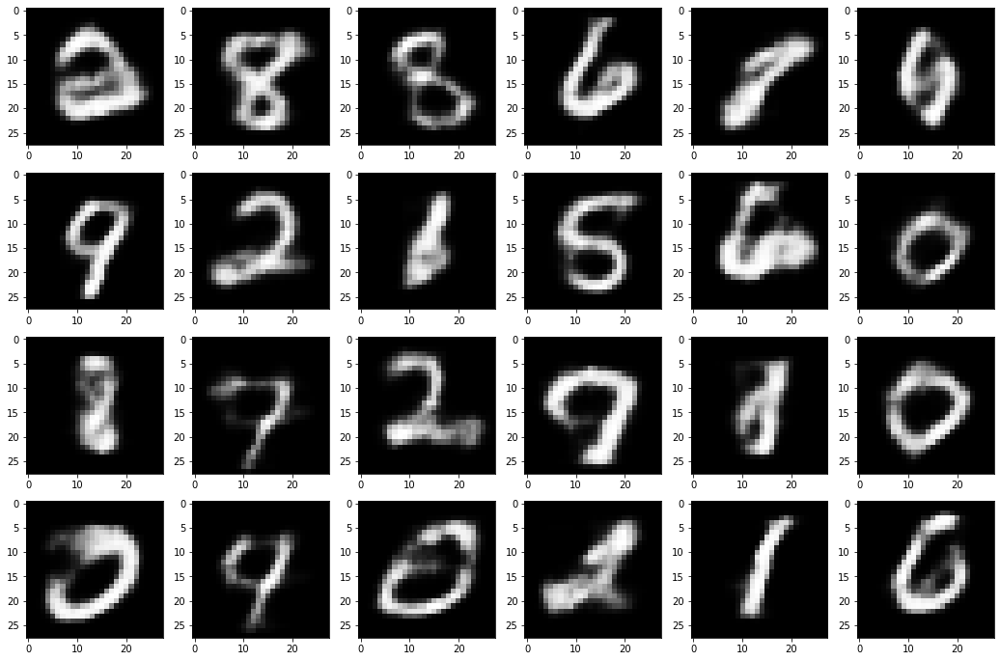

Epoch: 046: Enc Loss: 0.799, Dec Loss: 0.131, Disc Loss:0.688, IS: 2.593, IS_avr: 2.568
examples of generated images after 46 epochs


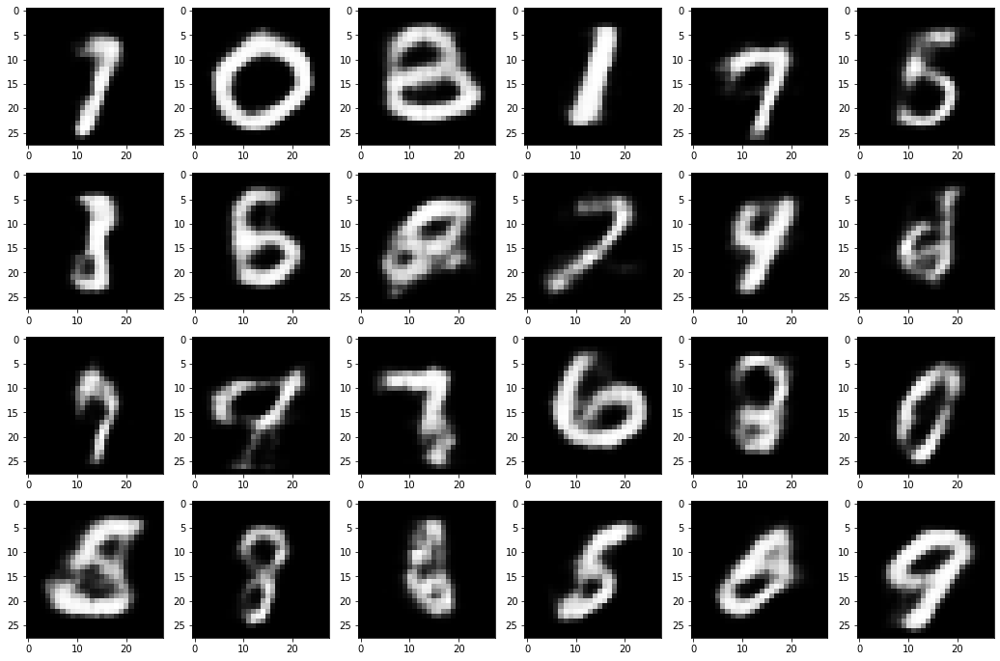

examples of generated images using average variables after 46 epochs


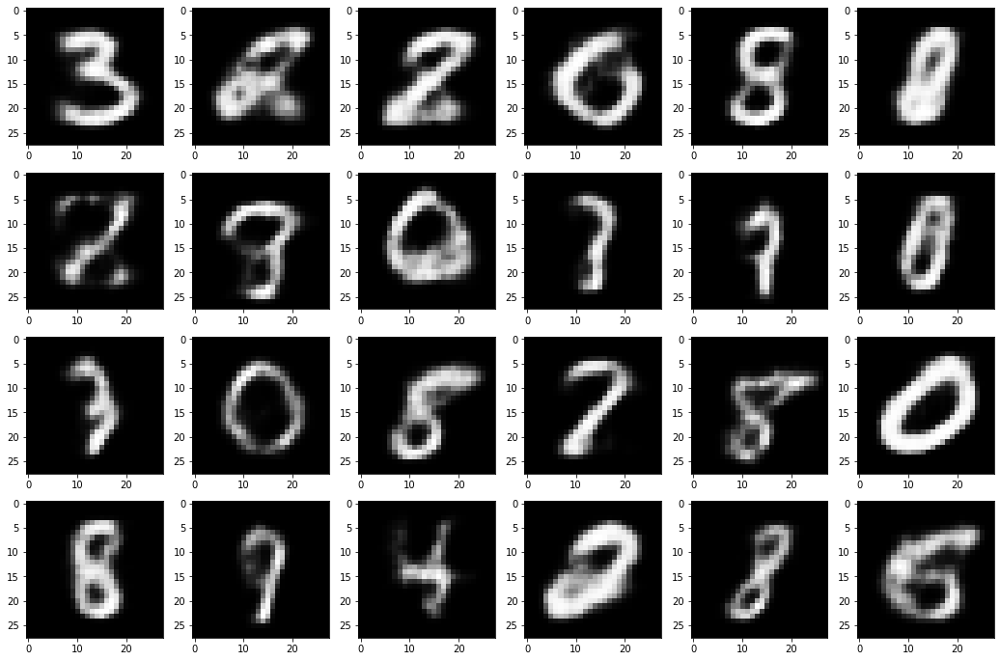

Epoch: 047: Enc Loss: 0.799, Dec Loss: 0.131, Disc Loss:0.688, IS: 2.523, IS_avr: 2.581
examples of generated images after 47 epochs


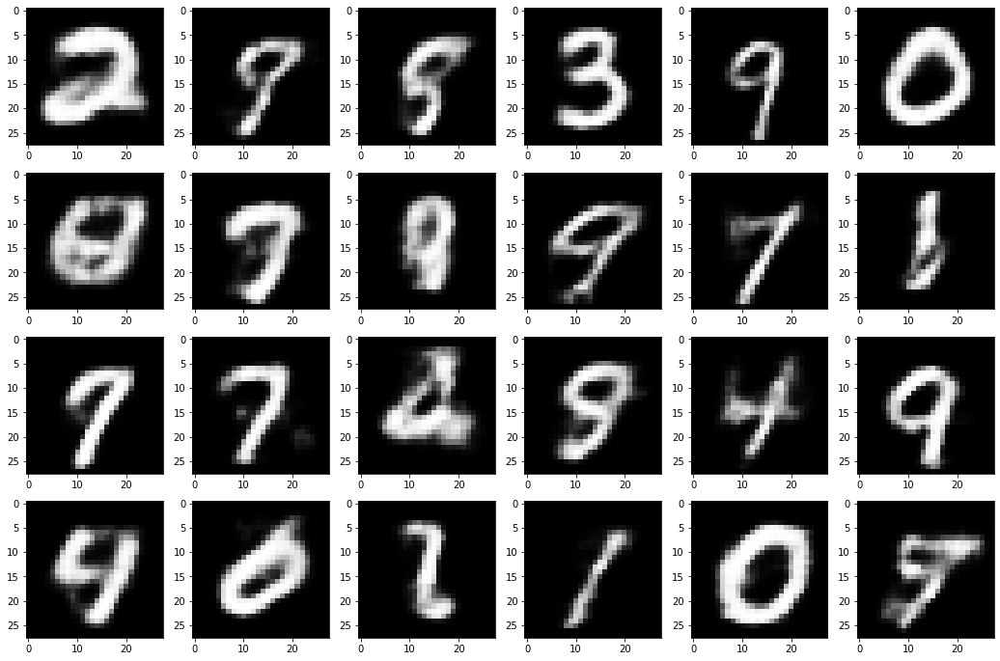

examples of generated images using average variables after 47 epochs


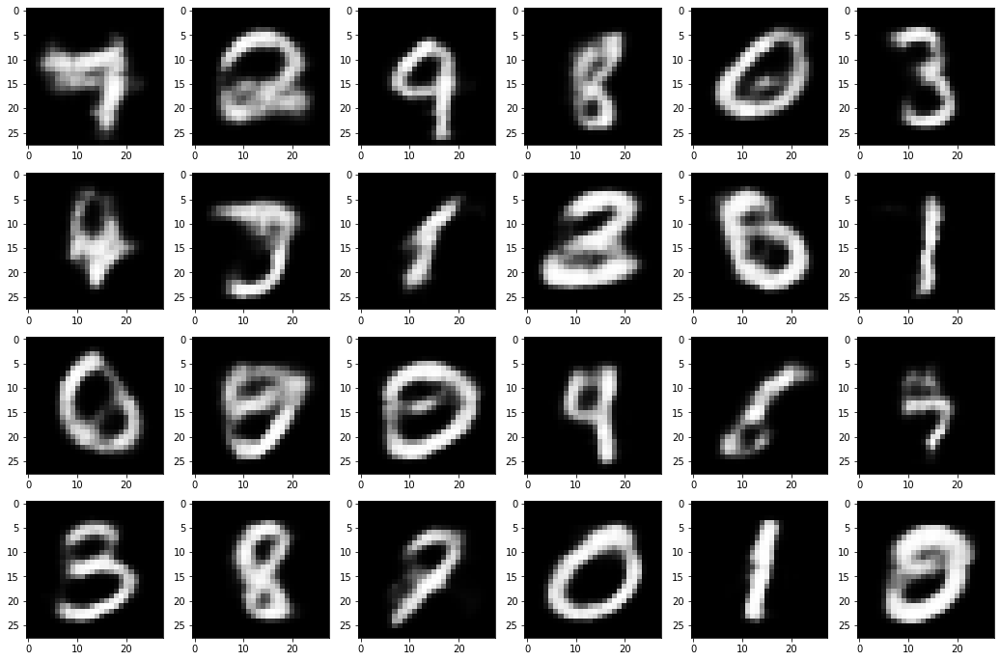

Epoch: 048: Enc Loss: 0.799, Dec Loss: 0.131, Disc Loss:0.688, IS: 2.528, IS_avr: 2.574
examples of generated images after 48 epochs


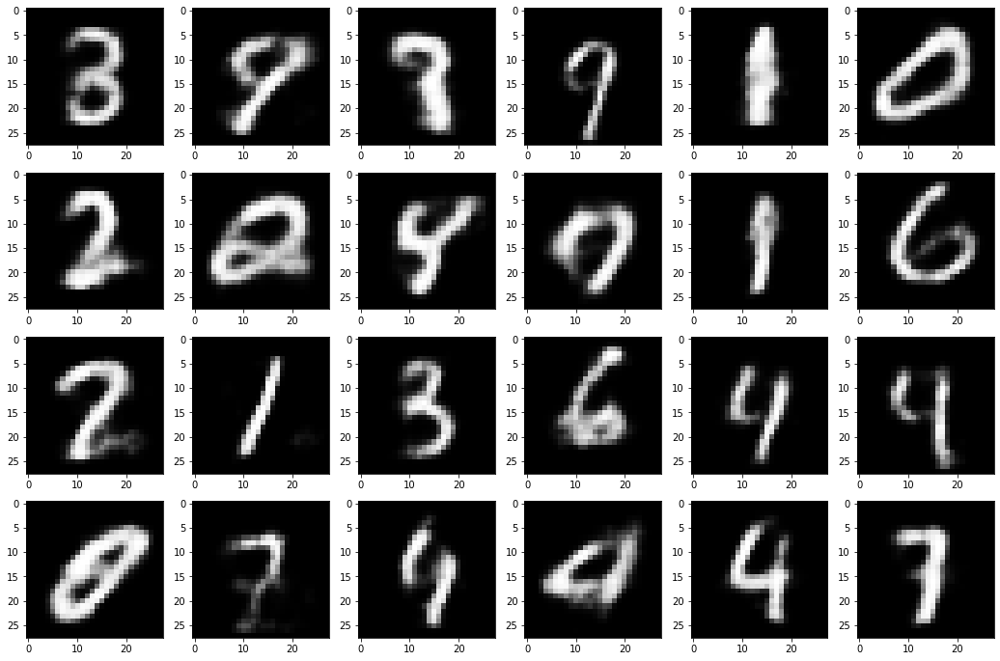

examples of generated images using average variables after 48 epochs


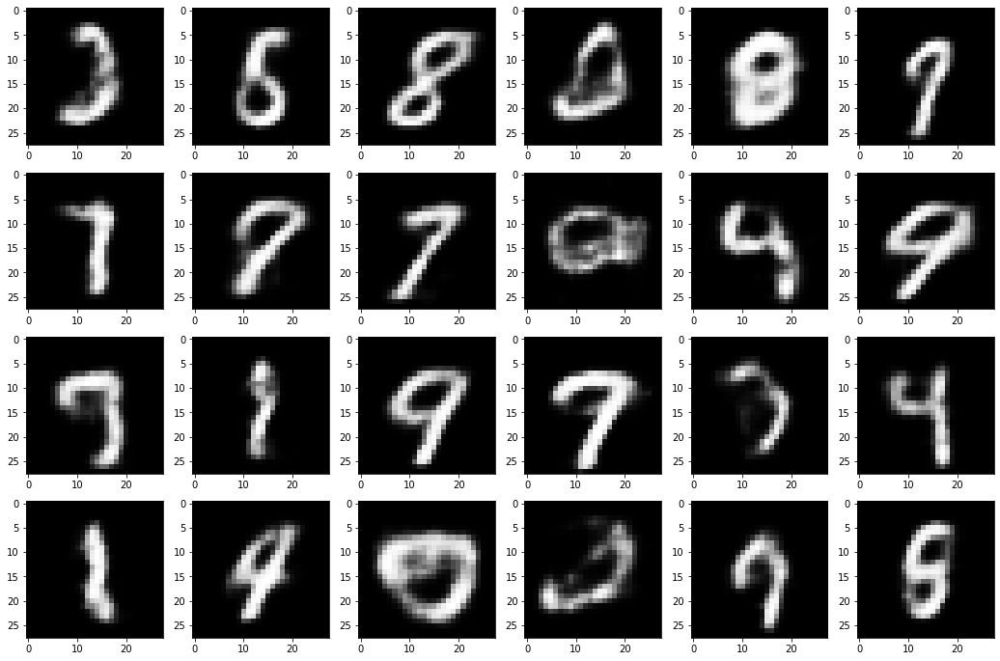

Epoch: 049: Enc Loss: 0.798, Dec Loss: 0.131, Disc Loss:0.688, IS: 2.557, IS_avr: 2.532
examples of generated images after 49 epochs


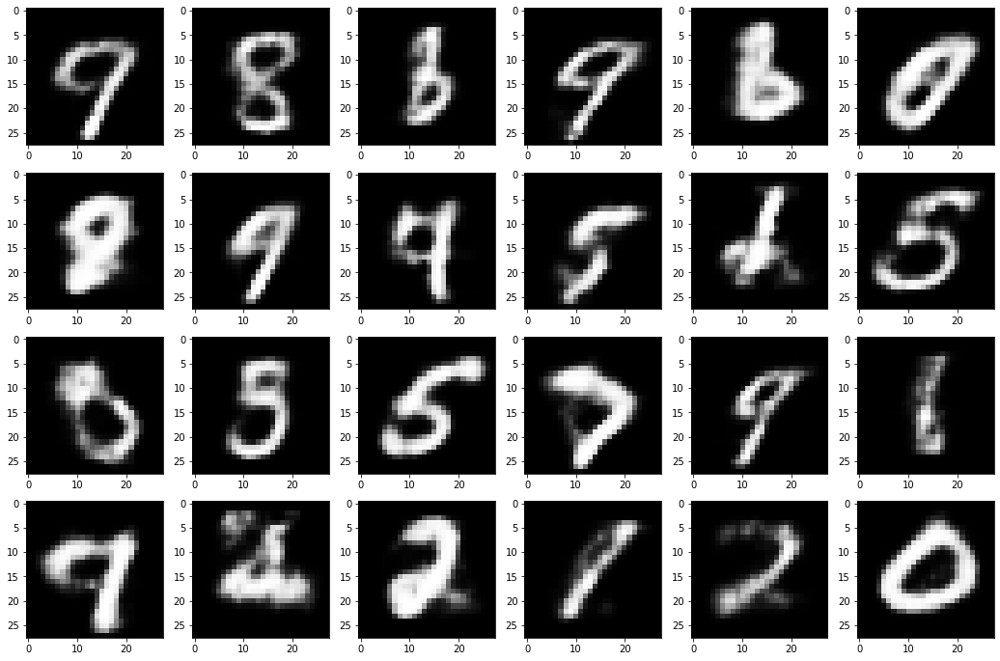

examples of generated images using average variables after 49 epochs


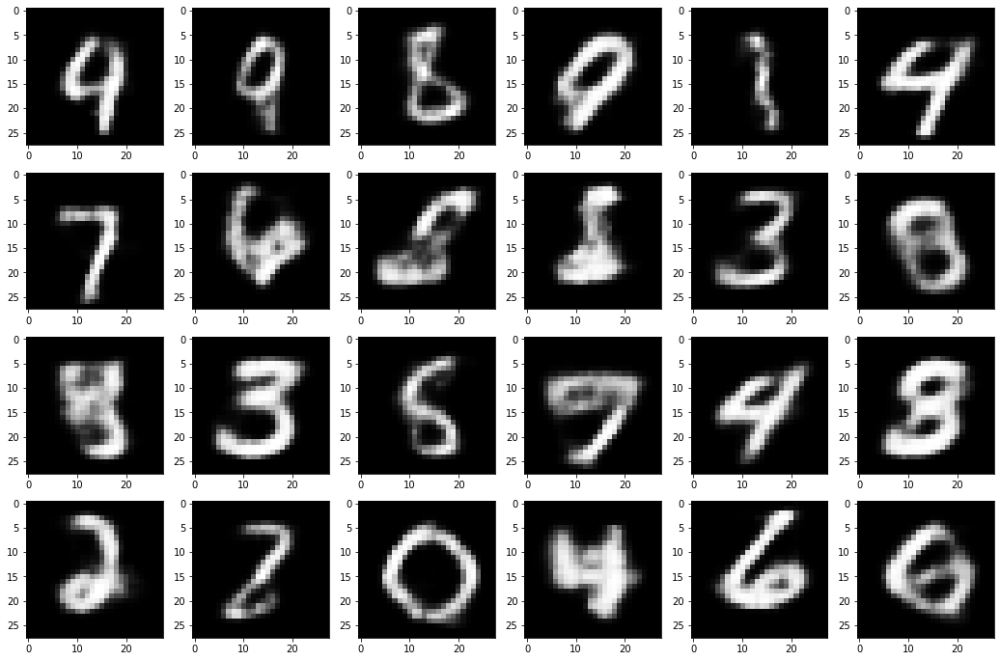

Epoch: 050: Enc Loss: 0.799, Dec Loss: 0.130, Disc Loss:0.688, IS: 2.515, IS_avr: 2.573
examples of generated images after 50 epochs


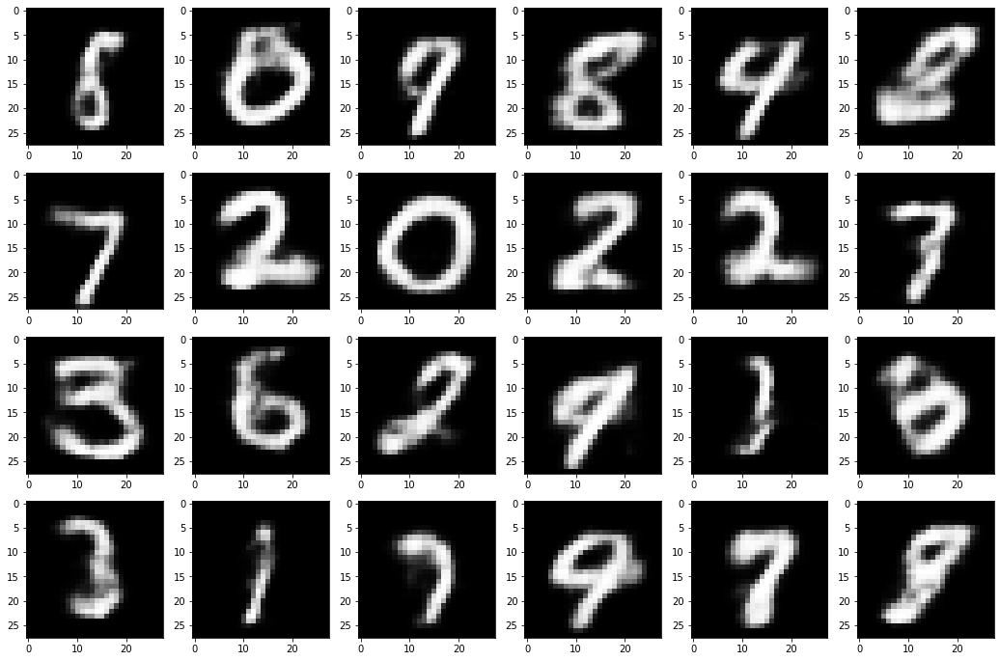

examples of generated images using average variables after 50 epochs


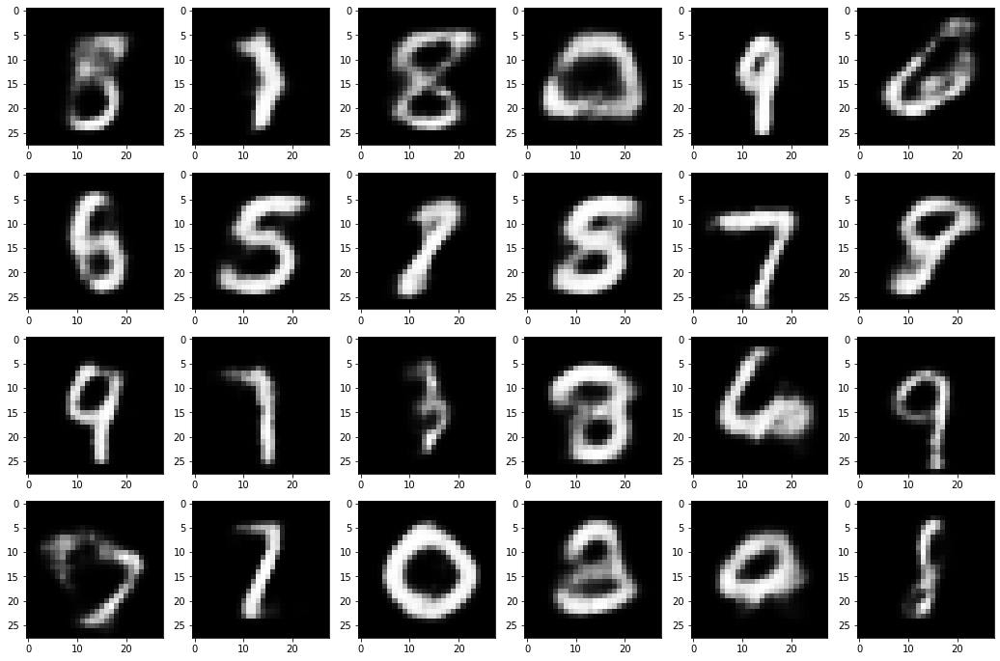

1814.546113


In [ ]:
aae.use_averaging = True
t0 = time.clock()
aae.train(epochs=25)
print(time.clock()-t0)

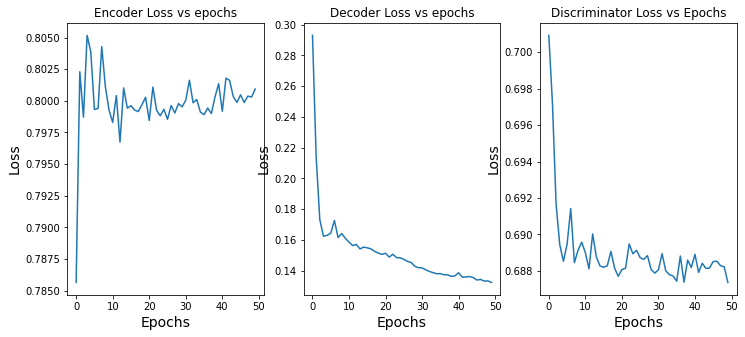

In [ ]:
aae.draw_losses_per_epoch_graphic()

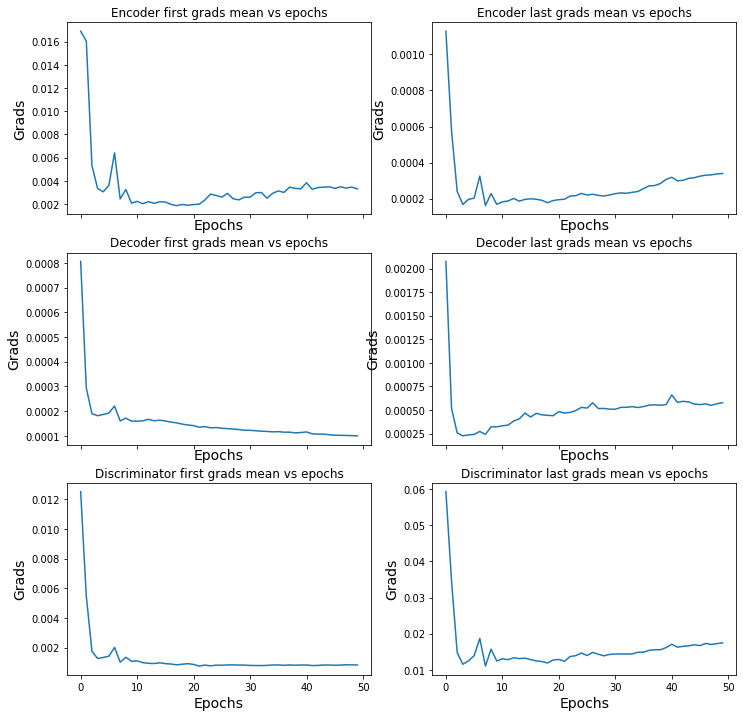

In [ ]:
aae.draw_grads_per_epoch_graphic()

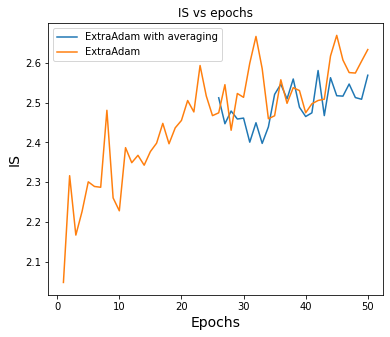

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(6, 5))  
axes.set_xlabel("Epochs", fontsize=14)
axes.set_ylabel("IS", fontsize=14)
axes.set_title('IS vs epochs')
x1 = [x for x in (np.arange(25)+26)]
axes.plot(x1, aae.IS_for_avr_per_epoch, label = 'ExtraAdam with averaging')
x2 = [x for x in (np.arange(50)+1)]
axes.plot(x2, aae.IS_per_epoch, label = 'ExtraAdam')
axes.legend()
plt.show()

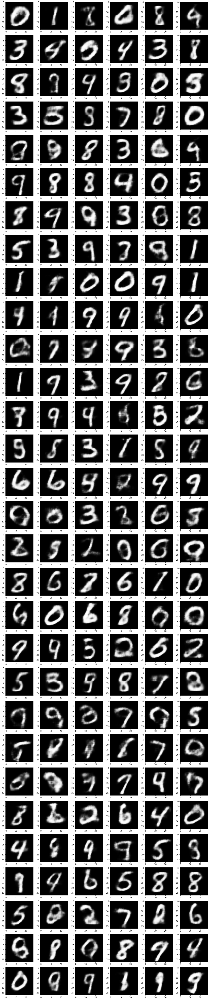

In [ ]:
aae.draw_generated_images(rows=30, cols=6)

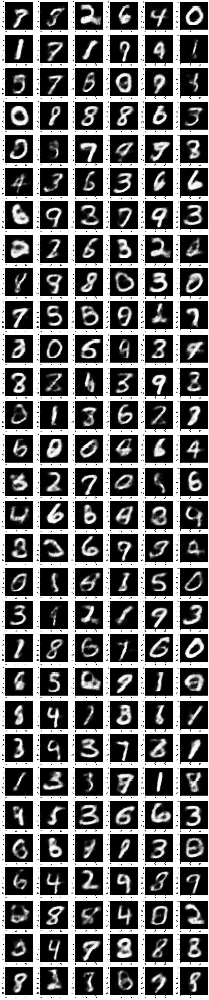

In [ ]:
aae.draw_generated_images(rows=30, cols=6, is_from_gen_avr=True)